In [1]:
#!/usr/bin/env python
# coding: utf-8
#
# Author:   Kazuto Nakashima
# URL:      http://kazuto1011.github.io
# Created:  2017-05-26

from collections import Sequence

import numpy as np
import torch
import torch.nn as nn
from torch.nn import functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt

class _BaseWrapper(object):
    def __init__(self, model):
        super(_BaseWrapper, self).__init__()
        self.device = next(model.parameters()).device
        self.model = model
        self.handlers = []  # a set of hook function handlers

    def _encode_one_hot(self, ids):
        one_hot = torch.zeros_like(self.logits).to(self.device)
        one_hot.scatter_(1, ids, 1.0)
        return one_hot

    def forward(self, image):
        self.image_shape = image.shape[2:]
        self.logits = self.model(image)
        self.probs = F.softmax(self.logits, dim=1)
        return self.probs.sort(dim=1, descending=True)  # ordered results

    def backward(self, ids):
        """
        Class-specific backpropagation
        """
        one_hot = self._encode_one_hot(ids)
        self.model.zero_grad()
        self.logits.backward(gradient=one_hot, retain_graph=True)

    def generate(self):
        raise NotImplementedError

    def remove_hook(self):
        """
        Remove all the forward/backward hook functions
        """
        for handle in self.handlers:
            handle.remove()


class BackPropagation(_BaseWrapper):
    def forward(self, image):
        self.image = image.requires_grad_()
        return super(BackPropagation, self).forward(self.image)

    def generate(self):
        gradient = self.image.grad.clone()
        self.image.grad.zero_()
        return gradient


class GuidedBackPropagation(BackPropagation):
    """
    "Striving for Simplicity: the All Convolutional Net"
    https://arxiv.org/pdf/1412.6806.pdf
    Look at Figure 1 on page 8.
    """

    def __init__(self, model):
        super(GuidedBackPropagation, self).__init__(model)

        def backward_hook(module, grad_in, grad_out):
            # Cut off negative gradients
            if isinstance(module, nn.ReLU):
                return (F.relu(grad_in[0]),)

        for module in self.model.named_modules():
            self.handlers.append(module[1].register_backward_hook(backward_hook))


class Deconvnet(BackPropagation):
    """
    "Striving for Simplicity: the All Convolutional Net"
    https://arxiv.org/pdf/1412.6806.pdf
    Look at Figure 1 on page 8.
    """

    def __init__(self, model):
        super(Deconvnet, self).__init__(model)

        def backward_hook(module, grad_in, grad_out):
            # Cut off negative gradients and ignore ReLU
            if isinstance(module, nn.ReLU):
                return (F.relu(grad_out[0]),)

        for module in self.model.named_modules():
            self.handlers.append(module[1].register_backward_hook(backward_hook))


class GradCAM(_BaseWrapper):
    """
    "Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization"
    https://arxiv.org/pdf/1610.02391.pdf
    Look at Figure 2 on page 4
    """

    def __init__(self, model, candidate_layers=None):
        super(GradCAM, self).__init__(model)
        self.fmap_pool = {}
        self.grad_pool = {}
        self.candidate_layers = candidate_layers  # list

        def save_fmaps(key):
            def forward_hook(module, input, output):
                if key == 'module.sc1' or key == 'module.sc2':
                    new_key = [key+'_1',key+'_2',key+'_3']
                    self.fmap_pool[new_key[0]] = output[0].detach()
                    self.fmap_pool[new_key[1]] = output[1].detach()
                    self.fmap_pool[new_key[2]] = output[2].detach()
                else:
                    self.fmap_pool[key] = output.detach()
                '''print(key)
                #print(torch.mean(torch.mean(output)-output[2]))
                print(output[0].shape)
                print(output[1].shape)
                print(output[2].shape)'''

            return forward_hook

        def save_grads(key):
            def backward_hook(module, grad_in, grad_out):
                self.grad_pool[key] = grad_out[0].detach()
                '''print(key)
                print(grad_out[0].shape)
                print(grad_out[0])'''

            return backward_hook

        # If any candidates are not specified, the hook is registered to all the layers.
        for name, module in self.model.named_modules():
            if self.candidate_layers is None or name in self.candidate_layers:
                self.handlers.append(module.register_forward_hook(save_fmaps(name)))
                self.handlers.append(module.register_backward_hook(save_grads(name)))

    def _find(self, pool, target_layer):
        if target_layer in pool.keys():
            return pool[target_layer]
        else:
            raise ValueError("Invalid layer name: {}".format(target_layer))

    def generate(self, target_layer):
        if target_layer == 'module.sc1' or target_layer == 'module.sc2':
            fmaps1 = self._find(self.fmap_pool, target_layer+'_1')
            fmaps2 = self._find(self.fmap_pool, target_layer+'_2')
            fmaps3 = self._find(self.fmap_pool, target_layer+'_3')
            
            grads = self._find(self.grad_pool, target_layer)
            weights = F.adaptive_avg_pool2d(grads, 1)

            gcam = torch.mul(fmaps1, weights).sum(dim=1, keepdim=True)
            gcam = F.relu(gcam)
            gcam = F.interpolate(
                gcam, self.image_shape, mode="bilinear", align_corners=False
            )

            B, C, H, W = gcam.shape
            gcam = gcam.view(B, -1)
            gcam -= gcam.min(dim=1, keepdim=True)[0]
            gcam /= gcam.max(dim=1, keepdim=True)[0]
            gcam1 = gcam.view(B, C, H, W)
            
            gcam = torch.mul(fmaps2, weights).sum(dim=1, keepdim=True)
            gcam = F.relu(gcam)
            gcam = F.interpolate(
                gcam, self.image_shape, mode="bilinear", align_corners=False
            )

            B, C, H, W = gcam.shape
            gcam = gcam.view(B, -1)
            gcam -= gcam.min(dim=1, keepdim=True)[0]
            gcam /= gcam.max(dim=1, keepdim=True)[0]
            gcam2 = gcam.view(B, C, H, W)
            
            gcam = torch.mul(fmaps3, weights).sum(dim=1, keepdim=True)
            gcam = F.relu(gcam)
            gcam = F.interpolate(
                gcam, self.image_shape, mode="bilinear", align_corners=False
            )

            B, C, H, W = gcam.shape
            gcam = gcam.view(B, -1)
            gcam -= gcam.min(dim=1, keepdim=True)[0]
            gcam /= gcam.max(dim=1, keepdim=True)[0]
            gcam3 = gcam.view(B, C, H, W)

            return [gcam1,gcam2,gcam3]
        else:
            fmaps = self._find(self.fmap_pool, target_layer)
            grads = self._find(self.grad_pool, target_layer)
            #print(fmaps.shape)
            weights = F.adaptive_avg_pool2d(grads, 1)

            gcam = torch.mul(fmaps, weights).sum(dim=1, keepdim=True)
            gcam = F.relu(gcam)
            gcam = F.interpolate(
                gcam, self.image_shape, mode="bilinear", align_corners=False
            )

            B, C, H, W = gcam.shape
            gcam = gcam.view(B, -1)
            gcam -= gcam.min(dim=1, keepdim=True)[0]
            gcam /= gcam.max(dim=1, keepdim=True)[0]
            gcam = gcam.view(B, C, H, W)

            return gcam


def occlusion_sensitivity(
    model, images, ids, mean=None, patch=35, stride=1, n_batches=128
):
    """
    "Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization"
    https://arxiv.org/pdf/1610.02391.pdf
    Look at Figure A5 on page 17
    Originally proposed in:
    "Visualizing and Understanding Convolutional Networks"
    https://arxiv.org/abs/1311.2901
    """

    torch.set_grad_enabled(False)
    model.eval()
    mean = mean if mean else 0
    patch_H, patch_W = patch if isinstance(patch, Sequence) else (patch, patch)
    pad_H, pad_W = patch_H // 2, patch_W // 2

    # Padded image
    images = F.pad(images, (pad_W, pad_W, pad_H, pad_H), value=mean)
    B, _, H, W = images.shape
    new_H = (H - patch_H) // stride + 1
    new_W = (W - patch_W) // stride + 1

    # Prepare sampling grids
    anchors = []
    grid_h = 0
    while grid_h <= H - patch_H:
        grid_w = 0
        while grid_w <= W - patch_W:
            grid_w += stride
            anchors.append((grid_h, grid_w))
        grid_h += stride

    # Baseline score without occlusion
    baseline = model(images).detach().gather(1, ids)

    # Compute per-pixel logits
    scoremaps = []
    for i in tqdm(range(0, len(anchors), n_batches), leave=False):
        batch_images = []
        batch_ids = []
        for grid_h, grid_w in anchors[i : i + n_batches]:
            images_ = images.clone()
            images_[..., grid_h : grid_h + patch_H, grid_w : grid_w + patch_W] = mean
            batch_images.append(images_)
            batch_ids.append(ids)
        batch_images = torch.cat(batch_images, dim=0)
        batch_ids = torch.cat(batch_ids, dim=0)
        scores = model(batch_images).detach().gather(1, batch_ids)
        scoremaps += list(torch.split(scores, B))

    diffmaps = torch.cat(scoremaps, dim=1) - baseline
    diffmaps = diffmaps.view(B, new_H, new_W)

    return diffmaps

In [2]:
!nvidia-smi 

Wed Feb  5 09:10:58 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  Off  | 00000000:3B:00.0 Off |                  N/A |
| 52%   61C    P0    59W / 250W |      0MiB / 11019MiB |      1%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 208...  Off  | 00000000:5E:00.0 Off |                  N/A |
| 46%   59C    P0    70W / 250W |      0MiB / 11019MiB |      1%      Default |
+-------------------------------+----------------------+----------------------+
|   2  G

In [3]:
!ls

01_CNN.ipynb
SCResNet_hier_eqln_jan27.pt
SCResNet_jan23.pt
SC_CNN_gradcam_jan28.ipynb
SC_CNN_learnableparam_eqln_gradcam_feb5.ipynb
SC_CNN_learnableparam_gradcam_feb4.ipynb
SC_CNN_v0.ipynb
SC_CNN_v0.py
SC_CNN_v0_deepSC_Ln_jan20.ipynb
SC_CNN_v0_deepSC_Ln_jan21_nl1_test.ipynb
SC_CNN_v0_deepSC__newbn_jan22.ipynb
SC_CNN_v0_deepSC__nobn_jan23.ipynb
SC_CNN_v0_deepSC_biased123_jan23.ipynb
SC_CNN_v0_deepSC_biased321_jan23.ipynb
SC_CNN_v0_deepSC_dilation_jan22.ipynb
SC_CNN_v0_deepSC_dilation_newbn_jan22.ipynb
SC_CNN_v0_deepSC_eqln_jan23.ipynb
SC_CNN_v0_deepSC_eqln_newbn_jan22.ipynb
SC_CNN_v0_deepSC_jan22-b64s.ipynb
SC_ResNet18_hier_eqln_jan27.ipynb
SC_ResNet18_jan23.ipynb
SC_ResNet18_nopadblock_jan24.ipynb
SC_ResNet18_nopadhierarchy_jan24.ipynb
Untitled.ipynb
Untitled1.ipynb
__pycache__
batch_testresult
class_acc_no_size.csv
class_acc_sized.csv
data
data.tar.gz
deepsc_nln_jan21.pt
deepscln_jan20.pt
elastic_test.ipynb
gradcam_img
gradcam_jan28.pt
learnableparam_gradcam_feb4.pt
ln_jan20_testresul

In [4]:
DATA_PATH = ''

In [5]:
import os

In [6]:
#!tar -zxvf 'mnist_4x.tar.gz'

In [7]:
INTERNAL_DATA_PATH = 'mnist_4x/'
INTERNAL_DATA_PATH_MAIN = 'mnist_4x/resized'
INTERNAL_DATA_PATH_OTHER = 'mnist_4x/centered'

In [8]:
import os
import fnmatch
 
# Get a list of all files in directory
for rootDir, subdirs, filenames in os.walk(INTERNAL_DATA_PATH):
    # Find the files that matches the given patterm
    for filename in fnmatch.filter(filenames, '.*'):
        try:
            #print(filename)
            os.remove(os.path.join(rootDir, filename))
        except OSError:
            print("Error while deleting file")

In [9]:
from time import sleep
from tqdm import tqdm
for _ in tqdm(range(10)):
    sleep(0.001)

100%|██████████| 10/10 [00:00<00:00, 930.93it/s]


In [10]:
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision
import torch
from torch.utils.data import Dataset, DataLoader
import os
import matplotlib.pyplot as plt
import numpy as np

########################################################################
batch_size = 64
########################################################################


In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [12]:
class SizedMnistDataset(Dataset):
    def __init__(self,dir_list,transform=None):
        self.dir_list = dir_list
        self.transform = transform
        
        self.dataset_list = []
        for i in range(len(dir_list)):
            temp_dataset = datasets.ImageFolder(root=self.dir_list[i],transform = self.transform)
            self.dataset_list.append(temp_dataset)
        
    def __len__(self):
        return len(self.dataset_list[0])
    
    def __getitem__(self,idx):
        return self.dataset_list[0][idx],self.dataset_list[1][idx]
    

In [13]:
new_path = ['data/ds2','data/ds4']

train_dataset_path = [x+"/training" for x in new_path]
test_dataset_path = [x+"/testing" for x in new_path]
test_dataset_path

['data/ds2/testing', 'data/ds4/testing']

In [14]:
#img_size = [729,243,81,27,9]  

transform = transforms.Compose(
    [
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainMnistDataset = SizedMnistDataset(train_dataset_path,transform)
testMnistDataset = SizedMnistDataset(test_dataset_path,transform)

trainloader = torch.utils.data.DataLoader(trainMnistDataset,
                                          batch_size = batch_size, 
                                          shuffle=True,
                                         num_workers=8)

testloader = torch.utils.data.DataLoader(testMnistDataset,
                                          batch_size = batch_size, 
                                          shuffle=False,
                                        num_workers=8)


In [15]:
import torch.nn as nn
import torch.nn.functional as F

class SCModule11(nn.Module):
    def __init__(self,in_channels,out_channels,output_number):
        super(SCModule11, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.output_number = output_number

        self.conv1 = nn.Conv2d(in_channels, out_channels, 9, stride=9, padding=4,bias=False)
        self.conv2 = nn.Conv2d(in_channels, out_channels, 3, stride=3, padding=1,bias=False)
        self.conv3 = nn.Conv2d(in_channels, out_channels, 1,bias = False)
        
        self.lrparam1 = nn.Parameter(torch.rand(1))
        self.lrparam2 = nn.Parameter(torch.rand(1))
        self.lrparam3 = nn.Parameter(torch.rand(1))
        
        self.bn1_1 = nn.BatchNorm2d(out_channels)
        self.bn1_2 = nn.BatchNorm2d(out_channels)
        self.bn1_3 = nn.BatchNorm2d(out_channels)
        self.bn1_4 = nn.BatchNorm2d(out_channels)
        self.bn1_5 = nn.BatchNorm2d(out_channels)
        self.bn1_6 = nn.BatchNorm2d(out_channels)
        self.bn1_7 = nn.BatchNorm2d(out_channels)
        
        self.bn2_1 = nn.BatchNorm2d(out_channels)
        self.bn2_2 = nn.BatchNorm2d(out_channels)
        self.bn2_3 = nn.BatchNorm2d(out_channels)
        self.bn2_4 = nn.BatchNorm2d(out_channels)
        self.bn2_5 = nn.BatchNorm2d(out_channels)
        self.bn2_6 = nn.BatchNorm2d(out_channels)
        self.bn2_7 = nn.BatchNorm2d(out_channels)
        
        self.bn3_1 = nn.BatchNorm2d(out_channels)
        self.bn3_2 = nn.BatchNorm2d(out_channels)
        self.bn3_3 = nn.BatchNorm2d(out_channels)
        self.bn3_4 = nn.BatchNorm2d(out_channels)
        self.bn3_5 = nn.BatchNorm2d(out_channels)
        self.bn3_6 = nn.BatchNorm2d(out_channels)
        self.bn3_7 = nn.BatchNorm2d(out_channels)
        
    def forward(self, x):
        
        x_1_3 = self.conv1(x[0])
        x_1_3 = x_1_3 * self.lrparam1.expand_as(x_1_3)

        x_2_2 = self.conv2(x[0])
        x_2_2 = x_2_2 * self.lrparam2.expand_as(x_2_2)
        x_2_3 = self.conv2(x[1])
        x_2_3 = x_2_3 * self.lrparam2.expand_as(x_2_3)
        

        x_3_1 = self.conv3(x[0])
        x_3_1 = x_3_1 * self.lrparam3.expand_as(x_3_1)
        x_3_2 = self.conv3(x[1])
        x_3_2 = x_3_2 * self.lrparam3.expand_as(x_3_2)
        x_3_3 = self.conv3(x[2])
        x_3_3 = x_3_3 * self.lrparam3.expand_as(x_3_3)
        
        # big L3 (9,3,1)
        o_1_1 = self.bn1_1(x_3_1) ####### same??
        
        # big L2 (9,3)
        o_1_2 = self.bn1_2(F.conv2d(x[0], self.conv2.weight, bias=self.conv2.bias, stride=1, padding=1, dilation=1, groups=1))
        
        # big L2 (9,1)
        o_1_3 = self.bn1_3(x_3_1) ####### same??
        
        # big L2 (3,1)
        o_1_4 = self.bn1_4(x_3_1) ####### same??
        
        # big L1 (9)
        o_1_5 = self.bn1_5(F.conv2d(x[0], self.conv1.weight, bias=self.conv1.bias, stride=1, padding=4, dilation=1, groups=1))

        # big L1 (3)
        o_1_6 = self.bn1_6(F.conv2d(x[0], self.conv2.weight, bias=self.conv2.bias, stride=1, padding=1, dilation=1, groups=1))
        
        # big L1 (1)
        o_1_7 = self.bn1_7(F.conv2d(x[0], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1))
        
        # middle L3 (9,3,1)
        o_2_1 = torch.stack([x_2_2,x_3_2])
        o_2_1 = self.bn2_1(torch.sum(o_2_1,0))
        
        # middle L2 (9,3)
        o_2_2_1 = F.conv2d(x[0], self.conv1.weight, bias=self.conv1.bias, stride=3, padding=4, dilation=1, groups=1)
        o_2_2_1 = o_2_2_1 * self.lrparam1.expand_as(o_2_2_1)
        o_2_2_2 = F.conv2d(x[1], self.conv2.weight, bias=self.conv2.bias, stride=1, padding=1, dilation=1, groups=1)
        o_2_2_2 = o_2_2_2 * self.lrparam2.expand_as(o_2_2_2)
        o_2_2 = torch.stack([o_2_2_1,o_2_2_2])
        o_2_2 = self.bn2_2(torch.sum(o_2_2,0))
        
        # middle L2 (9,1)
        o_2_3_1 = F.conv2d(x[0], self.conv1.weight, bias=self.conv1.bias, stride=3, padding=4, dilation=1, groups=1)
        o_2_3_1 = o_2_3_1 * self.lrparam1.expand_as(o_2_3_1)
        o_2_3_2 = F.conv2d(x[1], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1)
        o_2_3_2 = o_2_3_2 * self.lrparam3.expand_as(o_2_3_2)
        o_2_3 = torch.stack([o_2_3_1,o_2_3_2])
        o_2_3 = self.bn2_3(torch.sum(o_2_3,0))
        
        # middle L2 (3,1)
        o_2_4_1 = F.conv2d(x[0], self.conv2.weight, bias=self.conv2.bias, stride=3, padding=1, dilation=1, groups=1)
        o_2_4_1 = o_2_4_1 * self.lrparam1.expand_as(o_2_4_1)
        o_2_4_2 = F.conv2d(x[1], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1)
        o_2_4_2 = o_2_4_2 * self.lrparam3.expand_as(o_2_4_2)
        o_2_4 = torch.stack([o_2_4_1,o_2_4_2])
        o_2_4 = self.bn2_4(torch.sum(o_2_4,0))
        
        # middle L1 (9)
        o_2_5 = self.bn2_5(F.conv2d(x[1], self.conv1.weight, bias=self.conv1.bias, stride=1, padding=4, dilation=1, groups=1))

        # middle L1 (3)
        o_2_6 = self.bn2_6(F.conv2d(x[1], self.conv2.weight, bias=self.conv2.bias, stride=1, padding=1, dilation=1, groups=1))

        # middle L1 (1)
        o_2_7 = self.bn2_7(F.conv2d(x[1], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1))
        
        # small L3 (9,3,1)
        o_3_1 = torch.stack([x_1_3,x_2_3,x_3_3])
        o_3_1 = self.bn3_1(torch.sum(o_3_1,0))
        
        # small L2 (9,3)
        o_3_2_1 = F.conv2d(x[1], self.conv1.weight, bias=self.conv1.bias, stride=3, padding=4, dilation=1, groups=1)
        o_3_2_1 = o_3_2_1 * self.lrparam1.expand_as(o_3_2_1)
        o_3_2_2 = F.conv2d(x[2], self.conv2.weight, bias=self.conv2.bias, stride=1, padding=1, dilation=1, groups=1)
        o_3_2_2 = o_3_2_2 * self.lrparam2.expand_as(o_3_2_2)
        o_3_2 = torch.stack([o_3_2_1,o_3_2_2])
        o_3_2 = self.bn3_2(torch.sum(o_3_2,0))
        
        # small L2 (9,1)
        o_3_3_1 = F.conv2d(x[1], self.conv1.weight, bias=self.conv1.bias, stride=3, padding=4, dilation=1, groups=1)
        o_3_3_1 = o_3_3_1 * self.lrparam1.expand_as(o_3_3_1)
        o_3_3_2 = F.conv2d(x[2], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1)
        o_3_3_2 = o_3_3_2 * self.lrparam3.expand_as(o_3_3_2)
        o_3_3 = torch.stack([o_3_3_1,o_3_3_2])
        o_3_3 = self.bn3_3(torch.sum(o_3_3,0))
        
        # middle L2 (3,1)
        o_3_4_1 = F.conv2d(x[1], self.conv2.weight, bias=self.conv2.bias, stride=3, padding=1, dilation=1, groups=1)
        o_3_4_1 = o_3_4_1 * self.lrparam1.expand_as(o_3_4_1)
        o_3_4_2 = F.conv2d(x[2], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1)
        o_3_4_2 = o_3_4_2 * self.lrparam3.expand_as(o_3_4_2)
        o_3_4 = torch.stack([o_3_4_1,o_3_4_2])
        o_3_4 = self.bn3_4(torch.sum(o_3_4,0))
        
        # middle L1 (9)
        o_3_5 = self.bn3_5(F.conv2d(x[2], self.conv1.weight, bias=self.conv1.bias, stride=1, padding=4, dilation=1, groups=1))

        # middle L1 (3)
        o_3_6 = self.bn3_6(F.conv2d(x[2], self.conv2.weight, bias=self.conv2.bias, stride=1, padding=1, dilation=1, groups=1))

        # middle L1 (1)
        o_3_7 = self.bn3_7(F.conv2d(x[2], self.conv3.weight, bias=self.conv3.bias, stride=1, padding=0, dilation=1, groups=1))

        #print(torch.cat([o_1_1,o_1_2,o_1_3],dim=1).size())
        #print(self.lrparam1)
        #print(self.lrparam2)
        #print(self.lrparam3)

        return [torch.cat([o_1_1,o_1_2,o_1_3,o_1_4,o_1_5,o_1_6,o_1_7],dim=1),
                torch.cat([o_2_1,o_2_2,o_2_3,o_2_4,o_2_5,o_2_6,o_2_7],dim=1),
                torch.cat([o_3_1,o_3_2,o_3_3,o_3_4,o_3_5,o_3_6,o_3_7],dim=1)]
        

In [16]:
import torch.nn as nn
import torch.nn.functional as F

class SCModule2(nn.Module):
    def __init__(self,in_channels,out_channels,output_number):
        super(SCModule2, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.output_number = output_number

        self.conv1 = nn.Conv2d(in_channels, out_channels, 9, stride=9, padding=4,bias=False)
        self.conv2 = nn.Conv2d(in_channels, out_channels, 3, stride=3, padding=1,bias=False)
        self.conv3 = nn.Conv2d(in_channels, out_channels, 1,bias=False)
        
        self.lrparam1 = nn.Parameter(torch.rand(1))
        self.lrparam2 = nn.Parameter(torch.rand(1))
        self.lrparam3 = nn.Parameter(torch.rand(1))
        
        self.bn4 = nn.BatchNorm2d(out_channels)
        
    def forward(self, x):
        x_1_1 = self.conv1(x[0]) 
        x_1_2 = self.conv2(x[1]) 
        x_1_3 = self.conv3(x[2]) 
        
        x_1_1 = x_1_1 * self.lrparam1.expand_as(x_1_1)
        x_1_2 = x_1_2 * self.lrparam2.expand_as(x_1_2)
        x_1_3 = x_1_3 * self.lrparam3.expand_as(x_1_3)
        #return [x_1_1,x_1_2,x_1_3]
        x_1 = torch.stack([x_1_1,x_1_2,x_1_3])
        x_1 = torch.sum(x_1,0)
        #print(x_1.size())
        #x_1 = torch.cat([x_1_1,x_1_2],dim=1)
        return self.bn4(x_1)
        
            
        '''outputs = []
        for i in range(self.output_number):
            x_1_1 = self.conv1(x[0+i]) 
            x_1_2 = self.conv2(x[1+i]) 
            x_1_3 = self.conv3(x[2+i]) 
            #return [x_1_1,x_1_2,x_1_3]
            x_1 = torch.stack([x_1_1,x_1_2,x_1_3])
            x_1 = torch.sum(x_1,0)
            #print(x_1.size())
            #x_1 = torch.cat([x_1_1,x_1_2],dim=1)
            outputs.append(x_1)
        return outputs'''
    

    
#model = SCModule(3,6,3)

In [17]:
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self,batch_size):
        super(Net, self).__init__()
        
        self.prepool1 = nn.AvgPool2d(3,3)
        self.prepool2 = nn.AvgPool2d(9,9)
        
        self.sc1 = SCModule11(3,2,3) 
        self.sc2 = SCModule11(14,4,3)
        self.pool1 = nn.MaxPool2d(3,3)
        self.sc3 = SCModule2(28,30,1)
        
        self.fc1 = nn.Linear(30*9*9,120)
        self.fc2 = nn.Linear(120,84)
        self.fc3 = nn.Linear(84,10)
        
        #tensor = torch.tensor((), dtype=torch.float)
 
        #self.pad1 = tensor.new_zeros((batch_size,510,243,243))#.to('cuda')
        #self.pad2 = tensor.new_zeros((batch_size,510,81,81))#.to('cuda')


    def forward(self, x):
        
        i1 = x
        i2 = self.prepool1(x)
        i3 = self.prepool2(x)
        
        x1_1,x1_2,x1_3 = self.sc1([i1,i2,i3])
        #x1_2,x1_3 = self.sc1([i2,i3,i4,i5])
        x1_1 = F.relu(x1_1)
        x1_2 = F.relu(x1_2)
        x1_3 = F.relu(x1_3)

        x2_1,x2_2,x2_3 = self.sc2([x1_1,x1_2,x1_3])
        x2_1 = self.pool1(F.relu(x2_1))
        x2_2 = self.pool1(F.relu(x2_2))
        x2_3 = self.pool1(F.relu(x2_3))

        x3 = self.sc3([x2_1,x2_2,x2_3])
        x3 = F.relu(x3)
        
        #print(x2.size())
        
        #print(x2_1.size())
        
        #print(x3.size())
        
        x2 = x3.view(-1, 30* 9 * 9)
        x2 = F.relu(self.fc1(x2))
        x2 = F.relu(self.fc2(x2))
        x2 = self.fc3(x2)
        #print(x4.shape)
        return x2

In [18]:
from parallel import DataParallelModel,DataParallelCriterion
from torch.nn.parallel.data_parallel import DataParallel
from torch.nn.parallel import DistributedDataParallel as DDP
import torch.distributed as dist

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device_ids = [0,1]
os.environ['MASTER_ADDR'] = '127.0.0.1'
os.environ['MASTER_PORT'] = '29501'
dist.init_process_group(backend='nccl',rank=0,world_size=1)

In [19]:
model1 = Net(batch_size).to('cuda:0')
if torch.cuda.device_count() > 1:
    model1 = DDP(model1,device_ids = [0,1,2,3])
    
model2 = Net(batch_size).to('cuda:0')
if torch.cuda.device_count() > 1:
    model2 = DDP(model2,device_ids = [0,1,2,3])
#model.to(device)

In [20]:
for name, param in model1.named_parameters():
    temp_name = name.split('.')
    if temp_name[2] == 'lrparam1' or temp_name[2] == 'lrparam2' or temp_name[2] == 'lrparam3':
        print(name, param.data)

module.sc1.lrparam1 tensor([0.4310], device='cuda:0')
module.sc1.lrparam2 tensor([0.0766], device='cuda:0')
module.sc1.lrparam3 tensor([0.2830], device='cuda:0')
module.sc2.lrparam1 tensor([0.4550], device='cuda:0')
module.sc2.lrparam2 tensor([0.2957], device='cuda:0')
module.sc2.lrparam3 tensor([0.2023], device='cuda:0')
module.sc3.lrparam1 tensor([0.6478], device='cuda:0')
module.sc3.lrparam2 tensor([0.4731], device='cuda:0')
module.sc3.lrparam3 tensor([0.7200], device='cuda:0')


In [21]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model1.parameters(), lr=0.001)

In [22]:
SIZED_VAL_PATH = 'sized_val'
new_path = []
for i in os.listdir('mnist_sized'):
    #print(i)
    temp = []
    for j in range(1,4):
        temp.append(os.path.join(SIZED_VAL_PATH,str(i),'ds'+str(j)))
    new_path.append(temp)

new_path.sort(key=lambda x:int(x[0].split('/')[1]))

val_gen_arr = []
for i in tqdm(range(0,len(new_path))):
    transform = transforms.Compose(
        [
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    testMnistDataset = SizedMnistDataset(new_path[i],transform)

    testloader = torch.utils.data.DataLoader(testMnistDataset,
                                              batch_size = batch_size, 
                                              shuffle=False,
                                            num_workers=8)
    val_gen_arr.append(testloader)
#
#val_gen_arr
accuracy = []


100%|██████████| 112/112 [00:00<00:00, 120.31it/s]


In [23]:
import torch.optim as optim
from tqdm import tqdm
import sys

trn_loss_list = []
val_loss_list = []
acc_list = []
num_batches = len(trainloader)
for epoch in range(30):
    running_loss = 0.0
    model1.train()
    device = 'cuda:0'
    for i,images in tqdm(enumerate(trainloader)):
        #data, target = Variable(data), Variable(target)
        optimizer.zero_grad()
        c1 = images[0][0].to(device)
        c6 = images[0][1].to(device)
        #c61 = c6[:128].to('cuda:0')
        #c62 = c6[128:].to('cuda:1')
        output = model1(c1)
        #output = torch.nn.parallel.gather(output,'cuda:1')
        loss = criterion(output, c6)
        loss.backward()    # calc gradients
        optimizer.step()   # update gradients
        running_loss += loss.item()
        #print(i)
    
    model1.eval()
    with torch.no_grad(): # very very very very important!!!
        val_loss = 0.0
        class_correct = list(0. for i in range(10))
        class_total = list(0. for i in range(10))
        correct = 0
        total = 0
        for j,val in enumerate(testloader):
            v1 = val[0][0].to(device)
            val_labels = val[0][1].to(device)
            val_output = model1(v1)
            v_loss = criterion(val_output, val_labels)
            val_loss += v_loss
            _, predicted = torch.max(val_output, 1)
            c = (predicted == val_labels).squeeze()
            total += val_labels.size(0)
            correct += (predicted == val_labels).sum().item()
            for i in range(len(val_labels)):
                val_label = val_labels[i]
                class_correct[val_label] += c[i].item()
                class_total[val_label] += 1

        for i in range(10):
            if class_total[i]==0:
                print('class_total = 0',class_correct,class_total)
            else:
                print('Accuracy of %5s : %2d %%' % (i, 100 * class_correct[i] / class_total[i]))

    print("epoch: {}/{} | step: {}/{} | trn loss: {:.4f} | val loss: {:.4f}".format(
        epoch+1, 30, i+1, num_batches, running_loss / len(trainloader), val_loss / len(testloader)
    ))        
    print('Accuracy of the network on the 10000 test images: %d %%' % (100 * correct / total))

    trn_loss_list.append(running_loss/1875)
    val_loss_list.append(val_loss/len(testloader))
    running_loss = 0.0
    
    for name, param in model1.named_parameters():
        temp_name = name.split('.')
        if temp_name[2] == 'lrparam1' or temp_name[2] == 'lrparam2' or temp_name[2] == 'lrparam3':
            print(name, param.data)
    
    temp_acc = []
    for testloader in tqdm(val_gen_arr):
        correct = 0
        total = 0
        class_correct = list(0. for i in range(10))
        class_total = list(0. for i in range(10))
        with torch.no_grad():
            for images in testloader:
                c1 = images[0][0].to(device)
                val_labels = images[0][1].to(device)
                outputs = model1(c1)
                _, predicted = torch.max(outputs.data, 1)
                c = (predicted == val_labels).squeeze()
                total += val_labels.size(0)
                correct += (predicted == val_labels).sum().item()
        #print(total,correct,end='')

        print('Accuracy of the network on the 10000 test images: %d %%' % (100 * correct / total))
        temp_acc.append(100 * correct / total)
    acc_list.append(temp_acc)
    
    import csv

    csvfile = open('testresult_learnableparam_eqln_gradcam_feb4.csv','w',newline="")

    csvwriter = csv.writer(csvfile)
    for row in acc_list:
        csvwriter.writerow(row)

    csvfile.close()
    
    torch.save(model1.state_dict(),'learnableparam_eqln_gradcam_feb4.pt')
        
    #optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    

938it [02:38,  5.92it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 97 %
Accuracy of     3 : 100 %
Accuracy of     4 : 98 %
Accuracy of     5 : 98 %
Accuracy of     6 : 98 %
Accuracy of     7 : 97 %
Accuracy of     8 : 94 %
Accuracy of     9 : 94 %
epoch: 1/30 | step: 10/938 | trn loss: 0.1597 | val loss: 0.0558
Accuracy of the network on the 10000 test images: 97 %
module.sc1.lrparam1 tensor([0.3988], device='cuda:0')
module.sc1.lrparam2 tensor([0.0853], device='cuda:0')
module.sc1.lrparam3 tensor([0.3252], device='cuda:0')
module.sc2.lrparam1 tensor([0.3523], device='cuda:0')
module.sc2.lrparam2 tensor([0.2907], device='cuda:0')
module.sc2.lrparam3 tensor([0.2917], device='cuda:0')
module.sc3.lrparam1 tensor([0.2805], device='cuda:0')
module.sc3.lrparam2 tensor([0.5923], device='cuda:0')
module.sc3.lrparam3 tensor([1.0398], device='cuda:0')


  1%|          | 1/112 [00:01<02:59,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:56,  1.60s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:55,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:55,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:53,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:51,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:51,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:12<02:48,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:47,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:45,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:17<02:42,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:41,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:41,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:22<02:39,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:24<02:36,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:25<02:35,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:27<02:34,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:29<02:31,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 17%|█▋        | 19/112 [00:30<02:30,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


 18%|█▊        | 20/112 [00:32<02:31,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 19%|█▉        | 21/112 [00:34<02:37,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:36<02:38,  1.76s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:37<02:33,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:39<02:29,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


 22%|██▏       | 25/112 [00:41<02:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 23%|██▎       | 26/112 [00:42<02:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 24%|██▍       | 27/112 [00:44<02:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 25%|██▌       | 28/112 [00:46<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 26%|██▌       | 29/112 [00:47<02:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 27%|██▋       | 30/112 [00:49<02:13,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 28%|██▊       | 31/112 [00:50<02:12,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 29%|██▊       | 32/112 [00:52<02:11,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 29%|██▉       | 33/112 [00:54<02:09,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 30%|███       | 34/112 [00:55<02:08,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 31%|███▏      | 35/112 [00:57<02:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 32%|███▏      | 36/112 [00:59<02:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 33%|███▎      | 37/112 [01:00<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 34%|███▍      | 38/112 [01:02<02:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 35%|███▍      | 39/112 [01:04<01:58,  1.63s/it]

Accuracy of the network on the 10000 test images: 12 %


 36%|███▌      | 40/112 [01:05<01:57,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 37%|███▋      | 41/112 [01:07<01:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 38%|███▊      | 42/112 [01:09<01:55,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 38%|███▊      | 43/112 [01:10<01:53,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 39%|███▉      | 44/112 [01:12<01:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 40%|████      | 45/112 [01:13<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 41%|████      | 46/112 [01:15<01:47,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 42%|████▏     | 47/112 [01:17<01:45,  1.63s/it]

Accuracy of the network on the 10000 test images: 17 %


 43%|████▎     | 48/112 [01:18<01:44,  1.63s/it]

Accuracy of the network on the 10000 test images: 17 %


 44%|████▍     | 49/112 [01:20<01:42,  1.62s/it]

Accuracy of the network on the 10000 test images: 17 %


 45%|████▍     | 50/112 [01:22<01:41,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 46%|████▌     | 51/112 [01:23<01:39,  1.62s/it]

Accuracy of the network on the 10000 test images: 19 %


 46%|████▋     | 52/112 [01:25<01:36,  1.61s/it]

Accuracy of the network on the 10000 test images: 20 %


 47%|████▋     | 53/112 [01:26<01:34,  1.61s/it]

Accuracy of the network on the 10000 test images: 21 %


 48%|████▊     | 54/112 [01:28<01:33,  1.62s/it]

Accuracy of the network on the 10000 test images: 24 %


 49%|████▉     | 55/112 [01:30<01:33,  1.64s/it]

Accuracy of the network on the 10000 test images: 24 %


 50%|█████     | 56/112 [01:31<01:31,  1.63s/it]

Accuracy of the network on the 10000 test images: 29 %


 51%|█████     | 57/112 [01:33<01:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 29 %


 52%|█████▏    | 58/112 [01:35<01:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 53%|█████▎    | 59/112 [01:36<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 54%|█████▎    | 60/112 [01:38<01:25,  1.64s/it]

Accuracy of the network on the 10000 test images: 38 %


 54%|█████▍    | 61/112 [01:40<01:23,  1.63s/it]

Accuracy of the network on the 10000 test images: 38 %


 55%|█████▌    | 62/112 [01:41<01:21,  1.64s/it]

Accuracy of the network on the 10000 test images: 44 %


 56%|█████▋    | 63/112 [01:43<01:20,  1.63s/it]

Accuracy of the network on the 10000 test images: 43 %


 57%|█████▋    | 64/112 [01:44<01:18,  1.64s/it]

Accuracy of the network on the 10000 test images: 49 %


 58%|█████▊    | 65/112 [01:46<01:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 47 %


 59%|█████▉    | 66/112 [01:48<01:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 54 %


 60%|█████▉    | 67/112 [01:50<01:14,  1.67s/it]

Accuracy of the network on the 10000 test images: 54 %


 61%|██████    | 68/112 [01:51<01:12,  1.66s/it]

Accuracy of the network on the 10000 test images: 59 %


 62%|██████▏   | 69/112 [01:53<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 58 %


 62%|██████▎   | 70/112 [01:54<01:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 64 %


 63%|██████▎   | 71/112 [01:56<01:07,  1.65s/it]

Accuracy of the network on the 10000 test images: 63 %


 64%|██████▍   | 72/112 [01:58<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 68 %


 65%|██████▌   | 73/112 [01:59<01:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 67 %


 66%|██████▌   | 74/112 [02:01<01:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 72 %


 67%|██████▋   | 75/112 [02:03<01:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 71 %


 68%|██████▊   | 76/112 [02:04<00:58,  1.64s/it]

Accuracy of the network on the 10000 test images: 76 %


 69%|██████▉   | 77/112 [02:06<00:57,  1.63s/it]

Accuracy of the network on the 10000 test images: 75 %


 70%|██████▉   | 78/112 [02:08<00:55,  1.63s/it]

Accuracy of the network on the 10000 test images: 81 %


 71%|███████   | 79/112 [02:09<00:53,  1.63s/it]

Accuracy of the network on the 10000 test images: 80 %


 71%|███████▏  | 80/112 [02:11<00:52,  1.63s/it]

Accuracy of the network on the 10000 test images: 84 %


 72%|███████▏  | 81/112 [02:12<00:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 84 %


 73%|███████▎  | 82/112 [02:14<00:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 87 %


 74%|███████▍  | 83/112 [02:16<00:47,  1.63s/it]

Accuracy of the network on the 10000 test images: 87 %


 75%|███████▌  | 84/112 [02:17<00:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 90 %


 76%|███████▌  | 85/112 [02:19<00:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 89 %


 77%|███████▋  | 86/112 [02:21<00:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 78%|███████▊  | 87/112 [02:22<00:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 90 %


 79%|███████▊  | 88/112 [02:24<00:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 79%|███████▉  | 89/112 [02:26<00:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 80%|████████  | 90/112 [02:27<00:35,  1.64s/it]

Accuracy of the network on the 10000 test images: 94 %


 81%|████████▏ | 91/112 [02:29<00:34,  1.63s/it]

Accuracy of the network on the 10000 test images: 94 %


 82%|████████▏ | 92/112 [02:31<00:32,  1.63s/it]

Accuracy of the network on the 10000 test images: 95 %


 83%|████████▎ | 93/112 [02:32<00:30,  1.63s/it]

Accuracy of the network on the 10000 test images: 95 %


 84%|████████▍ | 94/112 [02:34<00:29,  1.64s/it]

Accuracy of the network on the 10000 test images: 95 %


 85%|████████▍ | 95/112 [02:35<00:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 95 %


 86%|████████▌ | 96/112 [02:37<00:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 87%|████████▋ | 97/112 [02:39<00:24,  1.63s/it]

Accuracy of the network on the 10000 test images: 96 %


 88%|████████▊ | 98/112 [02:40<00:22,  1.63s/it]

Accuracy of the network on the 10000 test images: 96 %


 88%|████████▊ | 99/112 [02:42<00:21,  1.63s/it]

Accuracy of the network on the 10000 test images: 96 %


 89%|████████▉ | 100/112 [02:44<00:19,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 90%|█████████ | 101/112 [02:45<00:17,  1.63s/it]

Accuracy of the network on the 10000 test images: 96 %


 91%|█████████ | 102/112 [02:47<00:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 92%|█████████▏| 103/112 [02:49<00:14,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 93%|█████████▎| 104/112 [02:50<00:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 94%|█████████▍| 105/112 [02:52<00:11,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 95%|█████████▍| 106/112 [02:54<00:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 96%|█████████▌| 107/112 [02:55<00:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 96%|█████████▋| 108/112 [02:57<00:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 97%|█████████▋| 109/112 [02:59<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 98%|█████████▊| 110/112 [03:00<00:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 99%|█████████▉| 111/112 [03:02<00:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


100%|██████████| 112/112 [03:03<00:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %



938it [02:36,  5.98it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 98 %
Accuracy of     4 : 99 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 98 %
Accuracy of     8 : 98 %
Accuracy of     9 : 93 %
epoch: 2/30 | step: 10/938 | trn loss: 0.0533 | val loss: 0.0469
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3913], device='cuda:0')
module.sc1.lrparam2 tensor([0.0916], device='cuda:0')
module.sc1.lrparam3 tensor([0.3353], device='cuda:0')
module.sc2.lrparam1 tensor([0.3143], device='cuda:0')
module.sc2.lrparam2 tensor([0.2889], device='cuda:0')
module.sc2.lrparam3 tensor([0.3231], device='cuda:0')
module.sc3.lrparam1 tensor([0.1862], device='cuda:0')
module.sc3.lrparam2 tensor([0.5776], device='cuda:0')
module.sc3.lrparam3 tensor([1.1242], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:58,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:55,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:53,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:53,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:18<02:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:42,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:22<02:39,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:24<02:38,  1.63s/it]

Accuracy of the network on the 10000 test images: 11 %


 14%|█▍        | 16/112 [00:26<02:38,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 15%|█▌        | 17/112 [00:27<02:36,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 16%|█▌        | 18/112 [00:29<02:34,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 17%|█▋        | 19/112 [00:31<02:31,  1.63s/it]

Accuracy of the network on the 10000 test images: 15 %


 18%|█▊        | 20/112 [00:32<02:30,  1.63s/it]

Accuracy of the network on the 10000 test images: 15 %


 19%|█▉        | 21/112 [00:34<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 20%|█▉        | 22/112 [00:36<02:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 21%|██        | 23/112 [00:37<02:24,  1.62s/it]

Accuracy of the network on the 10000 test images: 16 %


 21%|██▏       | 24/112 [00:39<02:22,  1.62s/it]

Accuracy of the network on the 10000 test images: 17 %


 22%|██▏       | 25/112 [00:40<02:20,  1.62s/it]

Accuracy of the network on the 10000 test images: 17 %


 23%|██▎       | 26/112 [00:42<02:18,  1.61s/it]

Accuracy of the network on the 10000 test images: 18 %


 24%|██▍       | 27/112 [00:44<02:17,  1.61s/it]

Accuracy of the network on the 10000 test images: 18 %


 25%|██▌       | 28/112 [00:45<02:16,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 26%|██▌       | 29/112 [00:47<02:15,  1.63s/it]

Accuracy of the network on the 10000 test images: 19 %


 27%|██▋       | 30/112 [00:49<02:14,  1.63s/it]

Accuracy of the network on the 10000 test images: 19 %


 28%|██▊       | 31/112 [00:50<02:11,  1.63s/it]

Accuracy of the network on the 10000 test images: 19 %


 29%|██▊       | 32/112 [00:52<02:09,  1.61s/it]

Accuracy of the network on the 10000 test images: 19 %


 29%|██▉       | 33/112 [00:53<02:08,  1.63s/it]

Accuracy of the network on the 10000 test images: 19 %


 30%|███       | 34/112 [00:55<02:06,  1.62s/it]

Accuracy of the network on the 10000 test images: 19 %


 31%|███▏      | 35/112 [00:57<02:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 20 %


 32%|███▏      | 36/112 [00:58<02:03,  1.63s/it]

Accuracy of the network on the 10000 test images: 20 %


 33%|███▎      | 37/112 [01:00<02:02,  1.63s/it]

Accuracy of the network on the 10000 test images: 20 %


 34%|███▍      | 38/112 [01:02<01:59,  1.62s/it]

Accuracy of the network on the 10000 test images: 21 %


 35%|███▍      | 39/112 [01:03<01:57,  1.61s/it]

Accuracy of the network on the 10000 test images: 22 %


 36%|███▌      | 40/112 [01:05<01:55,  1.61s/it]

Accuracy of the network on the 10000 test images: 22 %


 37%|███▋      | 41/112 [01:06<01:53,  1.60s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 42/112 [01:08<01:52,  1.61s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:10<01:50,  1.60s/it]

Accuracy of the network on the 10000 test images: 25 %


 39%|███▉      | 44/112 [01:11<01:50,  1.62s/it]

Accuracy of the network on the 10000 test images: 25 %


 40%|████      | 45/112 [01:13<01:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 26 %


 41%|████      | 46/112 [01:15<01:48,  1.64s/it]

Accuracy of the network on the 10000 test images: 28 %


 42%|████▏     | 47/112 [01:16<01:46,  1.64s/it]

Accuracy of the network on the 10000 test images: 29 %


 43%|████▎     | 48/112 [01:18<01:44,  1.63s/it]

Accuracy of the network on the 10000 test images: 30 %


 44%|████▍     | 49/112 [01:19<01:41,  1.62s/it]

Accuracy of the network on the 10000 test images: 31 %


 45%|████▍     | 50/112 [01:21<01:39,  1.60s/it]

Accuracy of the network on the 10000 test images: 33 %


 46%|████▌     | 51/112 [01:23<01:38,  1.61s/it]

Accuracy of the network on the 10000 test images: 34 %


 46%|████▋     | 52/112 [01:24<01:36,  1.61s/it]

Accuracy of the network on the 10000 test images: 36 %


 47%|████▋     | 53/112 [01:26<01:33,  1.59s/it]

Accuracy of the network on the 10000 test images: 39 %


 48%|████▊     | 54/112 [01:27<01:32,  1.59s/it]

Accuracy of the network on the 10000 test images: 40 %


 49%|████▉     | 55/112 [01:29<01:31,  1.60s/it]

Accuracy of the network on the 10000 test images: 42 %


 50%|█████     | 56/112 [01:31<01:29,  1.61s/it]

Accuracy of the network on the 10000 test images: 45 %


 51%|█████     | 57/112 [01:32<01:29,  1.62s/it]

Accuracy of the network on the 10000 test images: 46 %


 52%|█████▏    | 58/112 [01:34<01:27,  1.63s/it]

Accuracy of the network on the 10000 test images: 49 %


 53%|█████▎    | 59/112 [01:36<01:26,  1.63s/it]

Accuracy of the network on the 10000 test images: 49 %


 54%|█████▎    | 60/112 [01:37<01:24,  1.63s/it]

Accuracy of the network on the 10000 test images: 52 %


 54%|█████▍    | 61/112 [01:39<01:23,  1.63s/it]

Accuracy of the network on the 10000 test images: 53 %


 55%|█████▌    | 62/112 [01:40<01:20,  1.61s/it]

Accuracy of the network on the 10000 test images: 55 %


 56%|█████▋    | 63/112 [01:42<01:20,  1.64s/it]

Accuracy of the network on the 10000 test images: 57 %


 57%|█████▋    | 64/112 [01:44<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 60 %


 58%|█████▊    | 65/112 [01:45<01:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 62 %


 59%|█████▉    | 66/112 [01:47<01:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 67 %


 60%|█████▉    | 67/112 [01:49<01:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 66 %


 61%|██████    | 68/112 [01:50<01:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 71 %


 62%|██████▏   | 69/112 [01:52<01:10,  1.64s/it]

Accuracy of the network on the 10000 test images: 72 %


 62%|██████▎   | 70/112 [01:54<01:09,  1.64s/it]

Accuracy of the network on the 10000 test images: 76 %


 63%|██████▎   | 71/112 [01:55<01:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 77 %


 64%|██████▍   | 72/112 [01:57<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 81 %


 65%|██████▌   | 73/112 [01:59<01:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 81 %


 66%|██████▌   | 74/112 [02:00<01:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 67%|██████▋   | 75/112 [02:02<01:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 84 %


 68%|██████▊   | 76/112 [02:04<00:58,  1.64s/it]

Accuracy of the network on the 10000 test images: 86 %


 69%|██████▉   | 77/112 [02:05<00:57,  1.64s/it]

Accuracy of the network on the 10000 test images: 87 %


 70%|██████▉   | 78/112 [02:07<00:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████   | 79/112 [02:09<00:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:10<00:52,  1.63s/it]

Accuracy of the network on the 10000 test images: 90 %


 72%|███████▏  | 81/112 [02:12<00:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:13<00:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 91 %


 74%|███████▍  | 83/112 [02:15<00:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 75%|███████▌  | 84/112 [02:17<00:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 76%|███████▌  | 85/112 [02:18<00:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 77%|███████▋  | 86/112 [02:20<00:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 94 %


 78%|███████▊  | 87/112 [02:22<00:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 94 %


 79%|███████▊  | 88/112 [02:23<00:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▉  | 89/112 [02:25<00:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 95 %


 80%|████████  | 90/112 [02:27<00:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 81%|████████▏ | 91/112 [02:28<00:34,  1.63s/it]

Accuracy of the network on the 10000 test images: 96 %


 82%|████████▏ | 92/112 [02:30<00:32,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:32<00:31,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 84%|████████▍ | 94/112 [02:33<00:29,  1.62s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:35<00:27,  1.63s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:36<00:25,  1.62s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:38<00:24,  1.63s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:40<00:23,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:41<00:21,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 89%|████████▉ | 100/112 [02:43<00:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 90%|█████████ | 101/112 [02:45<00:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:46<00:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:48<00:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:50<00:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:51<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:53<00:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:55<00:08,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:56<00:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [02:58<00:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:00<00:03,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:01<00:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:03<00:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:37,  5.94it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 97 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 97 %
Accuracy of     9 : 95 %
epoch: 3/30 | step: 10/938 | trn loss: 0.0377 | val loss: 0.0509
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3589], device='cuda:0')
module.sc1.lrparam2 tensor([0.1072], device='cuda:0')
module.sc1.lrparam3 tensor([0.3679], device='cuda:0')
module.sc2.lrparam1 tensor([0.2916], device='cuda:0')
module.sc2.lrparam2 tensor([0.2762], device='cuda:0')
module.sc2.lrparam3 tensor([0.3535], device='cuda:0')
module.sc3.lrparam1 tensor([0.1397], device='cuda:0')
module.sc3.lrparam2 tensor([0.5607], device='cuda:0')
module.sc3.lrparam3 tensor([1.1742], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:59,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:56,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:56,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:52,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:48,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:46,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:17<02:44,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:22<02:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:24<02:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 15%|█▌        | 17/112 [00:27<02:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 16%|█▌        | 18/112 [00:29<02:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 17%|█▋        | 19/112 [00:31<02:32,  1.64s/it]

Accuracy of the network on the 10000 test images: 13 %


 18%|█▊        | 20/112 [00:32<02:29,  1.63s/it]

Accuracy of the network on the 10000 test images: 14 %


 19%|█▉        | 21/112 [00:34<02:26,  1.61s/it]

Accuracy of the network on the 10000 test images: 13 %


 20%|█▉        | 22/112 [00:35<02:24,  1.61s/it]

Accuracy of the network on the 10000 test images: 14 %


 21%|██        | 23/112 [00:37<02:22,  1.60s/it]

Accuracy of the network on the 10000 test images: 14 %


 21%|██▏       | 24/112 [00:39<02:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 22%|██▏       | 25/112 [00:40<02:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 23%|██▎       | 26/112 [00:42<02:22,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 24%|██▍       | 27/112 [00:44<02:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 25%|██▌       | 28/112 [00:45<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 17 %


 26%|██▌       | 29/112 [00:47<02:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 27%|██▋       | 30/112 [00:49<02:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 28%|██▊       | 31/112 [00:50<02:12,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 29%|██▊       | 32/112 [00:52<02:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▉       | 33/112 [00:54<02:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 30%|███       | 34/112 [00:55<02:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 31%|███▏      | 35/112 [00:57<02:05,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [00:59<02:04,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 33%|███▎      | 37/112 [01:00<02:02,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 34%|███▍      | 38/112 [01:02<02:00,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:04<02:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 19 %


 36%|███▌      | 40/112 [01:05<01:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 37%|███▋      | 41/112 [01:07<01:56,  1.64s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 42/112 [01:08<01:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 21 %


 38%|███▊      | 43/112 [01:10<01:52,  1.64s/it]

Accuracy of the network on the 10000 test images: 22 %


 39%|███▉      | 44/112 [01:12<01:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 22 %


 40%|████      | 45/112 [01:13<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 41%|████      | 46/112 [01:15<01:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 42%|████▏     | 47/112 [01:17<01:47,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 43%|████▎     | 48/112 [01:18<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 26 %


 44%|████▍     | 49/112 [01:20<01:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 28 %


 45%|████▍     | 50/112 [01:22<01:41,  1.64s/it]

Accuracy of the network on the 10000 test images: 30 %


 46%|████▌     | 51/112 [01:23<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 31 %


 46%|████▋     | 52/112 [01:25<01:39,  1.67s/it]

Accuracy of the network on the 10000 test images: 32 %


 47%|████▋     | 53/112 [01:27<01:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 48%|████▊     | 54/112 [01:28<01:35,  1.64s/it]

Accuracy of the network on the 10000 test images: 35 %


 49%|████▉     | 55/112 [01:30<01:33,  1.64s/it]

Accuracy of the network on the 10000 test images: 36 %


 50%|█████     | 56/112 [01:31<01:30,  1.61s/it]

Accuracy of the network on the 10000 test images: 37 %


 51%|█████     | 57/112 [01:33<01:28,  1.62s/it]

Accuracy of the network on the 10000 test images: 38 %


 52%|█████▏    | 58/112 [01:35<01:26,  1.61s/it]

Accuracy of the network on the 10000 test images: 41 %


 53%|█████▎    | 59/112 [01:36<01:24,  1.60s/it]

Accuracy of the network on the 10000 test images: 41 %


 54%|█████▎    | 60/112 [01:38<01:24,  1.62s/it]

Accuracy of the network on the 10000 test images: 44 %


 54%|█████▍    | 61/112 [01:39<01:22,  1.62s/it]

Accuracy of the network on the 10000 test images: 44 %


 55%|█████▌    | 62/112 [01:41<01:21,  1.62s/it]

Accuracy of the network on the 10000 test images: 48 %


 56%|█████▋    | 63/112 [01:43<01:19,  1.62s/it]

Accuracy of the network on the 10000 test images: 48 %


 57%|█████▋    | 64/112 [01:44<01:17,  1.62s/it]

Accuracy of the network on the 10000 test images: 51 %


 58%|█████▊    | 65/112 [01:46<01:16,  1.62s/it]

Accuracy of the network on the 10000 test images: 51 %


 59%|█████▉    | 66/112 [01:48<01:15,  1.64s/it]

Accuracy of the network on the 10000 test images: 53 %


 60%|█████▉    | 67/112 [01:49<01:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 54 %


 61%|██████    | 68/112 [01:51<01:12,  1.65s/it]

Accuracy of the network on the 10000 test images: 58 %


 62%|██████▏   | 69/112 [01:53<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 57 %


 62%|██████▎   | 70/112 [01:54<01:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 61 %


 63%|██████▎   | 71/112 [01:56<01:09,  1.68s/it]

Accuracy of the network on the 10000 test images: 61 %


 64%|██████▍   | 72/112 [01:58<01:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 66 %


 65%|██████▌   | 73/112 [01:59<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 65 %


 66%|██████▌   | 74/112 [02:01<01:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 70 %


 67%|██████▋   | 75/112 [02:03<01:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 69 %


 68%|██████▊   | 76/112 [02:04<00:59,  1.64s/it]

Accuracy of the network on the 10000 test images: 75 %


 69%|██████▉   | 77/112 [02:06<00:57,  1.64s/it]

Accuracy of the network on the 10000 test images: 73 %


 70%|██████▉   | 78/112 [02:08<00:55,  1.65s/it]

Accuracy of the network on the 10000 test images: 78 %


 71%|███████   | 79/112 [02:09<00:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 75 %


 71%|███████▏  | 80/112 [02:11<00:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 81 %


 72%|███████▏  | 81/112 [02:13<00:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 79 %


 73%|███████▎  | 82/112 [02:14<00:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 85 %


 74%|███████▍  | 83/112 [02:16<00:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 82 %


 75%|███████▌  | 84/112 [02:17<00:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 87 %


 76%|███████▌  | 85/112 [02:19<00:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 85 %


 77%|███████▋  | 86/112 [02:21<00:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 90 %


 78%|███████▊  | 87/112 [02:22<00:40,  1.63s/it]

Accuracy of the network on the 10000 test images: 88 %


 79%|███████▊  | 88/112 [02:24<00:38,  1.62s/it]

Accuracy of the network on the 10000 test images: 92 %


 79%|███████▉  | 89/112 [02:26<00:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 90 %


 80%|████████  | 90/112 [02:27<00:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 94 %


 81%|████████▏ | 91/112 [02:29<00:34,  1.64s/it]

Accuracy of the network on the 10000 test images: 92 %


 82%|████████▏ | 92/112 [02:31<00:32,  1.64s/it]

Accuracy of the network on the 10000 test images: 95 %


 83%|████████▎ | 93/112 [02:32<00:31,  1.64s/it]

Accuracy of the network on the 10000 test images: 94 %


 84%|████████▍ | 94/112 [02:34<00:29,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 85%|████████▍ | 95/112 [02:36<00:28,  1.65s/it]

Accuracy of the network on the 10000 test images: 95 %


 86%|████████▌ | 96/112 [02:37<00:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:39<00:24,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 88%|████████▊ | 98/112 [02:41<00:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 99/112 [02:42<00:21,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 89%|████████▉ | 100/112 [02:44<00:19,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:45<00:18,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 91%|█████████ | 102/112 [02:47<00:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:49<00:14,  1.63s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:50<00:13,  1.63s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:52<00:11,  1.63s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:54<00:09,  1.62s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:55<00:08,  1.63s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:57<00:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [02:58<00:04,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:00<00:03,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:02<00:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:03<00:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:40,  5.86it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 97 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 98 %
Accuracy of     9 : 96 %
epoch: 4/30 | step: 10/938 | trn loss: 0.0277 | val loss: 0.0332
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3639], device='cuda:0')
module.sc1.lrparam2 tensor([0.1106], device='cuda:0')
module.sc1.lrparam3 tensor([0.3671], device='cuda:0')
module.sc2.lrparam1 tensor([0.2613], device='cuda:0')
module.sc2.lrparam2 tensor([0.2547], device='cuda:0')
module.sc2.lrparam3 tensor([0.3922], device='cuda:0')
module.sc3.lrparam1 tensor([0.1063], device='cuda:0')
module.sc3.lrparam2 tensor([0.5598], device='cuda:0')
module.sc3.lrparam3 tensor([1.1994], device='cuda:0')


  1%|          | 1/112 [00:01<02:56,  1.59s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:55,  1.60s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:56,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:53,  1.60s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:52,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:50,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:48,  1.60s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:12<02:47,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:44,  1.60s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:44,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:17<02:42,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:42,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:41,  1.63s/it]

Accuracy of the network on the 10000 test images: 11 %


 12%|█▎        | 14/112 [00:22<02:38,  1.62s/it]

Accuracy of the network on the 10000 test images: 11 %


 13%|█▎        | 15/112 [00:24<02:40,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 14%|█▍        | 16/112 [00:25<02:38,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 15%|█▌        | 17/112 [00:27<02:35,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 16%|█▌        | 18/112 [00:29<02:33,  1.63s/it]

Accuracy of the network on the 10000 test images: 16 %


 17%|█▋        | 19/112 [00:30<02:32,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 18%|█▊        | 20/112 [00:32<02:31,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 19%|█▉        | 21/112 [00:34<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 20%|█▉        | 22/112 [00:35<02:30,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██        | 23/112 [00:37<02:25,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 21%|██▏       | 24/112 [00:39<02:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 22%|██▏       | 25/112 [00:41<02:33,  1.77s/it]

Accuracy of the network on the 10000 test images: 17 %


 23%|██▎       | 26/112 [00:42<02:28,  1.73s/it]

Accuracy of the network on the 10000 test images: 18 %


 24%|██▍       | 27/112 [00:44<02:34,  1.81s/it]

Accuracy of the network on the 10000 test images: 18 %


 25%|██▌       | 28/112 [00:46<02:28,  1.76s/it]

Accuracy of the network on the 10000 test images: 19 %


 26%|██▌       | 29/112 [00:48<02:22,  1.72s/it]

Accuracy of the network on the 10000 test images: 19 %


 27%|██▋       | 30/112 [00:49<02:19,  1.70s/it]

Accuracy of the network on the 10000 test images: 19 %


 28%|██▊       | 31/112 [00:51<02:16,  1.68s/it]

Accuracy of the network on the 10000 test images: 19 %


 29%|██▊       | 32/112 [00:53<02:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 29%|██▉       | 33/112 [00:54<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 30%|███       | 34/112 [00:56<02:07,  1.64s/it]

Accuracy of the network on the 10000 test images: 19 %


 31%|███▏      | 35/112 [00:57<02:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 19 %


 32%|███▏      | 36/112 [00:59<02:04,  1.64s/it]

Accuracy of the network on the 10000 test images: 19 %


 33%|███▎      | 37/112 [01:01<02:02,  1.63s/it]

Accuracy of the network on the 10000 test images: 19 %


 34%|███▍      | 38/112 [01:02<02:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:04<02:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 36%|███▌      | 40/112 [01:06<01:58,  1.64s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:07<01:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 42/112 [01:09<01:55,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 43/112 [01:11<01:53,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 39%|███▉      | 44/112 [01:12<01:51,  1.64s/it]

Accuracy of the network on the 10000 test images: 20 %


 40%|████      | 45/112 [01:14<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 41%|████      | 46/112 [01:16<01:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 21 %


 42%|████▏     | 47/112 [01:17<01:46,  1.64s/it]

Accuracy of the network on the 10000 test images: 21 %


 43%|████▎     | 48/112 [01:19<01:44,  1.64s/it]

Accuracy of the network on the 10000 test images: 21 %


 44%|████▍     | 49/112 [01:20<01:43,  1.64s/it]

Accuracy of the network on the 10000 test images: 21 %


 45%|████▍     | 50/112 [01:22<01:41,  1.64s/it]

Accuracy of the network on the 10000 test images: 23 %


 46%|████▌     | 51/112 [01:24<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 46%|████▋     | 52/112 [01:25<01:38,  1.64s/it]

Accuracy of the network on the 10000 test images: 26 %


 47%|████▋     | 53/112 [01:27<01:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 25 %


 48%|████▊     | 54/112 [01:29<01:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 28 %


 49%|████▉     | 55/112 [01:30<01:33,  1.64s/it]

Accuracy of the network on the 10000 test images: 30 %


 50%|█████     | 56/112 [01:32<01:31,  1.64s/it]

Accuracy of the network on the 10000 test images: 33 %


 51%|█████     | 57/112 [01:34<01:30,  1.64s/it]

Accuracy of the network on the 10000 test images: 33 %


 52%|█████▏    | 58/112 [01:35<01:28,  1.64s/it]

Accuracy of the network on the 10000 test images: 37 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 37 %


 54%|█████▎    | 60/112 [01:39<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 42 %


 54%|█████▍    | 61/112 [01:40<01:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 43 %


 55%|█████▌    | 62/112 [01:42<01:21,  1.63s/it]

Accuracy of the network on the 10000 test images: 47 %


 56%|█████▋    | 63/112 [01:43<01:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 48 %


 57%|█████▋    | 64/112 [01:45<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 53 %


 58%|█████▊    | 65/112 [01:47<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 55 %


 59%|█████▉    | 66/112 [01:48<01:15,  1.64s/it]

Accuracy of the network on the 10000 test images: 60 %


 60%|█████▉    | 67/112 [01:50<01:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 61 %


 61%|██████    | 68/112 [01:52<01:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 66 %


 62%|██████▏   | 69/112 [01:53<01:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 67 %


 62%|██████▎   | 70/112 [01:55<01:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 72 %


 63%|██████▎   | 71/112 [01:57<01:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 75 %


 64%|██████▍   | 72/112 [01:58<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 78 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 80 %


 66%|██████▌   | 74/112 [02:02<01:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 82 %


 67%|██████▋   | 75/112 [02:03<01:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 83 %


 68%|██████▊   | 76/112 [02:05<00:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 86 %


 69%|██████▉   | 77/112 [02:07<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 86 %


 70%|██████▉   | 78/112 [02:08<00:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████   | 79/112 [02:10<00:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:12<00:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:13<00:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:15<00:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:17<00:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 92 %


 75%|███████▌  | 84/112 [02:18<00:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:20<00:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:22<00:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:23<00:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:25<00:39,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:26<00:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:28<00:36,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:30<00:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:31<00:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:33<00:31,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:35<00:30,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:36<00:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:38<00:26,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:40<00:25,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:41<00:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:43<00:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:45<00:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:46<00:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:48<00:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:50<00:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:51<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:53<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:55<00:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:56<00:08,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:58<00:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:00<00:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:01<00:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:03<00:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:05<00:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:38,  5.91it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 98 %
Accuracy of     2 : 99 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 99 %
Accuracy of     7 : 99 %
Accuracy of     8 : 97 %
Accuracy of     9 : 98 %
epoch: 5/30 | step: 10/938 | trn loss: 0.0222 | val loss: 0.0280
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3489], device='cuda:0')
module.sc1.lrparam2 tensor([0.1563], device='cuda:0')
module.sc1.lrparam3 tensor([0.3711], device='cuda:0')
module.sc2.lrparam1 tensor([0.2539], device='cuda:0')
module.sc2.lrparam2 tensor([0.2438], device='cuda:0')
module.sc2.lrparam3 tensor([0.4067], device='cuda:0')
module.sc3.lrparam1 tensor([0.0933], device='cuda:0')
module.sc3.lrparam2 tensor([0.5578], device='cuda:0')
module.sc3.lrparam3 tensor([1.2118], device='cuda:0')


  1%|          | 1/112 [00:01<02:59,  1.61s/it]

Accuracy of the network on the 10000 test images: 18 %


  2%|▏         | 2/112 [00:03<02:58,  1.62s/it]

Accuracy of the network on the 10000 test images: 9 %


  3%|▎         | 3/112 [00:04<03:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


  4%|▎         | 4/112 [00:06<02:56,  1.64s/it]

Accuracy of the network on the 10000 test images: 5 %


  4%|▍         | 5/112 [00:08<02:53,  1.62s/it]

Accuracy of the network on the 10000 test images: 14 %


  5%|▌         | 6/112 [00:09<02:52,  1.63s/it]

Accuracy of the network on the 10000 test images: 14 %


  6%|▋         | 7/112 [00:11<02:50,  1.63s/it]

Accuracy of the network on the 10000 test images: 17 %


  7%|▋         | 8/112 [00:13<02:47,  1.61s/it]

Accuracy of the network on the 10000 test images: 9 %


  8%|▊         | 9/112 [00:14<02:46,  1.61s/it]

Accuracy of the network on the 10000 test images: 17 %


  9%|▉         | 10/112 [00:16<02:44,  1.61s/it]

Accuracy of the network on the 10000 test images: 13 %


 10%|▉         | 11/112 [00:17<02:45,  1.63s/it]

Accuracy of the network on the 10000 test images: 17 %


 11%|█         | 12/112 [00:19<02:43,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 12%|█▏        | 13/112 [00:21<02:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 12%|█▎        | 14/112 [00:22<02:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 13%|█▎        | 15/112 [00:24<02:40,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 14%|█▍        | 16/112 [00:26<02:39,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 15%|█▌        | 17/112 [00:27<02:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 16%|█▌        | 18/112 [00:29<02:35,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 17%|█▋        | 19/112 [00:31<02:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 18%|█▊        | 20/112 [00:32<02:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 19%|█▉        | 21/112 [00:34<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:36<02:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:37<02:25,  1.63s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:39<02:23,  1.63s/it]

Accuracy of the network on the 10000 test images: 11 %


 22%|██▏       | 25/112 [00:41<02:21,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 23%|██▎       | 26/112 [00:42<02:21,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 24%|██▍       | 27/112 [00:44<02:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 25%|██▌       | 28/112 [00:46<02:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 26%|██▌       | 29/112 [00:47<02:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 27%|██▋       | 30/112 [00:49<02:14,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 28%|██▊       | 31/112 [00:50<02:12,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▊       | 32/112 [00:52<02:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▉       | 33/112 [00:54<02:10,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 30%|███       | 34/112 [00:55<02:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 31%|███▏      | 35/112 [00:57<02:07,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 33%|███▎      | 37/112 [01:00<02:02,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 34%|███▍      | 38/112 [01:02<02:00,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:04<01:59,  1.63s/it]

Accuracy of the network on the 10000 test images: 17 %


 36%|███▌      | 40/112 [01:05<01:57,  1.63s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:07<01:56,  1.64s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 42/112 [01:08<01:53,  1.63s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 43/112 [01:10<01:52,  1.64s/it]

Accuracy of the network on the 10000 test images: 22 %


 39%|███▉      | 44/112 [01:12<01:50,  1.62s/it]

Accuracy of the network on the 10000 test images: 22 %


 40%|████      | 45/112 [01:13<01:48,  1.63s/it]

Accuracy of the network on the 10000 test images: 25 %


 41%|████      | 46/112 [01:15<01:48,  1.64s/it]

Accuracy of the network on the 10000 test images: 26 %


 42%|████▏     | 47/112 [01:17<01:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 28 %


 43%|████▎     | 48/112 [01:18<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 28 %


 44%|████▍     | 49/112 [01:20<01:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 29 %


 45%|████▍     | 50/112 [01:22<01:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▌     | 51/112 [01:23<01:40,  1.64s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▋     | 52/112 [01:25<01:38,  1.64s/it]

Accuracy of the network on the 10000 test images: 36 %


 47%|████▋     | 53/112 [01:26<01:36,  1.63s/it]

Accuracy of the network on the 10000 test images: 36 %


 48%|████▊     | 54/112 [01:28<01:34,  1.63s/it]

Accuracy of the network on the 10000 test images: 39 %


 49%|████▉     | 55/112 [01:30<01:33,  1.63s/it]

Accuracy of the network on the 10000 test images: 39 %


 50%|█████     | 56/112 [01:31<01:31,  1.63s/it]

Accuracy of the network on the 10000 test images: 42 %


 51%|█████     | 57/112 [01:33<01:29,  1.63s/it]

Accuracy of the network on the 10000 test images: 42 %


 52%|█████▏    | 58/112 [01:35<01:27,  1.63s/it]

Accuracy of the network on the 10000 test images: 44 %


 53%|█████▎    | 59/112 [01:36<01:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 44 %


 54%|█████▎    | 60/112 [01:38<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 48 %


 54%|█████▍    | 61/112 [01:40<01:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 48 %


 55%|█████▌    | 62/112 [01:41<01:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 52 %


 56%|█████▋    | 63/112 [01:43<01:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 51 %


 57%|█████▋    | 64/112 [01:45<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 57 %


 58%|█████▊    | 65/112 [01:46<01:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 56 %


 59%|█████▉    | 66/112 [01:48<01:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 61 %


 60%|█████▉    | 67/112 [01:50<01:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 60 %


 61%|██████    | 68/112 [01:51<01:12,  1.65s/it]

Accuracy of the network on the 10000 test images: 65 %


 62%|██████▏   | 69/112 [01:53<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 64 %


 62%|██████▎   | 70/112 [01:55<01:10,  1.69s/it]

Accuracy of the network on the 10000 test images: 69 %


 63%|██████▎   | 71/112 [01:56<01:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 68 %


 64%|██████▍   | 72/112 [01:58<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 74 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 73 %


 66%|██████▌   | 74/112 [02:01<01:02,  1.64s/it]

Accuracy of the network on the 10000 test images: 79 %


 67%|██████▋   | 75/112 [02:03<01:00,  1.64s/it]

Accuracy of the network on the 10000 test images: 77 %


 68%|██████▊   | 76/112 [02:04<00:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 83 %


 69%|██████▉   | 77/112 [02:06<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 82 %


 70%|██████▉   | 78/112 [02:08<00:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 86 %


 71%|███████   | 79/112 [02:09<00:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 85 %


 71%|███████▏  | 80/112 [02:11<00:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 72%|███████▏  | 81/112 [02:13<00:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 73%|███████▎  | 82/112 [02:14<00:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 91 %


 74%|███████▍  | 83/112 [02:16<00:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 90 %


 75%|███████▌  | 84/112 [02:18<00:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 76%|███████▌  | 85/112 [02:19<00:44,  1.64s/it]

Accuracy of the network on the 10000 test images: 92 %


 77%|███████▋  | 86/112 [02:21<00:42,  1.64s/it]

Accuracy of the network on the 10000 test images: 94 %


 78%|███████▊  | 87/112 [02:23<00:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 79%|███████▊  | 88/112 [02:24<00:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▉  | 89/112 [02:26<00:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 94 %


 80%|████████  | 90/112 [02:28<00:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 81%|████████▏ | 91/112 [02:29<00:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 82%|████████▏ | 92/112 [02:31<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 83%|████████▎ | 93/112 [02:33<00:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 84%|████████▍ | 94/112 [02:34<00:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:36<00:28,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 86%|████████▌ | 96/112 [02:38<00:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:39<00:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:41<00:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:43<00:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 89%|████████▉ | 100/112 [02:44<00:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:46<00:18,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:48<00:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:49<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:51<00:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:53<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:54<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:56<00:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:58<00:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [02:59<00:04,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:01<00:03,  1.64s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:02<00:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:04<00:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:39,  5.88it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 98 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 100 %
Accuracy of     7 : 98 %
Accuracy of     8 : 96 %
Accuracy of     9 : 96 %
epoch: 6/30 | step: 10/938 | trn loss: 0.0195 | val loss: 0.0495
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3386], device='cuda:0')
module.sc1.lrparam2 tensor([0.1474], device='cuda:0')
module.sc1.lrparam3 tensor([0.3894], device='cuda:0')
module.sc2.lrparam1 tensor([0.2339], device='cuda:0')
module.sc2.lrparam2 tensor([0.2458], device='cuda:0')
module.sc2.lrparam3 tensor([0.4256], device='cuda:0')
module.sc3.lrparam1 tensor([0.0797], device='cuda:0')
module.sc3.lrparam2 tensor([0.5547], device='cuda:0')
module.sc3.lrparam3 tensor([1.2255], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:59,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:57,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:51,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:48,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:47,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:18<02:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:43,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:41,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:22<02:39,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:24<02:37,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:35,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:27<02:34,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:29<02:32,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 17%|█▋        | 19/112 [00:31<02:30,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 18%|█▊        | 20/112 [00:32<02:29,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 19%|█▉        | 21/112 [00:34<02:28,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:35<02:26,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:37<02:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:39<02:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 22%|██▏       | 25/112 [00:40<02:22,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 23%|██▎       | 26/112 [00:42<02:21,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 24%|██▍       | 27/112 [00:44<02:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 25%|██▌       | 28/112 [00:45<02:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 26%|██▌       | 29/112 [00:47<02:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 27%|██▋       | 30/112 [00:49<02:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 28%|██▊       | 31/112 [00:50<02:11,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 29%|██▊       | 32/112 [00:52<02:10,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 29%|██▉       | 33/112 [00:53<02:09,  1.64s/it]

Accuracy of the network on the 10000 test images: 14 %


 30%|███       | 34/112 [00:55<02:07,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 31%|███▏      | 35/112 [00:57<02:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [00:58<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 33%|███▎      | 37/112 [01:00<02:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 21 %


 34%|███▍      | 38/112 [01:02<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 35%|███▍      | 39/112 [01:03<02:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 25 %


 36%|███▌      | 40/112 [01:05<01:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 26 %


 37%|███▋      | 41/112 [01:07<01:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 28 %


 38%|███▊      | 42/112 [01:09<01:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 30 %


 38%|███▊      | 43/112 [01:10<01:55,  1.68s/it]

Accuracy of the network on the 10000 test images: 31 %


 39%|███▉      | 44/112 [01:12<01:54,  1.69s/it]

Accuracy of the network on the 10000 test images: 32 %


 40%|████      | 45/112 [01:14<01:53,  1.70s/it]

Accuracy of the network on the 10000 test images: 33 %


 41%|████      | 46/112 [01:15<01:51,  1.68s/it]

Accuracy of the network on the 10000 test images: 34 %


 42%|████▏     | 47/112 [01:17<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 36 %


 43%|████▎     | 48/112 [01:19<01:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 38 %


 44%|████▍     | 49/112 [01:20<01:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 38 %


 45%|████▍     | 50/112 [01:22<01:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 41 %


 46%|████▌     | 51/112 [01:23<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 42 %


 46%|████▋     | 52/112 [01:25<01:38,  1.64s/it]

Accuracy of the network on the 10000 test images: 45 %


 47%|████▋     | 53/112 [01:27<01:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 46 %


 48%|████▊     | 54/112 [01:28<01:34,  1.63s/it]

Accuracy of the network on the 10000 test images: 49 %


 49%|████▉     | 55/112 [01:30<01:32,  1.62s/it]

Accuracy of the network on the 10000 test images: 49 %


 50%|█████     | 56/112 [01:32<01:30,  1.62s/it]

Accuracy of the network on the 10000 test images: 53 %


 51%|█████     | 57/112 [01:33<01:29,  1.63s/it]

Accuracy of the network on the 10000 test images: 52 %


 52%|█████▏    | 58/112 [01:35<01:28,  1.64s/it]

Accuracy of the network on the 10000 test images: 57 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 56 %


 54%|█████▎    | 60/112 [01:38<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 62 %


 54%|█████▍    | 61/112 [01:40<01:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 62 %


 55%|█████▌    | 62/112 [01:41<01:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 67 %


 56%|█████▋    | 63/112 [01:43<01:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 65 %


 57%|█████▋    | 64/112 [01:45<01:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 69 %


 58%|█████▊    | 65/112 [01:46<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 69 %


 59%|█████▉    | 66/112 [01:48<01:15,  1.64s/it]

Accuracy of the network on the 10000 test images: 73 %


 60%|█████▉    | 67/112 [01:50<01:13,  1.63s/it]

Accuracy of the network on the 10000 test images: 72 %


 61%|██████    | 68/112 [01:51<01:12,  1.65s/it]

Accuracy of the network on the 10000 test images: 76 %


 62%|██████▏   | 69/112 [01:53<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▎   | 70/112 [01:55<01:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 80 %


 63%|██████▎   | 71/112 [01:56<01:07,  1.64s/it]

Accuracy of the network on the 10000 test images: 77 %


 64%|██████▍   | 72/112 [01:58<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 82 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 80 %


 66%|██████▌   | 74/112 [02:01<01:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 67%|██████▋   | 75/112 [02:03<01:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 83 %


 68%|██████▊   | 76/112 [02:05<00:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 86 %


 69%|██████▉   | 77/112 [02:06<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 85 %


 70%|██████▉   | 78/112 [02:08<00:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████   | 79/112 [02:10<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████▏  | 80/112 [02:11<00:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 90 %


 72%|███████▏  | 81/112 [02:13<00:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 90 %


 73%|███████▎  | 82/112 [02:15<00:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 91 %


 74%|███████▍  | 83/112 [02:16<00:47,  1.66s/it]

Accuracy of the network on the 10000 test images: 91 %


 75%|███████▌  | 84/112 [02:18<00:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 76%|███████▌  | 85/112 [02:20<00:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 77%|███████▋  | 86/112 [02:21<00:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 78%|███████▊  | 87/112 [02:23<00:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 79%|███████▊  | 88/112 [02:25<00:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 94 %


 79%|███████▉  | 89/112 [02:26<00:37,  1.63s/it]

Accuracy of the network on the 10000 test images: 94 %


 80%|████████  | 90/112 [02:28<00:35,  1.63s/it]

Accuracy of the network on the 10000 test images: 94 %


 81%|████████▏ | 91/112 [02:29<00:34,  1.63s/it]

Accuracy of the network on the 10000 test images: 95 %


 82%|████████▏ | 92/112 [02:31<00:32,  1.64s/it]

Accuracy of the network on the 10000 test images: 95 %


 83%|████████▎ | 93/112 [02:33<00:30,  1.63s/it]

Accuracy of the network on the 10000 test images: 95 %


 84%|████████▍ | 94/112 [02:34<00:29,  1.63s/it]

Accuracy of the network on the 10000 test images: 96 %


 85%|████████▍ | 95/112 [02:36<00:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 86%|████████▌ | 96/112 [02:38<00:26,  1.63s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:39<00:24,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:41<00:22,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 99/112 [02:42<00:21,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 89%|████████▉ | 100/112 [02:44<00:19,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 90%|█████████ | 101/112 [02:46<00:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 91%|█████████ | 102/112 [02:47<00:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 92%|█████████▏| 103/112 [02:49<00:14,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 93%|█████████▎| 104/112 [02:51<00:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:52<00:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:54<00:09,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:56<00:08,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:57<00:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [02:59<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:01<00:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:02<00:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:04<00:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:37,  5.94it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 100 %
Accuracy of     4 : 99 %
Accuracy of     5 : 99 %
Accuracy of     6 : 98 %
Accuracy of     7 : 99 %
Accuracy of     8 : 99 %
Accuracy of     9 : 88 %
epoch: 7/30 | step: 10/938 | trn loss: 0.0145 | val loss: 0.0925
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3477], device='cuda:0')
module.sc1.lrparam2 tensor([0.1206], device='cuda:0')
module.sc1.lrparam3 tensor([0.3914], device='cuda:0')
module.sc2.lrparam1 tensor([0.2313], device='cuda:0')
module.sc2.lrparam2 tensor([0.2180], device='cuda:0')
module.sc2.lrparam3 tensor([0.4435], device='cuda:0')
module.sc3.lrparam1 tensor([0.0680], device='cuda:0')
module.sc3.lrparam2 tensor([0.5518], device='cuda:0')
module.sc3.lrparam3 tensor([1.2361], device='cuda:0')


  1%|          | 1/112 [00:01<02:59,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:58,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:56,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:56,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:54,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:52,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:50,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:48,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:17<02:46,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:45,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:22<02:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:24<02:39,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:27<02:37,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:29<02:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 17%|█▋        | 19/112 [00:31<02:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 18%|█▊        | 20/112 [00:32<02:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 19%|█▉        | 21/112 [00:34<02:32,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:36<02:29,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:37<02:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:39<02:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 22%|██▏       | 25/112 [00:41<02:26,  1.68s/it]

Accuracy of the network on the 10000 test images: 12 %


 23%|██▎       | 26/112 [00:42<02:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 24%|██▍       | 27/112 [00:44<02:22,  1.68s/it]

Accuracy of the network on the 10000 test images: 13 %


 25%|██▌       | 28/112 [00:46<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 26%|██▌       | 29/112 [00:47<02:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 27%|██▋       | 30/112 [00:49<02:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 28%|██▊       | 31/112 [00:51<02:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▊       | 32/112 [00:52<02:12,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▉       | 33/112 [00:54<02:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 30%|███       | 34/112 [00:56<02:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 31%|███▏      | 35/112 [00:57<02:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 33%|███▎      | 37/112 [01:01<02:02,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 34%|███▍      | 38/112 [01:02<02:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 35%|███▍      | 39/112 [01:04<01:59,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 36%|███▌      | 40/112 [01:06<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 37%|███▋      | 41/112 [01:07<01:59,  1.69s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 42/112 [01:09<02:06,  1.80s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 43/112 [01:11<02:01,  1.75s/it]

Accuracy of the network on the 10000 test images: 19 %


 39%|███▉      | 44/112 [01:13<02:02,  1.80s/it]

Accuracy of the network on the 10000 test images: 19 %


 40%|████      | 45/112 [01:15<01:56,  1.74s/it]

Accuracy of the network on the 10000 test images: 20 %


 41%|████      | 46/112 [01:16<01:53,  1.72s/it]

Accuracy of the network on the 10000 test images: 20 %


 42%|████▏     | 47/112 [01:18<01:49,  1.69s/it]

Accuracy of the network on the 10000 test images: 21 %


 43%|████▎     | 48/112 [01:19<01:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 21 %


 44%|████▍     | 49/112 [01:21<01:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 22 %


 45%|████▍     | 50/112 [01:23<01:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 24 %


 46%|████▌     | 51/112 [01:24<01:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 46%|████▋     | 52/112 [01:26<01:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 25 %


 47%|████▋     | 53/112 [01:28<01:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 48%|████▊     | 54/112 [01:29<01:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 28 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 30 %


 50%|█████     | 56/112 [01:33<01:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 51%|█████     | 57/112 [01:34<01:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 33 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 36 %


 53%|█████▎    | 59/112 [01:38<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 37 %


 54%|█████▎    | 60/112 [01:39<01:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 42 %


 54%|█████▍    | 61/112 [01:41<01:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 40 %


 55%|█████▌    | 62/112 [01:43<01:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 45 %


 56%|█████▋    | 63/112 [01:44<01:22,  1.68s/it]

Accuracy of the network on the 10000 test images: 46 %


 57%|█████▋    | 64/112 [01:46<01:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 50 %


 58%|█████▊    | 65/112 [01:48<01:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 52 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 56 %


 60%|█████▉    | 67/112 [01:51<01:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 58 %


 61%|██████    | 68/112 [01:53<01:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 64 %


 62%|██████▏   | 69/112 [01:54<01:12,  1.69s/it]

Accuracy of the network on the 10000 test images: 63 %


 62%|██████▎   | 70/112 [01:56<01:10,  1.69s/it]

Accuracy of the network on the 10000 test images: 71 %


 63%|██████▎   | 71/112 [01:58<01:09,  1.69s/it]

Accuracy of the network on the 10000 test images: 71 %


 64%|██████▍   | 72/112 [01:59<01:07,  1.68s/it]

Accuracy of the network on the 10000 test images: 77 %


 65%|██████▌   | 73/112 [02:01<01:05,  1.69s/it]

Accuracy of the network on the 10000 test images: 79 %


 66%|██████▌   | 74/112 [02:03<01:04,  1.69s/it]

Accuracy of the network on the 10000 test images: 82 %


 67%|██████▋   | 75/112 [02:04<01:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 83 %


 68%|██████▊   | 76/112 [02:06<00:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 86 %


 69%|██████▉   | 77/112 [02:08<00:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 86 %


 70%|██████▉   | 78/112 [02:09<00:56,  1.68s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████   | 79/112 [02:11<00:55,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████▏  | 80/112 [02:13<00:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:14<00:50,  1.63s/it]

Accuracy of the network on the 10000 test images: 90 %


 73%|███████▎  | 82/112 [02:16<00:49,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 92 %


 75%|███████▌  | 84/112 [02:20<00:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 93 %


 76%|███████▌  | 85/112 [02:21<00:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 93 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 78%|███████▊  | 87/112 [02:25<00:41,  1.68s/it]

Accuracy of the network on the 10000 test images: 93 %


 79%|███████▊  | 88/112 [02:26<00:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 94 %


 80%|████████  | 90/112 [02:29<00:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 81%|████████▏ | 91/112 [02:31<00:35,  1.69s/it]

Accuracy of the network on the 10000 test images: 95 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.69s/it]

Accuracy of the network on the 10000 test images: 96 %


 83%|████████▎ | 93/112 [02:35<00:31,  1.68s/it]

Accuracy of the network on the 10000 test images: 95 %


 84%|████████▍ | 94/112 [02:36<00:30,  1.70s/it]

Accuracy of the network on the 10000 test images: 96 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.70s/it]

Accuracy of the network on the 10000 test images: 96 %


 86%|████████▌ | 96/112 [02:40<00:27,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:41<00:25,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 99/112 [02:45<00:21,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 89%|████████▉ | 100/112 [02:46<00:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 90%|█████████ | 101/112 [02:48<00:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 91%|█████████ | 102/112 [02:50<00:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 92%|█████████▏| 103/112 [02:51<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 93%|█████████▎| 104/112 [02:53<00:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 95%|█████████▍| 106/112 [02:56<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 96%|█████████▌| 107/112 [02:58<00:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 97%|█████████▋| 109/112 [03:01<00:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 98%|█████████▊| 110/112 [03:03<00:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


100%|██████████| 112/112 [03:06<00:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:39,  5.88it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 100 %
Accuracy of     7 : 98 %
Accuracy of     8 : 98 %
Accuracy of     9 : 98 %
epoch: 8/30 | step: 10/938 | trn loss: 0.0129 | val loss: 0.0399
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3312], device='cuda:0')
module.sc1.lrparam2 tensor([0.1326], device='cuda:0')
module.sc1.lrparam3 tensor([0.4104], device='cuda:0')
module.sc2.lrparam1 tensor([0.2230], device='cuda:0')
module.sc2.lrparam2 tensor([0.2379], device='cuda:0')
module.sc2.lrparam3 tensor([0.4433], device='cuda:0')
module.sc3.lrparam1 tensor([0.0608], device='cuda:0')
module.sc3.lrparam2 tensor([0.5294], device='cuda:0')
module.sc3.lrparam3 tensor([1.2607], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:59,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:56,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:55,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:54,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:52,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:49,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 10%|▉         | 11/112 [00:18<02:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:45,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 12%|█▏        | 13/112 [00:21<02:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:23<02:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:24<02:39,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:36,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:28<02:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 16%|█▌        | 18/112 [00:29<02:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 17%|█▋        | 19/112 [00:31<02:33,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 18%|█▊        | 20/112 [00:33<02:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 19%|█▉        | 21/112 [00:34<02:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 20%|█▉        | 22/112 [00:36<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:38<02:26,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:39<02:24,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 22%|██▏       | 25/112 [00:41<02:22,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 23%|██▎       | 26/112 [00:43<02:21,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:44<02:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 25%|██▌       | 28/112 [00:46<02:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 26%|██▌       | 29/112 [00:47<02:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 13 %


 27%|██▋       | 30/112 [00:49<02:13,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 28%|██▊       | 31/112 [00:51<02:11,  1.63s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▊       | 32/112 [00:52<02:10,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 29%|██▉       | 33/112 [00:54<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 30%|███       | 34/112 [00:56<02:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 31%|███▏      | 35/112 [00:57<02:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 33%|███▎      | 37/112 [01:01<02:03,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 34%|███▍      | 38/112 [01:02<02:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 17 %


 35%|███▍      | 39/112 [01:04<02:02,  1.67s/it]

Accuracy of the network on the 10000 test images: 17 %


 36%|███▌      | 40/112 [01:06<02:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:07<01:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 42/112 [01:09<01:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 21 %


 38%|███▊      | 43/112 [01:11<01:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 20 %


 39%|███▉      | 44/112 [01:12<01:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 40%|████      | 45/112 [01:14<01:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 41%|████      | 46/112 [01:16<01:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 25 %


 42%|████▏     | 47/112 [01:17<01:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 43%|████▎     | 48/112 [01:19<01:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 28 %


 44%|████▍     | 49/112 [01:21<01:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 28 %


 45%|████▍     | 50/112 [01:22<01:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▌     | 51/112 [01:24<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 31 %


 46%|████▋     | 52/112 [01:26<01:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 36 %


 47%|████▋     | 53/112 [01:27<01:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 35 %


 48%|████▊     | 54/112 [01:29<01:35,  1.64s/it]

Accuracy of the network on the 10000 test images: 40 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 40 %


 50%|█████     | 56/112 [01:32<01:33,  1.68s/it]

Accuracy of the network on the 10000 test images: 44 %


 51%|█████     | 57/112 [01:34<01:32,  1.67s/it]

Accuracy of the network on the 10000 test images: 43 %


 52%|█████▏    | 58/112 [01:36<01:30,  1.68s/it]

Accuracy of the network on the 10000 test images: 49 %


 53%|█████▎    | 59/112 [01:37<01:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 47 %


 54%|█████▎    | 60/112 [01:39<01:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 54 %


 54%|█████▍    | 61/112 [01:41<01:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 51 %


 55%|█████▌    | 62/112 [01:42<01:22,  1.66s/it]

Accuracy of the network on the 10000 test images: 59 %


 56%|█████▋    | 63/112 [01:44<01:20,  1.64s/it]

Accuracy of the network on the 10000 test images: 56 %


 57%|█████▋    | 64/112 [01:46<01:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 63 %


 58%|█████▊    | 65/112 [01:47<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 60 %


 59%|█████▉    | 66/112 [01:49<01:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 69 %


 60%|█████▉    | 67/112 [01:50<01:13,  1.64s/it]

Accuracy of the network on the 10000 test images: 66 %


 61%|██████    | 68/112 [01:52<01:12,  1.64s/it]

Accuracy of the network on the 10000 test images: 73 %


 62%|██████▏   | 69/112 [01:54<01:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 71 %


 62%|██████▎   | 70/112 [01:55<01:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 77 %


 63%|██████▎   | 71/112 [01:57<01:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 76 %


 64%|██████▍   | 72/112 [01:59<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 81 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.67s/it]

Accuracy of the network on the 10000 test images: 81 %


 66%|██████▌   | 74/112 [02:02<01:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 85 %


 67%|██████▋   | 75/112 [02:04<01:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 68%|██████▊   | 76/112 [02:05<00:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 88 %


 69%|██████▉   | 77/112 [02:07<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 88 %


 70%|██████▉   | 78/112 [02:09<00:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:10<00:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:12<00:52,  1.64s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:14<00:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:15<00:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:17<00:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:19<00:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:20<00:44,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:22<00:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▊  | 88/112 [02:25<00:39,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:27<00:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:29<00:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:30<00:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:32<00:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:35<00:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:37<00:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:40<00:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:42<00:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:44<00:22,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:45<00:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:47<00:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:49<00:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:50<00:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:52<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:55<00:10,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:57<00:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:00<00:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:02<00:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:04<00:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:05<00:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:40,  5.83it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 98 %
Accuracy of     7 : 99 %
Accuracy of     8 : 97 %
Accuracy of     9 : 98 %
epoch: 9/30 | step: 10/938 | trn loss: 0.0122 | val loss: 0.0301
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3219], device='cuda:0')
module.sc1.lrparam2 tensor([0.1344], device='cuda:0')
module.sc1.lrparam3 tensor([0.4224], device='cuda:0')
module.sc2.lrparam1 tensor([0.2259], device='cuda:0')
module.sc2.lrparam2 tensor([0.2361], device='cuda:0')
module.sc2.lrparam3 tensor([0.4456], device='cuda:0')
module.sc3.lrparam1 tensor([0.0476], device='cuda:0')
module.sc3.lrparam2 tensor([0.5373], device='cuda:0')
module.sc3.lrparam3 tensor([1.2632], device='cuda:0')


  1%|          | 1/112 [00:01<03:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:57,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:50,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:18<02:45,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:41,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:41,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:23<02:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:24<02:38,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:27<02:34,  1.63s/it]

Accuracy of the network on the 10000 test images: 11 %


 16%|█▌        | 18/112 [00:29<02:33,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 17%|█▋        | 19/112 [00:31<02:32,  1.63s/it]

Accuracy of the network on the 10000 test images: 13 %


 18%|█▊        | 20/112 [00:32<02:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 19%|█▉        | 21/112 [00:34<02:30,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 20%|█▉        | 22/112 [00:36<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:37<02:26,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:39<02:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 22%|██▏       | 25/112 [00:41<02:22,  1.64s/it]

Accuracy of the network on the 10000 test images: 12 %


 23%|██▎       | 26/112 [00:42<02:21,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:44<02:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 25%|██▌       | 28/112 [00:46<02:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 26%|██▌       | 29/112 [00:47<02:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 27%|██▋       | 30/112 [00:49<02:14,  1.64s/it]

Accuracy of the network on the 10000 test images: 14 %


 28%|██▊       | 31/112 [00:51<02:12,  1.63s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▊       | 32/112 [00:52<02:11,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▉       | 33/112 [00:54<02:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 30%|███       | 34/112 [00:56<02:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 31%|███▏      | 35/112 [00:57<02:07,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 34%|███▍      | 38/112 [01:02<02:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:04<02:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 20 %


 36%|███▌      | 40/112 [01:06<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 21 %


 37%|███▋      | 41/112 [01:07<01:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 42/112 [01:09<01:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 43/112 [01:10<01:53,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 39%|███▉      | 44/112 [01:12<01:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 25 %


 40%|████      | 45/112 [01:14<01:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 41%|████      | 46/112 [01:15<01:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 27 %


 42%|████▏     | 47/112 [01:17<01:46,  1.64s/it]

Accuracy of the network on the 10000 test images: 29 %


 43%|████▎     | 48/112 [01:19<01:44,  1.64s/it]

Accuracy of the network on the 10000 test images: 29 %


 44%|████▍     | 49/112 [01:20<01:42,  1.63s/it]

Accuracy of the network on the 10000 test images: 32 %


 45%|████▍     | 50/112 [01:22<01:40,  1.63s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▌     | 51/112 [01:24<01:39,  1.64s/it]

Accuracy of the network on the 10000 test images: 34 %


 46%|████▋     | 52/112 [01:25<01:39,  1.67s/it]

Accuracy of the network on the 10000 test images: 35 %


 47%|████▋     | 53/112 [01:27<01:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 37 %


 48%|████▊     | 54/112 [01:29<01:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 38 %


 49%|████▉     | 55/112 [01:30<01:36,  1.68s/it]

Accuracy of the network on the 10000 test images: 41 %


 50%|█████     | 56/112 [01:32<01:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 42 %


 51%|█████     | 57/112 [01:34<01:32,  1.68s/it]

Accuracy of the network on the 10000 test images: 44 %


 52%|█████▏    | 58/112 [01:35<01:30,  1.68s/it]

Accuracy of the network on the 10000 test images: 46 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 47 %


 54%|█████▎    | 60/112 [01:39<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 51 %


 54%|█████▍    | 61/112 [01:40<01:23,  1.63s/it]

Accuracy of the network on the 10000 test images: 50 %


 55%|█████▌    | 62/112 [01:42<01:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 54 %


 56%|█████▋    | 63/112 [01:44<01:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 54 %


 57%|█████▋    | 64/112 [01:45<01:19,  1.67s/it]

Accuracy of the network on the 10000 test images: 57 %


 58%|█████▊    | 65/112 [01:47<01:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 57 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 60 %


 60%|█████▉    | 67/112 [01:50<01:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 61 %


 61%|██████    | 68/112 [01:52<01:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 64 %


 62%|██████▏   | 69/112 [01:54<01:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 65 %


 62%|██████▎   | 70/112 [01:55<01:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 69 %


 63%|██████▎   | 71/112 [01:57<01:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 69 %


 64%|██████▍   | 72/112 [01:59<01:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 73 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.67s/it]

Accuracy of the network on the 10000 test images: 72 %


 66%|██████▌   | 74/112 [02:02<01:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 77 %


 67%|██████▋   | 75/112 [02:04<01:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 76 %


 68%|██████▊   | 76/112 [02:05<00:59,  1.67s/it]

Accuracy of the network on the 10000 test images: 80 %


 69%|██████▉   | 77/112 [02:07<00:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 80 %


 70%|██████▉   | 78/112 [02:09<00:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 71%|███████   | 79/112 [02:10<00:55,  1.69s/it]

Accuracy of the network on the 10000 test images: 83 %


 71%|███████▏  | 80/112 [02:12<00:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 87 %


 72%|███████▏  | 81/112 [02:14<00:52,  1.68s/it]

Accuracy of the network on the 10000 test images: 87 %


 73%|███████▎  | 82/112 [02:15<00:50,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 74%|███████▍  | 83/112 [02:17<00:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 75%|███████▌  | 84/112 [02:19<00:46,  1.68s/it]

Accuracy of the network on the 10000 test images: 92 %


 76%|███████▌  | 85/112 [02:21<00:46,  1.71s/it]

Accuracy of the network on the 10000 test images: 92 %


 77%|███████▋  | 86/112 [02:22<00:44,  1.70s/it]

Accuracy of the network on the 10000 test images: 94 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 79%|███████▊  | 88/112 [02:26<00:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▉  | 89/112 [02:27<00:38,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 80%|████████  | 90/112 [02:29<00:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 81%|████████▏ | 91/112 [02:30<00:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 82%|████████▏ | 92/112 [02:32<00:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 84%|████████▍ | 94/112 [02:35<00:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:37<00:28,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:40<00:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:42<00:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:45<00:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:47<00:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:49<00:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:50<00:14,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:52<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:55<00:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:57<00:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:00<00:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:02<00:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:04<00:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:05<00:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:37,  5.95it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 98 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 99 %
Accuracy of     7 : 97 %
Accuracy of     8 : 98 %
Accuracy of     9 : 97 %
epoch: 10/30 | step: 10/938 | trn loss: 0.0091 | val loss: 0.0421
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3248], device='cuda:0')
module.sc1.lrparam2 tensor([0.1739], device='cuda:0')
module.sc1.lrparam3 tensor([0.4109], device='cuda:0')
module.sc2.lrparam1 tensor([0.2203], device='cuda:0')
module.sc2.lrparam2 tensor([0.2391], device='cuda:0')
module.sc2.lrparam3 tensor([0.4523], device='cuda:0')
module.sc3.lrparam1 tensor([0.0500], device='cuda:0')
module.sc3.lrparam2 tensor([0.5439], device='cuda:0')
module.sc3.lrparam3 tensor([1.2607], device='cuda:0')


  1%|          | 1/112 [00:01<03:04,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<03:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:57,  1.64s/it]

Accuracy of the network on the 10000 test images: 12 %


  4%|▍         | 5/112 [00:08<02:53,  1.62s/it]

Accuracy of the network on the 10000 test images: 12 %


  5%|▌         | 6/112 [00:09<02:51,  1.62s/it]

Accuracy of the network on the 10000 test images: 12 %


  6%|▋         | 7/112 [00:11<02:51,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:49,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:48,  1.63s/it]

Accuracy of the network on the 10000 test images: 9 %


  9%|▉         | 10/112 [00:16<02:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 8 %


 10%|▉         | 11/112 [00:18<02:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 11%|█         | 12/112 [00:19<02:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 8 %


 12%|█▏        | 13/112 [00:21<02:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 6 %


 12%|█▎        | 14/112 [00:23<02:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 13%|█▎        | 15/112 [00:24<02:40,  1.66s/it]

Accuracy of the network on the 10000 test images: 7 %


 14%|█▍        | 16/112 [00:26<02:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 15%|█▌        | 17/112 [00:28<02:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:29<02:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 8 %


 17%|█▋        | 19/112 [00:31<02:36,  1.68s/it]

Accuracy of the network on the 10000 test images: 7 %


 18%|█▊        | 20/112 [00:33<02:34,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 19%|█▉        | 21/112 [00:34<02:35,  1.70s/it]

Accuracy of the network on the 10000 test images: 7 %


 20%|█▉        | 22/112 [00:36<02:31,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:38<02:31,  1.70s/it]

Accuracy of the network on the 10000 test images: 8 %


 21%|██▏       | 24/112 [00:39<02:28,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 23%|██▎       | 26/112 [00:43<02:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:44<02:19,  1.64s/it]

Accuracy of the network on the 10000 test images: 13 %


 25%|██▌       | 28/112 [00:46<02:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 13 %


 26%|██▌       | 29/112 [00:48<02:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 27%|██▋       | 30/112 [00:49<02:18,  1.68s/it]

Accuracy of the network on the 10000 test images: 14 %


 28%|██▊       | 31/112 [00:51<02:16,  1.68s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▊       | 32/112 [00:53<02:14,  1.68s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▉       | 33/112 [00:54<02:13,  1.69s/it]

Accuracy of the network on the 10000 test images: 16 %


 30%|███       | 34/112 [00:56<02:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 18 %


 31%|███▏      | 35/112 [00:58<02:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 33%|███▎      | 37/112 [01:01<02:03,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 34%|███▍      | 38/112 [01:03<02:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 21 %


 35%|███▍      | 39/112 [01:04<02:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 21 %


 36%|███▌      | 40/112 [01:06<01:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 37%|███▋      | 41/112 [01:08<01:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 42/112 [01:09<01:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 27 %


 38%|███▊      | 43/112 [01:11<01:53,  1.64s/it]

Accuracy of the network on the 10000 test images: 28 %


 39%|███▉      | 44/112 [01:12<01:51,  1.64s/it]

Accuracy of the network on the 10000 test images: 30 %


 40%|████      | 45/112 [01:14<01:49,  1.64s/it]

Accuracy of the network on the 10000 test images: 30 %


 41%|████      | 46/112 [01:16<01:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 33 %


 42%|████▏     | 47/112 [01:18<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 34 %


 43%|████▎     | 48/112 [01:19<01:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 38 %


 44%|████▍     | 49/112 [01:21<01:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 37 %


 45%|████▍     | 50/112 [01:22<01:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 41 %


 46%|████▌     | 51/112 [01:24<01:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 39 %


 46%|████▋     | 52/112 [01:26<01:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 45 %


 47%|████▋     | 53/112 [01:27<01:37,  1.66s/it]

Accuracy of the network on the 10000 test images: 44 %


 48%|████▊     | 54/112 [01:29<01:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 48 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 48 %


 50%|█████     | 56/112 [01:32<01:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 52 %


 51%|█████     | 57/112 [01:34<01:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 53 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 57 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 56 %


 54%|█████▎    | 60/112 [01:39<01:28,  1.70s/it]

Accuracy of the network on the 10000 test images: 61 %


 54%|█████▍    | 61/112 [01:41<01:25,  1.68s/it]

Accuracy of the network on the 10000 test images: 60 %


 55%|█████▌    | 62/112 [01:43<01:29,  1.79s/it]

Accuracy of the network on the 10000 test images: 67 %


 56%|█████▋    | 63/112 [01:45<01:25,  1.75s/it]

Accuracy of the network on the 10000 test images: 65 %


 57%|█████▋    | 64/112 [01:46<01:23,  1.73s/it]

Accuracy of the network on the 10000 test images: 70 %


 58%|█████▊    | 65/112 [01:48<01:20,  1.71s/it]

Accuracy of the network on the 10000 test images: 69 %


 59%|█████▉    | 66/112 [01:50<01:17,  1.69s/it]

Accuracy of the network on the 10000 test images: 75 %


 60%|█████▉    | 67/112 [01:51<01:16,  1.69s/it]

Accuracy of the network on the 10000 test images: 74 %


 61%|██████    | 68/112 [01:53<01:14,  1.68s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▏   | 69/112 [01:55<01:12,  1.68s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▎   | 70/112 [01:56<01:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 82 %


 63%|██████▎   | 71/112 [01:58<01:09,  1.70s/it]

Accuracy of the network on the 10000 test images: 82 %


 64%|██████▍   | 72/112 [02:00<01:07,  1.68s/it]

Accuracy of the network on the 10000 test images: 85 %


 65%|██████▌   | 73/112 [02:01<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 85 %


 66%|██████▌   | 74/112 [02:03<01:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 87 %


 67%|██████▋   | 75/112 [02:05<01:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 87 %


 68%|██████▊   | 76/112 [02:06<01:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 69%|██████▉   | 77/112 [02:08<00:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 89 %


 70%|██████▉   | 78/112 [02:10<00:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:11<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:13<00:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:15<00:52,  1.69s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:16<00:50,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:20<00:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:21<00:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:25<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:26<00:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:30<00:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:31<00:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:35<00:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:36<00:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:40<00:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:41<00:25,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:45<00:21,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:46<00:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:48<00:18,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:50<00:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:51<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:53<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:56<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:58<00:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:01<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:03<00:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:06<00:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:38,  5.91it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 98 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 99 %
Accuracy of     7 : 99 %
Accuracy of     8 : 97 %
Accuracy of     9 : 97 %
epoch: 11/30 | step: 10/938 | trn loss: 0.0118 | val loss: 0.0413
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3088], device='cuda:0')
module.sc1.lrparam2 tensor([0.1484], device='cuda:0')
module.sc1.lrparam3 tensor([0.4384], device='cuda:0')
module.sc2.lrparam1 tensor([0.2334], device='cuda:0')
module.sc2.lrparam2 tensor([0.2194], device='cuda:0')
module.sc2.lrparam3 tensor([0.4573], device='cuda:0')
module.sc3.lrparam1 tensor([0.0338], device='cuda:0')
module.sc3.lrparam2 tensor([0.5519], device='cuda:0')
module.sc3.lrparam3 tensor([1.2628], device='cuda:0')


  1%|          | 1/112 [00:01<03:03,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<03:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:53,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


  6%|▋         | 7/112 [00:11<02:51,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:51,  1.64s/it]

Accuracy of the network on the 10000 test images: 7 %


  8%|▊         | 9/112 [00:14<02:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 7 %


  9%|▉         | 10/112 [00:16<02:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 7 %


 10%|▉         | 11/112 [00:18<02:46,  1.65s/it]

Accuracy of the network on the 10000 test images: 6 %


 11%|█         | 12/112 [00:19<02:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 8 %


 12%|█▏        | 13/112 [00:21<02:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 7 %


 12%|█▎        | 14/112 [00:23<02:40,  1.64s/it]

Accuracy of the network on the 10000 test images: 8 %


 13%|█▎        | 15/112 [00:24<02:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 14%|█▍        | 16/112 [00:26<02:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 15%|█▌        | 17/112 [00:28<02:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 16%|█▌        | 18/112 [00:29<02:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 8 %


 17%|█▋        | 19/112 [00:31<02:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 18%|█▊        | 20/112 [00:33<02:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 19%|█▉        | 21/112 [00:34<02:33,  1.68s/it]

Accuracy of the network on the 10000 test images: 8 %


 20%|█▉        | 22/112 [00:36<02:31,  1.68s/it]

Accuracy of the network on the 10000 test images: 8 %


 21%|██        | 23/112 [00:38<02:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 21%|██▏       | 24/112 [00:39<02:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 22%|██▏       | 25/112 [00:41<02:24,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 23%|██▎       | 26/112 [00:43<02:22,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 24%|██▍       | 27/112 [00:44<02:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 25%|██▌       | 28/112 [00:46<02:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 12 %


 26%|██▌       | 29/112 [00:47<02:15,  1.64s/it]

Accuracy of the network on the 10000 test images: 14 %


 27%|██▋       | 30/112 [00:49<02:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 28%|██▊       | 31/112 [00:51<02:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▊       | 32/112 [00:52<02:10,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▉       | 33/112 [00:54<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 30%|███       | 34/112 [00:56<02:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 31%|███▏      | 35/112 [00:57<02:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 17 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 33%|███▎      | 37/112 [01:01<02:03,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 34%|███▍      | 38/112 [01:02<02:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:04<02:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 36%|███▌      | 40/112 [01:06<01:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:07<01:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 42/112 [01:09<01:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 43/112 [01:11<01:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 23 %


 39%|███▉      | 44/112 [01:12<01:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 25 %


 40%|████      | 45/112 [01:14<01:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 41%|████      | 46/112 [01:16<01:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 28 %


 42%|████▏     | 47/112 [01:17<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 31 %


 43%|████▎     | 48/112 [01:19<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 44%|████▍     | 49/112 [01:21<01:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 32 %


 45%|████▍     | 50/112 [01:22<01:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 36 %


 46%|████▌     | 51/112 [01:24<01:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 37 %


 46%|████▋     | 52/112 [01:26<01:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 41 %


 47%|████▋     | 53/112 [01:27<01:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 41 %


 48%|████▊     | 54/112 [01:29<01:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 45 %


 49%|████▉     | 55/112 [01:31<01:35,  1.68s/it]

Accuracy of the network on the 10000 test images: 46 %


 50%|█████     | 56/112 [01:32<01:34,  1.68s/it]

Accuracy of the network on the 10000 test images: 50 %


 51%|█████     | 57/112 [01:34<01:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 51 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 56 %


 53%|█████▎    | 59/112 [01:37<01:28,  1.66s/it]

Accuracy of the network on the 10000 test images: 55 %


 54%|█████▎    | 60/112 [01:39<01:27,  1.67s/it]

Accuracy of the network on the 10000 test images: 61 %


 54%|█████▍    | 61/112 [01:41<01:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 59 %


 55%|█████▌    | 62/112 [01:42<01:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 65 %


 56%|█████▋    | 63/112 [01:44<01:22,  1.68s/it]

Accuracy of the network on the 10000 test images: 64 %


 57%|█████▋    | 64/112 [01:46<01:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 69 %


 58%|█████▊    | 65/112 [01:47<01:18,  1.68s/it]

Accuracy of the network on the 10000 test images: 68 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 73 %


 60%|█████▉    | 67/112 [01:51<01:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 73 %


 61%|██████    | 68/112 [01:52<01:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 76 %


 62%|██████▏   | 69/112 [01:54<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 76 %


 62%|██████▎   | 70/112 [01:56<01:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 80 %


 63%|██████▎   | 71/112 [01:57<01:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 79 %


 64%|██████▍   | 72/112 [01:59<01:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 65%|██████▌   | 73/112 [02:01<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 83 %


 66%|██████▌   | 74/112 [02:02<01:04,  1.69s/it]

Accuracy of the network on the 10000 test images: 88 %


 67%|██████▋   | 75/112 [02:04<01:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 86 %


 68%|██████▊   | 76/112 [02:06<01:00,  1.69s/it]

Accuracy of the network on the 10000 test images: 90 %


 69%|██████▉   | 77/112 [02:07<00:59,  1.69s/it]

Accuracy of the network on the 10000 test images: 89 %


 70%|██████▉   | 78/112 [02:09<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:11<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████▏  | 80/112 [02:12<00:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 93 %


 72%|███████▏  | 81/112 [02:14<00:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 73%|███████▎  | 82/112 [02:16<00:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 74%|███████▍  | 83/112 [02:17<00:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:19<00:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 76%|███████▌  | 85/112 [02:21<00:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 77%|███████▋  | 86/112 [02:22<00:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:24<00:42,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:26<00:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:28<00:39,  1.70s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:29<00:37,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:31<00:35,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:34<00:32,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:36<00:30,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:41<00:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:46<00:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:48<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:49<00:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:51<00:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:52<00:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.63s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [02:56<00:09,  1.64s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:57<00:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:01<00:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:02<00:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:04<00:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:06<00:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:38,  5.94it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 100 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 97 %
Accuracy of     6 : 99 %
Accuracy of     7 : 99 %
Accuracy of     8 : 98 %
Accuracy of     9 : 96 %
epoch: 12/30 | step: 10/938 | trn loss: 0.0100 | val loss: 0.0363
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3155], device='cuda:0')
module.sc1.lrparam2 tensor([0.1370], device='cuda:0')
module.sc1.lrparam3 tensor([0.4321], device='cuda:0')
module.sc2.lrparam1 tensor([0.2250], device='cuda:0')
module.sc2.lrparam2 tensor([0.2239], device='cuda:0')
module.sc2.lrparam3 tensor([0.4654], device='cuda:0')
module.sc3.lrparam1 tensor([0.0254], device='cuda:0')
module.sc3.lrparam2 tensor([0.5588], device='cuda:0')
module.sc3.lrparam3 tensor([1.2641], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:59,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:58,  1.64s/it]

Accuracy of the network on the 10000 test images: 9 %


  4%|▎         | 4/112 [00:06<02:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


  4%|▍         | 5/112 [00:08<02:57,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


  5%|▌         | 6/112 [00:09<02:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


  6%|▋         | 7/112 [00:11<02:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 6 %


  8%|▊         | 9/112 [00:14<02:50,  1.66s/it]

Accuracy of the network on the 10000 test images: 7 %


  9%|▉         | 10/112 [00:16<02:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 5 %


 10%|▉         | 11/112 [00:18<02:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 7 %


 11%|█         | 12/112 [00:19<02:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 5 %


 12%|█▏        | 13/112 [00:21<02:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 6 %


 12%|█▎        | 14/112 [00:23<02:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 6 %


 13%|█▎        | 15/112 [00:24<02:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 6 %


 14%|█▍        | 16/112 [00:26<02:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 8 %


 15%|█▌        | 17/112 [00:28<02:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 6 %


 16%|█▌        | 18/112 [00:29<02:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 7 %


 17%|█▋        | 19/112 [00:31<02:31,  1.63s/it]

Accuracy of the network on the 10000 test images: 4 %


 18%|█▊        | 20/112 [00:32<02:29,  1.63s/it]

Accuracy of the network on the 10000 test images: 5 %


 19%|█▉        | 21/112 [00:34<02:28,  1.64s/it]

Accuracy of the network on the 10000 test images: 4 %


 20%|█▉        | 22/112 [00:36<02:26,  1.63s/it]

Accuracy of the network on the 10000 test images: 5 %


 21%|██        | 23/112 [00:37<02:25,  1.64s/it]

Accuracy of the network on the 10000 test images: 4 %


 21%|██▏       | 24/112 [00:39<02:27,  1.67s/it]

Accuracy of the network on the 10000 test images: 5 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 4 %


 23%|██▎       | 26/112 [00:43<02:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 5 %


 24%|██▍       | 27/112 [00:44<02:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 5 %


 25%|██▌       | 28/112 [00:46<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 7 %


 26%|██▌       | 29/112 [00:48<02:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 7 %


 27%|██▋       | 30/112 [00:49<02:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 28%|██▊       | 31/112 [00:51<02:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 29%|██▊       | 32/112 [00:52<02:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▉       | 33/112 [00:54<02:09,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 30%|███       | 34/112 [00:56<02:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 31%|███▏      | 35/112 [00:57<02:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 14 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 18 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 34%|███▍      | 38/112 [01:02<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 35%|███▍      | 39/112 [01:04<02:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 20 %


 36%|███▌      | 40/112 [01:06<02:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 26 %


 37%|███▋      | 41/112 [01:07<01:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 42/112 [01:09<01:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 29 %


 38%|███▊      | 43/112 [01:11<01:54,  1.67s/it]

Accuracy of the network on the 10000 test images: 28 %


 39%|███▉      | 44/112 [01:12<01:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 31 %


 40%|████      | 45/112 [01:14<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 30 %


 41%|████      | 46/112 [01:16<01:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 34 %


 42%|████▏     | 47/112 [01:17<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 34 %


 43%|████▎     | 48/112 [01:19<01:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 38 %


 44%|████▍     | 49/112 [01:21<01:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 36 %


 45%|████▍     | 50/112 [01:22<01:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 42 %


 46%|████▌     | 51/112 [01:24<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 41 %


 46%|████▋     | 52/112 [01:26<01:38,  1.63s/it]

Accuracy of the network on the 10000 test images: 46 %


 47%|████▋     | 53/112 [01:27<01:36,  1.64s/it]

Accuracy of the network on the 10000 test images: 44 %


 48%|████▊     | 54/112 [01:29<01:35,  1.64s/it]

Accuracy of the network on the 10000 test images: 49 %


 49%|████▉     | 55/112 [01:30<01:33,  1.65s/it]

Accuracy of the network on the 10000 test images: 48 %


 50%|█████     | 56/112 [01:32<01:31,  1.64s/it]

Accuracy of the network on the 10000 test images: 53 %


 51%|█████     | 57/112 [01:34<01:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 52 %


 52%|█████▏    | 58/112 [01:35<01:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 58 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 57 %


 54%|█████▎    | 60/112 [01:39<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 62 %


 54%|█████▍    | 61/112 [01:40<01:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 61 %


 55%|█████▌    | 62/112 [01:42<01:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 67 %


 56%|█████▋    | 63/112 [01:44<01:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 65 %


 57%|█████▋    | 64/112 [01:45<01:19,  1.67s/it]

Accuracy of the network on the 10000 test images: 71 %


 58%|█████▊    | 65/112 [01:47<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 70 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 75 %


 60%|█████▉    | 67/112 [01:50<01:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 75 %


 61%|██████    | 68/112 [01:52<01:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 79 %


 62%|██████▏   | 69/112 [01:54<01:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▎   | 70/112 [01:55<01:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 82 %


 63%|██████▎   | 71/112 [01:57<01:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 82 %


 64%|██████▍   | 72/112 [01:59<01:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 86 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 85 %


 66%|██████▌   | 74/112 [02:02<01:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 87 %


 67%|██████▋   | 75/112 [02:04<01:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 68%|██████▊   | 76/112 [02:05<01:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 69%|██████▉   | 77/112 [02:07<00:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 90 %


 70%|██████▉   | 78/112 [02:09<00:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:10<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:12<00:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:14<00:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:15<00:49,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:17<00:48,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:19<00:47,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:20<00:45,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:22<00:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▊  | 88/112 [02:25<00:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▉  | 89/112 [02:27<00:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 80%|████████  | 90/112 [02:29<00:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:30<00:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 82%|████████▏ | 92/112 [02:32<00:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:35<00:29,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:37<00:28,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:40<00:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:42<00:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:45<00:19,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:47<00:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:49<00:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:50<00:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:52<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:55<00:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:57<00:08,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:58<00:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:00<00:04,  1.63s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:02<00:03,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:03<00:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:05<00:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:37,  5.94it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 97 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 99 %
Accuracy of     8 : 98 %
Accuracy of     9 : 95 %
epoch: 13/30 | step: 10/938 | trn loss: 0.0062 | val loss: 0.0571
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.3123], device='cuda:0')
module.sc1.lrparam2 tensor([0.1465], device='cuda:0')
module.sc1.lrparam3 tensor([0.4345], device='cuda:0')
module.sc2.lrparam1 tensor([0.2201], device='cuda:0')
module.sc2.lrparam2 tensor([0.2050], device='cuda:0')
module.sc2.lrparam3 tensor([0.4802], device='cuda:0')
module.sc3.lrparam1 tensor([0.0255], device='cuda:0')
module.sc3.lrparam2 tensor([0.5296], device='cuda:0')
module.sc3.lrparam3 tensor([1.2929], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<02:58,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:58,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:55,  1.69s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:15<02:52,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 10%|▉         | 11/112 [00:18<02:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 11%|█         | 12/112 [00:20<02:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 12%|█▏        | 13/112 [00:21<02:44,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 12%|█▎        | 14/112 [00:23<02:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:25<02:42,  1.67s/it]

Accuracy of the network on the 10000 test images: 8 %


 14%|█▍        | 16/112 [00:26<02:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 15%|█▌        | 17/112 [00:28<02:36,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:30<02:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 17%|█▋        | 19/112 [00:31<02:33,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 18%|█▊        | 20/112 [00:33<02:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 19%|█▉        | 21/112 [00:35<02:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 20%|█▉        | 22/112 [00:36<02:29,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:38<02:29,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:40<02:27,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 23%|██▎       | 26/112 [00:43<02:22,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 24%|██▍       | 27/112 [00:45<02:20,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 25%|██▌       | 28/112 [00:46<02:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 26%|██▌       | 29/112 [00:48<02:17,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 27%|██▋       | 30/112 [00:50<02:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 28%|██▊       | 31/112 [00:51<02:14,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▊       | 32/112 [00:53<02:11,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▉       | 33/112 [00:54<02:09,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 30%|███       | 34/112 [00:56<02:08,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 31%|███▏      | 35/112 [00:58<02:06,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 34%|███▍      | 38/112 [01:03<02:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:04<02:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 36%|███▌      | 40/112 [01:06<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 20 %


 37%|███▋      | 41/112 [01:08<01:57,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 42/112 [01:09<01:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:11<01:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 39%|███▉      | 44/112 [01:13<01:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 26 %


 40%|████      | 45/112 [01:14<01:52,  1.68s/it]

Accuracy of the network on the 10000 test images: 26 %


 41%|████      | 46/112 [01:16<01:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 28 %


 42%|████▏     | 47/112 [01:18<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 29 %


 43%|████▎     | 48/112 [01:19<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 44%|████▍     | 49/112 [01:21<01:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 45%|████▍     | 50/112 [01:23<01:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 36 %


 46%|████▌     | 51/112 [01:24<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▋     | 52/112 [01:26<01:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 39 %


 47%|████▋     | 53/112 [01:28<01:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 38 %


 48%|████▊     | 54/112 [01:29<01:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 43 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 42 %


 50%|█████     | 56/112 [01:33<01:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 47 %


 51%|█████     | 57/112 [01:34<01:30,  1.64s/it]

Accuracy of the network on the 10000 test images: 47 %


 52%|█████▏    | 58/112 [01:36<01:28,  1.64s/it]

Accuracy of the network on the 10000 test images: 51 %


 53%|█████▎    | 59/112 [01:38<01:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 49 %


 54%|█████▎    | 60/112 [01:39<01:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 56 %


 54%|█████▍    | 61/112 [01:41<01:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 53 %


 55%|█████▌    | 62/112 [01:43<01:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 60 %


 56%|█████▋    | 63/112 [01:44<01:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 58 %


 57%|█████▋    | 64/112 [01:46<01:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 64 %


 58%|█████▊    | 65/112 [01:47<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 63 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 69 %


 60%|█████▉    | 67/112 [01:51<01:15,  1.68s/it]

Accuracy of the network on the 10000 test images: 67 %


 61%|██████    | 68/112 [01:53<01:14,  1.70s/it]

Accuracy of the network on the 10000 test images: 74 %


 62%|██████▏   | 69/112 [01:54<01:12,  1.69s/it]

Accuracy of the network on the 10000 test images: 72 %


 62%|██████▎   | 70/112 [01:56<01:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 79 %


 63%|██████▎   | 71/112 [01:58<01:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 77 %


 64%|██████▍   | 72/112 [01:59<01:07,  1.69s/it]

Accuracy of the network on the 10000 test images: 82 %


 65%|██████▌   | 73/112 [02:01<01:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 80 %


 66%|██████▌   | 74/112 [02:03<01:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 85 %


 67%|██████▋   | 75/112 [02:04<01:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 83 %


 68%|██████▊   | 76/112 [02:06<00:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 88 %


 69%|██████▉   | 77/112 [02:08<00:57,  1.66s/it]

Accuracy of the network on the 10000 test images: 87 %


 70%|██████▉   | 78/112 [02:09<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:11<00:55,  1.68s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:13<00:53,  1.69s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:14<00:52,  1.69s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:16<00:50,  1.69s/it]

Accuracy of the network on the 10000 test images: 92 %


 74%|███████▍  | 83/112 [02:18<00:49,  1.72s/it]

Accuracy of the network on the 10000 test images: 92 %


 75%|███████▌  | 84/112 [02:20<00:47,  1.69s/it]

Accuracy of the network on the 10000 test images: 93 %


 76%|███████▌  | 85/112 [02:21<00:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 95 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▊  | 88/112 [02:26<00:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:30<00:37,  1.72s/it]

Accuracy of the network on the 10000 test images: 96 %


 81%|████████▏ | 91/112 [02:31<00:36,  1.75s/it]

Accuracy of the network on the 10000 test images: 96 %


 82%|████████▏ | 92/112 [02:33<00:35,  1.77s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:35<00:33,  1.74s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:37<00:31,  1.74s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:40<00:27,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 99/112 [02:45<00:21,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 89%|████████▉ | 100/112 [02:47<00:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:48<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:50<00:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:52<00:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:53<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:57<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:58<00:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:02<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:03<00:03,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:07<00:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:38,  5.91it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 98 %
Accuracy of     9 : 98 %
epoch: 14/30 | step: 10/938 | trn loss: 0.0078 | val loss: 0.0271
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3169], device='cuda:0')
module.sc1.lrparam2 tensor([0.1367], device='cuda:0')
module.sc1.lrparam3 tensor([0.4332], device='cuda:0')
module.sc2.lrparam1 tensor([0.2377], device='cuda:0')
module.sc2.lrparam2 tensor([0.2104], device='cuda:0')
module.sc2.lrparam3 tensor([0.4674], device='cuda:0')
module.sc3.lrparam1 tensor([0.0349], device='cuda:0')
module.sc3.lrparam2 tensor([0.5227], device='cuda:0')
module.sc3.lrparam3 tensor([1.3023], device='cuda:0')


  1%|          | 1/112 [00:01<03:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<03:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:54,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 9 %


  8%|▊         | 9/112 [00:14<02:48,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:46,  1.64s/it]

Accuracy of the network on the 10000 test images: 8 %


 10%|▉         | 11/112 [00:18<02:45,  1.64s/it]

Accuracy of the network on the 10000 test images: 9 %


 11%|█         | 12/112 [00:19<02:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 7 %


 12%|█▏        | 13/112 [00:21<02:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 8 %


 12%|█▎        | 14/112 [00:23<02:41,  1.65s/it]

Accuracy of the network on the 10000 test images: 6 %


 13%|█▎        | 15/112 [00:24<02:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 8 %


 14%|█▍        | 16/112 [00:26<02:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 6 %


 15%|█▌        | 17/112 [00:28<02:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 16%|█▌        | 18/112 [00:29<02:34,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 17%|█▋        | 19/112 [00:31<02:33,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 18%|█▊        | 20/112 [00:33<02:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 19%|█▉        | 21/112 [00:34<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 20%|█▉        | 22/112 [00:36<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:38<02:29,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:39<02:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 23%|██▎       | 26/112 [00:43<02:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:44<02:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 25%|██▌       | 28/112 [00:46<02:21,  1.69s/it]

Accuracy of the network on the 10000 test images: 13 %


 26%|██▌       | 29/112 [00:48<02:21,  1.70s/it]

Accuracy of the network on the 10000 test images: 13 %


 27%|██▋       | 30/112 [00:49<02:19,  1.70s/it]

Accuracy of the network on the 10000 test images: 15 %


 28%|██▊       | 31/112 [00:51<02:15,  1.68s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▊       | 32/112 [00:53<02:14,  1.68s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▉       | 33/112 [00:54<02:12,  1.68s/it]

Accuracy of the network on the 10000 test images: 16 %


 30%|███       | 34/112 [00:56<02:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 17 %


 31%|███▏      | 35/112 [00:58<02:09,  1.68s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [00:59<02:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 20 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 20 %


 34%|███▍      | 38/112 [01:03<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 23 %


 35%|███▍      | 39/112 [01:04<02:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 36%|███▌      | 40/112 [01:06<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 25 %


 37%|███▋      | 41/112 [01:08<01:57,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 38%|███▊      | 42/112 [01:09<01:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 29 %


 38%|███▊      | 43/112 [01:11<01:56,  1.68s/it]

Accuracy of the network on the 10000 test images: 29 %


 39%|███▉      | 44/112 [01:13<01:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 32 %


 40%|████      | 45/112 [01:14<01:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 32 %


 41%|████      | 46/112 [01:16<01:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 35 %


 42%|████▏     | 47/112 [01:18<01:47,  1.66s/it]

Accuracy of the network on the 10000 test images: 36 %


 43%|████▎     | 48/112 [01:19<01:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 37 %


 44%|████▍     | 49/112 [01:21<01:44,  1.67s/it]

Accuracy of the network on the 10000 test images: 38 %


 45%|████▍     | 50/112 [01:23<01:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 41 %


 46%|████▌     | 51/112 [01:24<01:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 41 %


 46%|████▋     | 52/112 [01:26<01:39,  1.67s/it]

Accuracy of the network on the 10000 test images: 46 %


 47%|████▋     | 53/112 [01:28<01:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 44 %


 48%|████▊     | 54/112 [01:29<01:37,  1.69s/it]

Accuracy of the network on the 10000 test images: 49 %


 49%|████▉     | 55/112 [01:31<01:36,  1.69s/it]

Accuracy of the network on the 10000 test images: 49 %


 50%|█████     | 56/112 [01:33<01:33,  1.68s/it]

Accuracy of the network on the 10000 test images: 52 %


 51%|█████     | 57/112 [01:34<01:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 54 %


 52%|█████▏    | 58/112 [01:36<01:30,  1.68s/it]

Accuracy of the network on the 10000 test images: 57 %


 53%|█████▎    | 59/112 [01:38<01:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 57 %


 54%|█████▎    | 60/112 [01:39<01:27,  1.68s/it]

Accuracy of the network on the 10000 test images: 62 %


 54%|█████▍    | 61/112 [01:41<01:26,  1.69s/it]

Accuracy of the network on the 10000 test images: 60 %


 55%|█████▌    | 62/112 [01:43<01:24,  1.69s/it]

Accuracy of the network on the 10000 test images: 65 %


 56%|█████▋    | 63/112 [01:44<01:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 64 %


 57%|█████▋    | 64/112 [01:46<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 69 %


 58%|█████▊    | 65/112 [01:48<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 69 %


 59%|█████▉    | 66/112 [01:49<01:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 74 %


 60%|█████▉    | 67/112 [01:51<01:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 73 %


 61%|██████    | 68/112 [01:53<01:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▏   | 69/112 [01:54<01:12,  1.69s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▎   | 70/112 [01:56<01:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 82 %


 63%|██████▎   | 71/112 [01:58<01:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 81 %


 64%|██████▍   | 72/112 [01:59<01:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 65%|██████▌   | 73/112 [02:01<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 84 %


 66%|██████▌   | 74/112 [02:03<01:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 88 %


 67%|██████▋   | 75/112 [02:04<01:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 87 %


 68%|██████▊   | 76/112 [02:06<00:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 90 %


 69%|██████▉   | 77/112 [02:08<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 89 %


 70%|██████▉   | 78/112 [02:09<00:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 71%|███████   | 79/112 [02:11<00:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████▏  | 80/112 [02:13<00:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 93 %


 72%|███████▏  | 81/112 [02:14<00:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 73%|███████▎  | 82/112 [02:16<00:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 95 %


 75%|███████▌  | 84/112 [02:19<00:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 76%|███████▌  | 85/112 [02:21<00:44,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▊  | 88/112 [02:26<00:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:29<00:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:31<00:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:36<00:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 87%|████████▋ | 97/112 [02:41<00:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:46<00:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:48<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:49<00:16,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:51<00:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:53<00:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [02:56<00:10,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:58<00:08,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:01<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:03<00:03,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:06<00:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:39,  5.88it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 99 %
Accuracy of     7 : 96 %
Accuracy of     8 : 98 %
Accuracy of     9 : 99 %
epoch: 15/30 | step: 10/938 | trn loss: 0.0076 | val loss: 0.0640
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.2786], device='cuda:0')
module.sc1.lrparam2 tensor([0.1722], device='cuda:0')
module.sc1.lrparam3 tensor([0.4643], device='cuda:0')
module.sc2.lrparam1 tensor([0.2350], device='cuda:0')
module.sc2.lrparam2 tensor([0.2120], device='cuda:0')
module.sc2.lrparam3 tensor([0.4719], device='cuda:0')
module.sc3.lrparam1 tensor([0.0411], device='cuda:0')
module.sc3.lrparam2 tensor([0.5292], device='cuda:0')
module.sc3.lrparam3 tensor([1.2991], device='cuda:0')


  1%|          | 1/112 [00:01<03:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 4 %


  3%|▎         | 3/112 [00:04<03:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:59,  1.67s/it]

Accuracy of the network on the 10000 test images: 7 %


  4%|▍         | 5/112 [00:08<02:56,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


  5%|▌         | 6/112 [00:10<02:58,  1.68s/it]

Accuracy of the network on the 10000 test images: 13 %


  6%|▋         | 7/112 [00:12<03:20,  1.91s/it]

Accuracy of the network on the 10000 test images: 13 %


  7%|▋         | 8/112 [00:14<03:14,  1.87s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:15<03:07,  1.82s/it]

Accuracy of the network on the 10000 test images: 11 %


  9%|▉         | 10/112 [00:17<03:00,  1.77s/it]

Accuracy of the network on the 10000 test images: 8 %


 10%|▉         | 11/112 [00:19<02:54,  1.73s/it]

Accuracy of the network on the 10000 test images: 9 %


 11%|█         | 12/112 [00:20<02:53,  1.74s/it]

Accuracy of the network on the 10000 test images: 8 %


 12%|█▏        | 13/112 [00:22<02:50,  1.72s/it]

Accuracy of the network on the 10000 test images: 9 %


 12%|█▎        | 14/112 [00:24<02:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:26<02:45,  1.70s/it]

Accuracy of the network on the 10000 test images: 8 %


 14%|█▍        | 16/112 [00:27<02:41,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 15%|█▌        | 17/112 [00:29<02:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 16%|█▌        | 18/112 [00:30<02:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 17%|█▋        | 19/112 [00:32<02:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 5 %


 18%|█▊        | 20/112 [00:34<02:31,  1.65s/it]

Accuracy of the network on the 10000 test images: 8 %


 19%|█▉        | 21/112 [00:35<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 6 %


 20%|█▉        | 22/112 [00:37<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 21%|██        | 23/112 [00:39<02:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 6 %


 21%|██▏       | 24/112 [00:40<02:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 22%|██▏       | 25/112 [00:42<02:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 7 %


 23%|██▎       | 26/112 [00:44<02:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 24%|██▍       | 27/112 [00:45<02:22,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 25%|██▌       | 28/112 [00:47<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 26%|██▌       | 29/112 [00:49<02:19,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 27%|██▋       | 30/112 [00:50<02:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 28%|██▊       | 31/112 [00:52<02:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▊       | 32/112 [00:54<02:12,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▉       | 33/112 [00:55<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 30%|███       | 34/112 [00:57<02:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 31%|███▏      | 35/112 [00:59<02:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 32%|███▏      | 36/112 [01:00<02:07,  1.68s/it]

Accuracy of the network on the 10000 test images: 17 %


 33%|███▎      | 37/112 [01:02<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 34%|███▍      | 38/112 [01:04<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:05<02:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 18 %


 36%|███▌      | 40/112 [01:07<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 21 %


 37%|███▋      | 41/112 [01:09<01:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 42/112 [01:10<01:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 43/112 [01:12<01:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 39%|███▉      | 44/112 [01:14<01:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 23 %


 40%|████      | 45/112 [01:15<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 41%|████      | 46/112 [01:17<01:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 42%|████▏     | 47/112 [01:19<01:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 23 %


 43%|████▎     | 48/112 [01:20<01:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 44%|████▍     | 49/112 [01:22<01:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 24 %


 45%|████▍     | 50/112 [01:24<01:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 29 %


 46%|████▌     | 51/112 [01:25<01:42,  1.68s/it]

Accuracy of the network on the 10000 test images: 28 %


 46%|████▋     | 52/112 [01:27<01:40,  1.68s/it]

Accuracy of the network on the 10000 test images: 32 %


 47%|████▋     | 53/112 [01:29<01:39,  1.68s/it]

Accuracy of the network on the 10000 test images: 32 %


 48%|████▊     | 54/112 [01:30<01:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 36 %


 49%|████▉     | 55/112 [01:32<01:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 35 %


 50%|█████     | 56/112 [01:34<01:33,  1.68s/it]

Accuracy of the network on the 10000 test images: 41 %


 51%|█████     | 57/112 [01:35<01:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 39 %


 52%|█████▏    | 58/112 [01:37<01:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 45 %


 53%|█████▎    | 59/112 [01:39<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 43 %


 54%|█████▎    | 60/112 [01:40<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 50 %


 54%|█████▍    | 61/112 [01:42<01:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 46 %


 55%|█████▌    | 62/112 [01:44<01:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 54 %


 56%|█████▋    | 63/112 [01:45<01:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 52 %


 57%|█████▋    | 64/112 [01:47<01:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 59 %


 58%|█████▊    | 65/112 [01:49<01:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 57 %


 59%|█████▉    | 66/112 [01:50<01:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 64 %


 60%|█████▉    | 67/112 [01:52<01:14,  1.67s/it]

Accuracy of the network on the 10000 test images: 63 %


 61%|██████    | 68/112 [01:54<01:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 71 %


 62%|██████▏   | 69/112 [01:55<01:12,  1.68s/it]

Accuracy of the network on the 10000 test images: 68 %


 62%|██████▎   | 70/112 [01:57<01:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 75 %


 63%|██████▎   | 71/112 [01:59<01:09,  1.69s/it]

Accuracy of the network on the 10000 test images: 74 %


 64%|██████▍   | 72/112 [02:00<01:07,  1.68s/it]

Accuracy of the network on the 10000 test images: 80 %


 65%|██████▌   | 73/112 [02:02<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 78 %


 66%|██████▌   | 74/112 [02:04<01:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 83 %


 67%|██████▋   | 75/112 [02:05<01:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 82 %


 68%|██████▊   | 76/112 [02:07<00:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 86 %


 69%|██████▉   | 77/112 [02:09<00:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 85 %


 70%|██████▉   | 78/112 [02:10<00:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████   | 79/112 [02:12<00:54,  1.65s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:14<00:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:15<00:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:17<00:49,  1.64s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:19<00:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 75%|███████▌  | 84/112 [02:20<00:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:22<00:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:24<00:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:25<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:27<00:40,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:29<00:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:30<00:36,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:32<00:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:34<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:35<00:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:37<00:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:39<00:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:40<00:26,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:44<00:23,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:45<00:21,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:47<00:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:49<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:50<00:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:52<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:54<00:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:57<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:59<00:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:02<00:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:04<00:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:07<00:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:40,  5.84it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 100 %
Accuracy of     3 : 98 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 94 %
Accuracy of     8 : 99 %
Accuracy of     9 : 91 %
epoch: 16/30 | step: 10/938 | trn loss: 0.0060 | val loss: 0.0944
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.2790], device='cuda:0')
module.sc1.lrparam2 tensor([0.2024], device='cuda:0')
module.sc1.lrparam3 tensor([0.4573], device='cuda:0')
module.sc2.lrparam1 tensor([0.2114], device='cuda:0')
module.sc2.lrparam2 tensor([0.2289], device='cuda:0')
module.sc2.lrparam3 tensor([0.4855], device='cuda:0')
module.sc3.lrparam1 tensor([0.0280], device='cuda:0')
module.sc3.lrparam2 tensor([0.5340], device='cuda:0')
module.sc3.lrparam3 tensor([1.3022], device='cuda:0')


  1%|          | 1/112 [00:01<03:06,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:04,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:02,  1.69s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:01,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<02:58,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


  8%|▊         | 9/112 [00:15<02:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:49,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 10%|▉         | 11/112 [00:18<02:47,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 11%|█         | 12/112 [00:20<02:45,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 12%|█▏        | 13/112 [00:21<02:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 12%|█▎        | 14/112 [00:23<02:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:25<02:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 14%|█▍        | 16/112 [00:26<02:41,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:28<02:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:30<02:35,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 17%|█▋        | 19/112 [00:31<02:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 8 %


 18%|█▊        | 20/112 [00:33<02:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 19%|█▉        | 21/112 [00:35<02:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:36<02:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:38<02:26,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:39<02:24,  1.64s/it]

Accuracy of the network on the 10000 test images: 12 %


 22%|██▏       | 25/112 [00:41<02:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 23%|██▎       | 26/112 [00:43<02:21,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 24%|██▍       | 27/112 [00:44<02:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 25%|██▌       | 28/112 [00:46<02:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 16 %


 26%|██▌       | 29/112 [00:48<02:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 27%|██▋       | 30/112 [00:49<02:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 28%|██▊       | 31/112 [00:51<02:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 29%|██▊       | 32/112 [00:53<02:11,  1.64s/it]

Accuracy of the network on the 10000 test images: 20 %


 29%|██▉       | 33/112 [00:54<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 21 %


 30%|███       | 34/112 [00:56<02:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 21 %


 31%|███▏      | 35/112 [00:58<02:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 21 %


 32%|███▏      | 36/112 [00:59<02:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 23 %


 33%|███▎      | 37/112 [01:01<02:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 22 %


 34%|███▍      | 38/112 [01:03<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 35%|███▍      | 39/112 [01:04<02:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 36%|███▌      | 40/112 [01:06<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 37%|███▋      | 41/112 [01:08<01:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 26 %


 38%|███▊      | 42/112 [01:09<01:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 28 %


 38%|███▊      | 43/112 [01:11<01:54,  1.67s/it]

Accuracy of the network on the 10000 test images: 29 %


 39%|███▉      | 44/112 [01:13<01:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 31 %


 40%|████      | 45/112 [01:14<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 41%|████      | 46/112 [01:16<01:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 35 %


 42%|████▏     | 47/112 [01:18<01:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 34 %


 43%|████▎     | 48/112 [01:19<01:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 38 %


 44%|████▍     | 49/112 [01:21<01:45,  1.68s/it]

Accuracy of the network on the 10000 test images: 37 %


 45%|████▍     | 50/112 [01:23<01:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 40 %


 46%|████▌     | 51/112 [01:24<01:42,  1.68s/it]

Accuracy of the network on the 10000 test images: 41 %


 46%|████▋     | 52/112 [01:26<01:40,  1.68s/it]

Accuracy of the network on the 10000 test images: 44 %


 47%|████▋     | 53/112 [01:28<01:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 44 %


 48%|████▊     | 54/112 [01:29<01:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 48 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 47 %


 50%|█████     | 56/112 [01:33<01:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 51 %


 51%|█████     | 57/112 [01:34<01:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 51 %


 52%|█████▏    | 58/112 [01:36<01:30,  1.67s/it]

Accuracy of the network on the 10000 test images: 55 %


 53%|█████▎    | 59/112 [01:38<01:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 54 %


 54%|█████▎    | 60/112 [01:39<01:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 59 %


 54%|█████▍    | 61/112 [01:41<01:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 57 %


 55%|█████▌    | 62/112 [01:43<01:24,  1.69s/it]

Accuracy of the network on the 10000 test images: 62 %


 56%|█████▋    | 63/112 [01:44<01:23,  1.69s/it]

Accuracy of the network on the 10000 test images: 61 %


 57%|█████▋    | 64/112 [01:46<01:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 64 %


 58%|█████▊    | 65/112 [01:48<01:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 63 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 67 %


 60%|█████▉    | 67/112 [01:51<01:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 66 %


 61%|██████    | 68/112 [01:53<01:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 70 %


 62%|██████▏   | 69/112 [01:54<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 69 %


 62%|██████▎   | 70/112 [01:56<01:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 72 %


 63%|██████▎   | 71/112 [01:58<01:07,  1.65s/it]

Accuracy of the network on the 10000 test images: 71 %


 64%|██████▍   | 72/112 [01:59<01:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 75 %


 65%|██████▌   | 73/112 [02:01<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 73 %


 66%|██████▌   | 74/112 [02:03<01:04,  1.68s/it]

Accuracy of the network on the 10000 test images: 78 %


 67%|██████▋   | 75/112 [02:04<01:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 76 %


 68%|██████▊   | 76/112 [02:06<00:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 81 %


 69%|██████▉   | 77/112 [02:08<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 80 %


 70%|██████▉   | 78/112 [02:09<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 83 %


 71%|███████   | 79/112 [02:11<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 83 %


 71%|███████▏  | 80/112 [02:13<00:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 86 %


 72%|███████▏  | 81/112 [02:14<00:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 86 %


 73%|███████▎  | 82/112 [02:16<00:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 87 %


 75%|███████▌  | 84/112 [02:19<00:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 76%|███████▌  | 85/112 [02:21<00:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 89 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 91 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.68s/it]

Accuracy of the network on the 10000 test images: 91 %


 79%|███████▊  | 88/112 [02:26<00:40,  1.69s/it]

Accuracy of the network on the 10000 test images: 93 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 92 %


 80%|████████  | 90/112 [02:29<00:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 81%|████████▏ | 91/112 [02:31<00:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 84%|████████▍ | 94/112 [02:36<00:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 95 %


 87%|████████▋ | 97/112 [02:41<00:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 96 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 89%|████████▉ | 100/112 [02:46<00:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 90%|█████████ | 101/112 [02:48<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 91%|█████████ | 102/112 [02:49<00:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 92%|█████████▏| 103/112 [02:51<00:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 93%|█████████▎| 104/112 [02:53<00:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 95%|█████████▍| 106/112 [02:56<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 96%|█████████▌| 107/112 [02:58<00:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 97%|█████████▋| 109/112 [03:01<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 98%|█████████▊| 110/112 [03:03<00:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 99%|█████████▉| 111/112 [03:04<00:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


100%|██████████| 112/112 [03:06<00:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:38,  5.93it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 98 %
Accuracy of     9 : 97 %
epoch: 17/30 | step: 10/938 | trn loss: 0.0041 | val loss: 0.0454
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2776], device='cuda:0')
module.sc1.lrparam2 tensor([0.1994], device='cuda:0')
module.sc1.lrparam3 tensor([0.4616], device='cuda:0')
module.sc2.lrparam1 tensor([0.2012], device='cuda:0')
module.sc2.lrparam2 tensor([0.2379], device='cuda:0')
module.sc2.lrparam3 tensor([0.4912], device='cuda:0')
module.sc3.lrparam1 tensor([0.0137], device='cuda:0')
module.sc3.lrparam2 tensor([0.5434], device='cuda:0')
module.sc3.lrparam3 tensor([1.2989], device='cuda:0')


  1%|          | 1/112 [00:01<03:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<03:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


  4%|▍         | 5/112 [00:08<02:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


  6%|▋         | 7/112 [00:11<02:54,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


  7%|▋         | 8/112 [00:13<02:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 6 %


  8%|▊         | 9/112 [00:14<02:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 3 %


  9%|▉         | 10/112 [00:16<02:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 5 %


 10%|▉         | 11/112 [00:18<02:47,  1.66s/it]

Accuracy of the network on the 10000 test images: 3 %


 11%|█         | 12/112 [00:19<02:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 4 %


 12%|█▏        | 13/112 [00:21<02:43,  1.65s/it]

Accuracy of the network on the 10000 test images: 4 %


 12%|█▎        | 14/112 [00:23<02:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 4 %


 13%|█▎        | 15/112 [00:24<02:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 4 %


 14%|█▍        | 16/112 [00:26<02:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 4 %


 15%|█▌        | 17/112 [00:28<02:37,  1.66s/it]

Accuracy of the network on the 10000 test images: 4 %


 16%|█▌        | 18/112 [00:29<02:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 5 %


 17%|█▋        | 19/112 [00:31<02:36,  1.68s/it]

Accuracy of the network on the 10000 test images: 4 %


 18%|█▊        | 20/112 [00:33<02:34,  1.68s/it]

Accuracy of the network on the 10000 test images: 8 %


 19%|█▉        | 21/112 [00:34<02:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 7 %


 20%|█▉        | 22/112 [00:36<02:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 7 %


 21%|██        | 23/112 [00:38<02:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 8 %


 21%|██▏       | 24/112 [00:39<02:25,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 22%|██▏       | 25/112 [00:41<02:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 23%|██▎       | 26/112 [00:43<02:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 24%|██▍       | 27/112 [00:44<02:20,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 25%|██▌       | 28/112 [00:46<02:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 26%|██▌       | 29/112 [00:48<02:16,  1.64s/it]

Accuracy of the network on the 10000 test images: 12 %


 27%|██▋       | 30/112 [00:49<02:14,  1.64s/it]

Accuracy of the network on the 10000 test images: 12 %


 28%|██▊       | 31/112 [00:51<02:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▊       | 32/112 [00:53<02:12,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▉       | 33/112 [00:54<02:12,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 30%|███       | 34/112 [00:56<02:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 31%|███▏      | 35/112 [00:58<02:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 32%|███▏      | 36/112 [00:59<02:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 17 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 34%|███▍      | 38/112 [01:03<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:04<02:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 20 %


 36%|███▌      | 40/112 [01:06<01:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 37%|███▋      | 41/112 [01:08<01:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 42/112 [01:09<01:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 43/112 [01:11<01:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 25 %


 39%|███▉      | 44/112 [01:13<01:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 27 %


 40%|████      | 45/112 [01:14<01:50,  1.65s/it]

Accuracy of the network on the 10000 test images: 27 %


 41%|████      | 46/112 [01:16<01:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 29 %


 42%|████▏     | 47/112 [01:17<01:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 29 %


 43%|████▎     | 48/112 [01:19<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 44%|████▍     | 49/112 [01:21<01:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 33 %


 45%|████▍     | 50/112 [01:22<01:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 36 %


 46%|████▌     | 51/112 [01:24<01:42,  1.68s/it]

Accuracy of the network on the 10000 test images: 37 %


 46%|████▋     | 52/112 [01:26<01:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 40 %


 47%|████▋     | 53/112 [01:27<01:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 41 %


 48%|████▊     | 54/112 [01:29<01:35,  1.65s/it]

Accuracy of the network on the 10000 test images: 43 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 45 %


 50%|█████     | 56/112 [01:32<01:32,  1.66s/it]

Accuracy of the network on the 10000 test images: 49 %


 51%|█████     | 57/112 [01:34<01:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 50 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 54 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 55 %


 54%|█████▎    | 60/112 [01:39<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 59 %


 54%|█████▍    | 61/112 [01:41<01:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 58 %


 55%|█████▌    | 62/112 [01:42<01:23,  1.66s/it]

Accuracy of the network on the 10000 test images: 63 %


 56%|█████▋    | 63/112 [01:44<01:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 62 %


 57%|█████▋    | 64/112 [01:46<01:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 66 %


 58%|█████▊    | 65/112 [01:47<01:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 66 %


 59%|█████▉    | 66/112 [01:49<01:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 71 %


 60%|█████▉    | 67/112 [01:51<01:15,  1.69s/it]

Accuracy of the network on the 10000 test images: 71 %


 61%|██████    | 68/112 [01:52<01:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▏   | 69/112 [01:54<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▎   | 70/112 [01:56<01:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 78 %


 63%|██████▎   | 71/112 [01:57<01:07,  1.64s/it]

Accuracy of the network on the 10000 test images: 78 %


 64%|██████▍   | 72/112 [01:59<01:07,  1.68s/it]

Accuracy of the network on the 10000 test images: 82 %


 65%|██████▌   | 73/112 [02:01<01:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 82 %


 66%|██████▌   | 74/112 [02:02<01:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 85 %


 67%|██████▋   | 75/112 [02:04<01:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 85 %


 68%|██████▊   | 76/112 [02:06<01:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 69%|██████▉   | 77/112 [02:07<00:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 70%|██████▉   | 78/112 [02:09<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:11<00:55,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:12<00:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 93 %


 72%|███████▏  | 81/112 [02:14<00:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:16<00:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:17<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:19<00:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 76%|███████▌  | 85/112 [02:21<00:45,  1.68s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:22<00:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:24<00:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▊  | 88/112 [02:26<00:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:27<00:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:29<00:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:31<00:34,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:32<00:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:36<00:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:37<00:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 87%|████████▋ | 97/112 [02:41<00:24,  1.64s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:42<00:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:46<00:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:47<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:49<00:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:51<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:52<00:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [02:56<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:57<00:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:01<00:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:02<00:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:04<00:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:06<00:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:39,  5.89it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 98 %
Accuracy of     8 : 99 %
Accuracy of     9 : 96 %
epoch: 18/30 | step: 10/938 | trn loss: 0.0066 | val loss: 0.0353
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2999], device='cuda:0')
module.sc1.lrparam2 tensor([0.1936], device='cuda:0')
module.sc1.lrparam3 tensor([0.4425], device='cuda:0')
module.sc2.lrparam1 tensor([0.2200], device='cuda:0')
module.sc2.lrparam2 tensor([0.2260], device='cuda:0')
module.sc2.lrparam3 tensor([0.4876], device='cuda:0')
module.sc3.lrparam1 tensor([0.0246], device='cuda:0')
module.sc3.lrparam2 tensor([0.5063], device='cuda:0')
module.sc3.lrparam3 tensor([1.3368], device='cuda:0')


  1%|          | 1/112 [00:01<03:00,  1.62s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<02:59,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:58,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:56,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:54,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


  6%|▋         | 7/112 [00:11<02:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 8 %


  8%|▊         | 9/112 [00:14<02:52,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


  9%|▉         | 10/112 [00:16<02:51,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 10%|▉         | 11/112 [00:18<02:49,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:46,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 12%|█▏        | 13/112 [00:21<02:46,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:23<02:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:24<02:42,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 14%|█▍        | 16/112 [00:26<02:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:28<02:38,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 16%|█▌        | 18/112 [00:29<02:35,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 17%|█▋        | 19/112 [00:31<02:33,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 18%|█▊        | 20/112 [00:33<02:31,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


 19%|█▉        | 21/112 [00:34<02:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 20%|█▉        | 22/112 [00:36<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:38<02:29,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:39<02:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 22%|██▏       | 25/112 [00:41<02:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 23%|██▎       | 26/112 [00:43<02:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 24%|██▍       | 27/112 [00:44<02:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 25%|██▌       | 28/112 [00:46<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 26%|██▌       | 29/112 [00:48<02:19,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 27%|██▋       | 30/112 [00:49<02:17,  1.68s/it]

Accuracy of the network on the 10000 test images: 12 %


 28%|██▊       | 31/112 [00:51<02:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 29%|██▊       | 32/112 [00:53<02:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 29%|██▉       | 33/112 [00:54<02:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 30%|███       | 34/112 [00:56<02:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 31%|███▏      | 35/112 [00:58<02:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 32%|███▏      | 36/112 [00:59<02:05,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 34%|███▍      | 38/112 [01:03<02:02,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 35%|███▍      | 39/112 [01:04<02:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 36%|███▌      | 40/112 [01:06<01:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:08<01:58,  1.66s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 42/112 [01:09<01:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 43/112 [01:11<01:54,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 39%|███▉      | 44/112 [01:13<01:52,  1.65s/it]

Accuracy of the network on the 10000 test images: 25 %


 40%|████      | 45/112 [01:14<01:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 27 %


 41%|████      | 46/112 [01:16<01:47,  1.63s/it]

Accuracy of the network on the 10000 test images: 29 %


 42%|████▏     | 47/112 [01:18<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 32 %


 43%|████▎     | 48/112 [01:19<01:50,  1.73s/it]

Accuracy of the network on the 10000 test images: 34 %


 44%|████▍     | 49/112 [01:21<01:50,  1.76s/it]

Accuracy of the network on the 10000 test images: 34 %


 45%|████▍     | 50/112 [01:23<01:47,  1.74s/it]

Accuracy of the network on the 10000 test images: 39 %


 46%|████▌     | 51/112 [01:25<01:45,  1.73s/it]

Accuracy of the network on the 10000 test images: 38 %


 46%|████▋     | 52/112 [01:26<01:42,  1.70s/it]

Accuracy of the network on the 10000 test images: 42 %


 47%|████▋     | 53/112 [01:28<01:38,  1.68s/it]

Accuracy of the network on the 10000 test images: 41 %


 48%|████▊     | 54/112 [01:30<01:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 45 %


 49%|████▉     | 55/112 [01:31<01:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 46 %


 50%|█████     | 56/112 [01:33<01:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 51 %


 51%|█████     | 57/112 [01:35<01:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 50 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.67s/it]

Accuracy of the network on the 10000 test images: 56 %


 53%|█████▎    | 59/112 [01:38<01:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 55 %


 54%|█████▎    | 60/112 [01:40<01:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 62 %


 54%|█████▍    | 61/112 [01:41<01:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 59 %


 55%|█████▌    | 62/112 [01:43<01:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 65 %


 56%|█████▋    | 63/112 [01:45<01:22,  1.68s/it]

Accuracy of the network on the 10000 test images: 63 %


 57%|█████▋    | 64/112 [01:46<01:19,  1.67s/it]

Accuracy of the network on the 10000 test images: 70 %


 58%|█████▊    | 65/112 [01:48<01:18,  1.68s/it]

Accuracy of the network on the 10000 test images: 68 %


 59%|█████▉    | 66/112 [01:50<01:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 74 %


 60%|█████▉    | 67/112 [01:51<01:14,  1.67s/it]

Accuracy of the network on the 10000 test images: 73 %


 61%|██████    | 68/112 [01:53<01:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 77 %


 62%|██████▏   | 69/112 [01:55<01:12,  1.69s/it]

Accuracy of the network on the 10000 test images: 77 %


 62%|██████▎   | 70/112 [01:56<01:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 80 %


 63%|██████▎   | 71/112 [01:58<01:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 80 %


 64%|██████▍   | 72/112 [02:00<01:07,  1.68s/it]

Accuracy of the network on the 10000 test images: 83 %


 65%|██████▌   | 73/112 [02:01<01:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 82 %


 66%|██████▌   | 74/112 [02:03<01:04,  1.69s/it]

Accuracy of the network on the 10000 test images: 85 %


 67%|██████▋   | 75/112 [02:05<01:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 68%|██████▊   | 76/112 [02:06<01:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 87 %


 69%|██████▉   | 77/112 [02:08<00:58,  1.68s/it]

Accuracy of the network on the 10000 test images: 86 %


 70%|██████▉   | 78/112 [02:10<00:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:11<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:13<00:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:15<00:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:16<00:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:20<00:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:21<00:45,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 78%|███████▊  | 87/112 [02:25<00:42,  1.69s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▊  | 88/112 [02:27<00:40,  1.69s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:30<00:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 81%|████████▏ | 91/112 [02:31<00:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 83%|████████▎ | 93/112 [02:35<00:31,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 84%|████████▍ | 94/112 [02:37<00:30,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 86%|████████▌ | 96/112 [02:40<00:27,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 99/112 [02:45<00:21,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 89%|████████▉ | 100/112 [02:47<00:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 97 %


 90%|█████████ | 101/112 [02:48<00:18,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:50<00:16,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:52<00:15,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:53<00:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:57<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:58<00:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:02<00:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:03<00:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:07<00:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:40,  5.86it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 98 %
Accuracy of     9 : 99 %
epoch: 19/30 | step: 10/938 | trn loss: 0.0058 | val loss: 0.0245
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2773], device='cuda:0')
module.sc1.lrparam2 tensor([0.1966], device='cuda:0')
module.sc1.lrparam3 tensor([0.4715], device='cuda:0')
module.sc2.lrparam1 tensor([0.2200], device='cuda:0')
module.sc2.lrparam2 tensor([0.2423], device='cuda:0')
module.sc2.lrparam3 tensor([0.4806], device='cuda:0')
module.sc3.lrparam1 tensor([0.0272], device='cuda:0')
module.sc3.lrparam2 tensor([0.5226], device='cuda:0')
module.sc3.lrparam3 tensor([1.3265], device='cuda:0')


  1%|          | 1/112 [00:01<03:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<03:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


  4%|▍         | 5/112 [00:08<02:57,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


  5%|▌         | 6/112 [00:09<02:55,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


  6%|▋         | 7/112 [00:11<02:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


  7%|▋         | 8/112 [00:13<02:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:14<02:50,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


  9%|▉         | 10/112 [00:16<02:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 10%|▉         | 11/112 [00:18<02:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 11%|█         | 12/112 [00:19<02:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 9 %


 12%|█▏        | 13/112 [00:21<02:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:23<02:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:25<02:44,  1.69s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:44,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:28<02:41,  1.70s/it]

Accuracy of the network on the 10000 test images: 9 %


 16%|█▌        | 18/112 [00:30<02:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 9 %


 17%|█▋        | 19/112 [00:31<02:35,  1.68s/it]

Accuracy of the network on the 10000 test images: 8 %


 18%|█▊        | 20/112 [00:33<02:35,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 19%|█▉        | 21/112 [00:35<02:33,  1.69s/it]

Accuracy of the network on the 10000 test images: 8 %


 20%|█▉        | 22/112 [00:36<02:31,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 21%|██        | 23/112 [00:38<02:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:40<02:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 23%|██▎       | 26/112 [00:43<02:24,  1.68s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:45<02:22,  1.67s/it]

Accuracy of the network on the 10000 test images: 14 %


 25%|██▌       | 28/112 [00:46<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 14 %


 26%|██▌       | 29/112 [00:48<02:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 27%|██▋       | 30/112 [00:50<02:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 28%|██▊       | 31/112 [00:51<02:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 29%|██▊       | 32/112 [00:53<02:12,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 29%|██▉       | 33/112 [00:55<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 18 %


 30%|███       | 34/112 [00:56<02:08,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 31%|███▏      | 35/112 [00:58<02:07,  1.65s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [01:00<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 18 %


 33%|███▎      | 37/112 [01:01<02:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 34%|███▍      | 38/112 [01:03<02:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:05<02:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 36%|███▌      | 40/112 [01:06<02:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 20 %


 37%|███▋      | 41/112 [01:08<01:59,  1.68s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 42/112 [01:10<01:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 43/112 [01:11<01:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 22 %


 39%|███▉      | 44/112 [01:13<01:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 24 %


 40%|████      | 45/112 [01:15<01:52,  1.67s/it]

Accuracy of the network on the 10000 test images: 24 %


 41%|████      | 46/112 [01:16<01:51,  1.69s/it]

Accuracy of the network on the 10000 test images: 26 %


 42%|████▏     | 47/112 [01:18<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 25 %


 43%|████▎     | 48/112 [01:20<01:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 29 %


 44%|████▍     | 49/112 [01:21<01:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 28 %


 45%|████▍     | 50/112 [01:23<01:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▌     | 51/112 [01:25<01:42,  1.68s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▋     | 52/112 [01:26<01:41,  1.70s/it]

Accuracy of the network on the 10000 test images: 35 %


 47%|████▋     | 53/112 [01:28<01:39,  1.69s/it]

Accuracy of the network on the 10000 test images: 34 %


 48%|████▊     | 54/112 [01:30<01:37,  1.68s/it]

Accuracy of the network on the 10000 test images: 39 %


 49%|████▉     | 55/112 [01:31<01:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 39 %


 50%|█████     | 56/112 [01:33<01:35,  1.70s/it]

Accuracy of the network on the 10000 test images: 42 %


 51%|█████     | 57/112 [01:35<01:33,  1.70s/it]

Accuracy of the network on the 10000 test images: 42 %


 52%|█████▏    | 58/112 [01:37<01:31,  1.69s/it]

Accuracy of the network on the 10000 test images: 45 %


 53%|█████▎    | 59/112 [01:38<01:29,  1.70s/it]

Accuracy of the network on the 10000 test images: 45 %


 54%|█████▎    | 60/112 [01:40<01:27,  1.68s/it]

Accuracy of the network on the 10000 test images: 52 %


 54%|█████▍    | 61/112 [01:42<01:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 49 %


 55%|█████▌    | 62/112 [01:43<01:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 55 %


 56%|█████▋    | 63/112 [01:45<01:22,  1.68s/it]

Accuracy of the network on the 10000 test images: 53 %


 57%|█████▋    | 64/112 [01:47<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 59 %


 58%|█████▊    | 65/112 [01:48<01:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 58 %


 59%|█████▉    | 66/112 [01:50<01:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 64 %


 60%|█████▉    | 67/112 [01:51<01:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 62 %


 61%|██████    | 68/112 [01:53<01:12,  1.66s/it]

Accuracy of the network on the 10000 test images: 68 %


 62%|██████▏   | 69/112 [01:55<01:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 67 %


 62%|██████▎   | 70/112 [01:57<01:11,  1.70s/it]

Accuracy of the network on the 10000 test images: 72 %


 63%|██████▎   | 71/112 [01:58<01:09,  1.69s/it]

Accuracy of the network on the 10000 test images: 72 %


 64%|██████▍   | 72/112 [02:00<01:07,  1.69s/it]

Accuracy of the network on the 10000 test images: 77 %


 65%|██████▌   | 73/112 [02:02<01:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 77 %


 66%|██████▌   | 74/112 [02:03<01:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 82 %


 67%|██████▋   | 75/112 [02:05<01:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 80 %


 68%|██████▊   | 76/112 [02:07<01:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 85 %


 69%|██████▉   | 77/112 [02:08<00:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 70%|██████▉   | 78/112 [02:10<00:56,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████   | 79/112 [02:12<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████▏  | 80/112 [02:13<00:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:15<00:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 90 %


 73%|███████▎  | 82/112 [02:17<00:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:20<00:47,  1.70s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:22<00:45,  1.70s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:23<00:44,  1.70s/it]

Accuracy of the network on the 10000 test images: 95 %


 78%|███████▊  | 87/112 [02:25<00:42,  1.71s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▊  | 88/112 [02:27<00:40,  1.70s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▉  | 89/112 [02:29<00:39,  1.70s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:30<00:37,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:32<00:35,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:34<00:33,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:35<00:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:37<00:30,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:39<00:28,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:40<00:27,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:44<00:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 99/112 [02:45<00:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:47<00:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:49<00:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:50<00:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:52<00:15,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:54<00:13,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [02:57<00:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:59<00:08,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:02<00:05,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:04<00:03,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:06<00:01,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:07<00:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:39,  5.90it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 99 %
Accuracy of     8 : 98 %
Accuracy of     9 : 96 %
epoch: 20/30 | step: 10/938 | trn loss: 0.0031 | val loss: 0.0554
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2567], device='cuda:0')
module.sc1.lrparam2 tensor([0.2238], device='cuda:0')
module.sc1.lrparam3 tensor([0.4844], device='cuda:0')
module.sc2.lrparam1 tensor([0.1983], device='cuda:0')
module.sc2.lrparam2 tensor([0.2448], device='cuda:0')
module.sc2.lrparam3 tensor([0.5000], device='cuda:0')
module.sc3.lrparam1 tensor([0.0093], device='cuda:0')
module.sc3.lrparam2 tensor([0.5177], device='cuda:0')
module.sc3.lrparam3 tensor([1.3354], device='cuda:0')


  1%|          | 1/112 [00:01<03:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:57,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


  7%|▋         | 8/112 [00:13<02:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


  8%|▊         | 9/112 [00:14<02:50,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:18<02:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:47,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:23<02:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 9 %


 13%|█▎        | 15/112 [00:24<02:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 14%|█▍        | 16/112 [00:26<02:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 9 %


 15%|█▌        | 17/112 [00:28<02:37,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:29<02:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 17%|█▋        | 19/112 [00:31<02:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 18%|█▊        | 20/112 [00:33<02:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 11 %


 19%|█▉        | 21/112 [00:34<02:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:36<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:38<02:27,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:39<02:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 23%|██▎       | 26/112 [00:43<02:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 24%|██▍       | 27/112 [00:44<02:23,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 25%|██▌       | 28/112 [00:46<02:20,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 26%|██▌       | 29/112 [00:48<02:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 11 %


 27%|██▋       | 30/112 [00:49<02:18,  1.69s/it]

Accuracy of the network on the 10000 test images: 11 %


 28%|██▊       | 31/112 [00:51<02:16,  1.68s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▊       | 32/112 [00:53<02:14,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 29%|██▉       | 33/112 [00:54<02:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 30%|███       | 34/112 [00:56<02:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 31%|███▏      | 35/112 [00:58<02:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 32%|███▏      | 36/112 [00:59<02:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 33%|███▎      | 37/112 [01:01<02:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 34%|███▍      | 38/112 [01:03<02:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:04<02:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 36%|███▌      | 40/112 [01:06<02:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 21 %


 37%|███▋      | 41/112 [01:08<01:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 21 %


 38%|███▊      | 42/112 [01:09<01:57,  1.67s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 43/112 [01:11<01:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 23 %


 39%|███▉      | 44/112 [01:13<01:53,  1.67s/it]

Accuracy of the network on the 10000 test images: 25 %


 40%|████      | 45/112 [01:14<01:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 41%|████      | 46/112 [01:16<01:49,  1.66s/it]

Accuracy of the network on the 10000 test images: 27 %


 42%|████▏     | 47/112 [01:18<01:46,  1.64s/it]

Accuracy of the network on the 10000 test images: 28 %


 43%|████▎     | 48/112 [01:19<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 44%|████▍     | 49/112 [01:21<01:43,  1.64s/it]

Accuracy of the network on the 10000 test images: 31 %


 45%|████▍     | 50/112 [01:23<01:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▌     | 51/112 [01:24<01:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 36 %


 46%|████▋     | 52/112 [01:26<01:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 40 %


 47%|████▋     | 53/112 [01:28<01:37,  1.66s/it]

Accuracy of the network on the 10000 test images: 40 %


 48%|████▊     | 54/112 [01:29<01:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 44 %


 49%|████▉     | 55/112 [01:31<01:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 43 %


 50%|█████     | 56/112 [01:33<01:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 47 %


 51%|█████     | 57/112 [01:34<01:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 47 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 52 %


 53%|█████▎    | 59/112 [01:38<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 50 %


 54%|█████▎    | 60/112 [01:39<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 56 %


 54%|█████▍    | 61/112 [01:41<01:23,  1.64s/it]

Accuracy of the network on the 10000 test images: 54 %


 55%|█████▌    | 62/112 [01:42<01:21,  1.64s/it]

Accuracy of the network on the 10000 test images: 60 %


 56%|█████▋    | 63/112 [01:44<01:20,  1.64s/it]

Accuracy of the network on the 10000 test images: 58 %


 57%|█████▋    | 64/112 [01:46<01:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 63 %


 58%|█████▊    | 65/112 [01:47<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 62 %


 59%|█████▉    | 66/112 [01:49<01:15,  1.64s/it]

Accuracy of the network on the 10000 test images: 68 %


 60%|█████▉    | 67/112 [01:51<01:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 66 %


 61%|██████    | 68/112 [01:52<01:12,  1.65s/it]

Accuracy of the network on the 10000 test images: 73 %


 62%|██████▏   | 69/112 [01:54<01:11,  1.65s/it]

Accuracy of the network on the 10000 test images: 71 %


 62%|██████▎   | 70/112 [01:56<01:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 77 %


 63%|██████▎   | 71/112 [01:57<01:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 75 %


 64%|██████▍   | 72/112 [01:59<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 81 %


 65%|██████▌   | 73/112 [02:01<01:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 80 %


 66%|██████▌   | 74/112 [02:02<01:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 84 %


 67%|██████▋   | 75/112 [02:04<01:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 82 %


 68%|██████▊   | 76/112 [02:06<01:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 87 %


 69%|██████▉   | 77/112 [02:07<00:59,  1.69s/it]

Accuracy of the network on the 10000 test images: 86 %


 70%|██████▉   | 78/112 [02:09<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:11<00:56,  1.70s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:13<00:54,  1.70s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:14<00:52,  1.70s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:16<00:51,  1.71s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:18<00:49,  1.70s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:19<00:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:21<00:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 95 %


 78%|███████▊  | 87/112 [02:24<00:42,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:26<00:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 80%|████████  | 90/112 [02:29<00:36,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:31<00:34,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 83%|████████▎ | 93/112 [02:34<00:31,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 84%|████████▍ | 94/112 [02:36<00:29,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:39<00:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:41<00:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:44<00:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:46<00:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:48<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:49<00:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:51<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:52<00:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:54<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:56<00:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:57<00:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:59<00:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:01<00:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:02<00:03,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:04<00:01,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:06<00:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:38,  5.91it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 98 %
Accuracy of     6 : 98 %
Accuracy of     7 : 99 %
Accuracy of     8 : 96 %
Accuracy of     9 : 97 %
epoch: 21/30 | step: 10/938 | trn loss: 0.0035 | val loss: 0.0727
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.2967], device='cuda:0')
module.sc1.lrparam2 tensor([0.1869], device='cuda:0')
module.sc1.lrparam3 tensor([0.4572], device='cuda:0')
module.sc2.lrparam1 tensor([0.1988], device='cuda:0')
module.sc2.lrparam2 tensor([0.2480], device='cuda:0')
module.sc2.lrparam3 tensor([0.5000], device='cuda:0')
module.sc3.lrparam1 tensor([0.0306], device='cuda:0')
module.sc3.lrparam2 tensor([0.5271], device='cuda:0')
module.sc3.lrparam3 tensor([1.3268], device='cuda:0')


  1%|          | 1/112 [00:01<02:58,  1.61s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<02:58,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<02:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:15<02:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:16<02:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:18<02:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:19<02:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:21<02:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▎        | 14/112 [00:23<02:44,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:25<02:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:26<02:41,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:28<02:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 16%|█▌        | 18/112 [00:29<02:33,  1.63s/it]

Accuracy of the network on the 10000 test images: 10 %


 17%|█▋        | 19/112 [00:31<02:32,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 18%|█▊        | 20/112 [00:33<02:30,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


 19%|█▉        | 21/112 [00:34<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:36<02:30,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:38<02:29,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:40<02:29,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


 22%|██▏       | 25/112 [00:41<02:25,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 23%|██▎       | 26/112 [00:43<02:22,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 24%|██▍       | 27/112 [00:44<02:20,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 25%|██▌       | 28/112 [00:46<02:18,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 26%|██▌       | 29/112 [00:48<02:17,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


 27%|██▋       | 30/112 [00:49<02:15,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


 28%|██▊       | 31/112 [00:51<02:13,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 29%|██▊       | 32/112 [00:53<02:12,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 29%|██▉       | 33/112 [00:54<02:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 30%|███       | 34/112 [00:56<02:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


 31%|███▏      | 35/112 [00:58<02:07,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 32%|███▏      | 36/112 [00:59<02:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 14 %


 33%|███▎      | 37/112 [01:01<02:04,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 34%|███▍      | 38/112 [01:03<02:01,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 35%|███▍      | 39/112 [01:04<01:59,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 36%|███▌      | 40/112 [01:06<01:56,  1.62s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:07<01:55,  1.62s/it]

Accuracy of the network on the 10000 test images: 21 %


 38%|███▊      | 42/112 [01:09<01:54,  1.64s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:11<01:53,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 39%|███▉      | 44/112 [01:13<01:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 27 %


 40%|████      | 45/112 [01:14<01:52,  1.68s/it]

Accuracy of the network on the 10000 test images: 26 %


 41%|████      | 46/112 [01:16<01:50,  1.68s/it]

Accuracy of the network on the 10000 test images: 29 %


 42%|████▏     | 47/112 [01:18<01:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 30 %


 43%|████▎     | 48/112 [01:19<01:47,  1.67s/it]

Accuracy of the network on the 10000 test images: 34 %


 44%|████▍     | 49/112 [01:21<01:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 35 %


 45%|████▍     | 50/112 [01:23<01:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 39 %


 46%|████▌     | 51/112 [01:24<01:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 38 %


 46%|████▋     | 52/112 [01:26<01:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 43 %


 47%|████▋     | 53/112 [01:28<01:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 42 %


 48%|████▊     | 54/112 [01:29<01:36,  1.66s/it]

Accuracy of the network on the 10000 test images: 47 %


 49%|████▉     | 55/112 [01:31<01:34,  1.67s/it]

Accuracy of the network on the 10000 test images: 46 %


 50%|█████     | 56/112 [01:33<01:34,  1.68s/it]

Accuracy of the network on the 10000 test images: 52 %


 51%|█████     | 57/112 [01:34<01:32,  1.67s/it]

Accuracy of the network on the 10000 test images: 52 %


 52%|█████▏    | 58/112 [01:36<01:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 57 %


 53%|█████▎    | 59/112 [01:38<01:28,  1.66s/it]

Accuracy of the network on the 10000 test images: 56 %


 54%|█████▎    | 60/112 [01:39<01:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 62 %


 54%|█████▍    | 61/112 [01:41<01:24,  1.67s/it]

Accuracy of the network on the 10000 test images: 60 %


 55%|█████▌    | 62/112 [01:43<01:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 65 %


 56%|█████▋    | 63/112 [01:44<01:22,  1.68s/it]

Accuracy of the network on the 10000 test images: 64 %


 57%|█████▋    | 64/112 [01:46<01:22,  1.71s/it]

Accuracy of the network on the 10000 test images: 69 %


 58%|█████▊    | 65/112 [01:48<01:20,  1.71s/it]

Accuracy of the network on the 10000 test images: 67 %


 59%|█████▉    | 66/112 [01:50<01:20,  1.74s/it]

Accuracy of the network on the 10000 test images: 73 %


 60%|█████▉    | 67/112 [01:51<01:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 72 %


 61%|██████    | 68/112 [01:53<01:15,  1.72s/it]

Accuracy of the network on the 10000 test images: 76 %


 62%|██████▏   | 69/112 [01:55<01:13,  1.71s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▎   | 70/112 [01:56<01:11,  1.70s/it]

Accuracy of the network on the 10000 test images: 80 %


 63%|██████▎   | 71/112 [01:58<01:10,  1.71s/it]

Accuracy of the network on the 10000 test images: 77 %


 64%|██████▍   | 72/112 [02:00<01:08,  1.72s/it]

Accuracy of the network on the 10000 test images: 82 %


 65%|██████▌   | 73/112 [02:01<01:06,  1.71s/it]

Accuracy of the network on the 10000 test images: 81 %


 66%|██████▌   | 74/112 [02:03<01:04,  1.69s/it]

Accuracy of the network on the 10000 test images: 84 %


 67%|██████▋   | 75/112 [02:05<01:02,  1.69s/it]

Accuracy of the network on the 10000 test images: 83 %


 68%|██████▊   | 76/112 [02:06<01:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 86 %


 69%|██████▉   | 77/112 [02:08<00:59,  1.69s/it]

Accuracy of the network on the 10000 test images: 85 %


 70%|██████▉   | 78/112 [02:10<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████   | 79/112 [02:12<00:55,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████▏  | 80/112 [02:13<00:53,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 72%|███████▏  | 81/112 [02:15<00:52,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 73%|███████▎  | 82/112 [02:17<00:50,  1.68s/it]

Accuracy of the network on the 10000 test images: 91 %


 74%|███████▍  | 83/112 [02:18<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 92 %


 75%|███████▌  | 84/112 [02:20<00:47,  1.70s/it]

Accuracy of the network on the 10000 test images: 92 %


 76%|███████▌  | 85/112 [02:22<00:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 93 %


 77%|███████▋  | 86/112 [02:23<00:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 94 %


 78%|███████▊  | 87/112 [02:25<00:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 94 %


 79%|███████▊  | 88/112 [02:27<00:39,  1.66s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▉  | 89/112 [02:28<00:38,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 80%|████████  | 90/112 [02:30<00:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 81%|████████▏ | 91/112 [02:32<00:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 82%|████████▏ | 92/112 [02:33<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 83%|████████▎ | 93/112 [02:35<00:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 96 %


 84%|████████▍ | 94/112 [02:37<00:30,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:38<00:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:40<00:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 88%|████████▊ | 98/112 [02:43<00:23,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:45<00:22,  1.71s/it]

Accuracy of the network on the 10000 test images: 97 %


 89%|████████▉ | 100/112 [02:47<00:20,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:49<00:18,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:50<00:16,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:52<00:15,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:54<00:13,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [02:55<00:11,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:57<00:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [02:59<00:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:00<00:06,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:02<00:05,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:04<00:03,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 99%|█████████▉| 111/112 [03:05<00:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:07<00:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:38,  5.92it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 99 %
Accuracy of     9 : 98 %
epoch: 22/30 | step: 10/938 | trn loss: 0.0069 | val loss: 0.0233
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3119], device='cuda:0')
module.sc1.lrparam2 tensor([0.2002], device='cuda:0')
module.sc1.lrparam3 tensor([0.4368], device='cuda:0')
module.sc2.lrparam1 tensor([0.2220], device='cuda:0')
module.sc2.lrparam2 tensor([0.2275], device='cuda:0')
module.sc2.lrparam3 tensor([0.4945], device='cuda:0')
module.sc3.lrparam1 tensor([0.0182], device='cuda:0')
module.sc3.lrparam2 tensor([0.5231], device='cuda:0')
module.sc3.lrparam3 tensor([1.3404], device='cuda:0')


  1%|          | 1/112 [00:01<03:10,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:08,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:07,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:06,  1.72s/it]

Accuracy of the network on the 10000 test images: 11 %


  4%|▍         | 5/112 [00:08<03:03,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<03:01,  1.72s/it]

Accuracy of the network on the 10000 test images: 15 %


  6%|▋         | 7/112 [00:12<03:05,  1.77s/it]

Accuracy of the network on the 10000 test images: 12 %


  7%|▋         | 8/112 [00:13<03:02,  1.76s/it]

Accuracy of the network on the 10000 test images: 12 %


  8%|▊         | 9/112 [00:15<02:59,  1.75s/it]

Accuracy of the network on the 10000 test images: 11 %


  9%|▉         | 10/112 [00:17<02:58,  1.75s/it]

Accuracy of the network on the 10000 test images: 11 %


 10%|▉         | 11/112 [00:19<02:55,  1.74s/it]

Accuracy of the network on the 10000 test images: 9 %


 11%|█         | 12/112 [00:20<02:53,  1.73s/it]

Accuracy of the network on the 10000 test images: 11 %


 12%|█▏        | 13/112 [00:22<02:49,  1.71s/it]

Accuracy of the network on the 10000 test images: 7 %


 12%|█▎        | 14/112 [00:24<02:46,  1.69s/it]

Accuracy of the network on the 10000 test images: 8 %


 13%|█▎        | 15/112 [00:25<02:43,  1.69s/it]

Accuracy of the network on the 10000 test images: 8 %


 14%|█▍        | 16/112 [00:27<02:41,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 15%|█▌        | 17/112 [00:29<02:39,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 16%|█▌        | 18/112 [00:30<02:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 9 %


 17%|█▋        | 19/112 [00:32<02:38,  1.70s/it]

Accuracy of the network on the 10000 test images: 8 %


 18%|█▊        | 20/112 [00:34<02:35,  1.69s/it]

Accuracy of the network on the 10000 test images: 8 %


 19%|█▉        | 21/112 [00:35<02:33,  1.69s/it]

Accuracy of the network on the 10000 test images: 8 %


 20%|█▉        | 22/112 [00:37<02:32,  1.69s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:39<02:29,  1.68s/it]

Accuracy of the network on the 10000 test images: 9 %


 21%|██▏       | 24/112 [00:40<02:27,  1.68s/it]

Accuracy of the network on the 10000 test images: 13 %


 22%|██▏       | 25/112 [00:42<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 12 %


 23%|██▎       | 26/112 [00:44<02:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 24%|██▍       | 27/112 [00:46<02:23,  1.69s/it]

Accuracy of the network on the 10000 test images: 13 %


 25%|██▌       | 28/112 [00:47<02:21,  1.68s/it]

Accuracy of the network on the 10000 test images: 14 %


 26%|██▌       | 29/112 [00:49<02:19,  1.68s/it]

Accuracy of the network on the 10000 test images: 15 %


 27%|██▋       | 30/112 [00:51<02:17,  1.68s/it]

Accuracy of the network on the 10000 test images: 16 %


 28%|██▊       | 31/112 [00:52<02:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▊       | 32/112 [00:54<02:14,  1.68s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▉       | 33/112 [00:56<02:12,  1.68s/it]

Accuracy of the network on the 10000 test images: 14 %


 30%|███       | 34/112 [00:57<02:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 16 %


 31%|███▏      | 35/112 [00:59<02:08,  1.67s/it]

Accuracy of the network on the 10000 test images: 17 %


 32%|███▏      | 36/112 [01:01<02:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 33%|███▎      | 37/112 [01:02<02:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 19 %


 34%|███▍      | 38/112 [01:04<02:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:05<01:59,  1.64s/it]

Accuracy of the network on the 10000 test images: 21 %


 36%|███▌      | 40/112 [01:07<01:58,  1.65s/it]

Accuracy of the network on the 10000 test images: 21 %


 37%|███▋      | 41/112 [01:09<01:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 42/112 [01:10<01:56,  1.66s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:12<01:53,  1.65s/it]

Accuracy of the network on the 10000 test images: 26 %


 39%|███▉      | 44/112 [01:14<01:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 28 %


 40%|████      | 45/112 [01:15<01:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 30 %


 41%|████      | 46/112 [01:17<01:49,  1.67s/it]

Accuracy of the network on the 10000 test images: 33 %


 42%|████▏     | 47/112 [01:19<01:48,  1.66s/it]

Accuracy of the network on the 10000 test images: 34 %


 43%|████▎     | 48/112 [01:20<01:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 37 %


 44%|████▍     | 49/112 [01:22<01:45,  1.67s/it]

Accuracy of the network on the 10000 test images: 37 %


 45%|████▍     | 50/112 [01:24<01:42,  1.66s/it]

Accuracy of the network on the 10000 test images: 40 %


 46%|████▌     | 51/112 [01:25<01:41,  1.66s/it]

Accuracy of the network on the 10000 test images: 40 %


 46%|████▋     | 52/112 [01:27<01:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 46 %


 47%|████▋     | 53/112 [01:29<01:38,  1.68s/it]

Accuracy of the network on the 10000 test images: 44 %


 48%|████▊     | 54/112 [01:30<01:37,  1.67s/it]

Accuracy of the network on the 10000 test images: 49 %


 49%|████▉     | 55/112 [01:32<01:35,  1.67s/it]

Accuracy of the network on the 10000 test images: 50 %


 50%|█████     | 56/112 [01:34<01:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 53 %


 51%|█████     | 57/112 [01:35<01:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 54 %


 52%|█████▏    | 58/112 [01:37<01:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 59 %


 53%|█████▎    | 59/112 [01:39<01:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 57 %


 54%|█████▎    | 60/112 [01:40<01:26,  1.66s/it]

Accuracy of the network on the 10000 test images: 63 %


 54%|█████▍    | 61/112 [01:42<01:24,  1.65s/it]

Accuracy of the network on the 10000 test images: 62 %


 55%|█████▌    | 62/112 [01:44<01:22,  1.66s/it]

Accuracy of the network on the 10000 test images: 68 %


 56%|█████▋    | 63/112 [01:45<01:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 65 %


 57%|█████▋    | 64/112 [01:47<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 71 %


 58%|█████▊    | 65/112 [01:49<01:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 69 %


 59%|█████▉    | 66/112 [01:50<01:16,  1.67s/it]

Accuracy of the network on the 10000 test images: 75 %


 60%|█████▉    | 67/112 [01:52<01:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 74 %


 61%|██████    | 68/112 [01:54<01:13,  1.67s/it]

Accuracy of the network on the 10000 test images: 77 %


 62%|██████▏   | 69/112 [01:55<01:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 77 %


 62%|██████▎   | 70/112 [01:57<01:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 81 %


 63%|██████▎   | 71/112 [01:59<01:08,  1.68s/it]

Accuracy of the network on the 10000 test images: 81 %


 64%|██████▍   | 72/112 [02:00<01:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 84 %


 65%|██████▌   | 73/112 [02:02<01:06,  1.69s/it]

Accuracy of the network on the 10000 test images: 83 %


 66%|██████▌   | 74/112 [02:04<01:04,  1.69s/it]

Accuracy of the network on the 10000 test images: 87 %


 67%|██████▋   | 75/112 [02:06<01:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 86 %


 68%|██████▊   | 76/112 [02:07<01:00,  1.67s/it]

Accuracy of the network on the 10000 test images: 89 %


 69%|██████▉   | 77/112 [02:09<00:59,  1.69s/it]

Accuracy of the network on the 10000 test images: 89 %


 70%|██████▉   | 78/112 [02:11<00:56,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 71%|███████   | 79/112 [02:12<00:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 92 %


 71%|███████▏  | 80/112 [02:14<00:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 94 %


 72%|███████▏  | 81/112 [02:15<00:51,  1.66s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:17<00:50,  1.67s/it]

Accuracy of the network on the 10000 test images: 95 %


 74%|███████▍  | 83/112 [02:19<00:48,  1.68s/it]

Accuracy of the network on the 10000 test images: 95 %


 75%|███████▌  | 84/112 [02:21<00:46,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 76%|███████▌  | 85/112 [02:22<00:45,  1.68s/it]

Accuracy of the network on the 10000 test images: 96 %


 77%|███████▋  | 86/112 [02:24<00:43,  1.66s/it]

Accuracy of the network on the 10000 test images: 97 %


 78%|███████▊  | 87/112 [02:26<00:41,  1.67s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▊  | 88/112 [02:27<00:40,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:29<00:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 80%|████████  | 90/112 [02:31<00:36,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:32<00:34,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:34<00:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 83%|████████▎ | 93/112 [02:36<00:32,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 84%|████████▍ | 94/112 [02:37<00:30,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 85%|████████▍ | 95/112 [02:39<00:28,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 86%|████████▌ | 96/112 [02:41<00:27,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:44<00:23,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 99/112 [02:46<00:21,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:47<00:20,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:49<00:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:51<00:16,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:52<00:15,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:54<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:56<00:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [02:57<00:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:59<00:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [03:01<00:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:02<00:05,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:04<00:03,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:06<00:01,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:08<00:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:41,  5.80it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 99 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 98 %
Accuracy of     9 : 96 %
epoch: 23/30 | step: 10/938 | trn loss: 0.0041 | val loss: 0.0533
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3339], device='cuda:0')
module.sc1.lrparam2 tensor([0.1746], device='cuda:0')
module.sc1.lrparam3 tensor([0.4221], device='cuda:0')
module.sc2.lrparam1 tensor([0.2009], device='cuda:0')
module.sc2.lrparam2 tensor([0.2359], device='cuda:0')
module.sc2.lrparam3 tensor([0.5107], device='cuda:0')
module.sc3.lrparam1 tensor([0.0164], device='cuda:0')
module.sc3.lrparam2 tensor([0.5165], device='cuda:0')
module.sc3.lrparam3 tensor([1.3493], device='cuda:0')


  1%|          | 1/112 [00:01<03:10,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:09,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:08,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:08,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:05,  1.74s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<03:02,  1.73s/it]

Accuracy of the network on the 10000 test images: 14 %


  6%|▋         | 7/112 [00:12<03:01,  1.73s/it]

Accuracy of the network on the 10000 test images: 11 %


  7%|▋         | 8/112 [00:13<02:59,  1.72s/it]

Accuracy of the network on the 10000 test images: 11 %


  8%|▊         | 9/112 [00:15<02:56,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


  9%|▉         | 10/112 [00:17<02:53,  1.70s/it]

Accuracy of the network on the 10000 test images: 12 %


 10%|▉         | 11/112 [00:18<02:51,  1.69s/it]

Accuracy of the network on the 10000 test images: 13 %


 11%|█         | 12/112 [00:20<02:49,  1.69s/it]

Accuracy of the network on the 10000 test images: 14 %


 12%|█▏        | 13/112 [00:22<02:51,  1.73s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▎        | 14/112 [00:24<02:49,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:25<02:48,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 14%|█▍        | 16/112 [00:27<02:47,  1.74s/it]

Accuracy of the network on the 10000 test images: 9 %


 15%|█▌        | 17/112 [00:29<02:45,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 16%|█▌        | 18/112 [00:31<02:44,  1.76s/it]

Accuracy of the network on the 10000 test images: 13 %


 17%|█▋        | 19/112 [00:32<02:44,  1.77s/it]

Accuracy of the network on the 10000 test images: 14 %


 18%|█▊        | 20/112 [00:34<02:44,  1.79s/it]

Accuracy of the network on the 10000 test images: 12 %


 19%|█▉        | 21/112 [00:36<02:44,  1.81s/it]

Accuracy of the network on the 10000 test images: 13 %


 20%|█▉        | 22/112 [00:38<02:42,  1.80s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██        | 23/112 [00:40<02:40,  1.80s/it]

Accuracy of the network on the 10000 test images: 12 %


 21%|██▏       | 24/112 [00:42<02:38,  1.80s/it]

Accuracy of the network on the 10000 test images: 12 %


 22%|██▏       | 25/112 [00:43<02:37,  1.80s/it]

Accuracy of the network on the 10000 test images: 14 %


 23%|██▎       | 26/112 [00:45<02:34,  1.80s/it]

Accuracy of the network on the 10000 test images: 13 %


 24%|██▍       | 27/112 [00:47<02:33,  1.80s/it]

Accuracy of the network on the 10000 test images: 15 %


 25%|██▌       | 28/112 [00:49<02:31,  1.80s/it]

Accuracy of the network on the 10000 test images: 15 %


 26%|██▌       | 29/112 [00:51<02:28,  1.79s/it]

Accuracy of the network on the 10000 test images: 15 %


 27%|██▋       | 30/112 [00:52<02:27,  1.80s/it]

Accuracy of the network on the 10000 test images: 15 %


 28%|██▊       | 31/112 [00:54<02:24,  1.79s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▊       | 32/112 [00:56<02:22,  1.78s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▉       | 33/112 [00:58<02:21,  1.79s/it]

Accuracy of the network on the 10000 test images: 16 %


 30%|███       | 34/112 [00:59<02:18,  1.77s/it]

Accuracy of the network on the 10000 test images: 17 %


 31%|███▏      | 35/112 [01:01<02:15,  1.76s/it]

Accuracy of the network on the 10000 test images: 17 %


 32%|███▏      | 36/112 [01:03<02:12,  1.75s/it]

Accuracy of the network on the 10000 test images: 18 %


 33%|███▎      | 37/112 [01:05<02:11,  1.75s/it]

Accuracy of the network on the 10000 test images: 19 %


 34%|███▍      | 38/112 [01:06<02:08,  1.74s/it]

Accuracy of the network on the 10000 test images: 21 %


 35%|███▍      | 39/112 [01:08<02:06,  1.73s/it]

Accuracy of the network on the 10000 test images: 21 %


 36%|███▌      | 40/112 [01:10<02:04,  1.72s/it]

Accuracy of the network on the 10000 test images: 23 %


 37%|███▋      | 41/112 [01:11<02:01,  1.71s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 42/112 [01:13<01:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:15<01:58,  1.72s/it]

Accuracy of the network on the 10000 test images: 25 %


 39%|███▉      | 44/112 [01:17<01:57,  1.72s/it]

Accuracy of the network on the 10000 test images: 26 %


 40%|████      | 45/112 [01:18<01:54,  1.71s/it]

Accuracy of the network on the 10000 test images: 27 %


 41%|████      | 46/112 [01:20<01:53,  1.71s/it]

Accuracy of the network on the 10000 test images: 30 %


 42%|████▏     | 47/112 [01:22<01:52,  1.73s/it]

Accuracy of the network on the 10000 test images: 29 %


 43%|████▎     | 48/112 [01:24<01:51,  1.74s/it]

Accuracy of the network on the 10000 test images: 33 %


 44%|████▍     | 49/112 [01:25<01:48,  1.73s/it]

Accuracy of the network on the 10000 test images: 34 %


 45%|████▍     | 50/112 [01:27<01:47,  1.73s/it]

Accuracy of the network on the 10000 test images: 38 %


 46%|████▌     | 51/112 [01:29<01:45,  1.73s/it]

Accuracy of the network on the 10000 test images: 39 %


 46%|████▋     | 52/112 [01:30<01:42,  1.72s/it]

Accuracy of the network on the 10000 test images: 43 %


 47%|████▋     | 53/112 [01:32<01:41,  1.72s/it]

Accuracy of the network on the 10000 test images: 43 %


 48%|████▊     | 54/112 [01:34<01:39,  1.72s/it]

Accuracy of the network on the 10000 test images: 48 %


 49%|████▉     | 55/112 [01:36<01:37,  1.71s/it]

Accuracy of the network on the 10000 test images: 47 %


 50%|█████     | 56/112 [01:37<01:36,  1.72s/it]

Accuracy of the network on the 10000 test images: 53 %


 51%|█████     | 57/112 [01:39<01:34,  1.73s/it]

Accuracy of the network on the 10000 test images: 53 %


 52%|█████▏    | 58/112 [01:41<01:33,  1.72s/it]

Accuracy of the network on the 10000 test images: 59 %


 53%|█████▎    | 59/112 [01:42<01:30,  1.71s/it]

Accuracy of the network on the 10000 test images: 57 %


 54%|█████▎    | 60/112 [01:44<01:29,  1.71s/it]

Accuracy of the network on the 10000 test images: 64 %


 54%|█████▍    | 61/112 [01:46<01:27,  1.71s/it]

Accuracy of the network on the 10000 test images: 62 %


 55%|█████▌    | 62/112 [01:48<01:26,  1.73s/it]

Accuracy of the network on the 10000 test images: 68 %


 56%|█████▋    | 63/112 [01:49<01:24,  1.72s/it]

Accuracy of the network on the 10000 test images: 67 %


 57%|█████▋    | 64/112 [01:51<01:23,  1.73s/it]

Accuracy of the network on the 10000 test images: 72 %


 58%|█████▊    | 65/112 [01:53<01:21,  1.74s/it]

Accuracy of the network on the 10000 test images: 71 %


 59%|█████▉    | 66/112 [01:55<01:19,  1.73s/it]

Accuracy of the network on the 10000 test images: 76 %


 60%|█████▉    | 67/112 [01:56<01:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 76 %


 61%|██████    | 68/112 [01:58<01:16,  1.73s/it]

Accuracy of the network on the 10000 test images: 80 %


 62%|██████▏   | 69/112 [02:00<01:15,  1.76s/it]

Accuracy of the network on the 10000 test images: 79 %


 62%|██████▎   | 70/112 [02:02<01:15,  1.79s/it]

Accuracy of the network on the 10000 test images: 83 %


 63%|██████▎   | 71/112 [02:03<01:13,  1.80s/it]

Accuracy of the network on the 10000 test images: 82 %


 64%|██████▍   | 72/112 [02:05<01:12,  1.81s/it]

Accuracy of the network on the 10000 test images: 85 %


 65%|██████▌   | 73/112 [02:07<01:10,  1.81s/it]

Accuracy of the network on the 10000 test images: 84 %


 66%|██████▌   | 74/112 [02:09<01:08,  1.81s/it]

Accuracy of the network on the 10000 test images: 87 %


 67%|██████▋   | 75/112 [02:11<01:06,  1.81s/it]

Accuracy of the network on the 10000 test images: 87 %


 68%|██████▊   | 76/112 [02:13<01:05,  1.82s/it]

Accuracy of the network on the 10000 test images: 90 %


 69%|██████▉   | 77/112 [02:14<01:03,  1.81s/it]

Accuracy of the network on the 10000 test images: 89 %


 70%|██████▉   | 78/112 [02:16<01:02,  1.84s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:18<01:00,  1.83s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████▏  | 80/112 [02:20<00:58,  1.83s/it]

Accuracy of the network on the 10000 test images: 93 %


 72%|███████▏  | 81/112 [02:22<00:56,  1.81s/it]

Accuracy of the network on the 10000 test images: 93 %


 73%|███████▎  | 82/112 [02:23<00:53,  1.78s/it]

Accuracy of the network on the 10000 test images: 95 %


 74%|███████▍  | 83/112 [02:25<00:51,  1.77s/it]

Accuracy of the network on the 10000 test images: 95 %


 75%|███████▌  | 84/112 [02:27<00:49,  1.75s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:29<00:46,  1.74s/it]

Accuracy of the network on the 10000 test images: 96 %


 77%|███████▋  | 86/112 [02:30<00:45,  1.74s/it]

Accuracy of the network on the 10000 test images: 97 %


 78%|███████▊  | 87/112 [02:32<00:43,  1.76s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:34<00:41,  1.75s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:36<00:40,  1.75s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:37<00:38,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:39<00:36,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:41<00:34,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:42<00:32,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:44<00:31,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:46<00:29,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:48<00:27,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:49<00:25,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:51<00:24,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:53<00:22,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:55<00:20,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:56<00:18,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:58<00:17,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [03:00<00:15,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [03:01<00:13,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [03:03<00:12,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [03:05<00:10,  1.76s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [03:07<00:08,  1.76s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [03:09<00:07,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:10<00:05,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:12<00:03,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:14<00:01,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:16<00:00,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:44,  5.71it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 98 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 99 %
Accuracy of     9 : 97 %
epoch: 24/30 | step: 10/938 | trn loss: 0.0030 | val loss: 0.0474
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3138], device='cuda:0')
module.sc1.lrparam2 tensor([0.1872], device='cuda:0')
module.sc1.lrparam3 tensor([0.4272], device='cuda:0')
module.sc2.lrparam1 tensor([0.1986], device='cuda:0')
module.sc2.lrparam2 tensor([0.2479], device='cuda:0')
module.sc2.lrparam3 tensor([0.5093], device='cuda:0')
module.sc3.lrparam1 tensor([0.0236], device='cuda:0')
module.sc3.lrparam2 tensor([0.5210], device='cuda:0')
module.sc3.lrparam3 tensor([1.3470], device='cuda:0')


  1%|          | 1/112 [00:01<03:14,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:11,  1.74s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:08,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:05,  1.72s/it]

Accuracy of the network on the 10000 test images: 12 %


  4%|▍         | 5/112 [00:08<03:03,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<03:01,  1.71s/it]

Accuracy of the network on the 10000 test images: 11 %


  6%|▋         | 7/112 [00:11<02:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:59,  1.72s/it]

Accuracy of the network on the 10000 test images: 8 %


  8%|▊         | 9/112 [00:15<02:58,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:17<02:58,  1.75s/it]

Accuracy of the network on the 10000 test images: 11 %


 10%|▉         | 11/112 [00:18<02:54,  1.73s/it]

Accuracy of the network on the 10000 test images: 12 %


 11%|█         | 12/112 [00:20<02:52,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▏        | 13/112 [00:22<02:51,  1.74s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▎        | 14/112 [00:24<02:51,  1.75s/it]

Accuracy of the network on the 10000 test images: 14 %


 13%|█▎        | 15/112 [00:25<02:49,  1.75s/it]

Accuracy of the network on the 10000 test images: 14 %


 14%|█▍        | 16/112 [00:27<02:49,  1.77s/it]

Accuracy of the network on the 10000 test images: 13 %


 15%|█▌        | 17/112 [00:29<02:49,  1.78s/it]

Accuracy of the network on the 10000 test images: 15 %


 16%|█▌        | 18/112 [00:31<02:48,  1.79s/it]

Accuracy of the network on the 10000 test images: 14 %


 17%|█▋        | 19/112 [00:33<02:46,  1.79s/it]

Accuracy of the network on the 10000 test images: 14 %


 18%|█▊        | 20/112 [00:34<02:44,  1.79s/it]

Accuracy of the network on the 10000 test images: 13 %


 19%|█▉        | 21/112 [00:36<02:42,  1.79s/it]

Accuracy of the network on the 10000 test images: 12 %


 20%|█▉        | 22/112 [00:38<02:41,  1.79s/it]

Accuracy of the network on the 10000 test images: 12 %


 21%|██        | 23/112 [00:40<02:39,  1.79s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:42<02:37,  1.79s/it]

Accuracy of the network on the 10000 test images: 11 %


 22%|██▏       | 25/112 [00:43<02:35,  1.78s/it]

Accuracy of the network on the 10000 test images: 11 %


 23%|██▎       | 26/112 [00:45<02:33,  1.78s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:47<02:30,  1.77s/it]

Accuracy of the network on the 10000 test images: 11 %


 25%|██▌       | 28/112 [00:49<02:26,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 26%|██▌       | 29/112 [00:50<02:23,  1.73s/it]

Accuracy of the network on the 10000 test images: 12 %


 27%|██▋       | 30/112 [00:52<02:21,  1.72s/it]

Accuracy of the network on the 10000 test images: 12 %


 28%|██▊       | 31/112 [00:54<02:20,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▊       | 32/112 [00:56<02:18,  1.73s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▉       | 33/112 [00:57<02:15,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 30%|███       | 34/112 [00:59<02:14,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 31%|███▏      | 35/112 [01:01<02:12,  1.72s/it]

Accuracy of the network on the 10000 test images: 14 %


 32%|███▏      | 36/112 [01:02<02:09,  1.71s/it]

Accuracy of the network on the 10000 test images: 15 %


 33%|███▎      | 37/112 [01:04<02:07,  1.70s/it]

Accuracy of the network on the 10000 test images: 15 %


 34%|███▍      | 38/112 [01:06<02:07,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 35%|███▍      | 39/112 [01:07<02:04,  1.71s/it]

Accuracy of the network on the 10000 test images: 18 %


 36%|███▌      | 40/112 [01:09<02:04,  1.72s/it]

Accuracy of the network on the 10000 test images: 18 %


 37%|███▋      | 41/112 [01:11<02:02,  1.73s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 42/112 [01:13<01:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 43/112 [01:14<01:57,  1.71s/it]

Accuracy of the network on the 10000 test images: 22 %


 39%|███▉      | 44/112 [01:16<01:55,  1.70s/it]

Accuracy of the network on the 10000 test images: 22 %


 40%|████      | 45/112 [01:18<01:53,  1.70s/it]

Accuracy of the network on the 10000 test images: 24 %


 41%|████      | 46/112 [01:19<01:52,  1.70s/it]

Accuracy of the network on the 10000 test images: 26 %


 42%|████▏     | 47/112 [01:21<01:49,  1.69s/it]

Accuracy of the network on the 10000 test images: 28 %


 43%|████▎     | 48/112 [01:23<01:48,  1.70s/it]

Accuracy of the network on the 10000 test images: 30 %


 44%|████▍     | 49/112 [01:24<01:47,  1.71s/it]

Accuracy of the network on the 10000 test images: 31 %


 45%|████▍     | 50/112 [01:26<01:46,  1.71s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▌     | 51/112 [01:28<01:44,  1.72s/it]

Accuracy of the network on the 10000 test images: 36 %


 46%|████▋     | 52/112 [01:30<01:41,  1.70s/it]

Accuracy of the network on the 10000 test images: 39 %


 47%|████▋     | 53/112 [01:31<01:40,  1.70s/it]

Accuracy of the network on the 10000 test images: 42 %


 48%|████▊     | 54/112 [01:33<01:39,  1.71s/it]

Accuracy of the network on the 10000 test images: 45 %


 49%|████▉     | 55/112 [01:35<01:36,  1.70s/it]

Accuracy of the network on the 10000 test images: 45 %


 50%|█████     | 56/112 [01:36<01:34,  1.69s/it]

Accuracy of the network on the 10000 test images: 50 %


 51%|█████     | 57/112 [01:38<01:32,  1.68s/it]

Accuracy of the network on the 10000 test images: 49 %


 52%|█████▏    | 58/112 [01:40<01:32,  1.71s/it]

Accuracy of the network on the 10000 test images: 53 %


 53%|█████▎    | 59/112 [01:41<01:30,  1.70s/it]

Accuracy of the network on the 10000 test images: 54 %


 54%|█████▎    | 60/112 [01:43<01:28,  1.71s/it]

Accuracy of the network on the 10000 test images: 60 %


 54%|█████▍    | 61/112 [01:45<01:27,  1.71s/it]

Accuracy of the network on the 10000 test images: 59 %


 55%|█████▌    | 62/112 [01:47<01:25,  1.71s/it]

Accuracy of the network on the 10000 test images: 64 %


 56%|█████▋    | 63/112 [01:48<01:24,  1.72s/it]

Accuracy of the network on the 10000 test images: 64 %


 57%|█████▋    | 64/112 [01:50<01:23,  1.75s/it]

Accuracy of the network on the 10000 test images: 67 %


 58%|█████▊    | 65/112 [01:52<01:22,  1.76s/it]

Accuracy of the network on the 10000 test images: 66 %


 59%|█████▉    | 66/112 [01:54<01:22,  1.78s/it]

Accuracy of the network on the 10000 test images: 72 %


 60%|█████▉    | 67/112 [01:56<01:20,  1.80s/it]

Accuracy of the network on the 10000 test images: 70 %


 61%|██████    | 68/112 [01:57<01:19,  1.80s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▏   | 69/112 [01:59<01:17,  1.80s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▎   | 70/112 [02:01<01:15,  1.80s/it]

Accuracy of the network on the 10000 test images: 79 %


 63%|██████▎   | 71/112 [02:03<01:13,  1.80s/it]

Accuracy of the network on the 10000 test images: 79 %


 64%|██████▍   | 72/112 [02:05<01:12,  1.81s/it]

Accuracy of the network on the 10000 test images: 83 %


 65%|██████▌   | 73/112 [02:06<01:10,  1.80s/it]

Accuracy of the network on the 10000 test images: 82 %


 66%|██████▌   | 74/112 [02:08<01:08,  1.79s/it]

Accuracy of the network on the 10000 test images: 87 %


 67%|██████▋   | 75/112 [02:11<01:12,  1.95s/it]

Accuracy of the network on the 10000 test images: 86 %


 68%|██████▊   | 76/112 [02:12<01:08,  1.90s/it]

Accuracy of the network on the 10000 test images: 89 %


 69%|██████▉   | 77/112 [02:14<01:05,  1.86s/it]

Accuracy of the network on the 10000 test images: 89 %


 70%|██████▉   | 78/112 [02:16<01:02,  1.82s/it]

Accuracy of the network on the 10000 test images: 92 %


 71%|███████   | 79/112 [02:18<00:59,  1.79s/it]

Accuracy of the network on the 10000 test images: 92 %


 71%|███████▏  | 80/112 [02:19<00:56,  1.78s/it]

Accuracy of the network on the 10000 test images: 94 %


 72%|███████▏  | 81/112 [02:21<00:54,  1.76s/it]

Accuracy of the network on the 10000 test images: 93 %


 73%|███████▎  | 82/112 [02:23<00:51,  1.72s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:24<00:49,  1.72s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:26<00:48,  1.73s/it]

Accuracy of the network on the 10000 test images: 96 %


 76%|███████▌  | 85/112 [02:28<00:46,  1.74s/it]

Accuracy of the network on the 10000 test images: 96 %


 77%|███████▋  | 86/112 [02:30<00:44,  1.73s/it]

Accuracy of the network on the 10000 test images: 97 %


 78%|███████▊  | 87/112 [02:32<00:44,  1.78s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▊  | 88/112 [02:33<00:42,  1.78s/it]

Accuracy of the network on the 10000 test images: 98 %


 79%|███████▉  | 89/112 [02:35<00:42,  1.84s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:37<00:39,  1.81s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:39<00:37,  1.78s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:40<00:35,  1.77s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:42<00:33,  1.76s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:44<00:31,  1.76s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:46<00:29,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:47<00:27,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:49<00:25,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:51<00:24,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:53<00:22,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:54<00:20,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:56<00:19,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:58<00:17,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [03:00<00:15,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [03:01<00:14,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [03:03<00:12,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [03:05<00:10,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▌| 107/112 [03:07<00:08,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:08<00:06,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 97%|█████████▋| 109/112 [03:10<00:05,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:12<00:03,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:13<00:01,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:15<00:00,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:43,  5.74it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 98 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 98 %
Accuracy of     7 : 99 %
Accuracy of     8 : 98 %
Accuracy of     9 : 99 %
epoch: 25/30 | step: 10/938 | trn loss: 0.0035 | val loss: 0.0297
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.3115], device='cuda:0')
module.sc1.lrparam2 tensor([0.1658], device='cuda:0')
module.sc1.lrparam3 tensor([0.4416], device='cuda:0')
module.sc2.lrparam1 tensor([0.1870], device='cuda:0')
module.sc2.lrparam2 tensor([0.2492], device='cuda:0')
module.sc2.lrparam3 tensor([0.5199], device='cuda:0')
module.sc3.lrparam1 tensor([0.0413], device='cuda:0')
module.sc3.lrparam2 tensor([0.5154], device='cuda:0')
module.sc3.lrparam3 tensor([1.3527], device='cuda:0')


  1%|          | 1/112 [00:01<03:17,  1.78s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:12,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:08,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:05,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:01,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<03:02,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:12<03:01,  1.73s/it]

Accuracy of the network on the 10000 test images: 9 %


  7%|▋         | 8/112 [00:13<03:01,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:15<03:04,  1.79s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:17<03:02,  1.79s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:19<03:02,  1.80s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:21<03:01,  1.81s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:22<02:58,  1.81s/it]

Accuracy of the network on the 10000 test images: 11 %


 12%|█▎        | 14/112 [00:24<02:58,  1.82s/it]

Accuracy of the network on the 10000 test images: 11 %


 13%|█▎        | 15/112 [00:26<02:57,  1.83s/it]

Accuracy of the network on the 10000 test images: 12 %


 14%|█▍        | 16/112 [00:28<02:55,  1.83s/it]

Accuracy of the network on the 10000 test images: 13 %


 15%|█▌        | 17/112 [00:30<02:52,  1.81s/it]

Accuracy of the network on the 10000 test images: 13 %


 16%|█▌        | 18/112 [00:32<02:51,  1.83s/it]

Accuracy of the network on the 10000 test images: 14 %


 17%|█▋        | 19/112 [00:33<02:48,  1.82s/it]

Accuracy of the network on the 10000 test images: 13 %


 18%|█▊        | 20/112 [00:35<02:45,  1.80s/it]

Accuracy of the network on the 10000 test images: 13 %


 19%|█▉        | 21/112 [00:37<02:44,  1.80s/it]

Accuracy of the network on the 10000 test images: 12 %


 20%|█▉        | 22/112 [00:39<02:39,  1.77s/it]

Accuracy of the network on the 10000 test images: 12 %


 21%|██        | 23/112 [00:40<02:36,  1.76s/it]

Accuracy of the network on the 10000 test images: 11 %


 21%|██▏       | 24/112 [00:42<02:33,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 22%|██▏       | 25/112 [00:44<02:31,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 23%|██▎       | 26/112 [00:46<02:30,  1.75s/it]

Accuracy of the network on the 10000 test images: 12 %


 24%|██▍       | 27/112 [00:47<02:27,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 25%|██▌       | 28/112 [00:49<02:24,  1.72s/it]

Accuracy of the network on the 10000 test images: 14 %


 26%|██▌       | 29/112 [00:51<02:21,  1.71s/it]

Accuracy of the network on the 10000 test images: 13 %


 27%|██▋       | 30/112 [00:52<02:20,  1.72s/it]

Accuracy of the network on the 10000 test images: 14 %


 28%|██▊       | 31/112 [00:54<02:19,  1.72s/it]

Accuracy of the network on the 10000 test images: 14 %


 29%|██▊       | 32/112 [00:56<02:16,  1.71s/it]

Accuracy of the network on the 10000 test images: 13 %


 29%|██▉       | 33/112 [00:58<02:15,  1.71s/it]

Accuracy of the network on the 10000 test images: 14 %


 30%|███       | 34/112 [00:59<02:13,  1.72s/it]

Accuracy of the network on the 10000 test images: 14 %


 31%|███▏      | 35/112 [01:01<02:12,  1.72s/it]

Accuracy of the network on the 10000 test images: 14 %


 32%|███▏      | 36/112 [01:03<02:10,  1.72s/it]

Accuracy of the network on the 10000 test images: 15 %


 33%|███▎      | 37/112 [01:04<02:09,  1.73s/it]

Accuracy of the network on the 10000 test images: 17 %


 34%|███▍      | 38/112 [01:06<02:07,  1.72s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:08<02:05,  1.71s/it]

Accuracy of the network on the 10000 test images: 19 %


 36%|███▌      | 40/112 [01:10<02:03,  1.72s/it]

Accuracy of the network on the 10000 test images: 21 %


 37%|███▋      | 41/112 [01:11<02:01,  1.71s/it]

Accuracy of the network on the 10000 test images: 21 %


 38%|███▊      | 42/112 [01:13<02:00,  1.73s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:15<01:59,  1.73s/it]

Accuracy of the network on the 10000 test images: 24 %


 39%|███▉      | 44/112 [01:16<01:56,  1.71s/it]

Accuracy of the network on the 10000 test images: 27 %


 40%|████      | 45/112 [01:18<01:54,  1.72s/it]

Accuracy of the network on the 10000 test images: 28 %


 41%|████      | 46/112 [01:20<01:54,  1.74s/it]

Accuracy of the network on the 10000 test images: 29 %


 42%|████▏     | 47/112 [01:22<01:53,  1.74s/it]

Accuracy of the network on the 10000 test images: 31 %


 43%|████▎     | 48/112 [01:23<01:50,  1.72s/it]

Accuracy of the network on the 10000 test images: 34 %


 44%|████▍     | 49/112 [01:25<01:47,  1.71s/it]

Accuracy of the network on the 10000 test images: 35 %


 45%|████▍     | 50/112 [01:27<01:47,  1.73s/it]

Accuracy of the network on the 10000 test images: 38 %


 46%|████▌     | 51/112 [01:29<01:44,  1.72s/it]

Accuracy of the network on the 10000 test images: 38 %


 46%|████▋     | 52/112 [01:30<01:43,  1.72s/it]

Accuracy of the network on the 10000 test images: 43 %


 47%|████▋     | 53/112 [01:32<01:41,  1.72s/it]

Accuracy of the network on the 10000 test images: 40 %


 48%|████▊     | 54/112 [01:34<01:39,  1.72s/it]

Accuracy of the network on the 10000 test images: 47 %


 49%|████▉     | 55/112 [01:36<01:39,  1.75s/it]

Accuracy of the network on the 10000 test images: 46 %


 50%|█████     | 56/112 [01:37<01:39,  1.77s/it]

Accuracy of the network on the 10000 test images: 51 %


 51%|█████     | 57/112 [01:39<01:38,  1.79s/it]

Accuracy of the network on the 10000 test images: 50 %


 52%|█████▏    | 58/112 [01:41<01:36,  1.79s/it]

Accuracy of the network on the 10000 test images: 56 %


 53%|█████▎    | 59/112 [01:43<01:34,  1.79s/it]

Accuracy of the network on the 10000 test images: 55 %


 54%|█████▎    | 60/112 [01:45<01:32,  1.78s/it]

Accuracy of the network on the 10000 test images: 62 %


 54%|█████▍    | 61/112 [01:46<01:31,  1.80s/it]

Accuracy of the network on the 10000 test images: 62 %


 55%|█████▌    | 62/112 [01:48<01:29,  1.79s/it]

Accuracy of the network on the 10000 test images: 65 %


 56%|█████▋    | 63/112 [01:50<01:28,  1.81s/it]

Accuracy of the network on the 10000 test images: 65 %


 57%|█████▋    | 64/112 [01:52<01:27,  1.82s/it]

Accuracy of the network on the 10000 test images: 70 %


 58%|█████▊    | 65/112 [01:54<01:25,  1.82s/it]

Accuracy of the network on the 10000 test images: 69 %


 59%|█████▉    | 66/112 [01:56<01:24,  1.83s/it]

Accuracy of the network on the 10000 test images: 74 %


 60%|█████▉    | 67/112 [01:57<01:22,  1.83s/it]

Accuracy of the network on the 10000 test images: 74 %


 61%|██████    | 68/112 [01:59<01:20,  1.83s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▏   | 69/112 [02:01<01:18,  1.82s/it]

Accuracy of the network on the 10000 test images: 78 %


 62%|██████▎   | 70/112 [02:03<01:15,  1.80s/it]

Accuracy of the network on the 10000 test images: 81 %


 63%|██████▎   | 71/112 [02:04<01:13,  1.79s/it]

Accuracy of the network on the 10000 test images: 80 %


 64%|██████▍   | 72/112 [02:06<01:11,  1.78s/it]

Accuracy of the network on the 10000 test images: 85 %


 65%|██████▌   | 73/112 [02:08<01:08,  1.77s/it]

Accuracy of the network on the 10000 test images: 84 %


 66%|██████▌   | 74/112 [02:10<01:06,  1.75s/it]

Accuracy of the network on the 10000 test images: 87 %


 67%|██████▋   | 75/112 [02:11<01:04,  1.74s/it]

Accuracy of the network on the 10000 test images: 86 %


 68%|██████▊   | 76/112 [02:13<01:02,  1.73s/it]

Accuracy of the network on the 10000 test images: 89 %


 69%|██████▉   | 77/112 [02:15<01:00,  1.73s/it]

Accuracy of the network on the 10000 test images: 88 %


 70%|██████▉   | 78/112 [02:17<00:58,  1.71s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:18<00:56,  1.72s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:20<00:54,  1.72s/it]

Accuracy of the network on the 10000 test images: 93 %


 72%|███████▏  | 81/112 [02:22<00:52,  1.71s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:23<00:51,  1.71s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:25<00:48,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:27<00:47,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:29<00:46,  1.72s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:30<00:44,  1.73s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:32<00:43,  1.74s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:34<00:41,  1.75s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:35<00:39,  1.73s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:37<00:38,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:39<00:36,  1.75s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:41<00:35,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 83%|████████▎ | 93/112 [02:43<00:33,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:44<00:31,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 85%|████████▍ | 95/112 [02:46<00:29,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 86%|████████▌ | 96/112 [02:48<00:27,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 87%|████████▋ | 97/112 [02:49<00:25,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:51<00:24,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 99/112 [02:53<00:22,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:55<00:20,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:56<00:19,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:58<00:17,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [03:00<00:15,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [03:02<00:14,  1.76s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [03:03<00:12,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [03:05<00:10,  1.76s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [03:07<00:08,  1.77s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [03:09<00:07,  1.80s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:11<00:05,  1.78s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:12<00:03,  1.79s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:14<00:01,  1.80s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:16<00:00,  1.76s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:46,  5.63it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 98 %
Accuracy of     3 : 100 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 100 %
Accuracy of     8 : 99 %
Accuracy of     9 : 95 %
epoch: 26/30 | step: 10/938 | trn loss: 0.0051 | val loss: 0.0445
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2671], device='cuda:0')
module.sc1.lrparam2 tensor([0.1860], device='cuda:0')
module.sc1.lrparam3 tensor([0.4870], device='cuda:0')
module.sc2.lrparam1 tensor([0.1816], device='cuda:0')
module.sc2.lrparam2 tensor([0.2439], device='cuda:0')
module.sc2.lrparam3 tensor([0.5308], device='cuda:0')
module.sc3.lrparam1 tensor([0.0217], device='cuda:0')
module.sc3.lrparam2 tensor([0.5027], device='cuda:0')
module.sc3.lrparam3 tensor([1.3715], device='cuda:0')


  1%|          | 1/112 [00:01<03:08,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:07,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:10,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:07<03:11,  1.77s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:06,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<03:07,  1.77s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:12<03:15,  1.86s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:14<03:11,  1.84s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:16<03:10,  1.85s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:18<03:03,  1.80s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:19<02:59,  1.77s/it]

Accuracy of the network on the 10000 test images: 10 %


 11%|█         | 12/112 [00:21<02:55,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:23<02:51,  1.74s/it]

Accuracy of the network on the 10000 test images: 11 %


 12%|█▎        | 14/112 [00:24<02:50,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 13%|█▎        | 15/112 [00:26<02:45,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


 14%|█▍        | 16/112 [00:28<02:44,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


 15%|█▌        | 17/112 [00:29<02:41,  1.70s/it]

Accuracy of the network on the 10000 test images: 12 %


 16%|█▌        | 18/112 [00:31<02:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 11 %


 17%|█▋        | 19/112 [00:33<02:37,  1.70s/it]

Accuracy of the network on the 10000 test images: 12 %


 18%|█▊        | 20/112 [00:34<02:35,  1.69s/it]

Accuracy of the network on the 10000 test images: 10 %


 19%|█▉        | 21/112 [00:36<02:34,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


 20%|█▉        | 22/112 [00:38<02:32,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██        | 23/112 [00:40<02:31,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


 21%|██▏       | 24/112 [00:41<02:29,  1.70s/it]

Accuracy of the network on the 10000 test images: 11 %


 22%|██▏       | 25/112 [00:43<02:27,  1.70s/it]

Accuracy of the network on the 10000 test images: 11 %


 23%|██▎       | 26/112 [00:45<02:26,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


 24%|██▍       | 27/112 [00:46<02:25,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


 25%|██▌       | 28/112 [00:48<02:23,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


 26%|██▌       | 29/112 [00:50<02:23,  1.73s/it]

Accuracy of the network on the 10000 test images: 11 %


 27%|██▋       | 30/112 [00:52<02:20,  1.72s/it]

Accuracy of the network on the 10000 test images: 12 %


 28%|██▊       | 31/112 [00:53<02:17,  1.70s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▊       | 32/112 [00:55<02:16,  1.70s/it]

Accuracy of the network on the 10000 test images: 12 %


 29%|██▉       | 33/112 [00:57<02:14,  1.70s/it]

Accuracy of the network on the 10000 test images: 12 %


 30%|███       | 34/112 [00:58<02:12,  1.69s/it]

Accuracy of the network on the 10000 test images: 13 %


 31%|███▏      | 35/112 [01:00<02:09,  1.69s/it]

Accuracy of the network on the 10000 test images: 14 %


 32%|███▏      | 36/112 [01:02<02:08,  1.70s/it]

Accuracy of the network on the 10000 test images: 14 %


 33%|███▎      | 37/112 [01:03<02:08,  1.71s/it]

Accuracy of the network on the 10000 test images: 15 %


 34%|███▍      | 38/112 [01:05<02:07,  1.72s/it]

Accuracy of the network on the 10000 test images: 16 %


 35%|███▍      | 39/112 [01:07<02:04,  1.70s/it]

Accuracy of the network on the 10000 test images: 16 %


 36%|███▌      | 40/112 [01:09<02:02,  1.70s/it]

Accuracy of the network on the 10000 test images: 19 %


 37%|███▋      | 41/112 [01:10<02:00,  1.70s/it]

Accuracy of the network on the 10000 test images: 18 %


 38%|███▊      | 42/112 [01:12<01:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 43/112 [01:14<01:58,  1.72s/it]

Accuracy of the network on the 10000 test images: 20 %


 39%|███▉      | 44/112 [01:15<01:56,  1.71s/it]

Accuracy of the network on the 10000 test images: 23 %


 40%|████      | 45/112 [01:17<01:54,  1.71s/it]

Accuracy of the network on the 10000 test images: 23 %


 41%|████      | 46/112 [01:19<01:51,  1.70s/it]

Accuracy of the network on the 10000 test images: 25 %


 42%|████▏     | 47/112 [01:20<01:49,  1.69s/it]

Accuracy of the network on the 10000 test images: 24 %


 43%|████▎     | 48/112 [01:22<01:49,  1.71s/it]

Accuracy of the network on the 10000 test images: 28 %


 44%|████▍     | 49/112 [01:24<01:46,  1.69s/it]

Accuracy of the network on the 10000 test images: 28 %


 45%|████▍     | 50/112 [01:26<01:44,  1.69s/it]

Accuracy of the network on the 10000 test images: 33 %


 46%|████▌     | 51/112 [01:27<01:42,  1.69s/it]

Accuracy of the network on the 10000 test images: 32 %


 46%|████▋     | 52/112 [01:29<01:41,  1.69s/it]

Accuracy of the network on the 10000 test images: 36 %


 47%|████▋     | 53/112 [01:31<01:40,  1.70s/it]

Accuracy of the network on the 10000 test images: 36 %


 48%|████▊     | 54/112 [01:32<01:38,  1.70s/it]

Accuracy of the network on the 10000 test images: 41 %


 49%|████▉     | 55/112 [01:34<01:37,  1.71s/it]

Accuracy of the network on the 10000 test images: 41 %


 50%|█████     | 56/112 [01:36<01:35,  1.70s/it]

Accuracy of the network on the 10000 test images: 46 %


 51%|█████     | 57/112 [01:38<01:34,  1.71s/it]

Accuracy of the network on the 10000 test images: 46 %


 52%|█████▏    | 58/112 [01:39<01:32,  1.71s/it]

Accuracy of the network on the 10000 test images: 51 %


 53%|█████▎    | 59/112 [01:41<01:30,  1.71s/it]

Accuracy of the network on the 10000 test images: 49 %


 54%|█████▎    | 60/112 [01:43<01:29,  1.72s/it]

Accuracy of the network on the 10000 test images: 55 %


 54%|█████▍    | 61/112 [01:44<01:27,  1.72s/it]

Accuracy of the network on the 10000 test images: 54 %


 55%|█████▌    | 62/112 [01:46<01:25,  1.71s/it]

Accuracy of the network on the 10000 test images: 59 %


 56%|█████▋    | 63/112 [01:48<01:23,  1.71s/it]

Accuracy of the network on the 10000 test images: 57 %


 57%|█████▋    | 64/112 [01:49<01:21,  1.71s/it]

Accuracy of the network on the 10000 test images: 65 %


 58%|█████▊    | 65/112 [01:51<01:21,  1.74s/it]

Accuracy of the network on the 10000 test images: 62 %


 59%|█████▉    | 66/112 [01:53<01:19,  1.73s/it]

Accuracy of the network on the 10000 test images: 69 %


 60%|█████▉    | 67/112 [01:55<01:18,  1.75s/it]

Accuracy of the network on the 10000 test images: 67 %


 61%|██████    | 68/112 [01:57<01:16,  1.74s/it]

Accuracy of the network on the 10000 test images: 74 %


 62%|██████▏   | 69/112 [01:58<01:14,  1.73s/it]

Accuracy of the network on the 10000 test images: 72 %


 62%|██████▎   | 70/112 [02:00<01:13,  1.75s/it]

Accuracy of the network on the 10000 test images: 78 %


 63%|██████▎   | 71/112 [02:02<01:11,  1.75s/it]

Accuracy of the network on the 10000 test images: 75 %


 64%|██████▍   | 72/112 [02:04<01:09,  1.74s/it]

Accuracy of the network on the 10000 test images: 81 %


 65%|██████▌   | 73/112 [02:05<01:08,  1.75s/it]

Accuracy of the network on the 10000 test images: 79 %


 66%|██████▌   | 74/112 [02:07<01:06,  1.75s/it]

Accuracy of the network on the 10000 test images: 85 %


 67%|██████▋   | 75/112 [02:09<01:04,  1.74s/it]

Accuracy of the network on the 10000 test images: 84 %


 68%|██████▊   | 76/112 [02:11<01:02,  1.75s/it]

Accuracy of the network on the 10000 test images: 87 %


 69%|██████▉   | 77/112 [02:12<01:00,  1.73s/it]

Accuracy of the network on the 10000 test images: 87 %


 70%|██████▉   | 78/112 [02:14<00:58,  1.72s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:16<00:57,  1.73s/it]

Accuracy of the network on the 10000 test images: 89 %


 71%|███████▏  | 80/112 [02:17<00:55,  1.72s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:19<00:53,  1.72s/it]

Accuracy of the network on the 10000 test images: 91 %


 73%|███████▎  | 82/112 [02:21<00:51,  1.72s/it]

Accuracy of the network on the 10000 test images: 93 %


 74%|███████▍  | 83/112 [02:23<00:49,  1.72s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:24<00:48,  1.72s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:26<00:46,  1.73s/it]

Accuracy of the network on the 10000 test images: 94 %


 77%|███████▋  | 86/112 [02:28<00:44,  1.73s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:29<00:43,  1.73s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:31<00:41,  1.74s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:33<00:39,  1.74s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:35<00:37,  1.71s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:36<00:35,  1.71s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:38<00:34,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:40<00:32,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:41<00:30,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


 85%|████████▍ | 95/112 [02:43<00:28,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:45<00:27,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 87%|████████▋ | 97/112 [02:47<00:25,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:48<00:23,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 99/112 [02:50<00:22,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:52<00:20,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:53<00:18,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:55<00:17,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:57<00:15,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:59<00:13,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [03:00<00:12,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [03:02<00:10,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [03:04<00:08,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [03:05<00:06,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:07<00:05,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:09<00:03,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:11<00:01,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:12<00:00,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:47,  5.61it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 98 %
Accuracy of     7 : 100 %
Accuracy of     8 : 97 %
Accuracy of     9 : 98 %
epoch: 27/30 | step: 10/938 | trn loss: 0.0031 | val loss: 0.0469
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2397], device='cuda:0')
module.sc1.lrparam2 tensor([0.1777], device='cuda:0')
module.sc1.lrparam3 tensor([0.5234], device='cuda:0')
module.sc2.lrparam1 tensor([0.2062], device='cuda:0')
module.sc2.lrparam2 tensor([0.2395], device='cuda:0')
module.sc2.lrparam3 tensor([0.5135], device='cuda:0')
module.sc3.lrparam1 tensor([0.0325], device='cuda:0')
module.sc3.lrparam2 tensor([0.5043], device='cuda:0')
module.sc3.lrparam3 tensor([1.3724], device='cuda:0')


  1%|          | 1/112 [00:01<03:10,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:07,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:05,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:04,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:04,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<03:02,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  6%|▋         | 7/112 [00:11<02:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  7%|▋         | 8/112 [00:13<02:58,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:15<02:54,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  9%|▉         | 10/112 [00:17<02:54,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


 10%|▉         | 11/112 [00:18<02:55,  1.74s/it]

Accuracy of the network on the 10000 test images: 11 %


 11%|█         | 12/112 [00:20<02:53,  1.74s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▏        | 13/112 [00:22<02:50,  1.73s/it]

Accuracy of the network on the 10000 test images: 14 %


 12%|█▎        | 14/112 [00:24<02:49,  1.73s/it]

Accuracy of the network on the 10000 test images: 15 %


 13%|█▎        | 15/112 [00:25<02:47,  1.72s/it]

Accuracy of the network on the 10000 test images: 16 %


 14%|█▍        | 16/112 [00:27<02:44,  1.71s/it]

Accuracy of the network on the 10000 test images: 16 %


 15%|█▌        | 17/112 [00:29<02:44,  1.73s/it]

Accuracy of the network on the 10000 test images: 17 %


 16%|█▌        | 18/112 [00:30<02:42,  1.73s/it]

Accuracy of the network on the 10000 test images: 17 %


 17%|█▋        | 19/112 [00:32<02:39,  1.72s/it]

Accuracy of the network on the 10000 test images: 15 %


 18%|█▊        | 20/112 [00:34<02:39,  1.73s/it]

Accuracy of the network on the 10000 test images: 16 %


 19%|█▉        | 21/112 [00:36<02:36,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 20%|█▉        | 22/112 [00:37<02:33,  1.71s/it]

Accuracy of the network on the 10000 test images: 13 %


 21%|██        | 23/112 [00:39<02:31,  1.71s/it]

Accuracy of the network on the 10000 test images: 13 %


 21%|██▏       | 24/112 [00:41<02:30,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 22%|██▏       | 25/112 [00:42<02:28,  1.71s/it]

Accuracy of the network on the 10000 test images: 13 %


 23%|██▎       | 26/112 [00:44<02:28,  1.73s/it]

Accuracy of the network on the 10000 test images: 14 %


 24%|██▍       | 27/112 [00:46<02:26,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 25%|██▌       | 28/112 [00:48<02:25,  1.73s/it]

Accuracy of the network on the 10000 test images: 14 %


 26%|██▌       | 29/112 [00:49<02:24,  1.73s/it]

Accuracy of the network on the 10000 test images: 14 %


 27%|██▋       | 30/112 [00:51<02:23,  1.75s/it]

Accuracy of the network on the 10000 test images: 15 %


 28%|██▊       | 31/112 [00:53<02:20,  1.73s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▊       | 32/112 [00:55<02:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 15 %


 29%|██▉       | 33/112 [00:56<02:15,  1.71s/it]

Accuracy of the network on the 10000 test images: 15 %


 30%|███       | 34/112 [00:58<02:13,  1.71s/it]

Accuracy of the network on the 10000 test images: 15 %


 31%|███▏      | 35/112 [01:00<02:10,  1.70s/it]

Accuracy of the network on the 10000 test images: 15 %


 32%|███▏      | 36/112 [01:01<02:09,  1.71s/it]

Accuracy of the network on the 10000 test images: 15 %


 33%|███▎      | 37/112 [01:03<02:07,  1.70s/it]

Accuracy of the network on the 10000 test images: 15 %


 34%|███▍      | 38/112 [01:05<02:05,  1.70s/it]

Accuracy of the network on the 10000 test images: 17 %


 35%|███▍      | 39/112 [01:06<02:03,  1.70s/it]

Accuracy of the network on the 10000 test images: 17 %


 36%|███▌      | 40/112 [01:08<02:03,  1.71s/it]

Accuracy of the network on the 10000 test images: 18 %


 37%|███▋      | 41/112 [01:10<02:02,  1.72s/it]

Accuracy of the network on the 10000 test images: 18 %


 38%|███▊      | 42/112 [01:12<02:00,  1.72s/it]

Accuracy of the network on the 10000 test images: 18 %


 38%|███▊      | 43/112 [01:13<01:58,  1.72s/it]

Accuracy of the network on the 10000 test images: 20 %


 39%|███▉      | 44/112 [01:15<01:56,  1.72s/it]

Accuracy of the network on the 10000 test images: 21 %


 40%|████      | 45/112 [01:17<01:55,  1.73s/it]

Accuracy of the network on the 10000 test images: 22 %


 41%|████      | 46/112 [01:19<01:54,  1.74s/it]

Accuracy of the network on the 10000 test images: 24 %


 42%|████▏     | 47/112 [01:20<01:52,  1.73s/it]

Accuracy of the network on the 10000 test images: 26 %


 43%|████▎     | 48/112 [01:22<01:50,  1.73s/it]

Accuracy of the network on the 10000 test images: 28 %


 44%|████▍     | 49/112 [01:24<01:48,  1.73s/it]

Accuracy of the network on the 10000 test images: 30 %


 45%|████▍     | 50/112 [01:26<01:47,  1.74s/it]

Accuracy of the network on the 10000 test images: 31 %


 46%|████▌     | 51/112 [01:27<01:45,  1.72s/it]

Accuracy of the network on the 10000 test images: 34 %


 46%|████▋     | 52/112 [01:29<01:42,  1.71s/it]

Accuracy of the network on the 10000 test images: 35 %


 47%|████▋     | 53/112 [01:31<01:40,  1.70s/it]

Accuracy of the network on the 10000 test images: 37 %


 48%|████▊     | 54/112 [01:32<01:39,  1.71s/it]

Accuracy of the network on the 10000 test images: 40 %


 49%|████▉     | 55/112 [01:34<01:37,  1.72s/it]

Accuracy of the network on the 10000 test images: 41 %


 50%|█████     | 56/112 [01:36<01:35,  1.71s/it]

Accuracy of the network on the 10000 test images: 44 %


 51%|█████     | 57/112 [01:37<01:34,  1.72s/it]

Accuracy of the network on the 10000 test images: 44 %


 52%|█████▏    | 58/112 [01:39<01:33,  1.73s/it]

Accuracy of the network on the 10000 test images: 48 %


 53%|█████▎    | 59/112 [01:41<01:31,  1.72s/it]

Accuracy of the network on the 10000 test images: 48 %


 54%|█████▎    | 60/112 [01:43<01:30,  1.74s/it]

Accuracy of the network on the 10000 test images: 54 %


 54%|█████▍    | 61/112 [01:44<01:28,  1.73s/it]

Accuracy of the network on the 10000 test images: 54 %


 55%|█████▌    | 62/112 [01:46<01:26,  1.73s/it]

Accuracy of the network on the 10000 test images: 58 %


 56%|█████▋    | 63/112 [01:48<01:24,  1.73s/it]

Accuracy of the network on the 10000 test images: 57 %


 57%|█████▋    | 64/112 [01:50<01:22,  1.71s/it]

Accuracy of the network on the 10000 test images: 63 %


 58%|█████▊    | 65/112 [01:51<01:20,  1.70s/it]

Accuracy of the network on the 10000 test images: 64 %


 59%|█████▉    | 66/112 [01:53<01:18,  1.71s/it]

Accuracy of the network on the 10000 test images: 68 %


 60%|█████▉    | 67/112 [01:55<01:17,  1.73s/it]

Accuracy of the network on the 10000 test images: 68 %


 61%|██████    | 68/112 [01:56<01:15,  1.72s/it]

Accuracy of the network on the 10000 test images: 73 %


 62%|██████▏   | 69/112 [01:58<01:13,  1.71s/it]

Accuracy of the network on the 10000 test images: 72 %


 62%|██████▎   | 70/112 [02:00<01:12,  1.73s/it]

Accuracy of the network on the 10000 test images: 76 %


 63%|██████▎   | 71/112 [02:02<01:10,  1.72s/it]

Accuracy of the network on the 10000 test images: 76 %


 64%|██████▍   | 72/112 [02:03<01:08,  1.72s/it]

Accuracy of the network on the 10000 test images: 80 %


 65%|██████▌   | 73/112 [02:05<01:06,  1.71s/it]

Accuracy of the network on the 10000 test images: 79 %


 66%|██████▌   | 74/112 [02:07<01:05,  1.71s/it]

Accuracy of the network on the 10000 test images: 82 %


 67%|██████▋   | 75/112 [02:08<01:03,  1.71s/it]

Accuracy of the network on the 10000 test images: 81 %


 68%|██████▊   | 76/112 [02:10<01:01,  1.71s/it]

Accuracy of the network on the 10000 test images: 84 %


 69%|██████▉   | 77/112 [02:12<01:00,  1.72s/it]

Accuracy of the network on the 10000 test images: 84 %


 70%|██████▉   | 78/112 [02:14<00:58,  1.73s/it]

Accuracy of the network on the 10000 test images: 86 %


 71%|███████   | 79/112 [02:15<00:57,  1.74s/it]

Accuracy of the network on the 10000 test images: 86 %


 71%|███████▏  | 80/112 [02:17<00:55,  1.74s/it]

Accuracy of the network on the 10000 test images: 88 %


 72%|███████▏  | 81/112 [02:19<00:53,  1.74s/it]

Accuracy of the network on the 10000 test images: 88 %


 73%|███████▎  | 82/112 [02:21<00:52,  1.74s/it]

Accuracy of the network on the 10000 test images: 90 %


 74%|███████▍  | 83/112 [02:22<00:50,  1.76s/it]

Accuracy of the network on the 10000 test images: 90 %


 75%|███████▌  | 84/112 [02:24<00:48,  1.75s/it]

Accuracy of the network on the 10000 test images: 93 %


 76%|███████▌  | 85/112 [02:26<00:46,  1.73s/it]

Accuracy of the network on the 10000 test images: 93 %


 77%|███████▋  | 86/112 [02:27<00:44,  1.72s/it]

Accuracy of the network on the 10000 test images: 95 %


 78%|███████▊  | 87/112 [02:29<00:43,  1.72s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▊  | 88/112 [02:31<00:41,  1.73s/it]

Accuracy of the network on the 10000 test images: 95 %


 79%|███████▉  | 89/112 [02:33<00:39,  1.72s/it]

Accuracy of the network on the 10000 test images: 95 %


 80%|████████  | 90/112 [02:34<00:37,  1.71s/it]

Accuracy of the network on the 10000 test images: 96 %


 81%|████████▏ | 91/112 [02:36<00:35,  1.71s/it]

Accuracy of the network on the 10000 test images: 96 %


 82%|████████▏ | 92/112 [02:38<00:34,  1.72s/it]

Accuracy of the network on the 10000 test images: 96 %


 83%|████████▎ | 93/112 [02:40<00:32,  1.72s/it]

Accuracy of the network on the 10000 test images: 96 %


 84%|████████▍ | 94/112 [02:41<00:31,  1.73s/it]

Accuracy of the network on the 10000 test images: 97 %


 85%|████████▍ | 95/112 [02:43<00:29,  1.72s/it]

Accuracy of the network on the 10000 test images: 97 %


 86%|████████▌ | 96/112 [02:45<00:27,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:46<00:25,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:48<00:23,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:50<00:22,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:52<00:20,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:53<00:18,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:55<00:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:57<00:15,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:58<00:13,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [03:00<00:12,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [03:02<00:10,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [03:04<00:08,  1.75s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:05<00:06,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:07<00:05,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:09<00:03,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:11<00:01,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:12<00:00,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %



938it [02:44,  5.71it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 98 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 98 %
Accuracy of     7 : 99 %
Accuracy of     8 : 98 %
Accuracy of     9 : 97 %
epoch: 28/30 | step: 10/938 | trn loss: 0.0037 | val loss: 0.0575
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.2849], device='cuda:0')
module.sc1.lrparam2 tensor([0.1751], device='cuda:0')
module.sc1.lrparam3 tensor([0.4734], device='cuda:0')
module.sc2.lrparam1 tensor([0.1648], device='cuda:0')
module.sc2.lrparam2 tensor([0.2549], device='cuda:0')
module.sc2.lrparam3 tensor([0.5457], device='cuda:0')
module.sc3.lrparam1 tensor([0.0100], device='cuda:0')
module.sc3.lrparam2 tensor([0.5367], device='cuda:0')
module.sc3.lrparam3 tensor([1.3509], device='cuda:0')


  1%|          | 1/112 [00:01<03:08,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:10,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:07,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:04,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▍         | 5/112 [00:08<03:03,  1.72s/it]

Accuracy of the network on the 10000 test images: 11 %


  5%|▌         | 6/112 [00:10<03:01,  1.71s/it]

Accuracy of the network on the 10000 test images: 13 %


  6%|▋         | 7/112 [00:11<02:57,  1.69s/it]

Accuracy of the network on the 10000 test images: 11 %


  7%|▋         | 8/112 [00:13<02:56,  1.70s/it]

Accuracy of the network on the 10000 test images: 10 %


  8%|▊         | 9/112 [00:15<02:57,  1.73s/it]

Accuracy of the network on the 10000 test images: 12 %


  9%|▉         | 10/112 [00:17<02:57,  1.74s/it]

Accuracy of the network on the 10000 test images: 11 %


 10%|▉         | 11/112 [00:18<02:53,  1.72s/it]

Accuracy of the network on the 10000 test images: 12 %


 11%|█         | 12/112 [00:20<02:53,  1.74s/it]

Accuracy of the network on the 10000 test images: 10 %


 12%|█▏        | 13/112 [00:22<02:52,  1.75s/it]

Accuracy of the network on the 10000 test images: 11 %


 12%|█▎        | 14/112 [00:24<02:49,  1.72s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:25<02:47,  1.73s/it]

Accuracy of the network on the 10000 test images: 10 %


 14%|█▍        | 16/112 [00:27<02:43,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:29<02:44,  1.73s/it]

Accuracy of the network on the 10000 test images: 11 %


 16%|█▌        | 18/112 [00:31<02:42,  1.73s/it]

Accuracy of the network on the 10000 test images: 13 %


 17%|█▋        | 19/112 [00:32<02:41,  1.74s/it]

Accuracy of the network on the 10000 test images: 12 %


 18%|█▊        | 20/112 [00:34<02:39,  1.74s/it]

Accuracy of the network on the 10000 test images: 16 %


 19%|█▉        | 21/112 [00:36<02:38,  1.74s/it]

Accuracy of the network on the 10000 test images: 15 %


 20%|█▉        | 22/112 [00:38<02:37,  1.74s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██        | 23/112 [00:39<02:33,  1.73s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██▏       | 24/112 [00:41<02:31,  1.72s/it]

Accuracy of the network on the 10000 test images: 16 %


 22%|██▏       | 25/112 [00:43<02:31,  1.74s/it]

Accuracy of the network on the 10000 test images: 15 %


 23%|██▎       | 26/112 [00:44<02:28,  1.73s/it]

Accuracy of the network on the 10000 test images: 16 %


 24%|██▍       | 27/112 [00:46<02:25,  1.72s/it]

Accuracy of the network on the 10000 test images: 16 %


 25%|██▌       | 28/112 [00:48<02:24,  1.72s/it]

Accuracy of the network on the 10000 test images: 18 %


 26%|██▌       | 29/112 [00:50<02:22,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 27%|██▋       | 30/112 [00:51<02:20,  1.71s/it]

Accuracy of the network on the 10000 test images: 17 %


 28%|██▊       | 31/112 [00:53<02:18,  1.71s/it]

Accuracy of the network on the 10000 test images: 18 %


 29%|██▊       | 32/112 [00:55<02:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 29%|██▉       | 33/112 [00:56<02:16,  1.73s/it]

Accuracy of the network on the 10000 test images: 19 %


 30%|███       | 34/112 [00:58<02:14,  1.73s/it]

Accuracy of the network on the 10000 test images: 19 %


 31%|███▏      | 35/112 [01:00<02:12,  1.72s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [01:02<02:10,  1.72s/it]

Accuracy of the network on the 10000 test images: 20 %


 33%|███▎      | 37/112 [01:03<02:08,  1.72s/it]

Accuracy of the network on the 10000 test images: 19 %


 34%|███▍      | 38/112 [01:05<02:06,  1.71s/it]

Accuracy of the network on the 10000 test images: 20 %


 35%|███▍      | 39/112 [01:07<02:04,  1.71s/it]

Accuracy of the network on the 10000 test images: 20 %


 36%|███▌      | 40/112 [01:08<02:03,  1.71s/it]

Accuracy of the network on the 10000 test images: 20 %


 37%|███▋      | 41/112 [01:10<02:02,  1.72s/it]

Accuracy of the network on the 10000 test images: 21 %


 38%|███▊      | 42/112 [01:12<01:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 22 %


 38%|███▊      | 43/112 [01:14<01:57,  1.70s/it]

Accuracy of the network on the 10000 test images: 24 %


 39%|███▉      | 44/112 [01:15<01:56,  1.72s/it]

Accuracy of the network on the 10000 test images: 25 %


 40%|████      | 45/112 [01:17<01:55,  1.72s/it]

Accuracy of the network on the 10000 test images: 26 %


 41%|████      | 46/112 [01:19<01:53,  1.72s/it]

Accuracy of the network on the 10000 test images: 28 %


 42%|████▏     | 47/112 [01:20<01:51,  1.72s/it]

Accuracy of the network on the 10000 test images: 29 %


 43%|████▎     | 48/112 [01:22<01:51,  1.74s/it]

Accuracy of the network on the 10000 test images: 31 %


 44%|████▍     | 49/112 [01:24<01:49,  1.75s/it]

Accuracy of the network on the 10000 test images: 31 %


 45%|████▍     | 50/112 [01:26<01:48,  1.75s/it]

Accuracy of the network on the 10000 test images: 34 %


 46%|████▌     | 51/112 [01:27<01:45,  1.73s/it]

Accuracy of the network on the 10000 test images: 33 %


 46%|████▋     | 52/112 [01:29<01:45,  1.75s/it]

Accuracy of the network on the 10000 test images: 37 %


 47%|████▋     | 53/112 [01:31<01:42,  1.74s/it]

Accuracy of the network on the 10000 test images: 36 %


 48%|████▊     | 54/112 [01:33<01:40,  1.73s/it]

Accuracy of the network on the 10000 test images: 40 %


 49%|████▉     | 55/112 [01:34<01:38,  1.72s/it]

Accuracy of the network on the 10000 test images: 40 %


 50%|█████     | 56/112 [01:36<01:37,  1.73s/it]

Accuracy of the network on the 10000 test images: 44 %


 51%|█████     | 57/112 [01:38<01:34,  1.73s/it]

Accuracy of the network on the 10000 test images: 45 %


 52%|█████▏    | 58/112 [01:40<01:33,  1.73s/it]

Accuracy of the network on the 10000 test images: 49 %


 53%|█████▎    | 59/112 [01:41<01:30,  1.72s/it]

Accuracy of the network on the 10000 test images: 48 %


 54%|█████▎    | 60/112 [01:43<01:29,  1.71s/it]

Accuracy of the network on the 10000 test images: 55 %


 54%|█████▍    | 61/112 [01:45<01:27,  1.71s/it]

Accuracy of the network on the 10000 test images: 53 %


 55%|█████▌    | 62/112 [01:46<01:25,  1.71s/it]

Accuracy of the network on the 10000 test images: 60 %


 56%|█████▋    | 63/112 [01:48<01:24,  1.72s/it]

Accuracy of the network on the 10000 test images: 58 %


 57%|█████▋    | 64/112 [01:50<01:21,  1.70s/it]

Accuracy of the network on the 10000 test images: 63 %


 58%|█████▊    | 65/112 [01:52<01:20,  1.71s/it]

Accuracy of the network on the 10000 test images: 62 %


 59%|█████▉    | 66/112 [01:53<01:18,  1.71s/it]

Accuracy of the network on the 10000 test images: 69 %


 60%|█████▉    | 67/112 [01:55<01:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 68 %


 61%|██████    | 68/112 [01:57<01:16,  1.73s/it]

Accuracy of the network on the 10000 test images: 74 %


 62%|██████▏   | 69/112 [01:58<01:14,  1.72s/it]

Accuracy of the network on the 10000 test images: 72 %


 62%|██████▎   | 70/112 [02:00<01:12,  1.73s/it]

Accuracy of the network on the 10000 test images: 79 %


 63%|██████▎   | 71/112 [02:02<01:11,  1.74s/it]

Accuracy of the network on the 10000 test images: 76 %


 64%|██████▍   | 72/112 [02:04<01:08,  1.72s/it]

Accuracy of the network on the 10000 test images: 83 %


 65%|██████▌   | 73/112 [02:05<01:07,  1.73s/it]

Accuracy of the network on the 10000 test images: 81 %


 66%|██████▌   | 74/112 [02:07<01:05,  1.72s/it]

Accuracy of the network on the 10000 test images: 86 %


 67%|██████▋   | 75/112 [02:09<01:04,  1.74s/it]

Accuracy of the network on the 10000 test images: 84 %


 68%|██████▊   | 76/112 [02:11<01:02,  1.74s/it]

Accuracy of the network on the 10000 test images: 89 %


 69%|██████▉   | 77/112 [02:12<01:00,  1.73s/it]

Accuracy of the network on the 10000 test images: 88 %


 70%|██████▉   | 78/112 [02:14<00:58,  1.73s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:16<00:57,  1.74s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:18<00:56,  1.76s/it]

Accuracy of the network on the 10000 test images: 93 %


 72%|███████▏  | 81/112 [02:19<00:54,  1.75s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:21<00:51,  1.73s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:23<00:50,  1.74s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:24<00:48,  1.73s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:26<00:46,  1.72s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:28<00:44,  1.72s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:30<00:42,  1.71s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▊  | 88/112 [02:31<00:41,  1.71s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:33<00:39,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:35<00:37,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 81%|████████▏ | 91/112 [02:36<00:35,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:38<00:34,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:40<00:32,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:42<00:30,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:43<00:29,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:45<00:27,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:47<00:26,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:49<00:24,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:50<00:22,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 89%|████████▉ | 100/112 [02:52<00:20,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 90%|█████████ | 101/112 [02:54<00:19,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 91%|█████████ | 102/112 [02:56<00:17,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:57<00:15,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 93%|█████████▎| 104/112 [02:59<00:13,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [03:01<00:12,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 95%|█████████▍| 106/112 [03:03<00:10,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [03:04<00:08,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▋| 108/112 [03:06<00:07,  1.75s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:08<00:05,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 98%|█████████▊| 110/112 [03:09<00:03,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:11<00:01,  1.74s/it]

Accuracy of the network on the 10000 test images: 98 %


100%|██████████| 112/112 [03:13<00:00,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:42,  5.77it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 100 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 98 %
Accuracy of     7 : 99 %
Accuracy of     8 : 99 %
Accuracy of     9 : 95 %
epoch: 29/30 | step: 10/938 | trn loss: 0.0039 | val loss: 0.0547
Accuracy of the network on the 10000 test images: 98 %
module.sc1.lrparam1 tensor([0.2969], device='cuda:0')
module.sc1.lrparam2 tensor([0.1876], device='cuda:0')
module.sc1.lrparam3 tensor([0.4561], device='cuda:0')
module.sc2.lrparam1 tensor([0.1861], device='cuda:0')
module.sc2.lrparam2 tensor([0.2787], device='cuda:0')
module.sc2.lrparam3 tensor([0.5177], device='cuda:0')
module.sc3.lrparam1 tensor([0.0203], device='cuda:0')
module.sc3.lrparam2 tensor([0.5452], device='cuda:0')
module.sc3.lrparam3 tensor([1.3437], device='cuda:0')


  1%|          | 1/112 [00:01<03:14,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:12,  1.75s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:12,  1.76s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:08,  1.74s/it]

Accuracy of the network on the 10000 test images: 11 %


  4%|▍         | 5/112 [00:08<03:07,  1.75s/it]

Accuracy of the network on the 10000 test images: 13 %


  5%|▌         | 6/112 [00:10<03:03,  1.73s/it]

Accuracy of the network on the 10000 test images: 13 %


  6%|▋         | 7/112 [00:12<03:01,  1.73s/it]

Accuracy of the network on the 10000 test images: 11 %


  7%|▋         | 8/112 [00:13<02:59,  1.72s/it]

Accuracy of the network on the 10000 test images: 12 %


  8%|▊         | 9/112 [00:15<02:57,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


  9%|▉         | 10/112 [00:17<02:54,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


 10%|▉         | 11/112 [00:19<02:52,  1.71s/it]

Accuracy of the network on the 10000 test images: 12 %


 11%|█         | 12/112 [00:20<02:52,  1.73s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▏        | 13/112 [00:22<02:50,  1.72s/it]

Accuracy of the network on the 10000 test images: 12 %


 12%|█▎        | 14/112 [00:24<02:47,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


 13%|█▎        | 15/112 [00:25<02:46,  1.72s/it]

Accuracy of the network on the 10000 test images: 11 %


 14%|█▍        | 16/112 [00:27<02:43,  1.71s/it]

Accuracy of the network on the 10000 test images: 10 %


 15%|█▌        | 17/112 [00:29<02:41,  1.69s/it]

Accuracy of the network on the 10000 test images: 12 %


 16%|█▌        | 18/112 [00:30<02:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 11 %


 17%|█▋        | 19/112 [00:32<02:40,  1.73s/it]

Accuracy of the network on the 10000 test images: 13 %


 18%|█▊        | 20/112 [00:34<02:38,  1.73s/it]

Accuracy of the network on the 10000 test images: 15 %


 19%|█▉        | 21/112 [00:36<02:36,  1.72s/it]

Accuracy of the network on the 10000 test images: 13 %


 20%|█▉        | 22/112 [00:37<02:34,  1.72s/it]

Accuracy of the network on the 10000 test images: 16 %


 21%|██        | 23/112 [00:39<02:41,  1.81s/it]

Accuracy of the network on the 10000 test images: 14 %


 21%|██▏       | 24/112 [00:41<02:36,  1.78s/it]

Accuracy of the network on the 10000 test images: 16 %


 22%|██▏       | 25/112 [00:43<02:32,  1.75s/it]

Accuracy of the network on the 10000 test images: 15 %


 23%|██▎       | 26/112 [00:45<02:30,  1.75s/it]

Accuracy of the network on the 10000 test images: 16 %


 24%|██▍       | 27/112 [00:46<02:26,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 25%|██▌       | 28/112 [00:48<02:24,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 26%|██▌       | 29/112 [00:50<02:22,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 27%|██▋       | 30/112 [00:51<02:21,  1.73s/it]

Accuracy of the network on the 10000 test images: 17 %


 28%|██▊       | 31/112 [00:53<02:19,  1.72s/it]

Accuracy of the network on the 10000 test images: 17 %


 29%|██▊       | 32/112 [00:55<02:17,  1.72s/it]

Accuracy of the network on the 10000 test images: 16 %


 29%|██▉       | 33/112 [00:56<02:15,  1.71s/it]

Accuracy of the network on the 10000 test images: 18 %


 30%|███       | 34/112 [00:58<02:14,  1.72s/it]

Accuracy of the network on the 10000 test images: 18 %


 31%|███▏      | 35/112 [01:00<02:17,  1.79s/it]

Accuracy of the network on the 10000 test images: 18 %


 32%|███▏      | 36/112 [01:02<02:16,  1.79s/it]

Accuracy of the network on the 10000 test images: 19 %


 33%|███▎      | 37/112 [01:04<02:15,  1.81s/it]

Accuracy of the network on the 10000 test images: 18 %


 34%|███▍      | 38/112 [01:06<02:12,  1.79s/it]

Accuracy of the network on the 10000 test images: 18 %


 35%|███▍      | 39/112 [01:07<02:09,  1.78s/it]

Accuracy of the network on the 10000 test images: 18 %


 36%|███▌      | 40/112 [01:09<02:06,  1.76s/it]

Accuracy of the network on the 10000 test images: 20 %


 37%|███▋      | 41/112 [01:11<02:04,  1.76s/it]

Accuracy of the network on the 10000 test images: 19 %


 38%|███▊      | 42/112 [01:13<02:02,  1.74s/it]

Accuracy of the network on the 10000 test images: 20 %


 38%|███▊      | 43/112 [01:14<01:59,  1.73s/it]

Accuracy of the network on the 10000 test images: 21 %


 39%|███▉      | 44/112 [01:16<01:57,  1.72s/it]

Accuracy of the network on the 10000 test images: 23 %


 40%|████      | 45/112 [01:18<01:55,  1.72s/it]

Accuracy of the network on the 10000 test images: 23 %


 41%|████      | 46/112 [01:19<01:53,  1.71s/it]

Accuracy of the network on the 10000 test images: 27 %


 42%|████▏     | 47/112 [01:21<01:50,  1.70s/it]

Accuracy of the network on the 10000 test images: 27 %


 43%|████▎     | 48/112 [01:23<01:49,  1.72s/it]

Accuracy of the network on the 10000 test images: 29 %


 44%|████▍     | 49/112 [01:24<01:47,  1.71s/it]

Accuracy of the network on the 10000 test images: 29 %


 45%|████▍     | 50/112 [01:26<01:45,  1.70s/it]

Accuracy of the network on the 10000 test images: 33 %


 46%|████▌     | 51/112 [01:28<01:43,  1.70s/it]

Accuracy of the network on the 10000 test images: 33 %


 46%|████▋     | 52/112 [01:30<01:42,  1.70s/it]

Accuracy of the network on the 10000 test images: 37 %


 47%|████▋     | 53/112 [01:31<01:40,  1.71s/it]

Accuracy of the network on the 10000 test images: 37 %


 48%|████▊     | 54/112 [01:33<01:38,  1.70s/it]

Accuracy of the network on the 10000 test images: 41 %


 49%|████▉     | 55/112 [01:35<01:37,  1.72s/it]

Accuracy of the network on the 10000 test images: 43 %


 50%|█████     | 56/112 [01:36<01:36,  1.72s/it]

Accuracy of the network on the 10000 test images: 47 %


 51%|█████     | 57/112 [01:38<01:34,  1.73s/it]

Accuracy of the network on the 10000 test images: 47 %


 52%|█████▏    | 58/112 [01:40<01:34,  1.76s/it]

Accuracy of the network on the 10000 test images: 51 %


 53%|█████▎    | 59/112 [01:42<01:33,  1.76s/it]

Accuracy of the network on the 10000 test images: 50 %


 54%|█████▎    | 60/112 [01:43<01:30,  1.75s/it]

Accuracy of the network on the 10000 test images: 56 %


 54%|█████▍    | 61/112 [01:45<01:28,  1.73s/it]

Accuracy of the network on the 10000 test images: 54 %


 55%|█████▌    | 62/112 [01:47<01:26,  1.72s/it]

Accuracy of the network on the 10000 test images: 60 %


 56%|█████▋    | 63/112 [01:49<01:24,  1.71s/it]

Accuracy of the network on the 10000 test images: 59 %


 57%|█████▋    | 64/112 [01:50<01:21,  1.70s/it]

Accuracy of the network on the 10000 test images: 65 %


 58%|█████▊    | 65/112 [01:52<01:20,  1.71s/it]

Accuracy of the network on the 10000 test images: 64 %


 59%|█████▉    | 66/112 [01:54<01:18,  1.72s/it]

Accuracy of the network on the 10000 test images: 70 %


 60%|█████▉    | 67/112 [01:55<01:16,  1.71s/it]

Accuracy of the network on the 10000 test images: 68 %


 61%|██████    | 68/112 [01:57<01:15,  1.72s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▏   | 69/112 [01:59<01:14,  1.74s/it]

Accuracy of the network on the 10000 test images: 72 %


 62%|██████▎   | 70/112 [02:01<01:12,  1.73s/it]

Accuracy of the network on the 10000 test images: 79 %


 63%|██████▎   | 71/112 [02:02<01:11,  1.74s/it]

Accuracy of the network on the 10000 test images: 78 %


 64%|██████▍   | 72/112 [02:04<01:09,  1.73s/it]

Accuracy of the network on the 10000 test images: 84 %


 65%|██████▌   | 73/112 [02:06<01:07,  1.73s/it]

Accuracy of the network on the 10000 test images: 83 %


 66%|██████▌   | 74/112 [02:08<01:05,  1.72s/it]

Accuracy of the network on the 10000 test images: 88 %


 67%|██████▋   | 75/112 [02:09<01:03,  1.71s/it]

Accuracy of the network on the 10000 test images: 85 %


 68%|██████▊   | 76/112 [02:11<01:01,  1.72s/it]

Accuracy of the network on the 10000 test images: 89 %


 69%|██████▉   | 77/112 [02:13<00:59,  1.71s/it]

Accuracy of the network on the 10000 test images: 88 %


 70%|██████▉   | 78/112 [02:14<00:58,  1.72s/it]

Accuracy of the network on the 10000 test images: 91 %


 71%|███████   | 79/112 [02:16<00:56,  1.71s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████▏  | 80/112 [02:18<00:54,  1.71s/it]

Accuracy of the network on the 10000 test images: 92 %


 72%|███████▏  | 81/112 [02:19<00:52,  1.70s/it]

Accuracy of the network on the 10000 test images: 92 %


 73%|███████▎  | 82/112 [02:21<00:50,  1.70s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:23<00:49,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 75%|███████▌  | 84/112 [02:25<00:47,  1.71s/it]

Accuracy of the network on the 10000 test images: 95 %


 76%|███████▌  | 85/112 [02:26<00:46,  1.71s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:28<00:44,  1.71s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:30<00:42,  1.70s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:31<00:40,  1.70s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:33<00:39,  1.71s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:35<00:37,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:36<00:35,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 82%|████████▏ | 92/112 [02:38<00:34,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:40<00:32,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:42<00:30,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:43<00:29,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:45<00:27,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 87%|████████▋ | 97/112 [02:47<00:25,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 98/112 [02:48<00:23,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:50<00:22,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:52<00:20,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:54<00:18,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:55<00:17,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 92%|█████████▏| 103/112 [02:57<00:15,  1.71s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:59<00:13,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 94%|█████████▍| 105/112 [03:01<00:12,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [03:02<00:10,  1.74s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [03:04<00:08,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:06<00:06,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:07<00:05,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:09<00:03,  1.72s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:11<00:01,  1.73s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:13<00:00,  1.72s/it]

Accuracy of the network on the 10000 test images: 98 %



938it [02:42,  5.79it/s]
  0%|          | 0/112 [00:00<?, ?it/s]

Accuracy of     0 : 99 %
Accuracy of     1 : 100 %
Accuracy of     2 : 99 %
Accuracy of     3 : 99 %
Accuracy of     4 : 100 %
Accuracy of     5 : 100 %
Accuracy of     6 : 99 %
Accuracy of     7 : 99 %
Accuracy of     8 : 99 %
Accuracy of     9 : 97 %
epoch: 30/30 | step: 10/938 | trn loss: 0.0022 | val loss: 0.0676
Accuracy of the network on the 10000 test images: 99 %
module.sc1.lrparam1 tensor([0.2940], device='cuda:0')
module.sc1.lrparam2 tensor([0.1900], device='cuda:0')
module.sc1.lrparam3 tensor([0.4618], device='cuda:0')
module.sc2.lrparam1 tensor([0.1763], device='cuda:0')
module.sc2.lrparam2 tensor([0.2464], device='cuda:0')
module.sc2.lrparam3 tensor([0.5469], device='cuda:0')
module.sc3.lrparam1 tensor([0.0260], device='cuda:0')
module.sc3.lrparam2 tensor([0.5212], device='cuda:0')
module.sc3.lrparam3 tensor([1.3675], device='cuda:0')


  1%|          | 1/112 [00:01<03:06,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:05,  1.69s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:05<03:02,  1.68s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<03:01,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


  4%|▍         | 5/112 [00:08<02:59,  1.67s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:10<02:55,  1.66s/it]

Accuracy of the network on the 10000 test images: 12 %


  6%|▋         | 7/112 [00:11<02:55,  1.67s/it]

Accuracy of the network on the 10000 test images: 8 %


  7%|▋         | 8/112 [00:13<02:54,  1.67s/it]

Accuracy of the network on the 10000 test images: 8 %


  8%|▊         | 9/112 [00:15<02:52,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


  9%|▉         | 10/112 [00:16<02:51,  1.68s/it]

Accuracy of the network on the 10000 test images: 11 %


 10%|▉         | 11/112 [00:18<02:48,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 11%|█         | 12/112 [00:20<02:46,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▏        | 13/112 [00:21<02:48,  1.70s/it]

Accuracy of the network on the 10000 test images: 14 %


 12%|█▎        | 14/112 [00:23<02:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 13 %


 13%|█▎        | 15/112 [00:25<02:43,  1.68s/it]

Accuracy of the network on the 10000 test images: 15 %


 14%|█▍        | 16/112 [00:26<02:40,  1.67s/it]

Accuracy of the network on the 10000 test images: 13 %


 15%|█▌        | 17/112 [00:28<02:39,  1.68s/it]

Accuracy of the network on the 10000 test images: 16 %


 16%|█▌        | 18/112 [00:30<02:37,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 17%|█▋        | 19/112 [00:31<02:35,  1.68s/it]

Accuracy of the network on the 10000 test images: 16 %


 18%|█▊        | 20/112 [00:33<02:33,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 19%|█▉        | 21/112 [00:35<02:31,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 20%|█▉        | 22/112 [00:36<02:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██        | 23/112 [00:38<02:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██▏       | 24/112 [00:40<02:27,  1.68s/it]

Accuracy of the network on the 10000 test images: 15 %


 22%|██▏       | 25/112 [00:41<02:25,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 23%|██▎       | 26/112 [00:43<02:24,  1.67s/it]

Accuracy of the network on the 10000 test images: 16 %


 24%|██▍       | 27/112 [00:45<02:21,  1.66s/it]

Accuracy of the network on the 10000 test images: 17 %


 25%|██▌       | 28/112 [00:46<02:20,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 26%|██▌       | 29/112 [00:48<02:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 27%|██▋       | 30/112 [00:50<02:18,  1.69s/it]

Accuracy of the network on the 10000 test images: 18 %


 28%|██▊       | 31/112 [00:51<02:14,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 29%|██▊       | 32/112 [00:53<02:12,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 29%|██▉       | 33/112 [00:55<02:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 30%|███       | 34/112 [00:56<02:09,  1.66s/it]

Accuracy of the network on the 10000 test images: 18 %


 31%|███▏      | 35/112 [00:58<02:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 32%|███▏      | 36/112 [01:00<02:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 20 %


 33%|███▎      | 37/112 [01:01<02:05,  1.67s/it]

Accuracy of the network on the 10000 test images: 20 %


 34%|███▍      | 38/112 [01:03<02:04,  1.68s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:05<02:03,  1.69s/it]

Accuracy of the network on the 10000 test images: 20 %


 36%|███▌      | 40/112 [01:06<02:01,  1.69s/it]

Accuracy of the network on the 10000 test images: 23 %


 37%|███▋      | 41/112 [01:08<01:59,  1.68s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 42/112 [01:10<01:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:11<01:56,  1.69s/it]

Accuracy of the network on the 10000 test images: 25 %


 39%|███▉      | 44/112 [01:13<01:54,  1.68s/it]

Accuracy of the network on the 10000 test images: 26 %


 40%|████      | 45/112 [01:15<01:52,  1.69s/it]

Accuracy of the network on the 10000 test images: 27 %


 41%|████      | 46/112 [01:17<01:52,  1.70s/it]

Accuracy of the network on the 10000 test images: 30 %


 42%|████▏     | 47/112 [01:18<01:51,  1.72s/it]

Accuracy of the network on the 10000 test images: 31 %


 43%|████▎     | 48/112 [01:20<01:49,  1.71s/it]

Accuracy of the network on the 10000 test images: 32 %


 44%|████▍     | 49/112 [01:22<01:46,  1.69s/it]

Accuracy of the network on the 10000 test images: 34 %


 45%|████▍     | 50/112 [01:23<01:43,  1.67s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▌     | 51/112 [01:25<01:40,  1.65s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▋     | 52/112 [01:27<01:39,  1.65s/it]

Accuracy of the network on the 10000 test images: 38 %


 47%|████▋     | 53/112 [01:28<01:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 39 %


 48%|████▊     | 54/112 [01:30<01:36,  1.67s/it]

Accuracy of the network on the 10000 test images: 44 %


 49%|████▉     | 55/112 [01:32<01:35,  1.68s/it]

Accuracy of the network on the 10000 test images: 43 %


 50%|█████     | 56/112 [01:33<01:33,  1.67s/it]

Accuracy of the network on the 10000 test images: 48 %


 51%|█████     | 57/112 [01:35<01:31,  1.66s/it]

Accuracy of the network on the 10000 test images: 49 %


 52%|█████▏    | 58/112 [01:37<01:29,  1.66s/it]

Accuracy of the network on the 10000 test images: 53 %


 53%|█████▎    | 59/112 [01:38<01:28,  1.67s/it]

Accuracy of the network on the 10000 test images: 52 %


 54%|█████▎    | 60/112 [01:40<01:26,  1.67s/it]

Accuracy of the network on the 10000 test images: 58 %


 54%|█████▍    | 61/112 [01:42<01:24,  1.66s/it]

Accuracy of the network on the 10000 test images: 56 %


 55%|█████▌    | 62/112 [01:43<01:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 63 %


 56%|█████▋    | 63/112 [01:45<01:22,  1.69s/it]

Accuracy of the network on the 10000 test images: 60 %


 57%|█████▋    | 64/112 [01:47<01:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 68 %


 58%|█████▊    | 65/112 [01:48<01:18,  1.67s/it]

Accuracy of the network on the 10000 test images: 65 %


 59%|█████▉    | 66/112 [01:50<01:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 72 %


 60%|█████▉    | 67/112 [01:52<01:15,  1.69s/it]

Accuracy of the network on the 10000 test images: 70 %


 61%|██████    | 68/112 [01:53<01:14,  1.69s/it]

Accuracy of the network on the 10000 test images: 77 %


 62%|██████▏   | 69/112 [01:55<01:12,  1.68s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▎   | 70/112 [01:57<01:10,  1.68s/it]

Accuracy of the network on the 10000 test images: 81 %


 63%|██████▎   | 71/112 [01:58<01:09,  1.70s/it]

Accuracy of the network on the 10000 test images: 79 %


 64%|██████▍   | 72/112 [02:00<01:08,  1.71s/it]

Accuracy of the network on the 10000 test images: 84 %


 65%|██████▌   | 73/112 [02:02<01:06,  1.69s/it]

Accuracy of the network on the 10000 test images: 82 %


 66%|██████▌   | 74/112 [02:04<01:04,  1.69s/it]

Accuracy of the network on the 10000 test images: 86 %


 67%|██████▋   | 75/112 [02:05<01:02,  1.69s/it]

Accuracy of the network on the 10000 test images: 85 %


 68%|██████▊   | 76/112 [02:07<01:01,  1.70s/it]

Accuracy of the network on the 10000 test images: 88 %


 69%|██████▉   | 77/112 [02:09<00:59,  1.70s/it]

Accuracy of the network on the 10000 test images: 86 %


 70%|██████▉   | 78/112 [02:10<00:57,  1.68s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:12<00:55,  1.68s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████▏  | 80/112 [02:14<00:54,  1.70s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:15<00:52,  1.70s/it]

Accuracy of the network on the 10000 test images: 90 %


 73%|███████▎  | 82/112 [02:17<00:50,  1.69s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:19<00:48,  1.69s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:20<00:47,  1.68s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:22<00:45,  1.69s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:24<00:44,  1.69s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:26<00:42,  1.69s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:27<00:40,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:29<00:38,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:31<00:37,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:32<00:35,  1.69s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:34<00:33,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:36<00:32,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:37<00:30,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:39<00:28,  1.68s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:41<00:27,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:42<00:25,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:44<00:23,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:46<00:22,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:48<00:20,  1.70s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:49<00:19,  1.73s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:51<00:17,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:53<00:15,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:54<00:13,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:56<00:11,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:58<00:10,  1.69s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:59<00:08,  1.69s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [03:01<00:06,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [03:03<00:05,  1.71s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:05<00:03,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:06<00:01,  1.70s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:08<00:00,  1.68s/it]

Accuracy of the network on the 10000 test images: 99 %


In [24]:
model1 = Net(batch_size).to('cuda:0')
if torch.cuda.device_count() > 1:
    model1 = DDP(model1,device_ids = [0])
    
model2 = Net(batch_size).to('cuda:0')
if torch.cuda.device_count() > 1:
    model2 = DDP(model2,device_ids = [0])
#model.to(device)

In [25]:
model1.load_state_dict(torch.load('learnableparam_eqln_gradcam_feb4.pt'))
model2.load_state_dict(torch.load('learnableparam_eqln_gradcam_feb4.pt'))

<All keys matched successfully>

In [26]:
model1.eval()
model2.eval()

In [27]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.detach().numpy()
    #plt.imshow(np.transpose(npimg, (1, 2, 0)))
    return np.transpose(npimg, (1, 2, 0))

In [60]:
import matplotlib.cm as cm

def show_gradient(gradient):
    #gradient = gradient.cpu().numpy().transpose(1, 2, 0)
    gradient = gradient.cpu().numpy().transpose(1,2,0)
    gradient -= gradient.min()
    gradient /= gradient.max()
    gradient *= 255.0
    plt.imshow(np.squeeze(np.uint8(gradient),axis=2))
    plt.show()

def show_gradcam(gcam, raw_image, paper_cmap=False,show = True):
    gcam = gcam.cpu().numpy()
    cmap = cm.jet(gcam)[..., :3]*255.0#
    alpha = gcam[..., None]
    #gcam = alpha * cmap + (1 - alpha) * (raw_image+1)/2
    gcam = (cmap.astype(np.float) + (raw_image.astype(np.float)+1)/2) / 2
    #gcam = (cmap.astype(np.float)*raw_image.astype(np.float))
    if show:
        #plt.imshow((cmap.astype(np.float) + raw_image.astype(np.float)) / 2)
        plt.imshow(gcam)
        plt.show()
        return 0
    else:
        return gcam.astype(np.uint8)

In [29]:
!mkdir 'lrparam_eqln_gradcam_img'

In [30]:
temp_acc = []
for testloader in tqdm(val_gen_arr):
    correct = 0
    total = 0
    class_correct = list(0. for i in range(10))
    class_total = list(0. for i in range(10))
    with torch.no_grad():
        for images in testloader:
            c1 = images[0][0].to(device)
            val_labels = images[0][1].to(device)
            outputs = model1(c1)
            _, predicted = torch.max(outputs.data, 1)
            c = (predicted == val_labels).squeeze()
            total += val_labels.size(0)
            correct += (predicted == val_labels).sum().item()
    #print(total,correct,end='')

    print('Accuracy of the network on the 10000 test images: %d %%' % (100 * correct / total))
    temp_acc.append(100 * correct / total)


  1%|          | 1/112 [00:01<03:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 10 %


  2%|▏         | 2/112 [00:03<03:01,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  3%|▎         | 3/112 [00:04<02:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 10 %


  4%|▎         | 4/112 [00:06<02:57,  1.64s/it]

Accuracy of the network on the 10000 test images: 11 %


  4%|▍         | 5/112 [00:08<02:55,  1.64s/it]

Accuracy of the network on the 10000 test images: 10 %


  5%|▌         | 6/112 [00:09<02:54,  1.65s/it]

Accuracy of the network on the 10000 test images: 12 %


  6%|▋         | 7/112 [00:11<02:52,  1.64s/it]

Accuracy of the network on the 10000 test images: 8 %


  7%|▋         | 8/112 [00:13<02:50,  1.64s/it]

Accuracy of the network on the 10000 test images: 8 %


  8%|▊         | 9/112 [00:14<02:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


  9%|▉         | 10/112 [00:16<02:48,  1.65s/it]

Accuracy of the network on the 10000 test images: 11 %


 10%|▉         | 11/112 [00:18<02:47,  1.66s/it]

Accuracy of the network on the 10000 test images: 13 %


 11%|█         | 12/112 [00:19<02:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 13 %


 12%|█▏        | 13/112 [00:21<02:42,  1.64s/it]

Accuracy of the network on the 10000 test images: 14 %


 12%|█▎        | 14/112 [00:23<02:40,  1.64s/it]

Accuracy of the network on the 10000 test images: 13 %


 13%|█▎        | 15/112 [00:24<02:38,  1.64s/it]

Accuracy of the network on the 10000 test images: 15 %


 14%|█▍        | 16/112 [00:26<02:37,  1.64s/it]

Accuracy of the network on the 10000 test images: 13 %


 15%|█▌        | 17/112 [00:28<02:37,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 16%|█▌        | 18/112 [00:29<02:35,  1.66s/it]

Accuracy of the network on the 10000 test images: 16 %


 17%|█▋        | 19/112 [00:31<02:33,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 18%|█▊        | 20/112 [00:32<02:31,  1.65s/it]

Accuracy of the network on the 10000 test images: 17 %


 19%|█▉        | 21/112 [00:34<02:30,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 20%|█▉        | 22/112 [00:36<02:28,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██        | 23/112 [00:37<02:26,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 21%|██▏       | 24/112 [00:39<02:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 15 %


 22%|██▏       | 25/112 [00:41<02:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 23%|██▎       | 26/112 [00:42<02:21,  1.65s/it]

Accuracy of the network on the 10000 test images: 16 %


 24%|██▍       | 27/112 [00:44<02:19,  1.64s/it]

Accuracy of the network on the 10000 test images: 17 %


 25%|██▌       | 28/112 [00:46<02:17,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 26%|██▌       | 29/112 [00:47<02:15,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 27%|██▋       | 30/112 [00:49<02:14,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 28%|██▊       | 31/112 [00:50<02:12,  1.63s/it]

Accuracy of the network on the 10000 test images: 18 %


 29%|██▊       | 32/112 [00:52<02:10,  1.64s/it]

Accuracy of the network on the 10000 test images: 18 %


 29%|██▉       | 33/112 [00:54<02:11,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 30%|███       | 34/112 [00:56<02:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 18 %


 31%|███▏      | 35/112 [00:57<02:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 19 %


 32%|███▏      | 36/112 [00:59<02:05,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 33%|███▎      | 37/112 [01:00<02:03,  1.65s/it]

Accuracy of the network on the 10000 test images: 20 %


 34%|███▍      | 38/112 [01:02<02:02,  1.65s/it]

Accuracy of the network on the 10000 test images: 19 %


 35%|███▍      | 39/112 [01:04<02:00,  1.66s/it]

Accuracy of the network on the 10000 test images: 20 %


 36%|███▌      | 40/112 [01:05<01:59,  1.65s/it]

Accuracy of the network on the 10000 test images: 23 %


 37%|███▋      | 41/112 [01:07<01:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 23 %


 38%|███▊      | 42/112 [01:09<01:55,  1.65s/it]

Accuracy of the network on the 10000 test images: 24 %


 38%|███▊      | 43/112 [01:10<01:54,  1.66s/it]

Accuracy of the network on the 10000 test images: 25 %


 39%|███▉      | 44/112 [01:12<01:52,  1.66s/it]

Accuracy of the network on the 10000 test images: 26 %


 40%|████      | 45/112 [01:14<01:51,  1.67s/it]

Accuracy of the network on the 10000 test images: 27 %


 41%|████      | 46/112 [01:15<01:49,  1.65s/it]

Accuracy of the network on the 10000 test images: 30 %


 42%|████▏     | 47/112 [01:17<01:47,  1.65s/it]

Accuracy of the network on the 10000 test images: 31 %


 43%|████▎     | 48/112 [01:19<01:45,  1.65s/it]

Accuracy of the network on the 10000 test images: 32 %


 44%|████▍     | 49/112 [01:20<01:44,  1.66s/it]

Accuracy of the network on the 10000 test images: 34 %


 45%|████▍     | 50/112 [01:22<01:42,  1.65s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▌     | 51/112 [01:24<01:40,  1.64s/it]

Accuracy of the network on the 10000 test images: 35 %


 46%|████▋     | 52/112 [01:25<01:38,  1.64s/it]

Accuracy of the network on the 10000 test images: 38 %


 47%|████▋     | 53/112 [01:27<01:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 39 %


 48%|████▊     | 54/112 [01:29<01:35,  1.64s/it]

Accuracy of the network on the 10000 test images: 44 %


 49%|████▉     | 55/112 [01:30<01:33,  1.64s/it]

Accuracy of the network on the 10000 test images: 43 %


 50%|█████     | 56/112 [01:32<01:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 48 %


 51%|█████     | 57/112 [01:33<01:30,  1.64s/it]

Accuracy of the network on the 10000 test images: 49 %


 52%|█████▏    | 58/112 [01:35<01:28,  1.65s/it]

Accuracy of the network on the 10000 test images: 53 %


 53%|█████▎    | 59/112 [01:37<01:27,  1.65s/it]

Accuracy of the network on the 10000 test images: 52 %


 54%|█████▎    | 60/112 [01:38<01:25,  1.65s/it]

Accuracy of the network on the 10000 test images: 58 %


 54%|█████▍    | 61/112 [01:40<01:23,  1.65s/it]

Accuracy of the network on the 10000 test images: 56 %


 55%|█████▌    | 62/112 [01:42<01:22,  1.65s/it]

Accuracy of the network on the 10000 test images: 63 %


 56%|█████▋    | 63/112 [01:43<01:20,  1.65s/it]

Accuracy of the network on the 10000 test images: 60 %


 57%|█████▋    | 64/112 [01:45<01:19,  1.65s/it]

Accuracy of the network on the 10000 test images: 68 %


 58%|█████▊    | 65/112 [01:47<01:17,  1.65s/it]

Accuracy of the network on the 10000 test images: 65 %


 59%|█████▉    | 66/112 [01:48<01:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 72 %


 60%|█████▉    | 67/112 [01:50<01:14,  1.65s/it]

Accuracy of the network on the 10000 test images: 70 %


 61%|██████    | 68/112 [01:52<01:12,  1.64s/it]

Accuracy of the network on the 10000 test images: 77 %


 62%|██████▏   | 69/112 [01:53<01:10,  1.65s/it]

Accuracy of the network on the 10000 test images: 75 %


 62%|██████▎   | 70/112 [01:55<01:09,  1.65s/it]

Accuracy of the network on the 10000 test images: 81 %


 63%|██████▎   | 71/112 [01:57<01:07,  1.65s/it]

Accuracy of the network on the 10000 test images: 79 %


 64%|██████▍   | 72/112 [01:58<01:06,  1.66s/it]

Accuracy of the network on the 10000 test images: 84 %


 65%|██████▌   | 73/112 [02:00<01:04,  1.67s/it]

Accuracy of the network on the 10000 test images: 82 %


 66%|██████▌   | 74/112 [02:02<01:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 86 %


 67%|██████▋   | 75/112 [02:03<01:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 85 %


 68%|██████▊   | 76/112 [02:05<00:59,  1.66s/it]

Accuracy of the network on the 10000 test images: 88 %


 69%|██████▉   | 77/112 [02:07<00:57,  1.65s/it]

Accuracy of the network on the 10000 test images: 86 %


 70%|██████▉   | 78/112 [02:08<00:55,  1.65s/it]

Accuracy of the network on the 10000 test images: 90 %


 71%|███████   | 79/112 [02:10<00:54,  1.67s/it]

Accuracy of the network on the 10000 test images: 88 %


 71%|███████▏  | 80/112 [02:12<00:53,  1.66s/it]

Accuracy of the network on the 10000 test images: 91 %


 72%|███████▏  | 81/112 [02:13<00:51,  1.65s/it]

Accuracy of the network on the 10000 test images: 90 %


 73%|███████▎  | 82/112 [02:15<00:49,  1.64s/it]

Accuracy of the network on the 10000 test images: 94 %


 74%|███████▍  | 83/112 [02:16<00:47,  1.64s/it]

Accuracy of the network on the 10000 test images: 93 %


 75%|███████▌  | 84/112 [02:18<00:45,  1.64s/it]

Accuracy of the network on the 10000 test images: 94 %


 76%|███████▌  | 85/112 [02:20<00:44,  1.65s/it]

Accuracy of the network on the 10000 test images: 95 %


 77%|███████▋  | 86/112 [02:21<00:42,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 78%|███████▊  | 87/112 [02:23<00:40,  1.64s/it]

Accuracy of the network on the 10000 test images: 96 %


 79%|███████▊  | 88/112 [02:25<00:39,  1.64s/it]

Accuracy of the network on the 10000 test images: 97 %


 79%|███████▉  | 89/112 [02:26<00:37,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 80%|████████  | 90/112 [02:28<00:36,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 81%|████████▏ | 91/112 [02:30<00:34,  1.65s/it]

Accuracy of the network on the 10000 test images: 97 %


 82%|████████▏ | 92/112 [02:31<00:32,  1.65s/it]

Accuracy of the network on the 10000 test images: 98 %


 83%|████████▎ | 93/112 [02:33<00:31,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 84%|████████▍ | 94/112 [02:35<00:29,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 85%|████████▍ | 95/112 [02:36<00:27,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 86%|████████▌ | 96/112 [02:38<00:26,  1.64s/it]

Accuracy of the network on the 10000 test images: 98 %


 87%|████████▋ | 97/112 [02:39<00:24,  1.64s/it]

Accuracy of the network on the 10000 test images: 99 %


 88%|████████▊ | 98/112 [02:41<00:23,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 88%|████████▊ | 99/112 [02:43<00:21,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 89%|████████▉ | 100/112 [02:45<00:19,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 90%|█████████ | 101/112 [02:46<00:18,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 91%|█████████ | 102/112 [02:48<00:16,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 92%|█████████▏| 103/112 [02:49<00:14,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 93%|█████████▎| 104/112 [02:51<00:13,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 94%|█████████▍| 105/112 [02:53<00:11,  1.67s/it]

Accuracy of the network on the 10000 test images: 98 %


 95%|█████████▍| 106/112 [02:54<00:10,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 96%|█████████▌| 107/112 [02:56<00:08,  1.66s/it]

Accuracy of the network on the 10000 test images: 98 %


 96%|█████████▋| 108/112 [02:58<00:06,  1.67s/it]

Accuracy of the network on the 10000 test images: 99 %


 97%|█████████▋| 109/112 [02:59<00:04,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 98%|█████████▊| 110/112 [03:01<00:03,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


 99%|█████████▉| 111/112 [03:03<00:01,  1.66s/it]

Accuracy of the network on the 10000 test images: 99 %


100%|██████████| 112/112 [03:04<00:00,  1.65s/it]

Accuracy of the network on the 10000 test images: 99 %


In [42]:
SIZED_VAL_PATH = 'sized_val'
new_path = []
for i in os.listdir('mnist_sized'):
    #print(i)
    temp = []
    for j in range(1,4):
        temp.append(os.path.join(SIZED_VAL_PATH,str(i),'ds'+str(j)))
    new_path.append(temp)

new_path.sort(key=lambda x:int(x[0].split('/')[1]))

gradcam_gen_arr = []
for i in tqdm(range(0,len(new_path))):
    transform = transforms.Compose(
        [
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    testMnistDataset = SizedMnistDataset(new_path[i],transform)

    testloader = torch.utils.data.DataLoader(testMnistDataset,
                                              batch_size = 3, 
                                              shuffle=False,
                                            num_workers=8)
    gradcam_gen_arr.append(testloader)
#
#val_gen_arr
accuracy = []

100%|██████████| 112/112 [00:01<00:00, 109.57it/s]


In [43]:
for name, module in model1.named_modules():
    print(name)


module
module.prepool1
module.prepool2
module.sc1
module.sc1.conv1
module.sc1.conv2
module.sc1.conv3
module.sc1.bn1_1
module.sc1.bn1_2
module.sc1.bn1_3
module.sc1.bn1_4
module.sc1.bn1_5
module.sc1.bn1_6
module.sc1.bn1_7
module.sc1.bn2_1
module.sc1.bn2_2
module.sc1.bn2_3
module.sc1.bn2_4
module.sc1.bn2_5
module.sc1.bn2_6
module.sc1.bn2_7
module.sc1.bn3_1
module.sc1.bn3_2
module.sc1.bn3_3
module.sc1.bn3_4
module.sc1.bn3_5
module.sc1.bn3_6
module.sc1.bn3_7
module.sc2
module.sc2.conv1
module.sc2.conv2
module.sc2.conv3
module.sc2.bn1_1
module.sc2.bn1_2
module.sc2.bn1_3
module.sc2.bn1_4
module.sc2.bn1_5
module.sc2.bn1_6
module.sc2.bn1_7
module.sc2.bn2_1
module.sc2.bn2_2
module.sc2.bn2_3
module.sc2.bn2_4
module.sc2.bn2_5
module.sc2.bn2_6
module.sc2.bn2_7
module.sc2.bn3_1
module.sc2.bn3_2
module.sc2.bn3_3
module.sc2.bn3_4
module.sc2.bn3_5
module.sc2.bn3_6
module.sc2.bn3_7
module.pool1
module.sc3
module.sc3.conv1
module.sc3.conv2
module.sc3.conv3
module.sc3.bn4
module.fc1
module.fc2
module.fc3

In [44]:
lrparam_value = []

for name, param in model1.named_parameters():
    temp_name = name.split('.')
    if temp_name[2] == 'lrparam1' or temp_name[2] == 'lrparam2' or temp_name[2] == 'lrparam3':
        print(name, param.data.cpu().numpy()[0])
        lrparam_value.append(param.data.cpu().numpy()[0])

module.sc1.lrparam1 0.29401612
module.sc1.lrparam2 0.19002488
module.sc1.lrparam3 0.46178964
module.sc2.lrparam1 0.17628719
module.sc2.lrparam2 0.2463509
module.sc2.lrparam3 0.54691184
module.sc3.lrparam1 0.025985364
module.sc3.lrparam2 0.52117246
module.sc3.lrparam3 1.3675163


In [53]:
regions[j,0]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')


  0%|          | 0/112 [00:00<?, ?it/s]

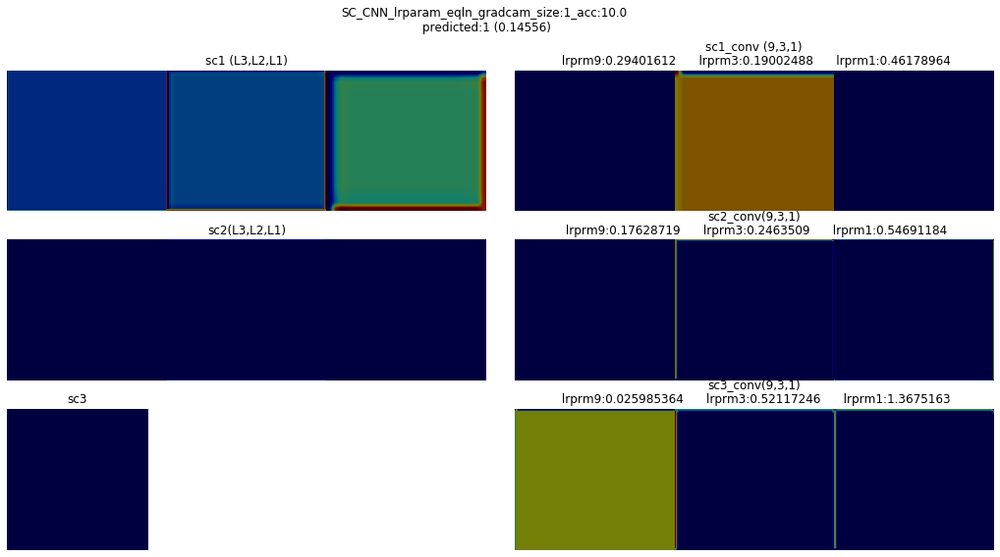


  1%|          | 1/112 [00:02<03:59,  2.16s/it]

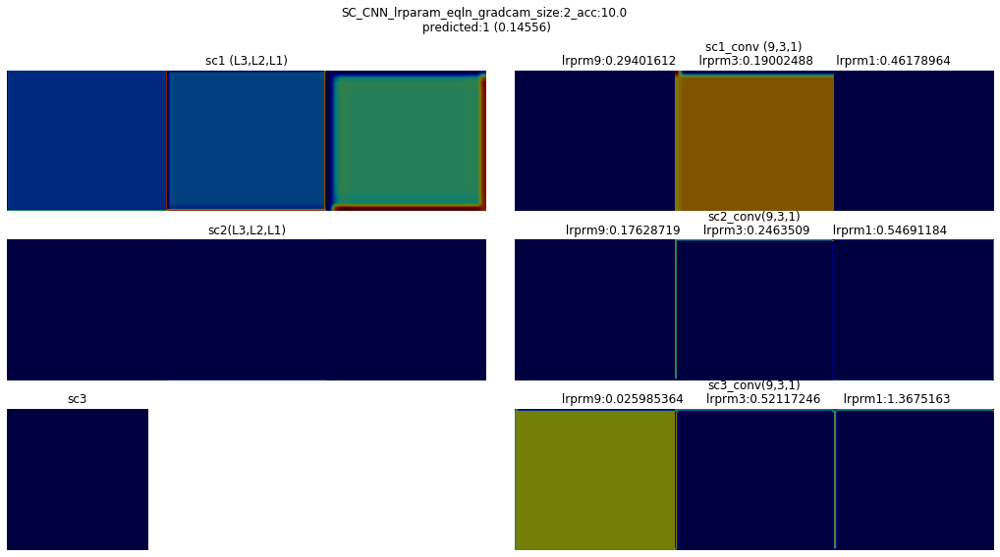


  2%|▏         | 2/112 [00:04<03:57,  2.16s/it]

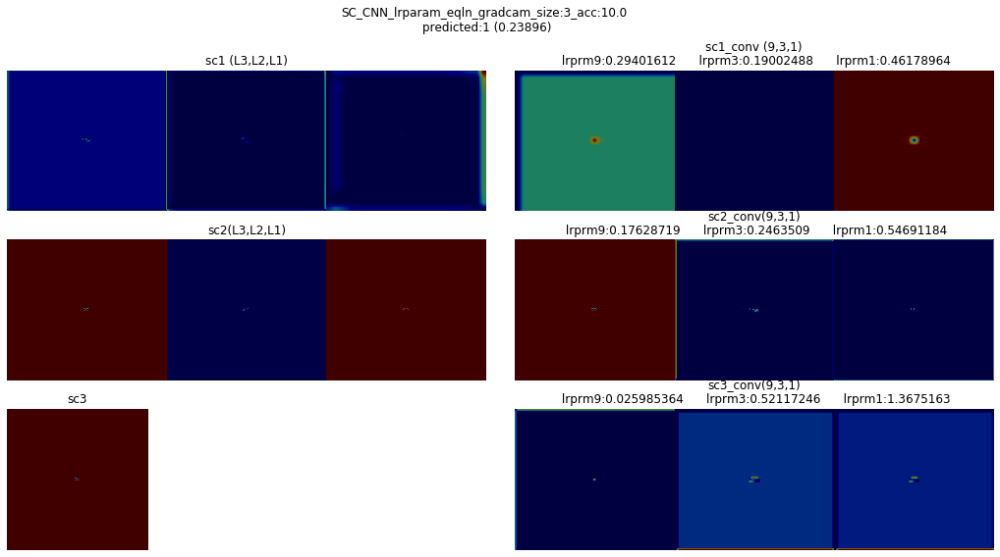


  3%|▎         | 3/112 [00:06<03:54,  2.16s/it]

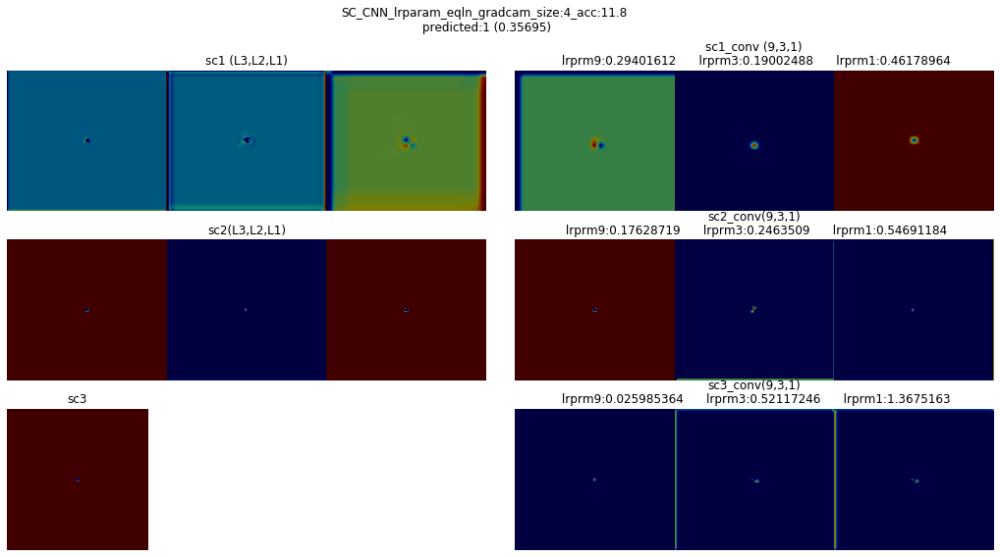


  4%|▎         | 4/112 [00:09<04:06,  2.28s/it]

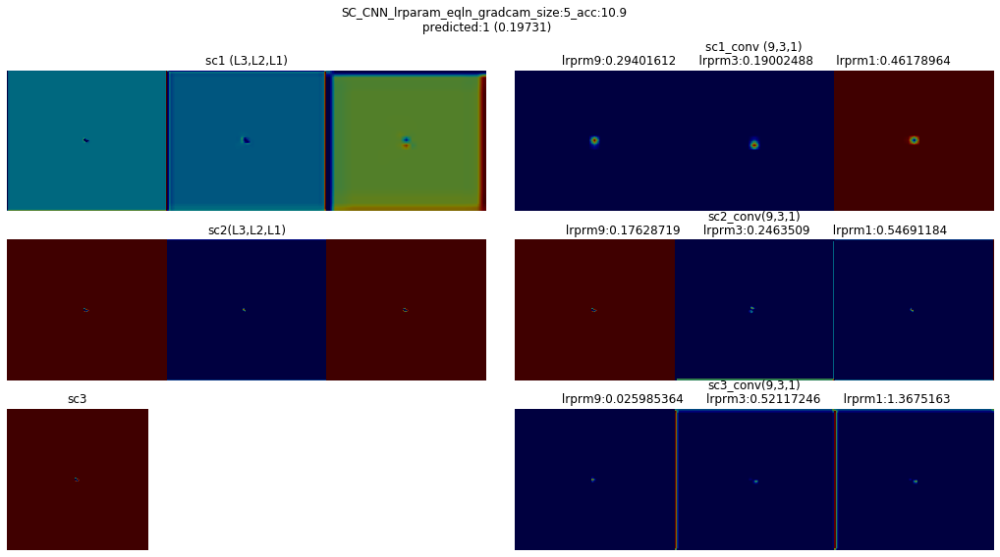


  4%|▍         | 5/112 [00:11<04:00,  2.25s/it]

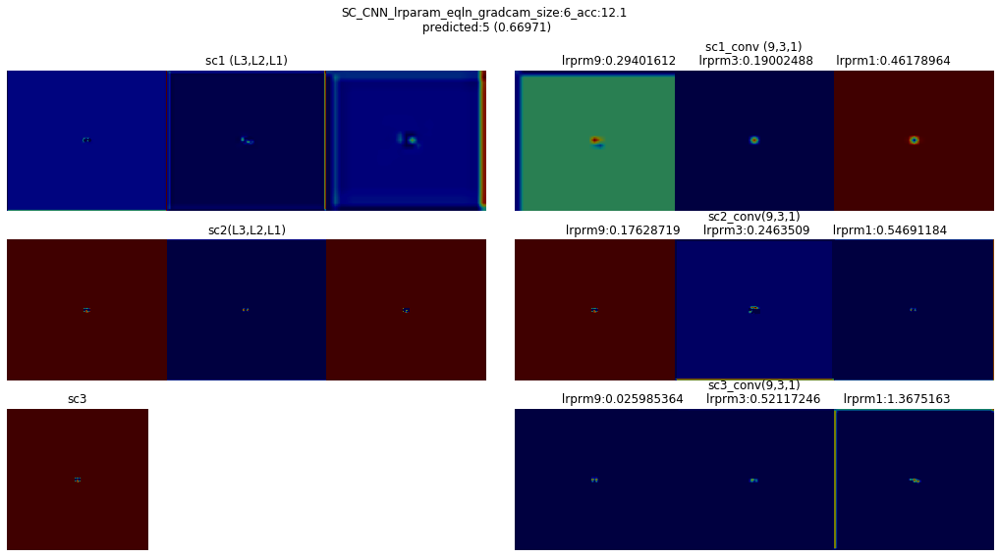


  5%|▌         | 6/112 [00:13<03:56,  2.23s/it]

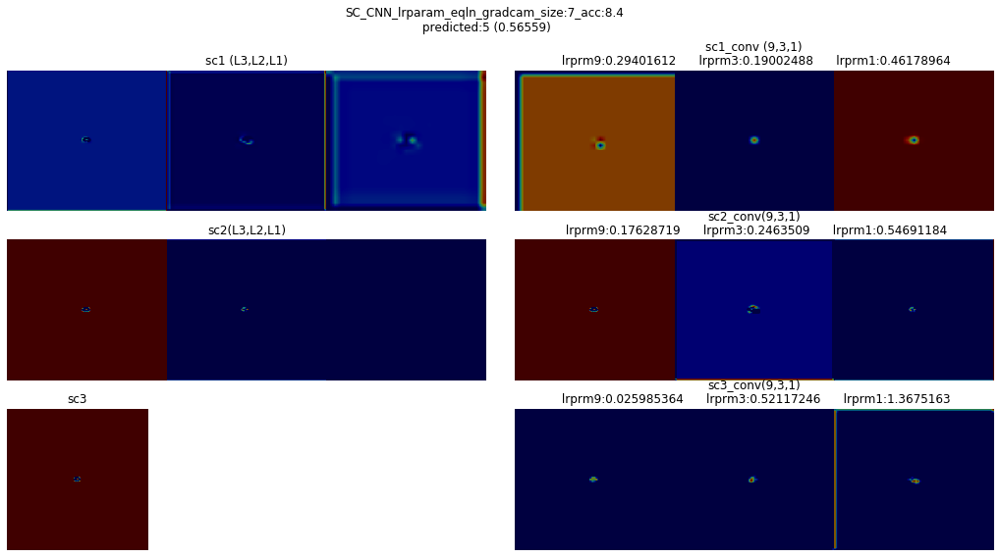


  6%|▋         | 7/112 [00:15<03:55,  2.24s/it]

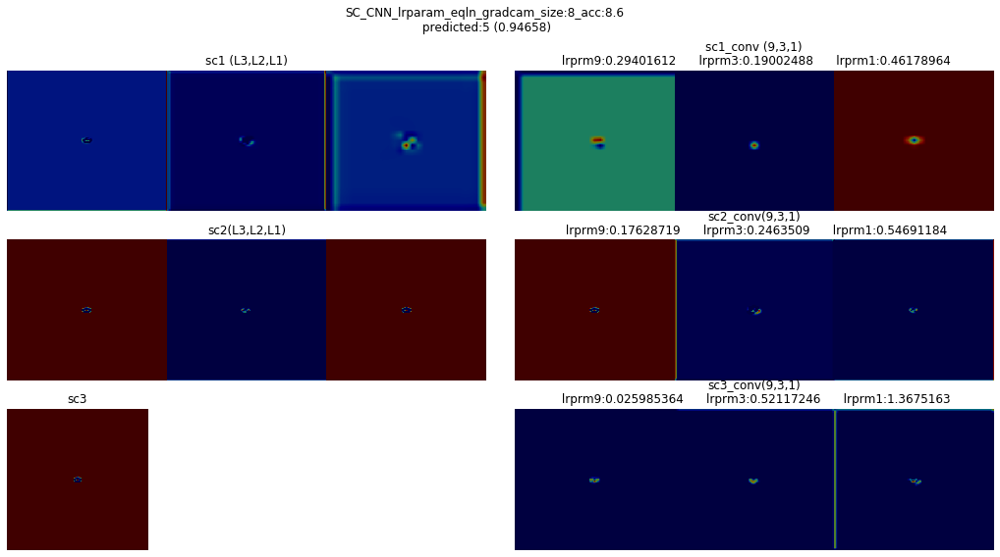


  7%|▋         | 8/112 [00:17<03:49,  2.20s/it]

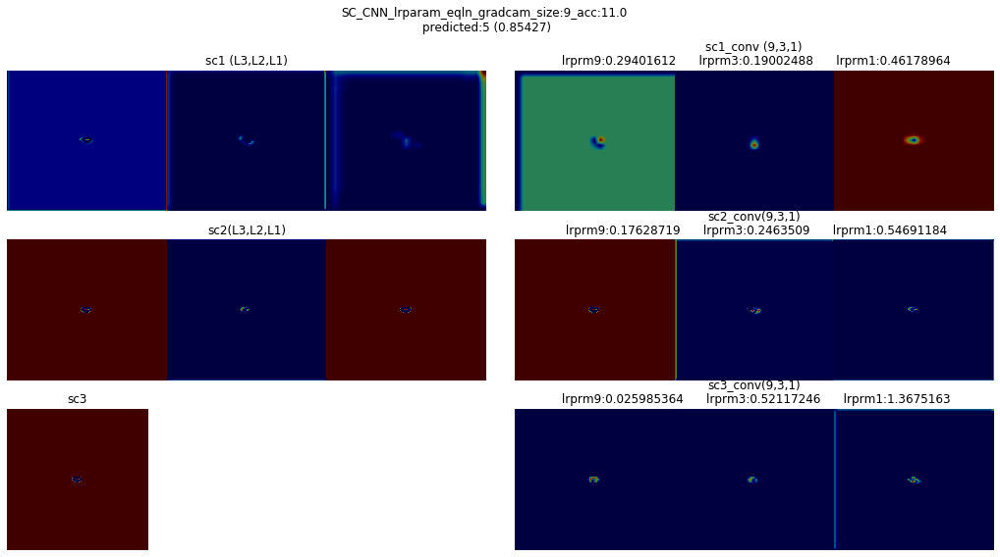


  8%|▊         | 9/112 [00:19<03:45,  2.19s/it]

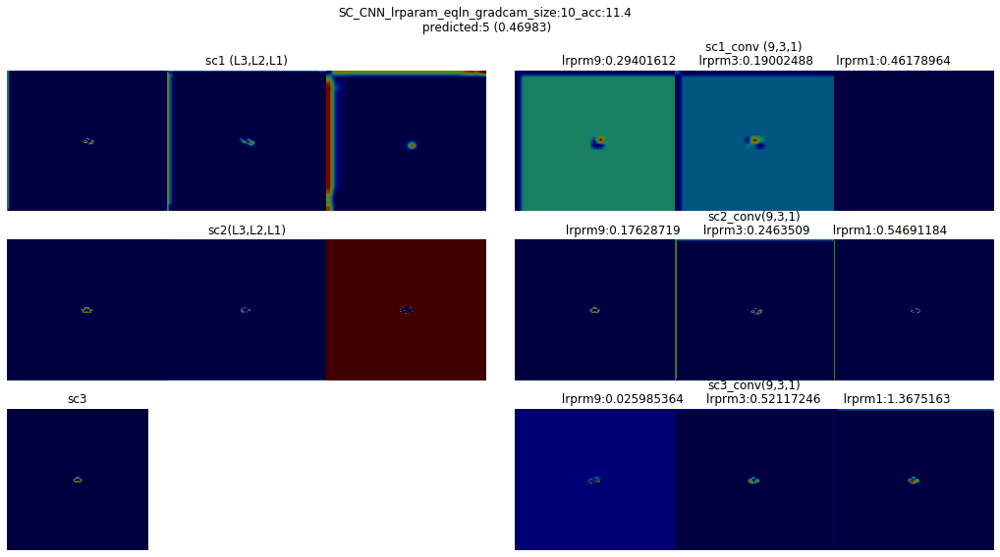


  9%|▉         | 10/112 [00:22<03:42,  2.18s/it]

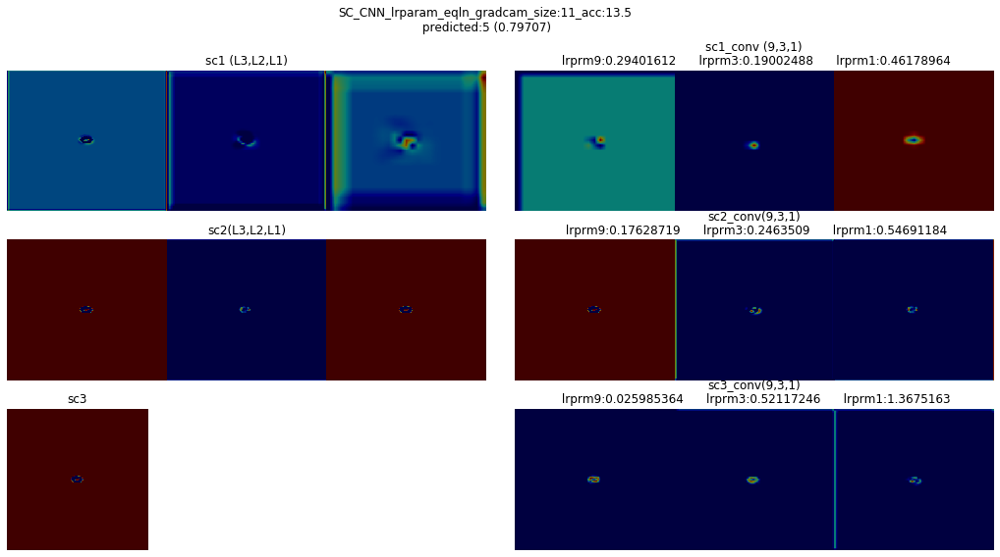


 10%|▉         | 11/112 [00:24<03:43,  2.22s/it]

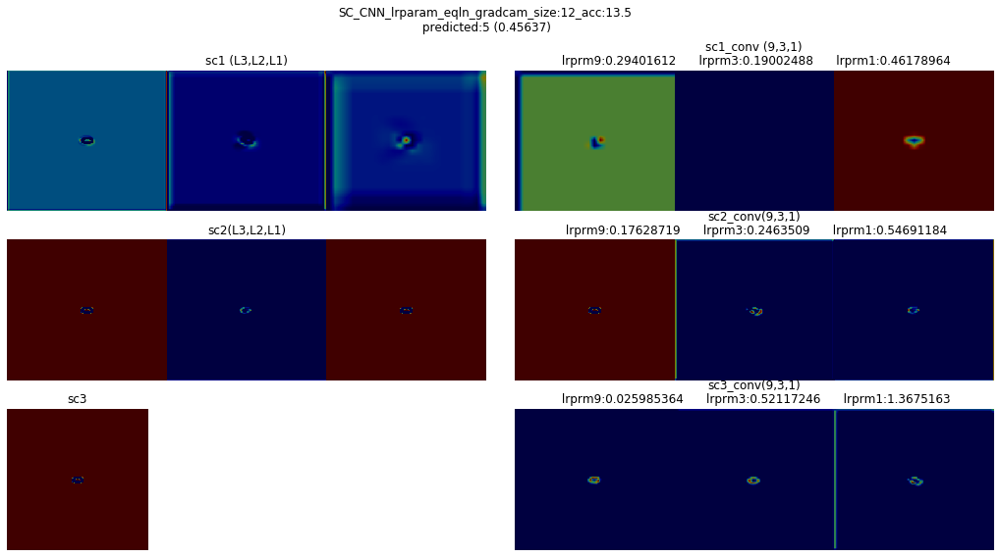


 11%|█         | 12/112 [00:26<03:39,  2.20s/it]

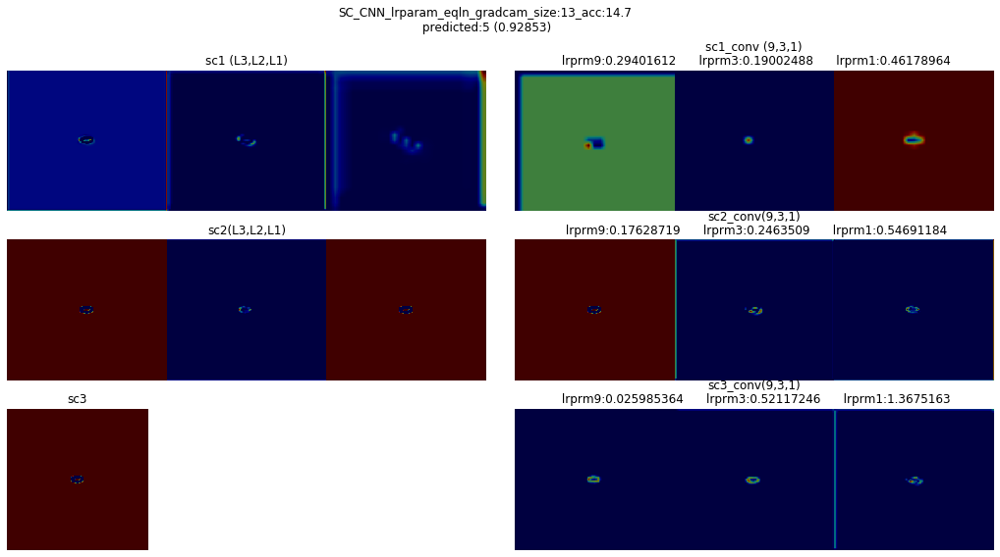


 12%|█▏        | 13/112 [00:28<03:37,  2.20s/it]

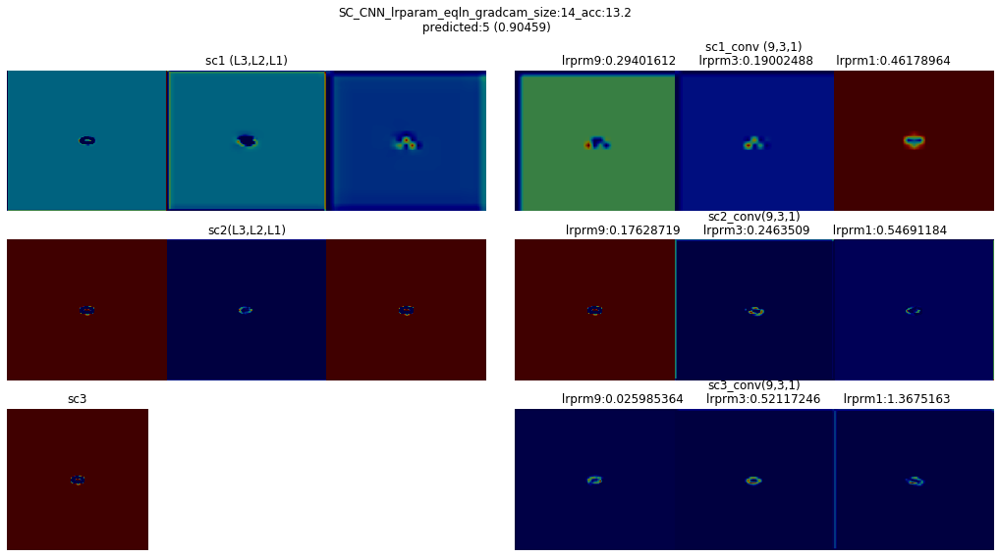


 12%|█▎        | 14/112 [00:30<03:34,  2.19s/it]

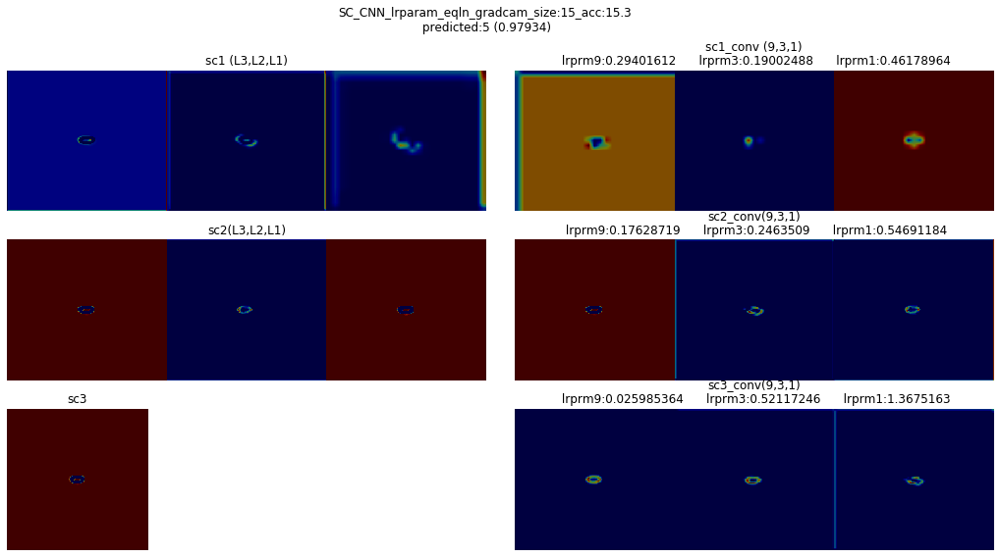


 13%|█▎        | 15/112 [00:33<03:47,  2.34s/it]

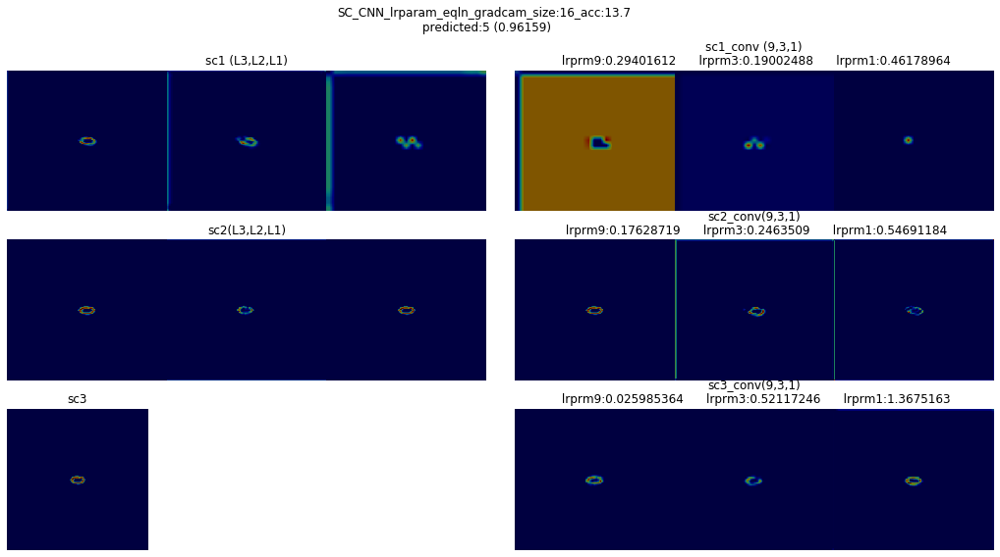


 14%|█▍        | 16/112 [00:35<03:40,  2.30s/it]

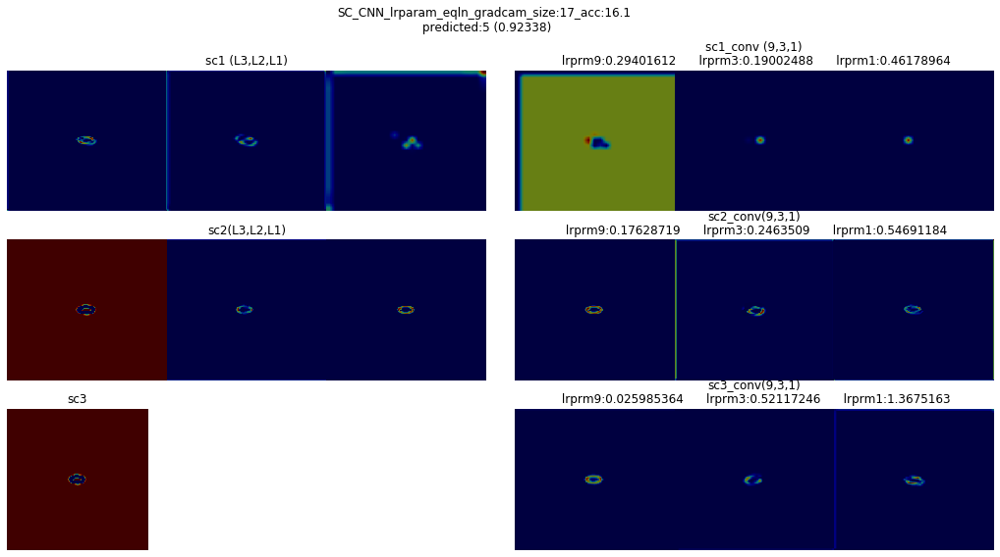


 15%|█▌        | 17/112 [00:38<03:35,  2.27s/it]

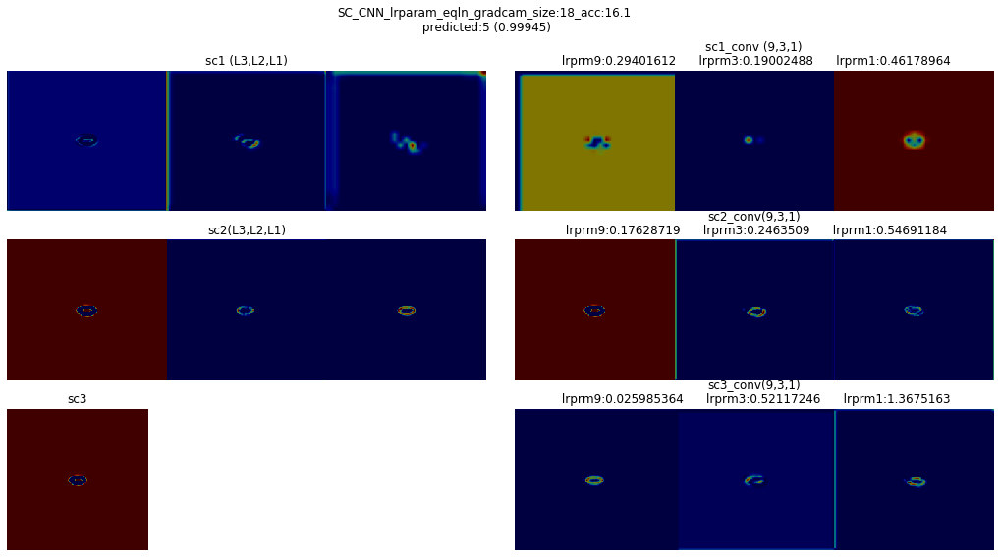


 16%|█▌        | 18/112 [00:40<03:34,  2.28s/it]

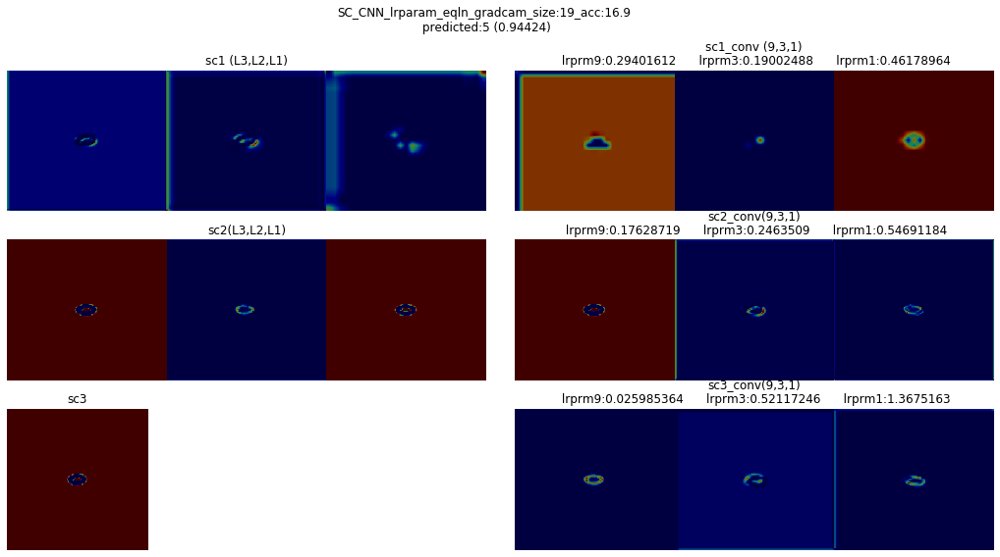


 17%|█▋        | 19/112 [00:42<03:29,  2.25s/it]

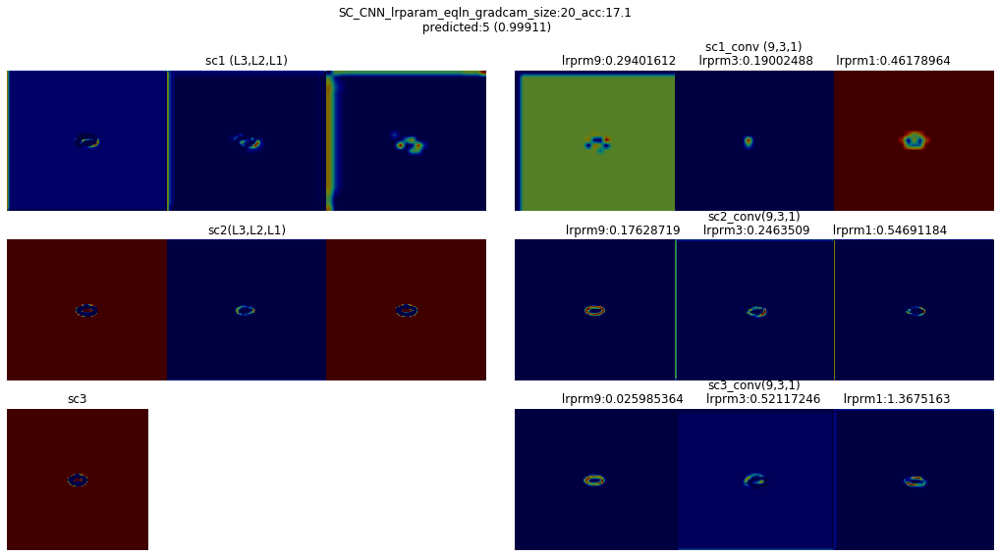


 18%|█▊        | 20/112 [00:44<03:24,  2.22s/it]

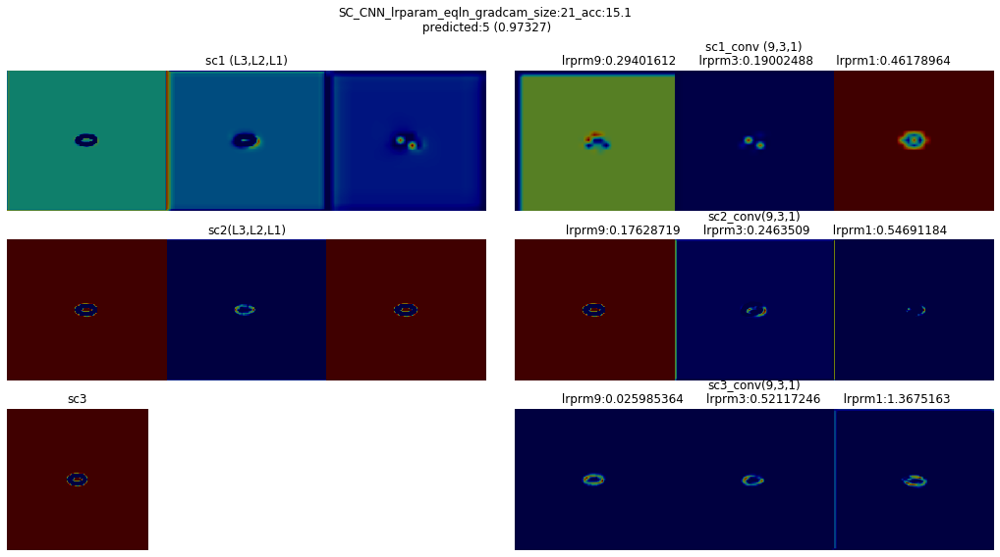


 19%|█▉        | 21/112 [00:46<03:20,  2.20s/it]

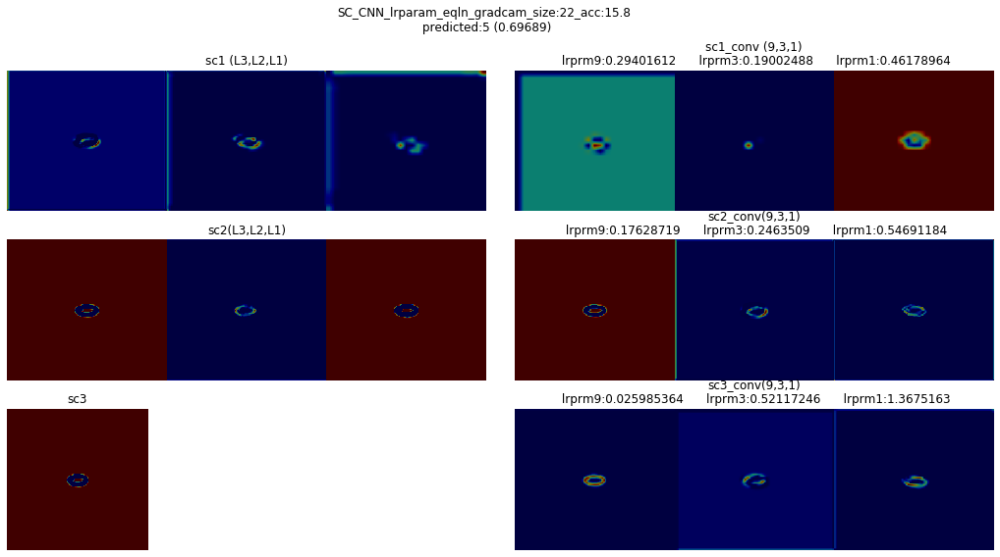


 20%|█▉        | 22/112 [00:49<03:22,  2.25s/it]

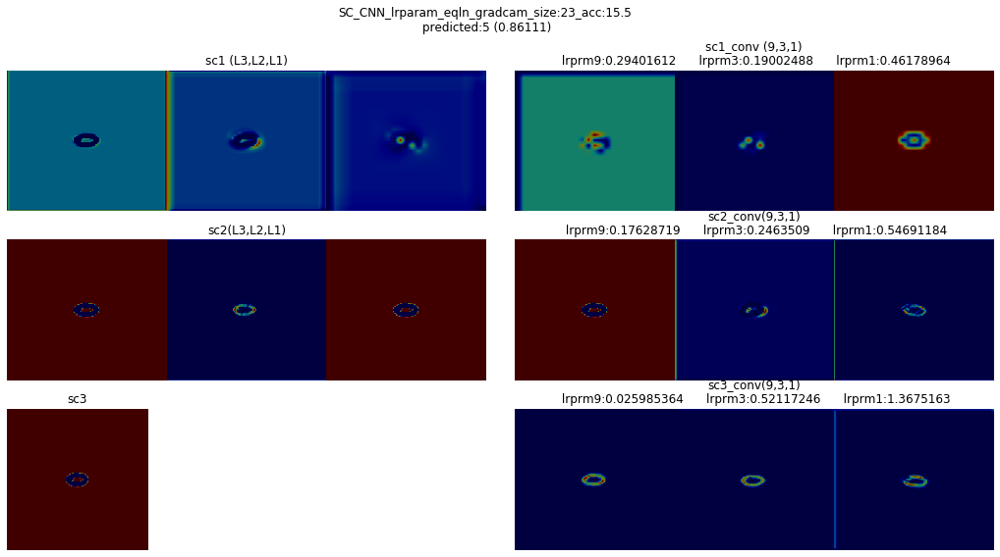


 21%|██        | 23/112 [00:51<03:17,  2.22s/it]

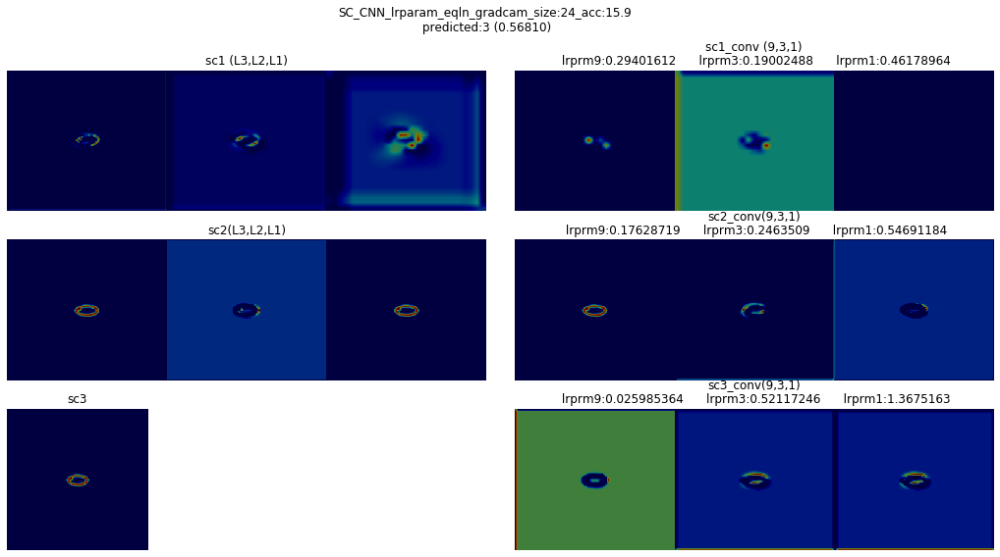


 21%|██▏       | 24/112 [00:53<03:12,  2.19s/it]

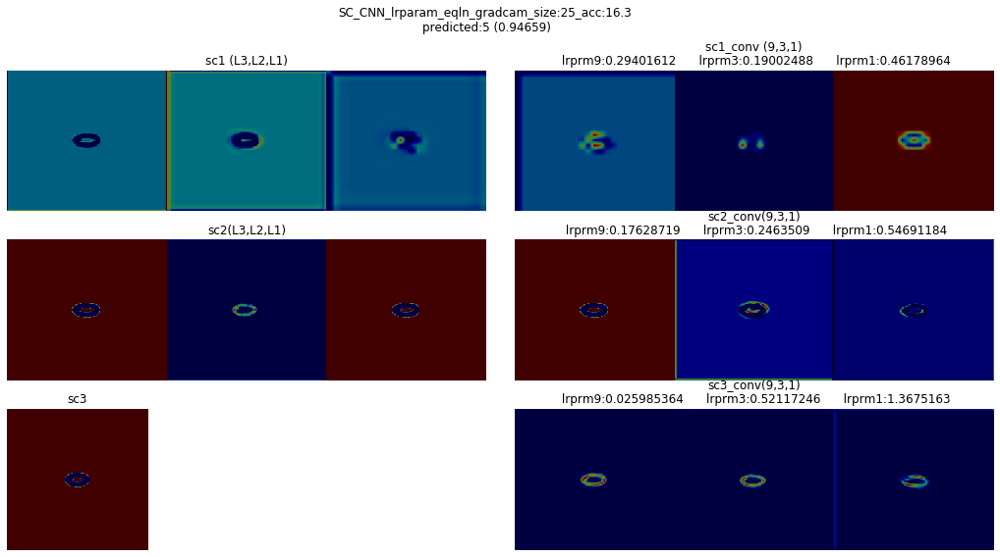


 22%|██▏       | 25/112 [00:55<03:09,  2.17s/it]

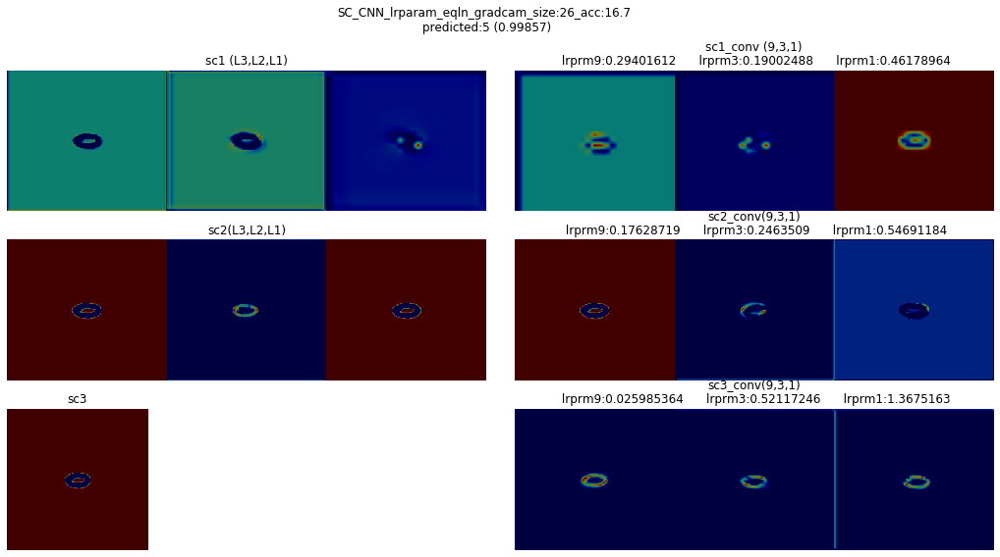


 23%|██▎       | 26/112 [00:58<03:14,  2.26s/it]

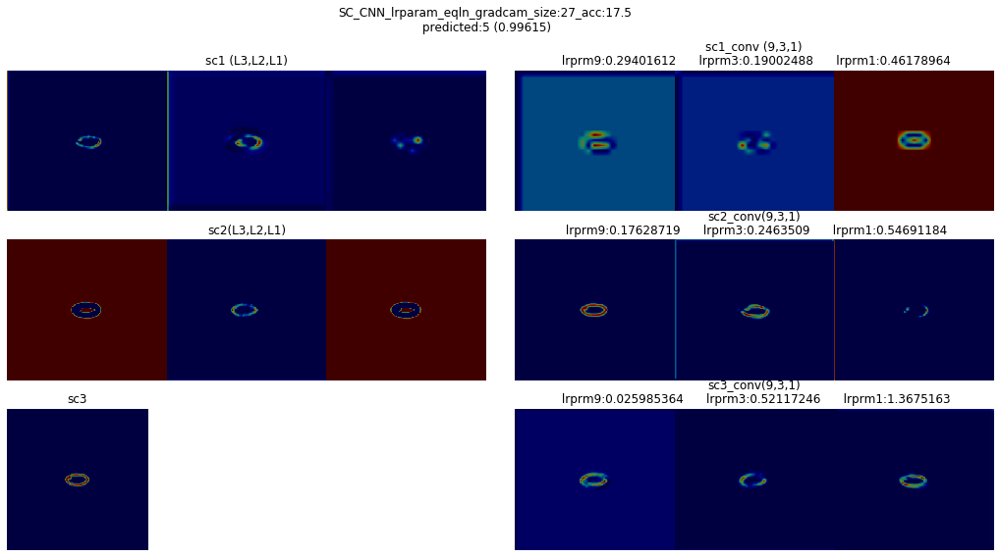


 24%|██▍       | 27/112 [01:00<03:10,  2.24s/it]

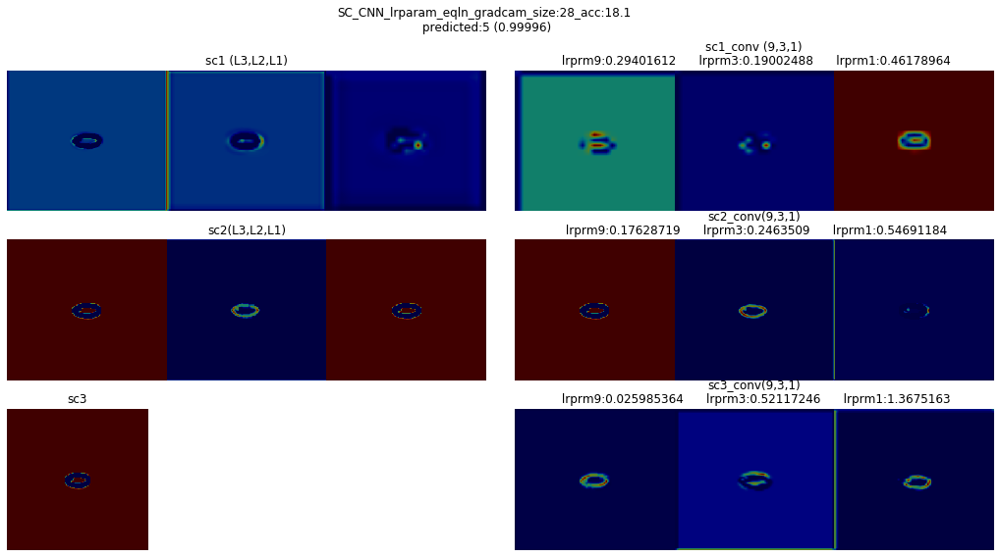


 25%|██▌       | 28/112 [01:02<03:07,  2.23s/it]

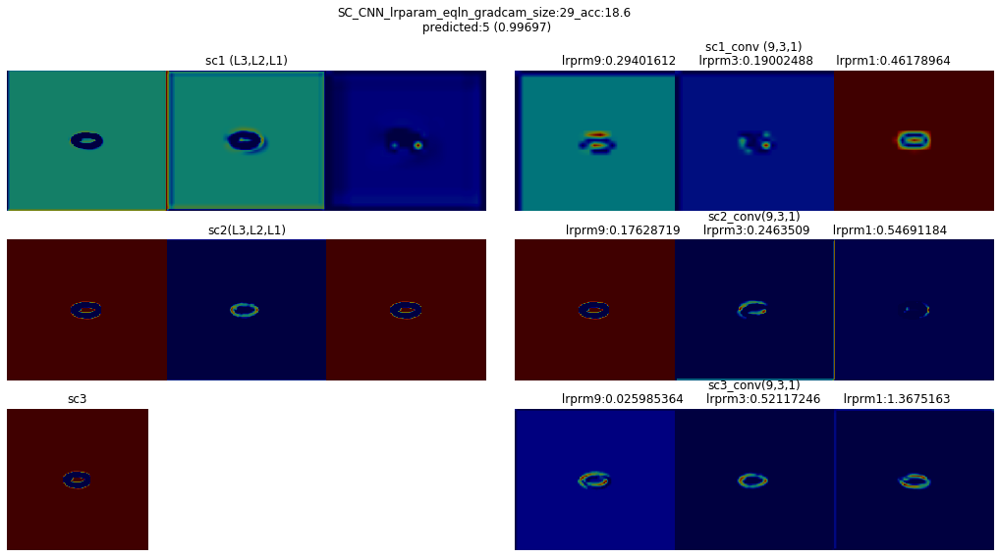


 26%|██▌       | 29/112 [01:04<03:05,  2.24s/it]

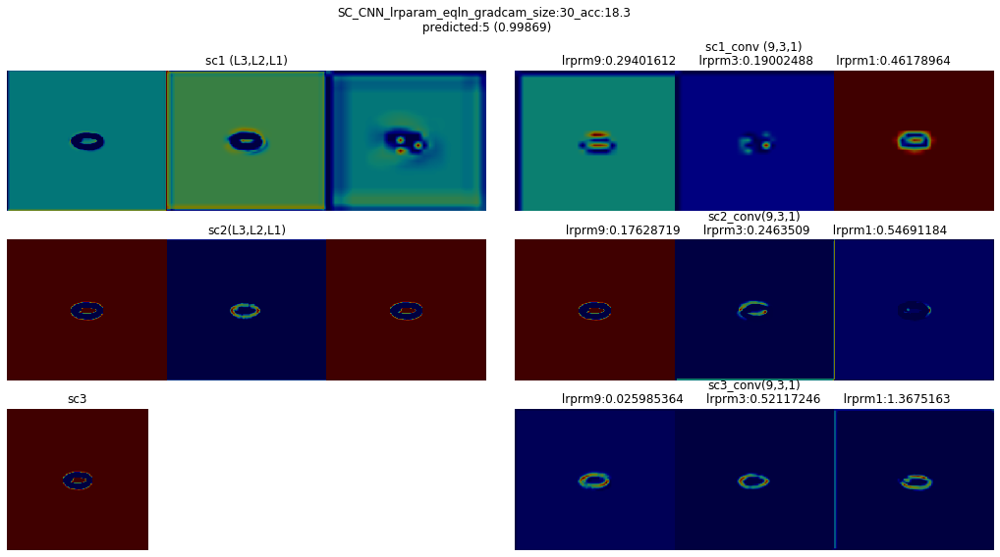


 27%|██▋       | 30/112 [01:06<03:01,  2.22s/it]

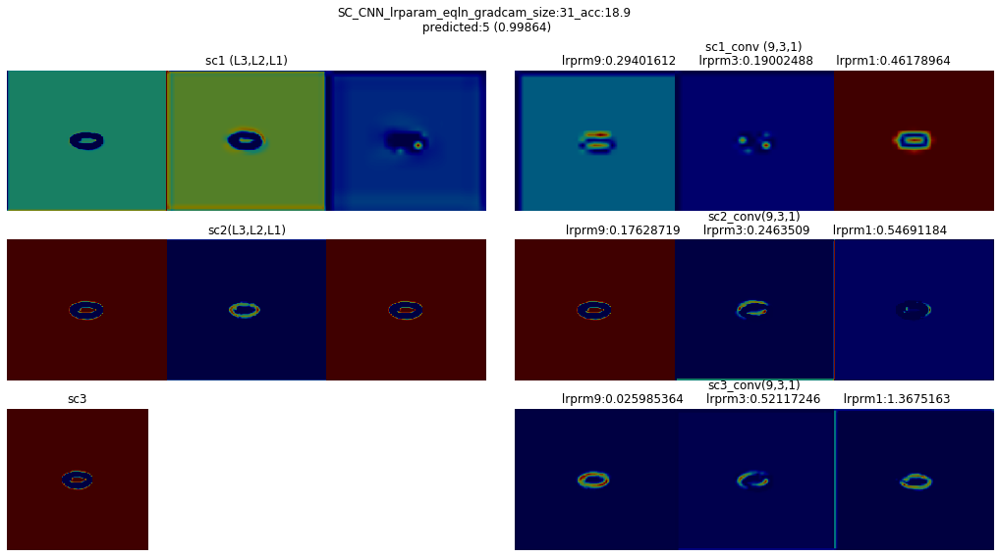


 28%|██▊       | 31/112 [01:09<02:58,  2.20s/it]

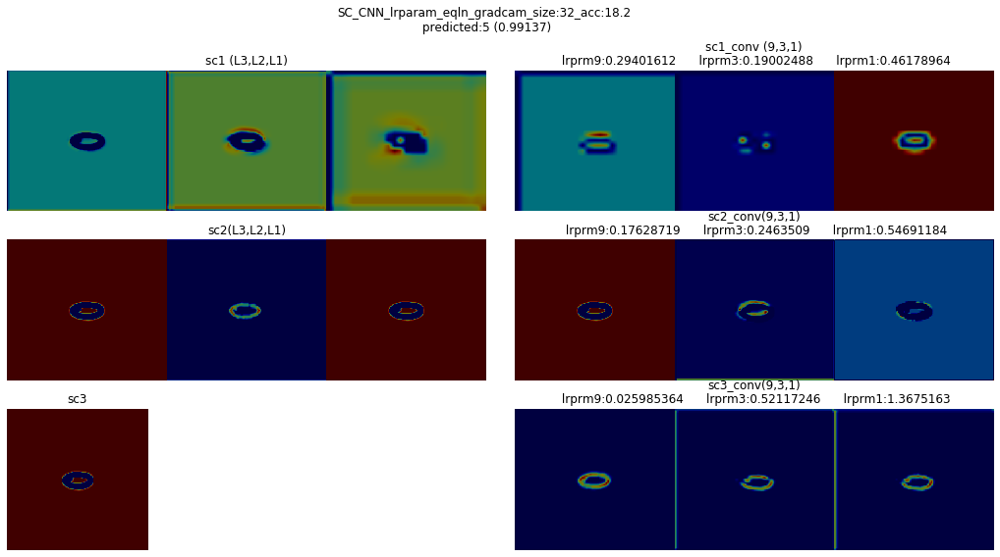


 29%|██▊       | 32/112 [01:11<02:57,  2.21s/it]

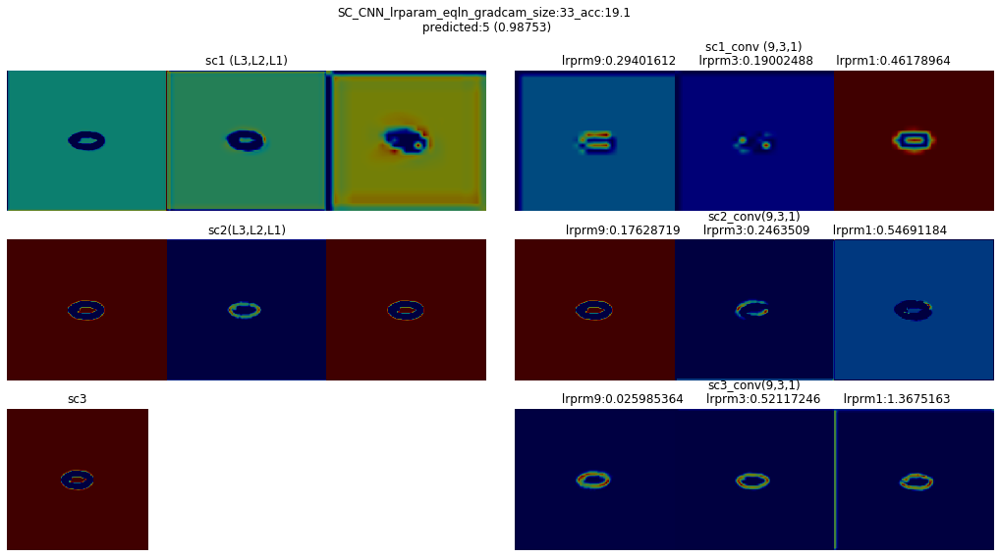


 29%|██▉       | 33/112 [01:13<02:57,  2.24s/it]

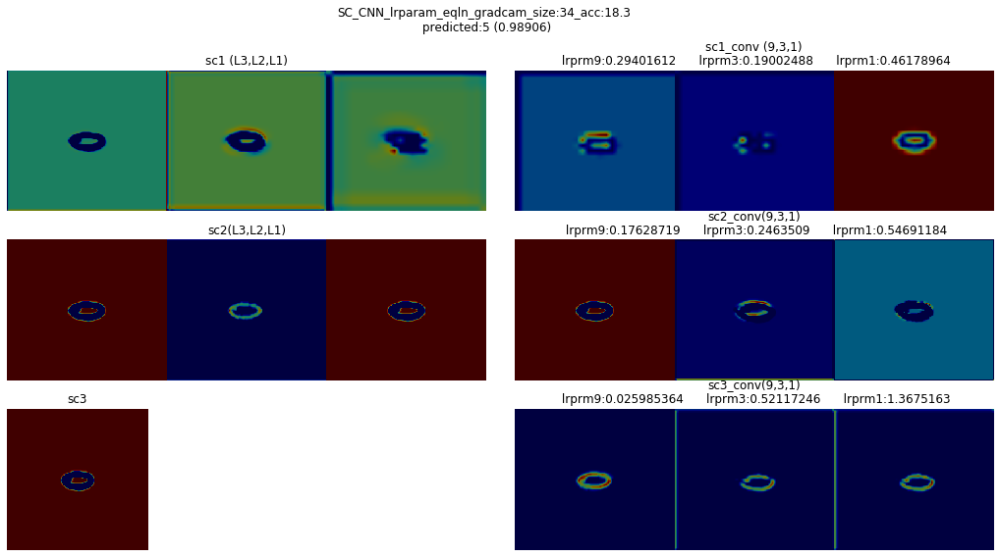


 30%|███       | 34/112 [01:15<02:52,  2.22s/it]

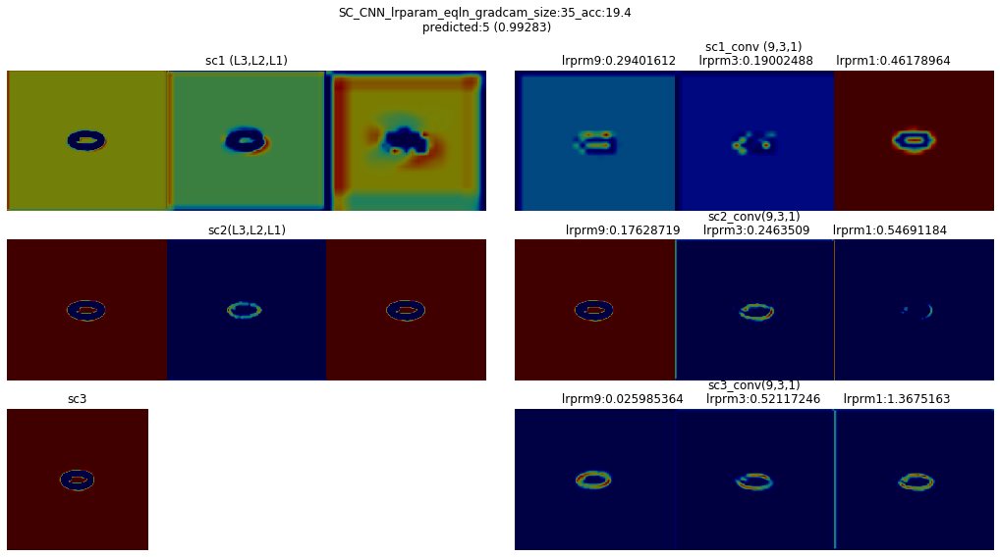


 31%|███▏      | 35/112 [01:17<02:50,  2.21s/it]

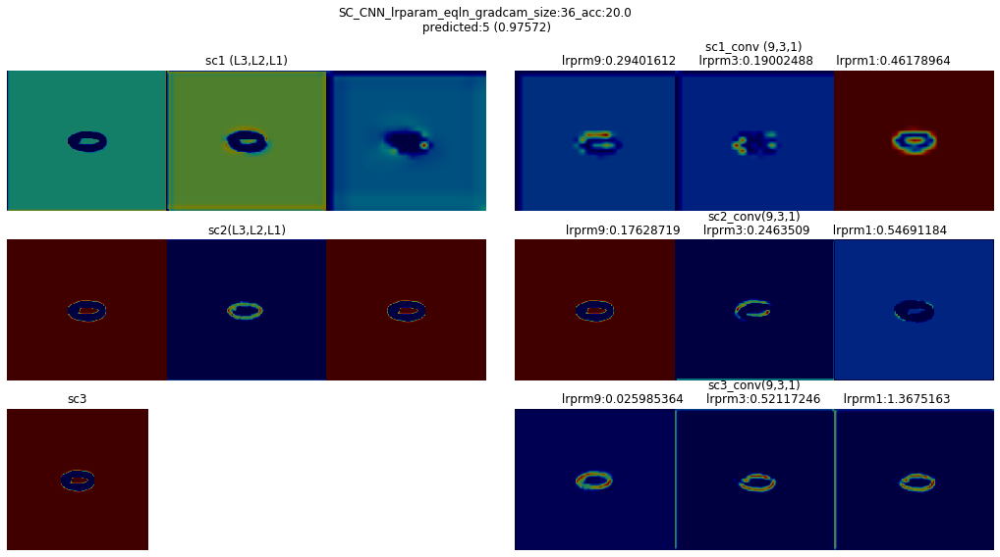


 32%|███▏      | 36/112 [01:20<02:47,  2.20s/it]

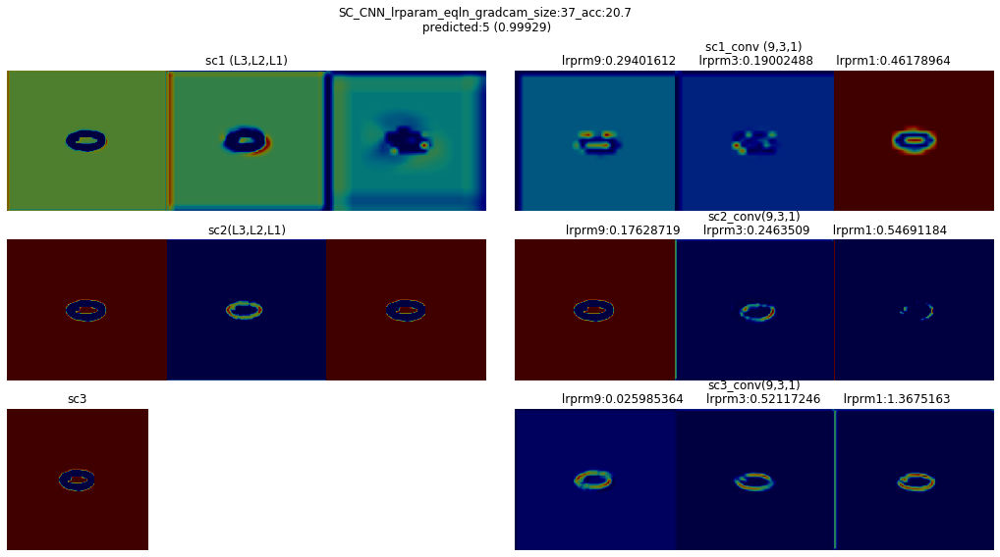


 33%|███▎      | 37/112 [01:22<02:52,  2.30s/it]

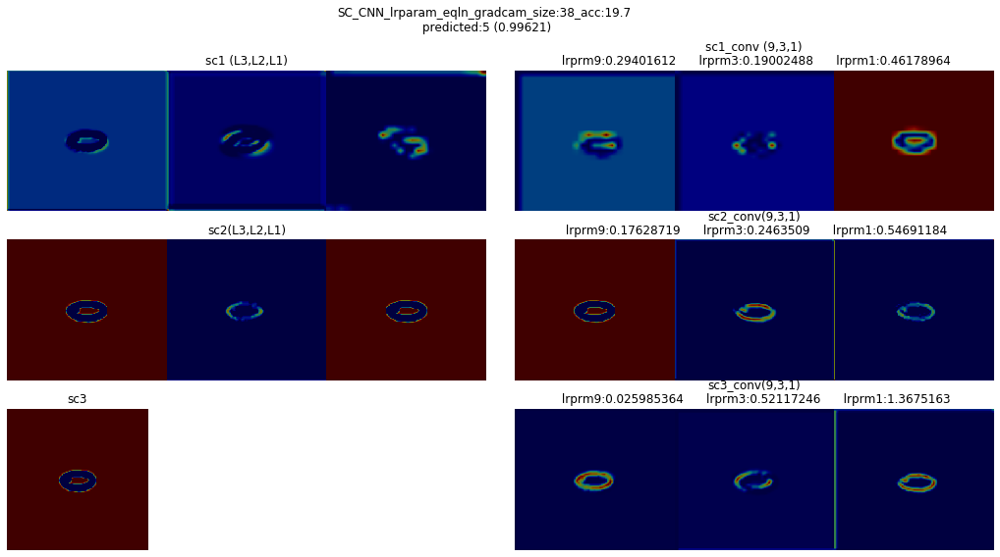


 34%|███▍      | 38/112 [01:24<02:46,  2.25s/it]

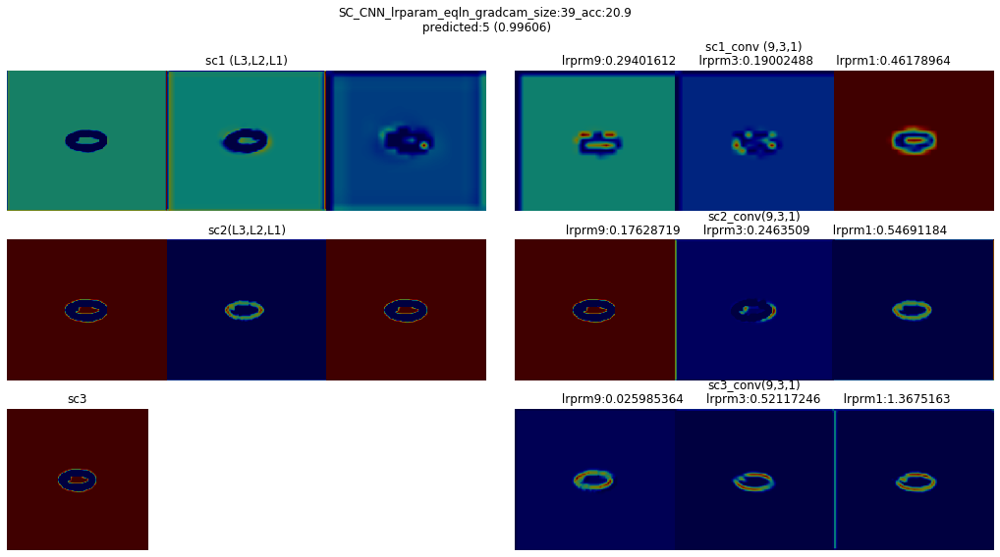


 35%|███▍      | 39/112 [01:26<02:42,  2.23s/it]

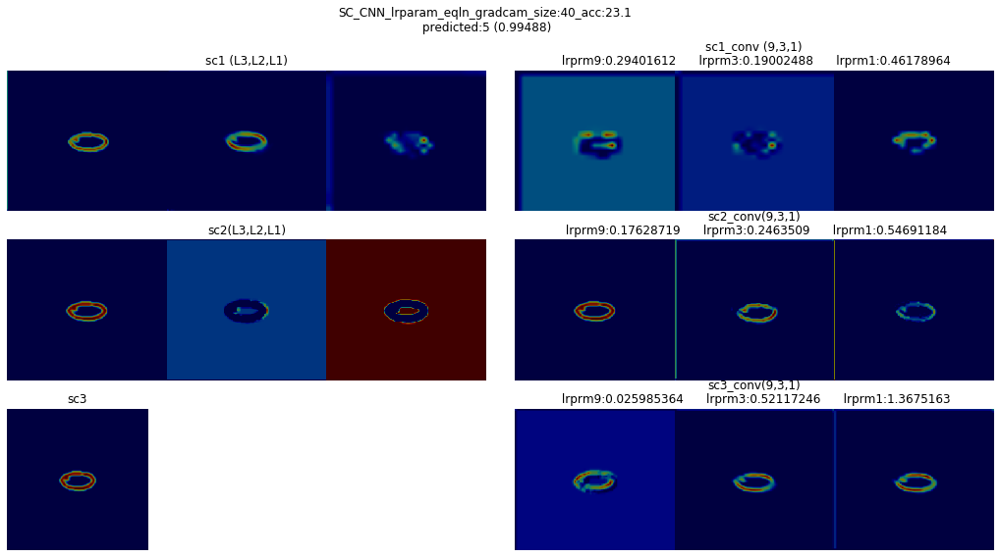


 36%|███▌      | 40/112 [01:29<02:42,  2.26s/it]

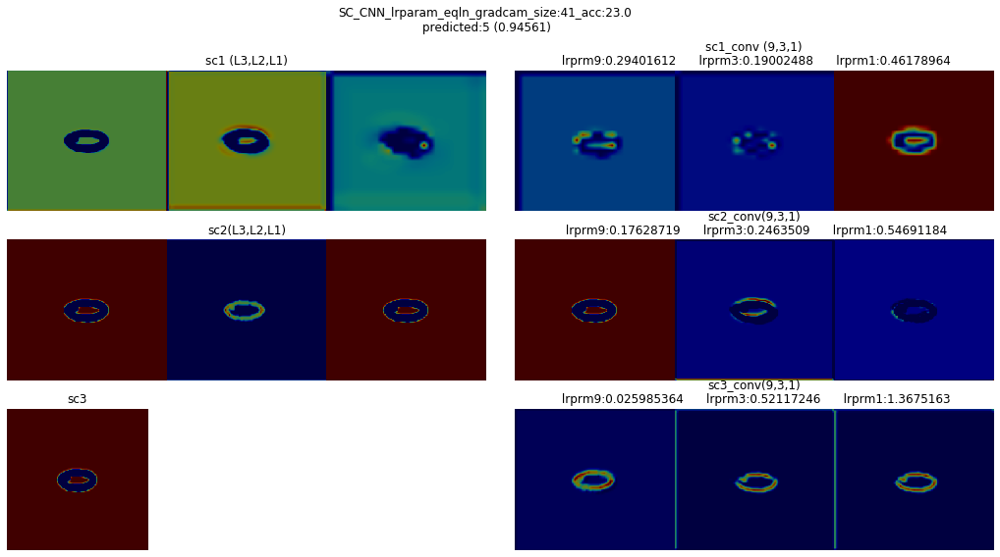


 37%|███▋      | 41/112 [01:31<02:38,  2.23s/it]

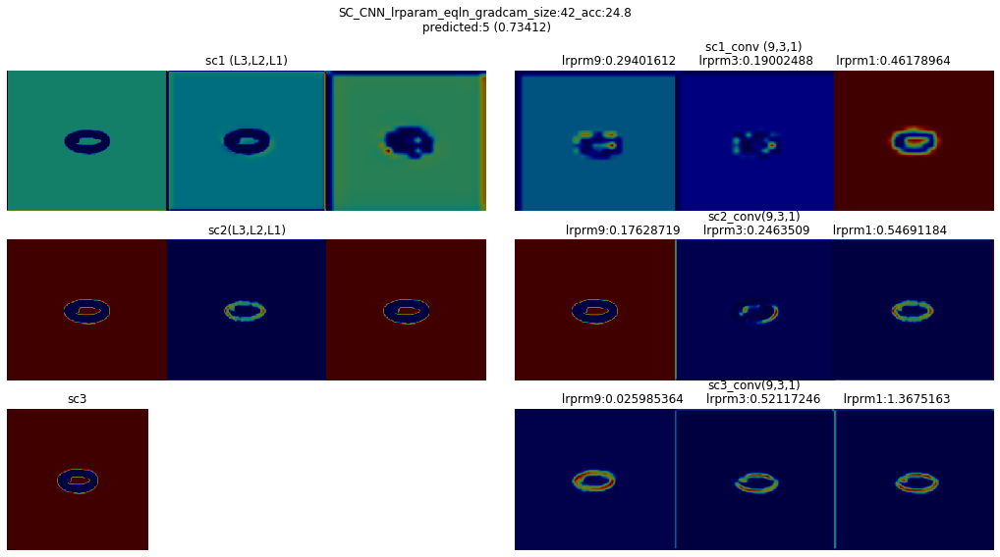


 38%|███▊      | 42/112 [01:33<02:34,  2.21s/it]

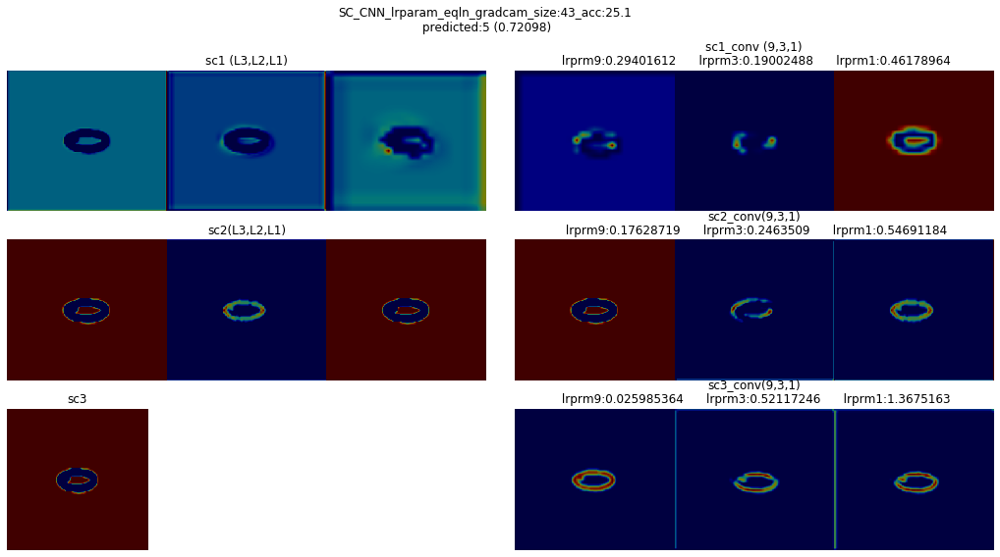


 38%|███▊      | 43/112 [01:35<02:32,  2.21s/it]

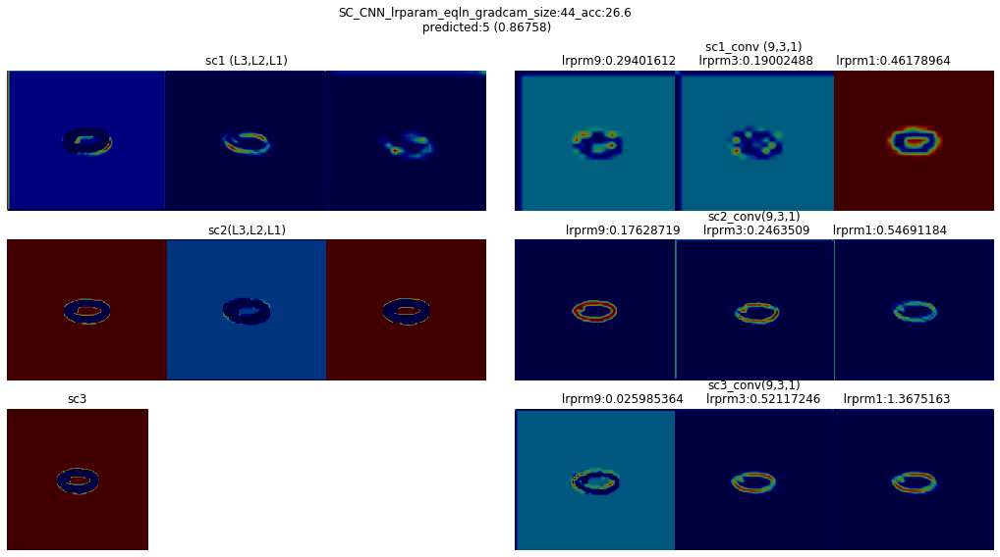


 39%|███▉      | 44/112 [01:38<02:32,  2.24s/it]

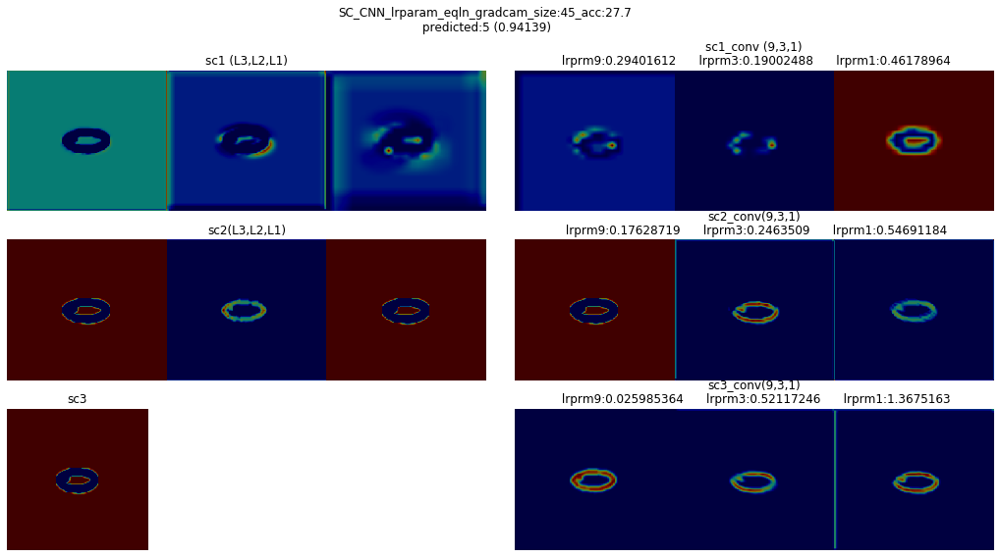


 40%|████      | 45/112 [01:40<02:27,  2.21s/it]

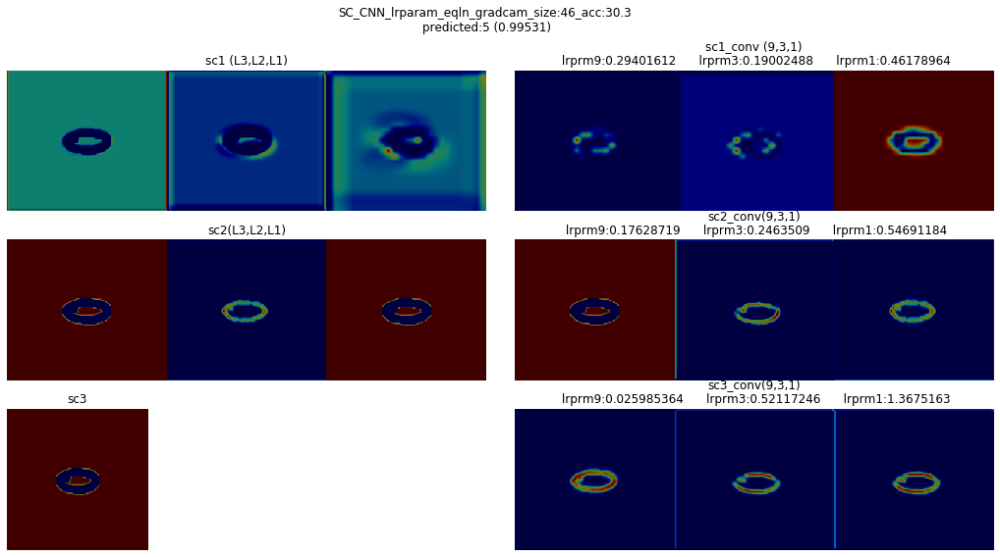


 41%|████      | 46/112 [01:42<02:25,  2.21s/it]

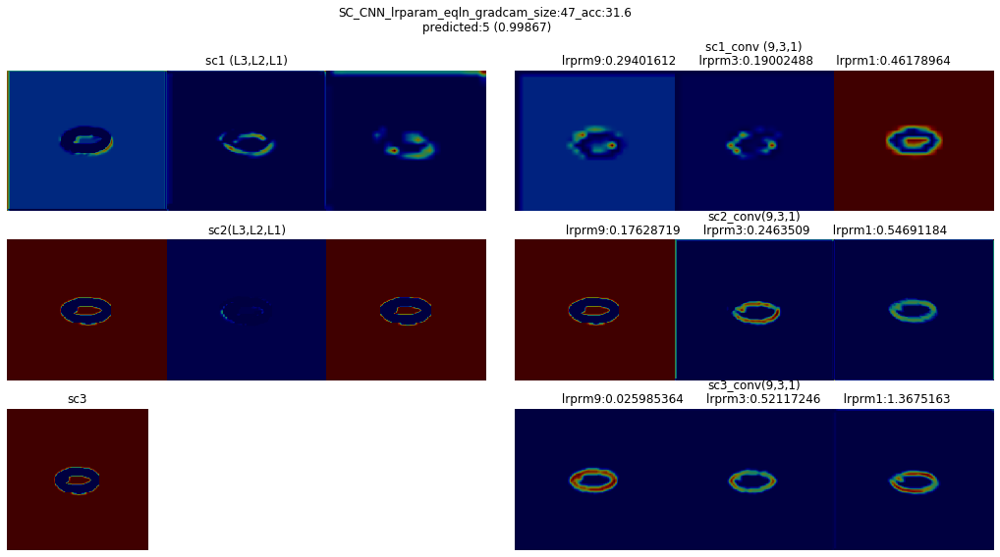


 42%|████▏     | 47/112 [01:44<02:22,  2.20s/it]

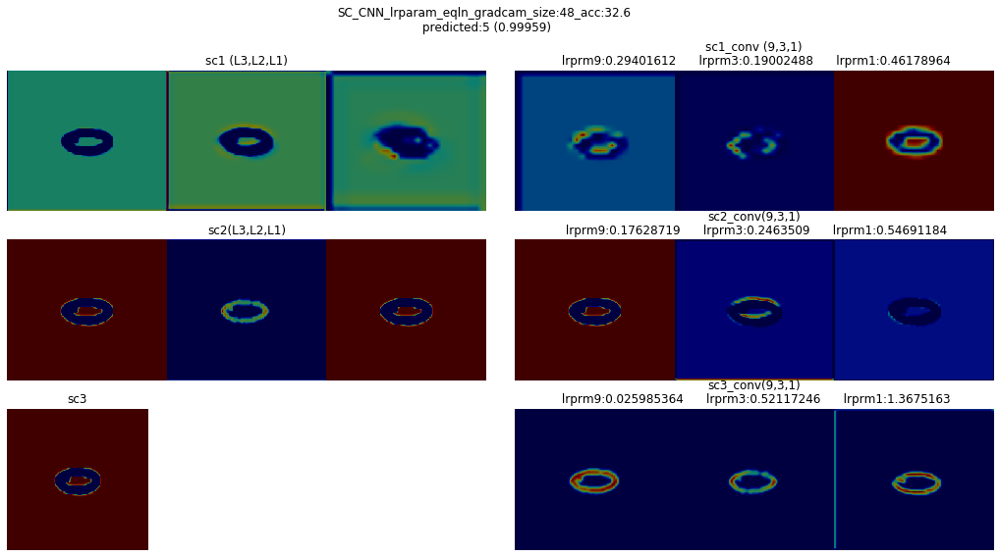


 43%|████▎     | 48/112 [01:47<02:31,  2.36s/it]

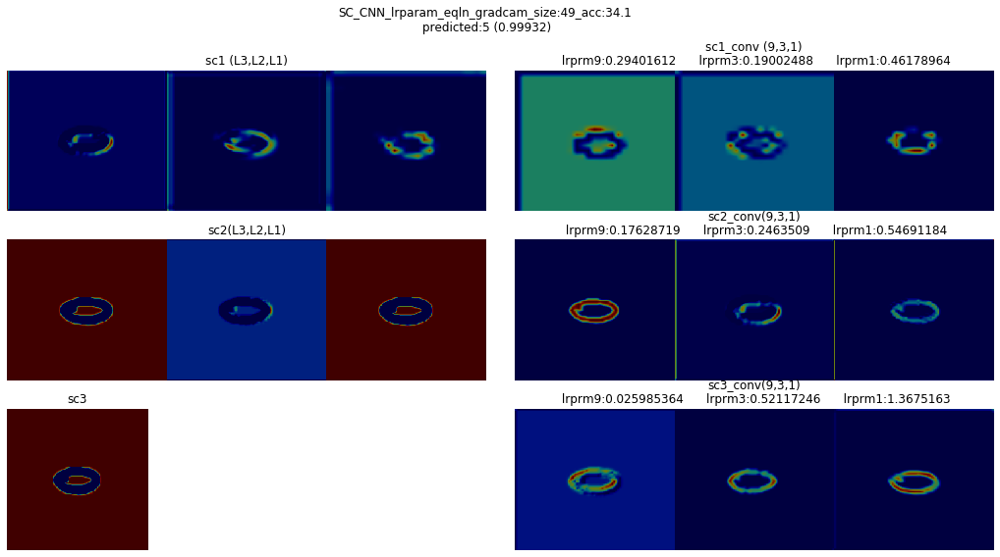


 44%|████▍     | 49/112 [01:49<02:25,  2.30s/it]

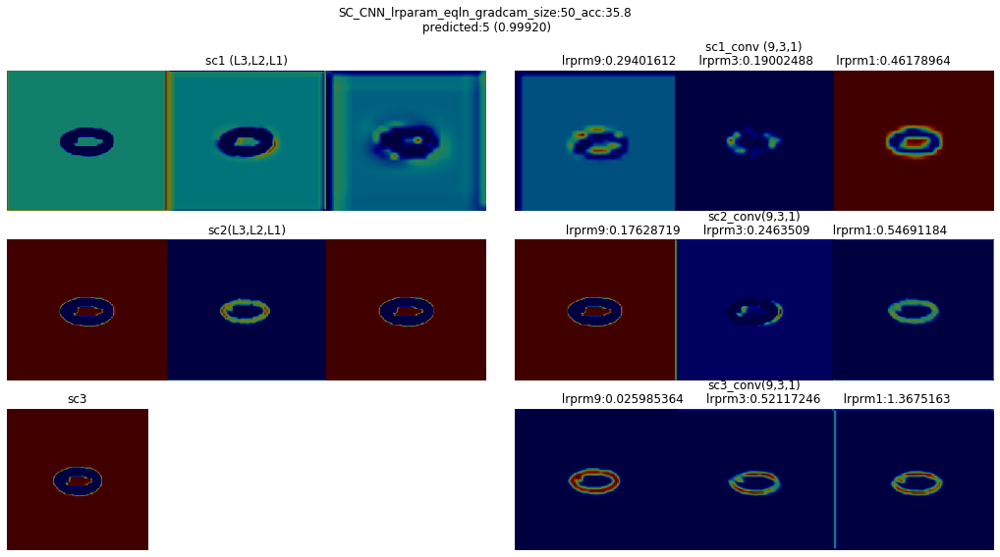


 45%|████▍     | 50/112 [01:51<02:20,  2.26s/it]

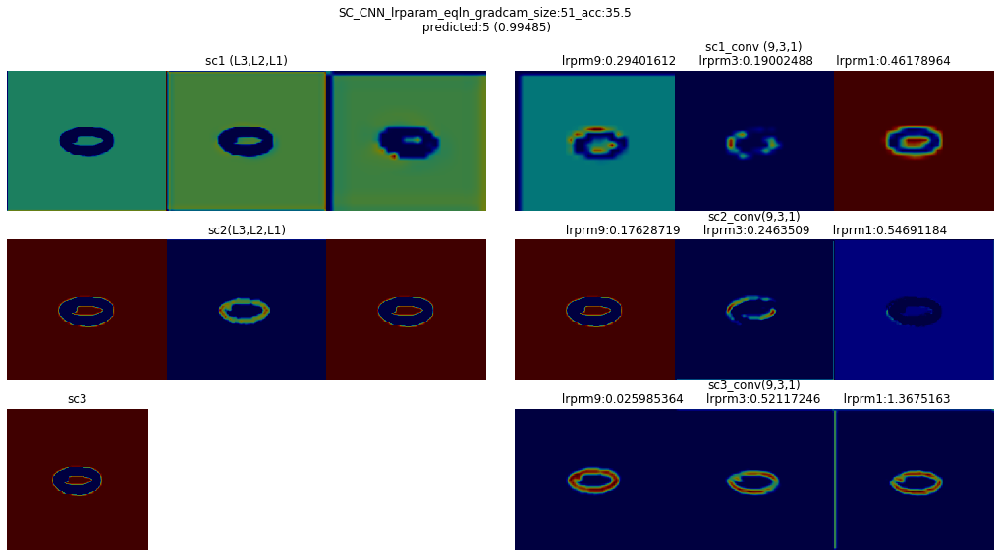


 46%|████▌     | 51/112 [01:54<02:19,  2.28s/it]

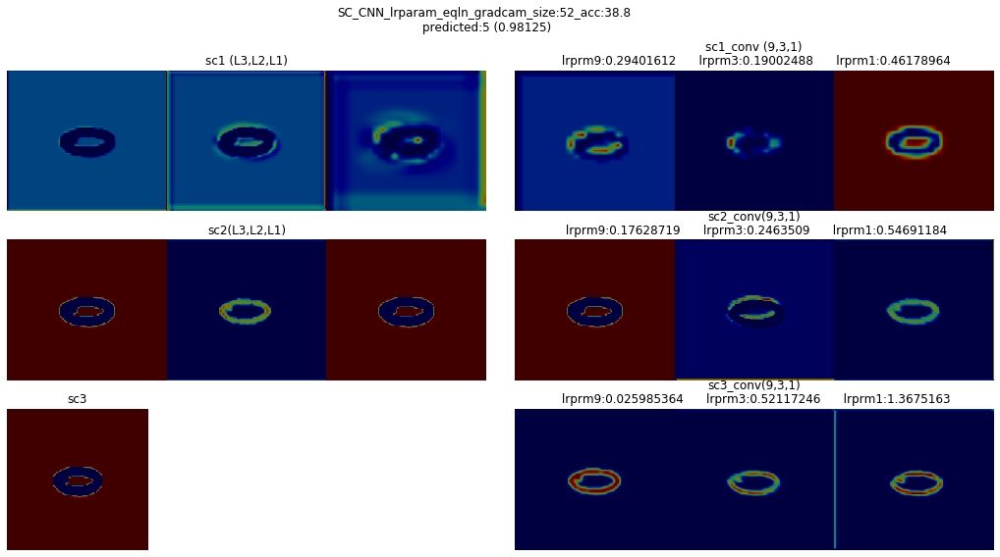


 46%|████▋     | 52/112 [01:56<02:15,  2.26s/it]

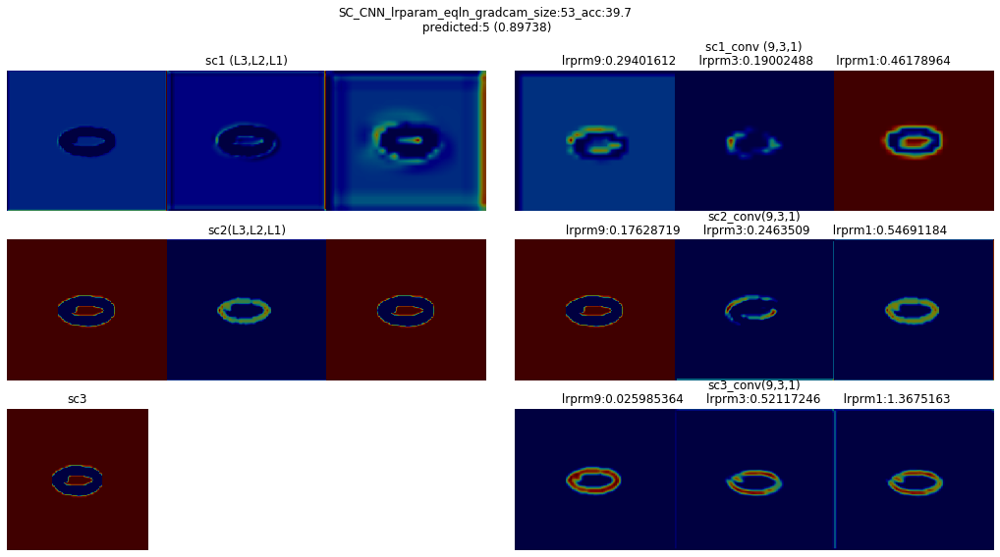


 47%|████▋     | 53/112 [01:58<02:12,  2.24s/it]

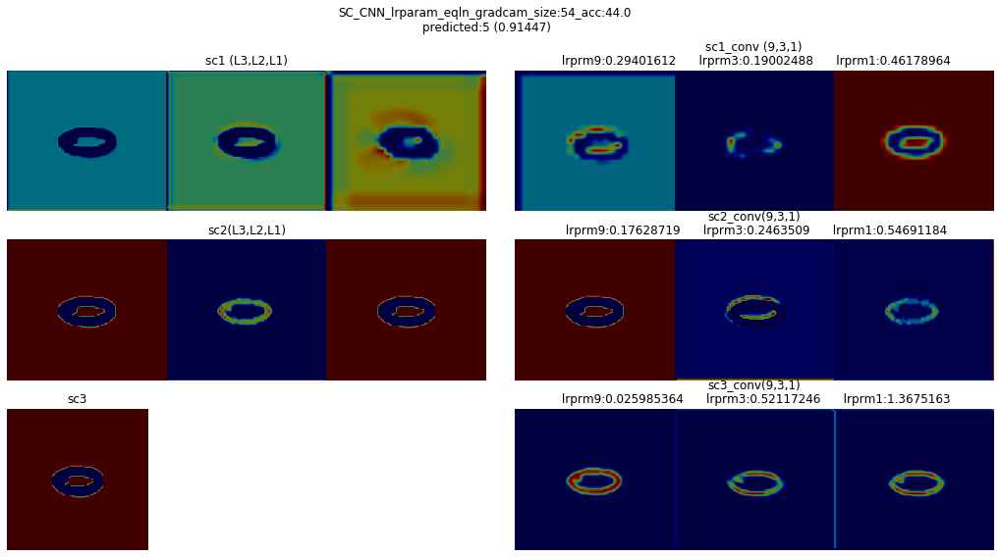


 48%|████▊     | 54/112 [02:00<02:09,  2.23s/it]

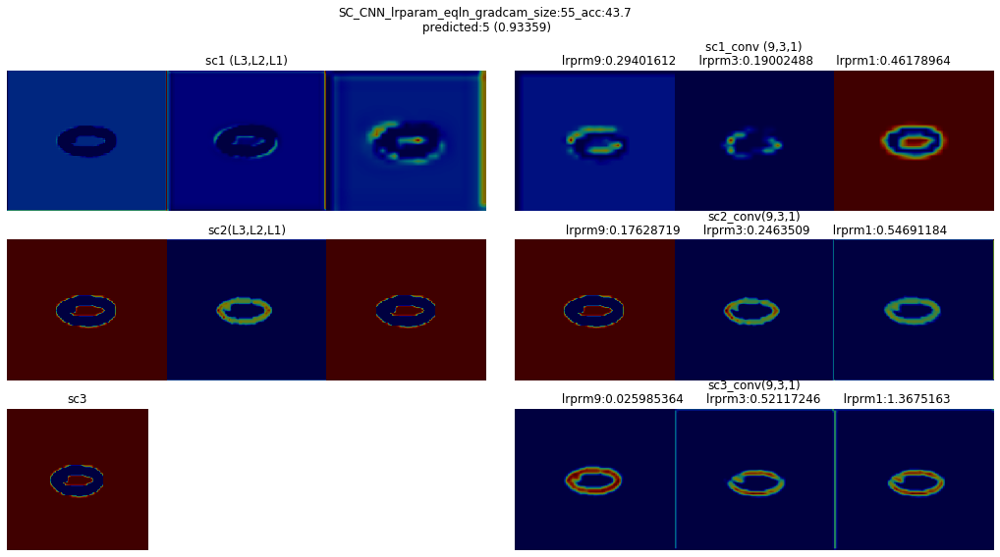


 49%|████▉     | 55/112 [02:03<02:09,  2.27s/it]

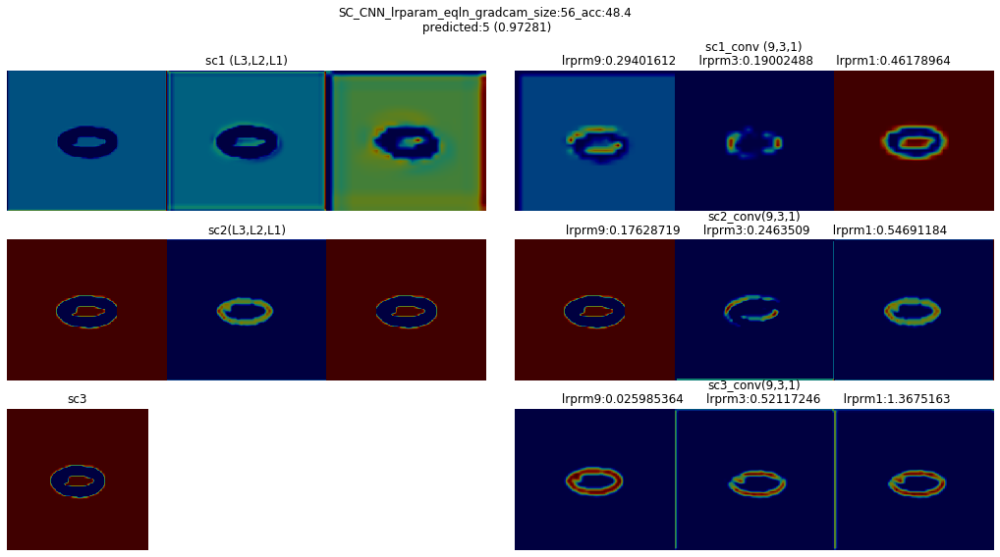


 50%|█████     | 56/112 [02:05<02:05,  2.25s/it]

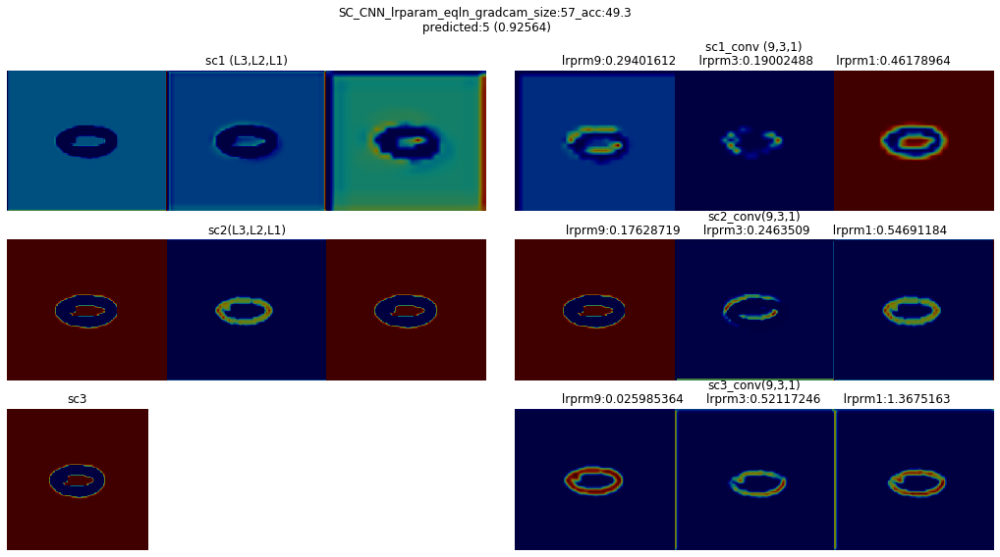


 51%|█████     | 57/112 [02:07<02:02,  2.23s/it]

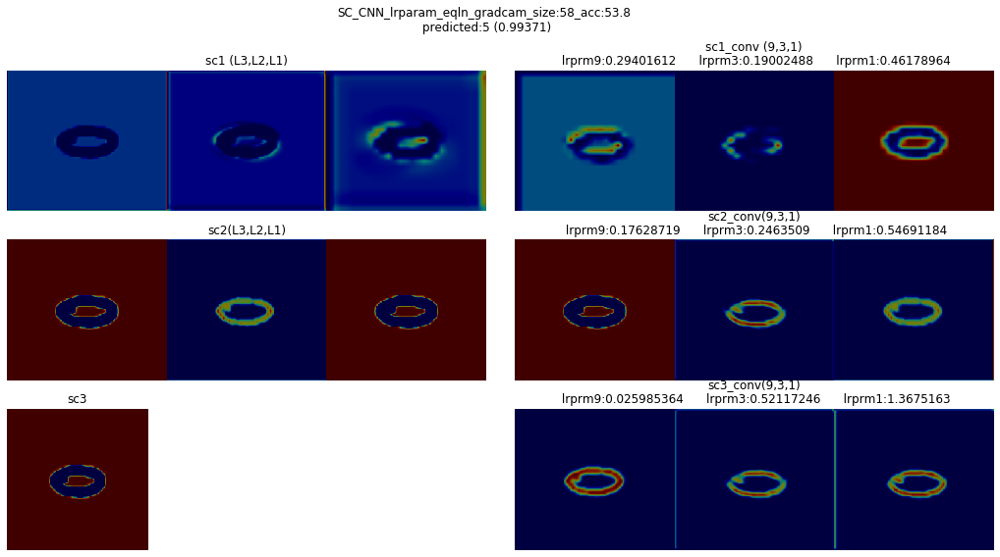


 52%|█████▏    | 58/112 [02:09<01:59,  2.21s/it]

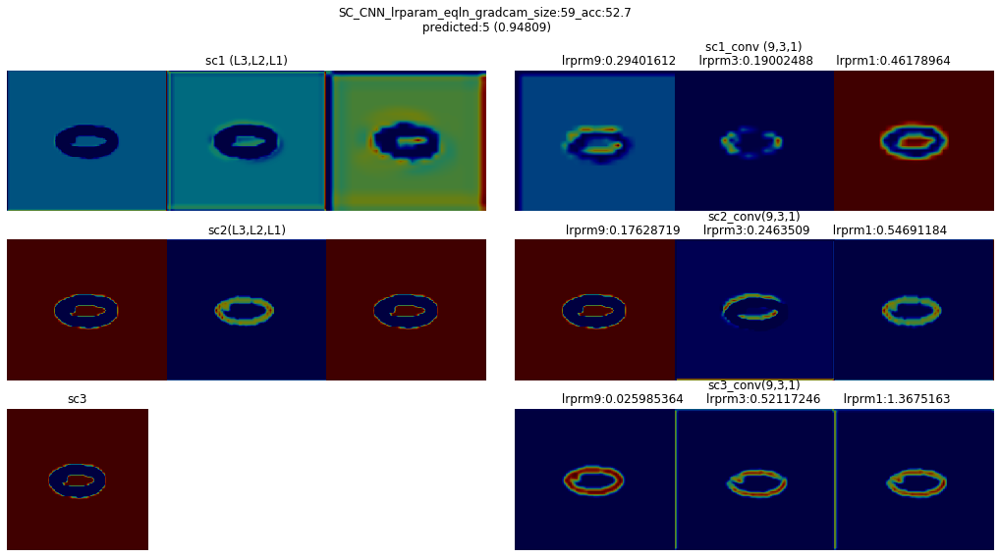


 53%|█████▎    | 59/112 [02:12<02:01,  2.29s/it]

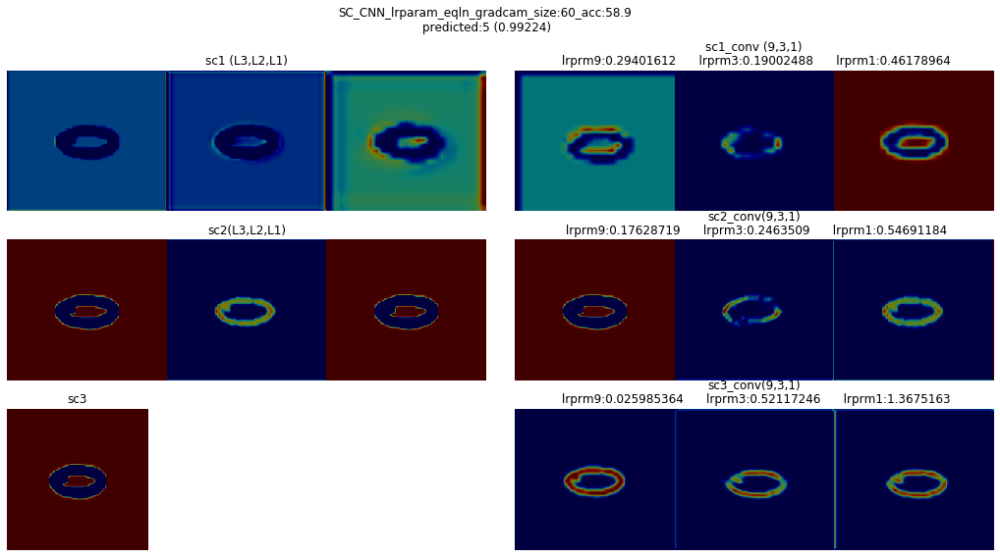


 54%|█████▎    | 60/112 [02:14<01:57,  2.27s/it]

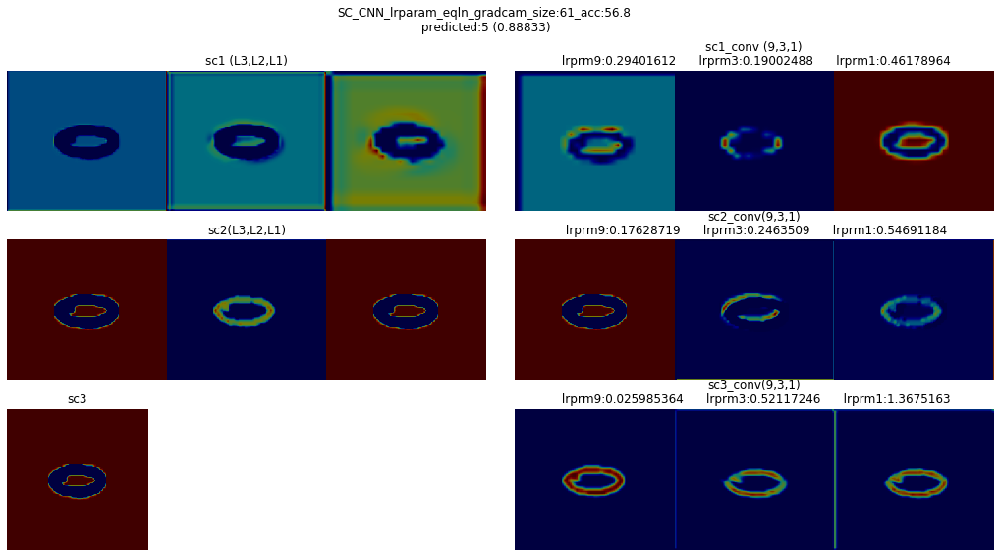


 54%|█████▍    | 61/112 [02:16<01:55,  2.26s/it]

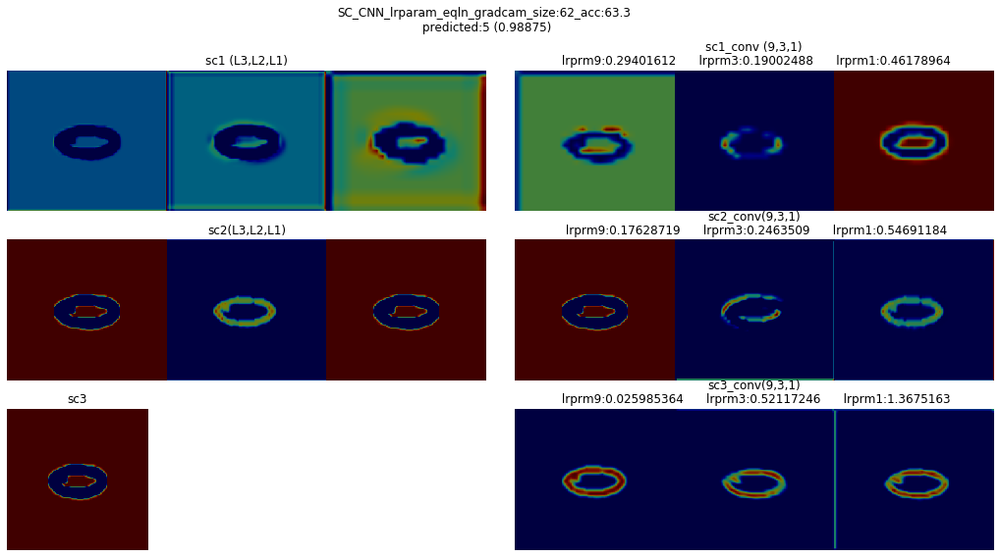


 55%|█████▌    | 62/112 [02:18<01:54,  2.30s/it]

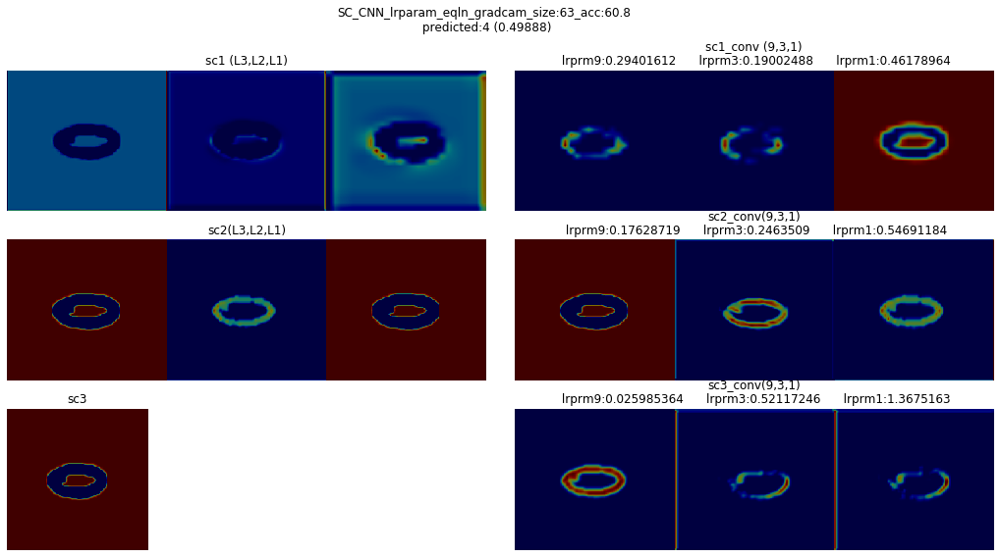


 56%|█████▋    | 63/112 [02:21<01:51,  2.27s/it]

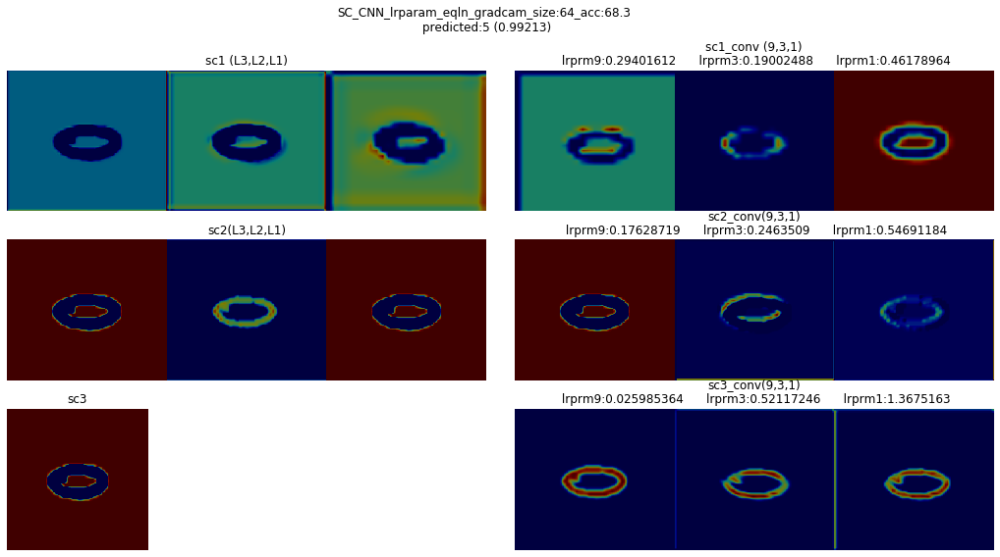


 57%|█████▋    | 64/112 [02:23<01:47,  2.25s/it]

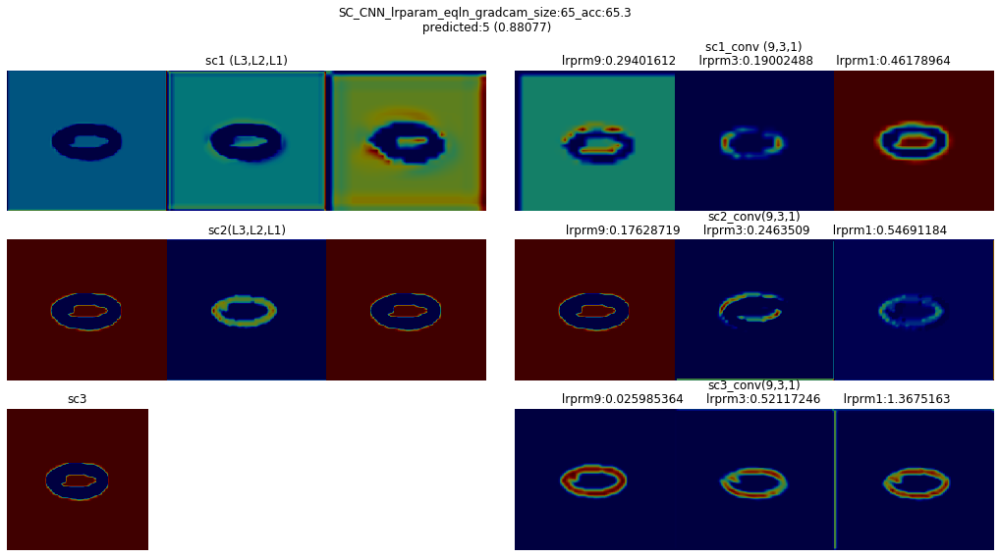


 58%|█████▊    | 65/112 [02:25<01:45,  2.24s/it]

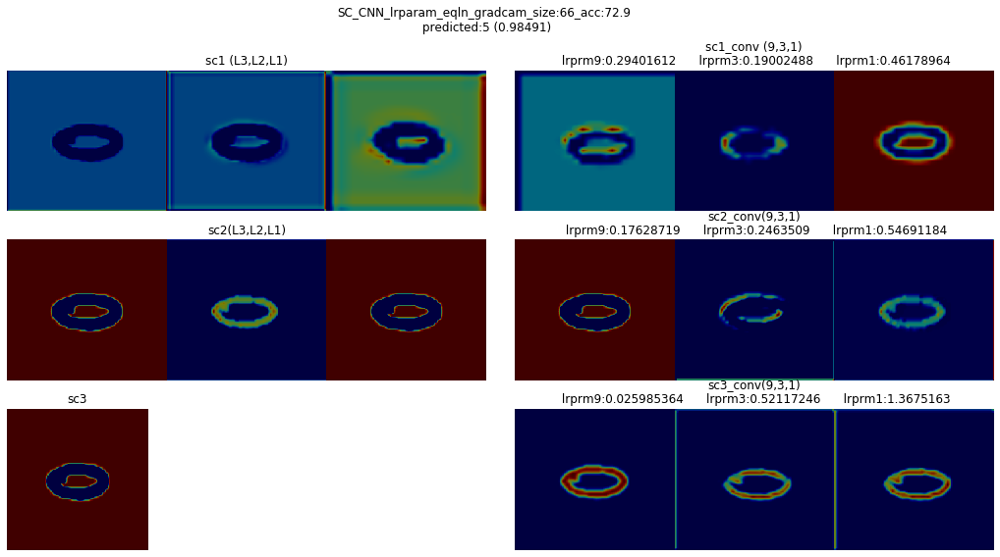


 59%|█████▉    | 66/112 [02:27<01:44,  2.27s/it]

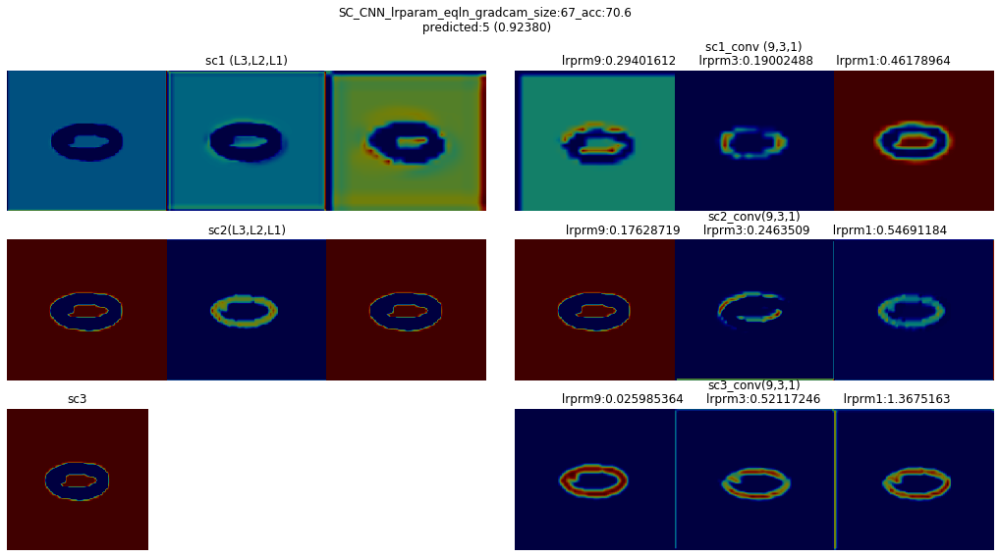


 60%|█████▉    | 67/112 [02:30<01:41,  2.25s/it]

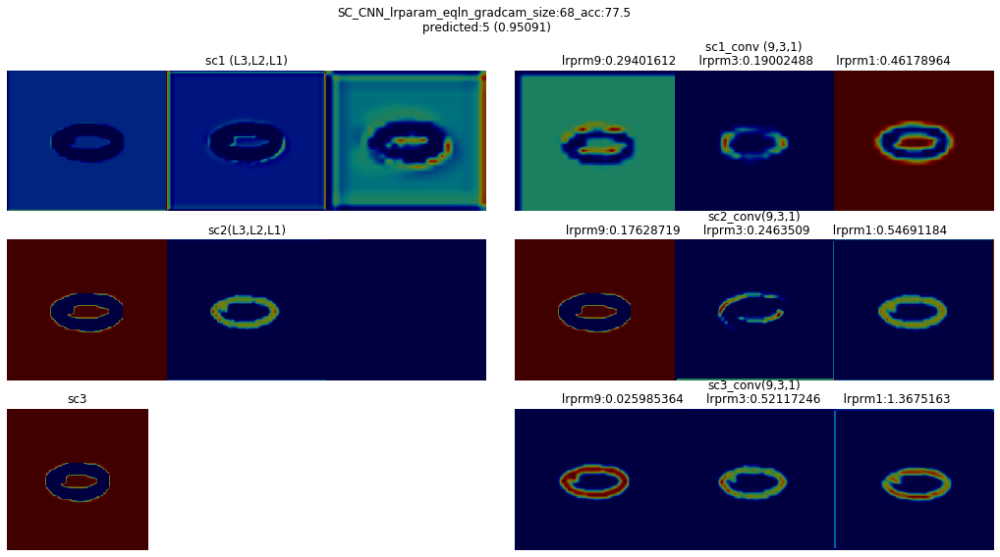


 61%|██████    | 68/112 [02:32<01:37,  2.22s/it]

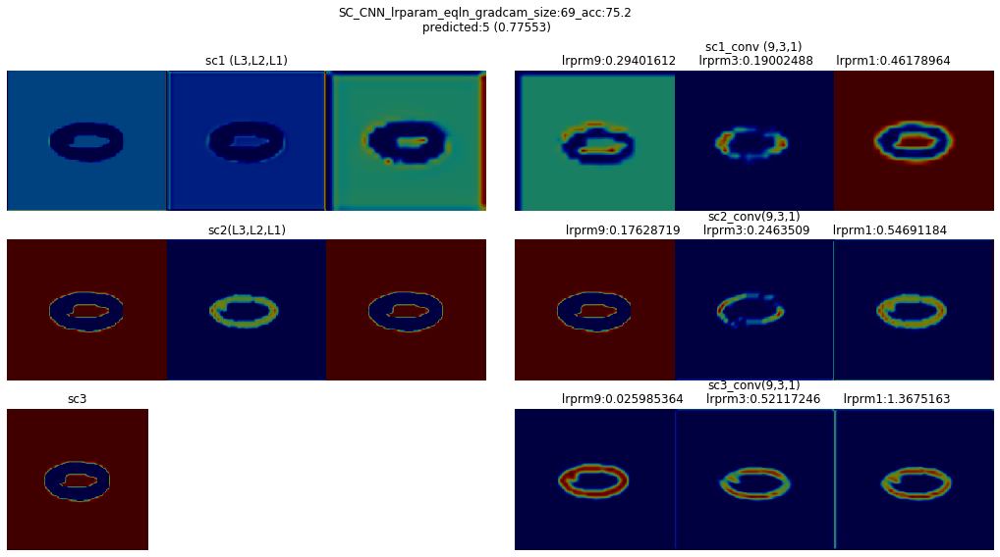


 62%|██████▏   | 69/112 [02:34<01:34,  2.20s/it]

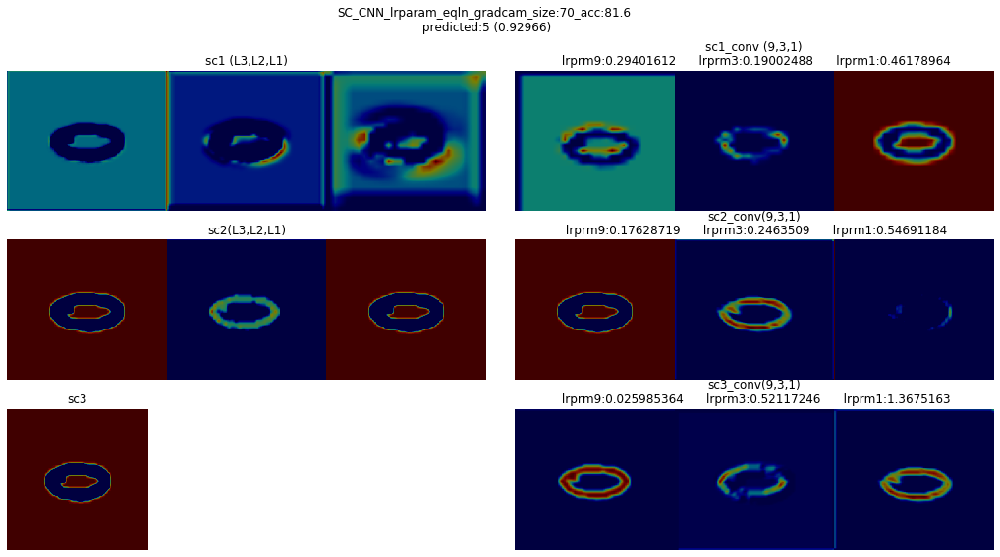


 62%|██████▎   | 70/112 [02:36<01:35,  2.28s/it]

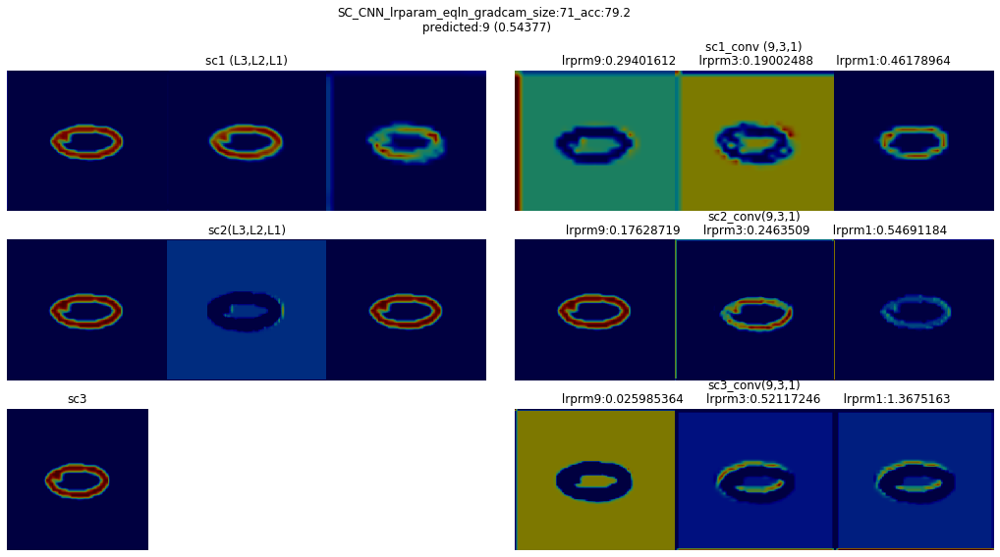


 63%|██████▎   | 71/112 [02:39<01:32,  2.26s/it]

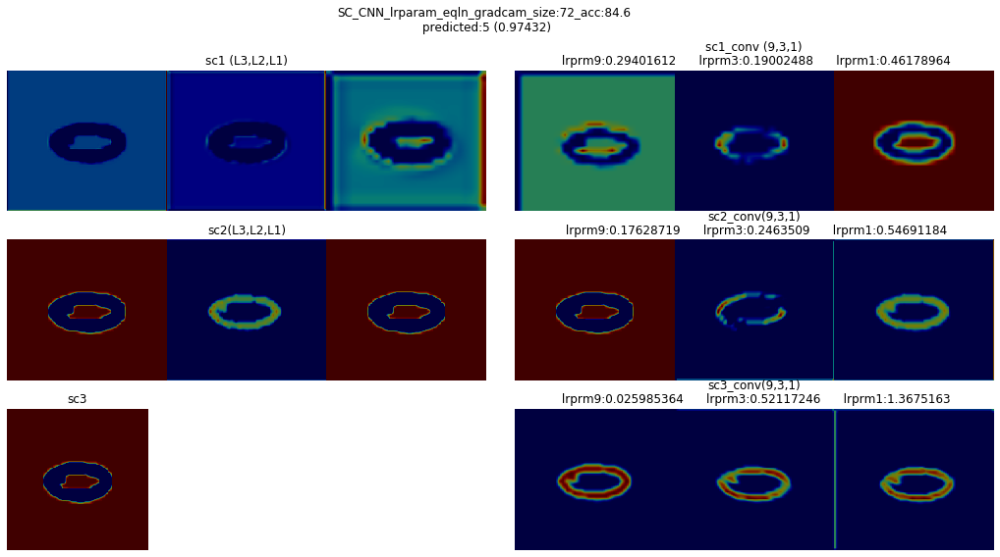


 64%|██████▍   | 72/112 [02:41<01:29,  2.24s/it]

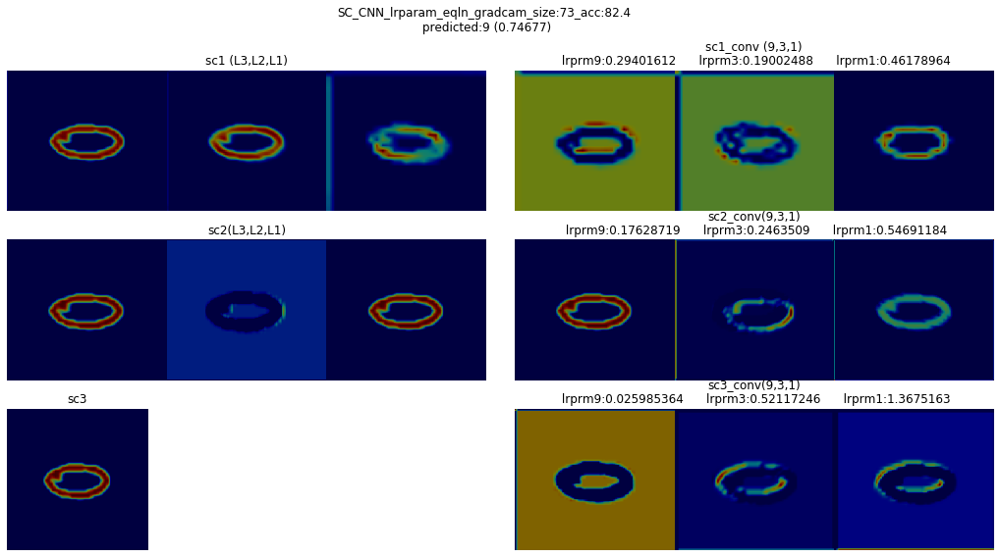


 65%|██████▌   | 73/112 [02:43<01:28,  2.26s/it]

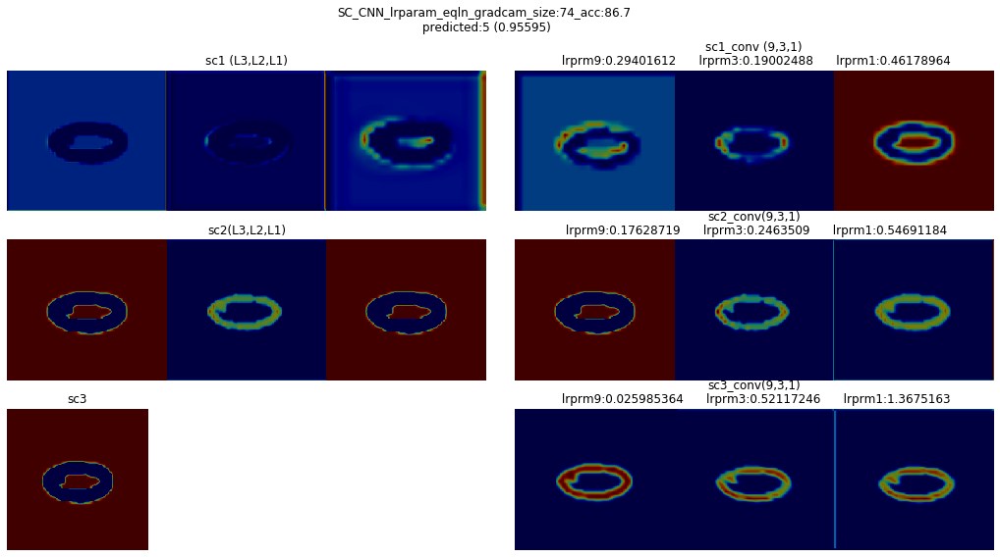


 66%|██████▌   | 74/112 [02:45<01:25,  2.25s/it]

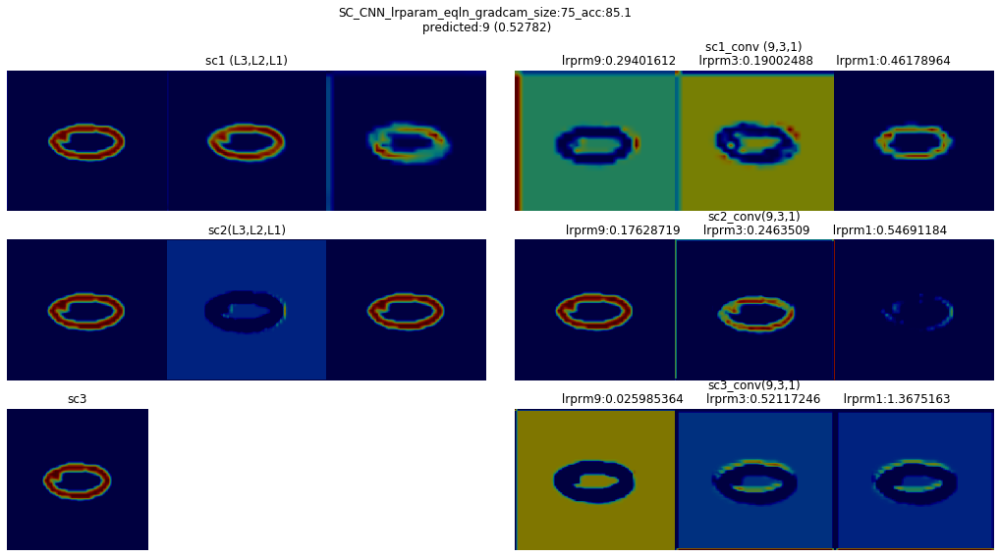


 67%|██████▋   | 75/112 [02:47<01:22,  2.23s/it]

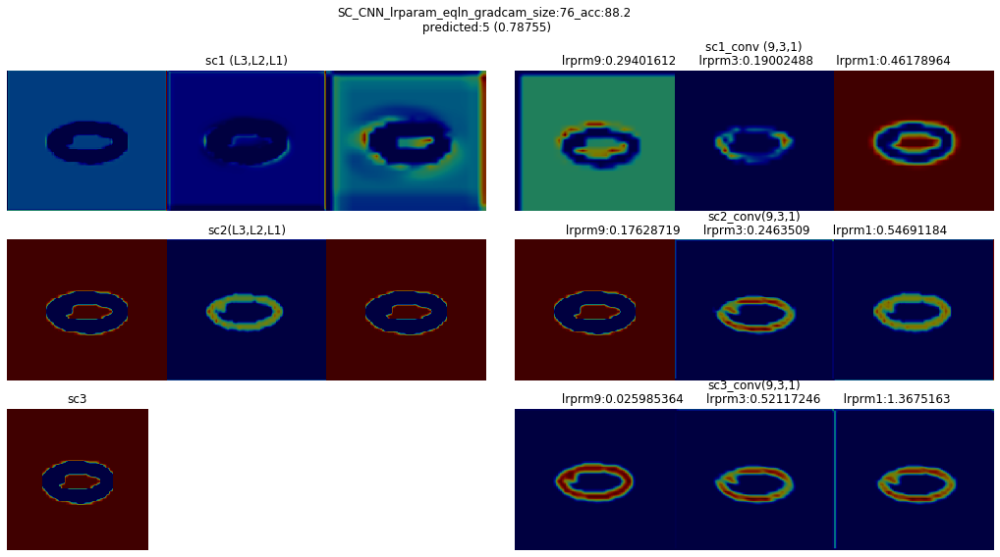


 68%|██████▊   | 76/112 [02:50<01:19,  2.22s/it]

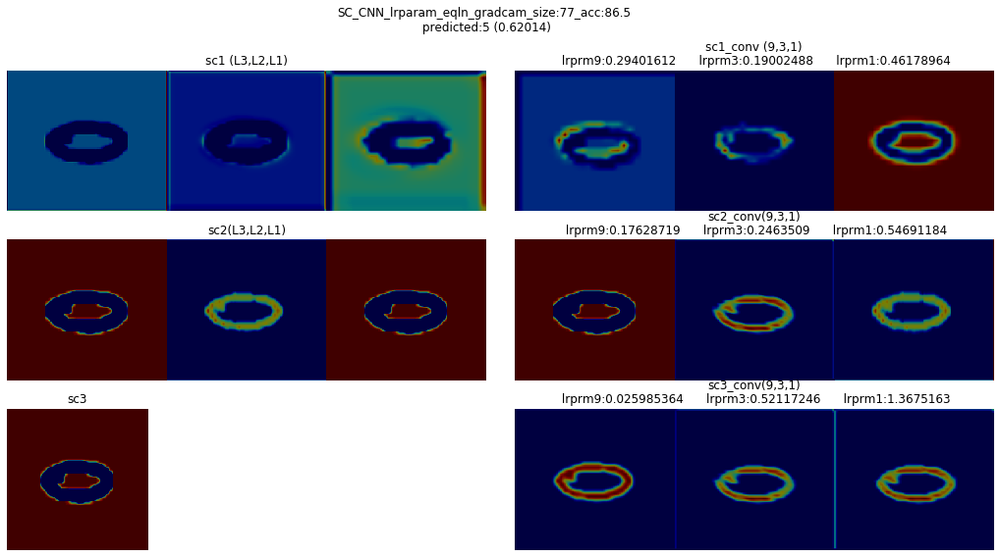


 69%|██████▉   | 77/112 [02:52<01:19,  2.27s/it]

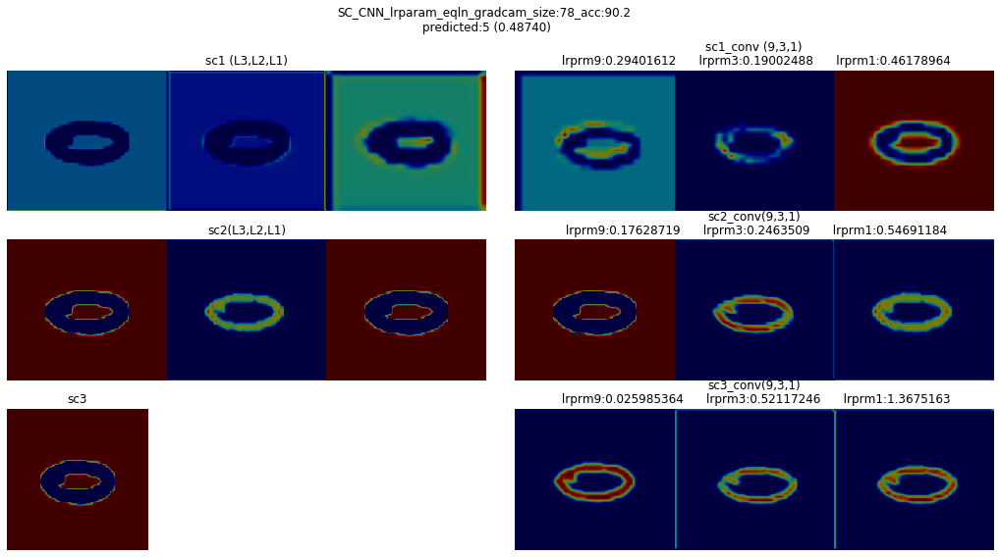


 70%|██████▉   | 78/112 [02:54<01:15,  2.23s/it]

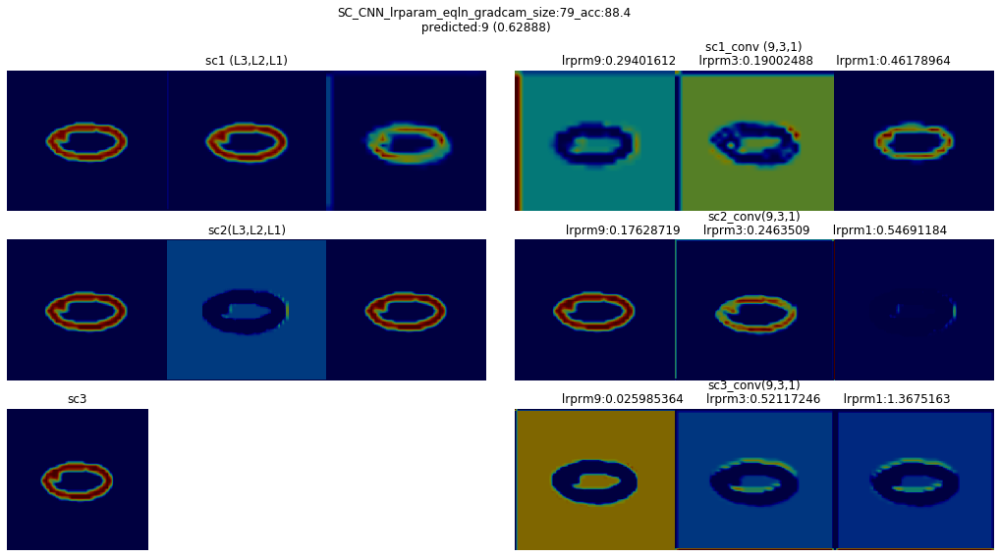


 71%|███████   | 79/112 [02:56<01:13,  2.22s/it]

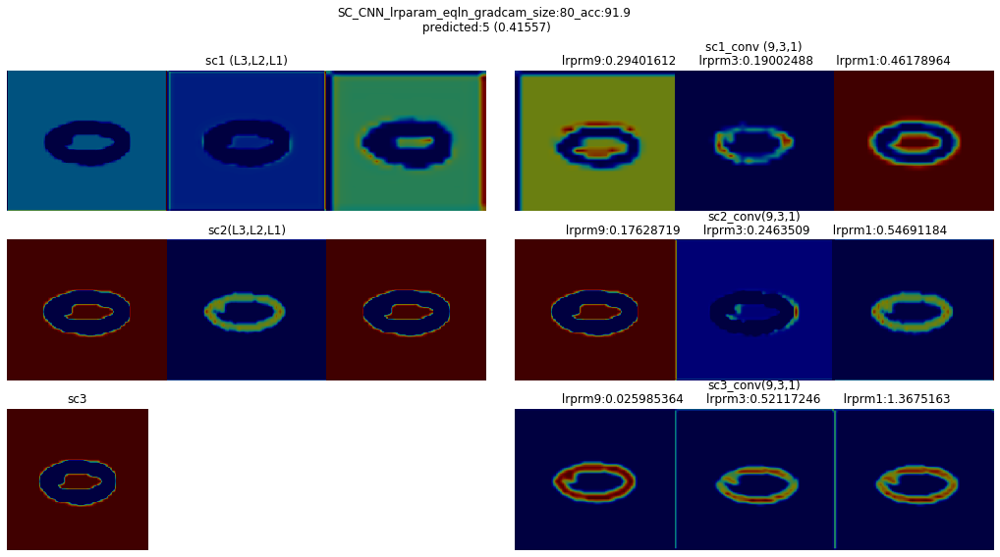


 71%|███████▏  | 80/112 [02:59<01:10,  2.21s/it]

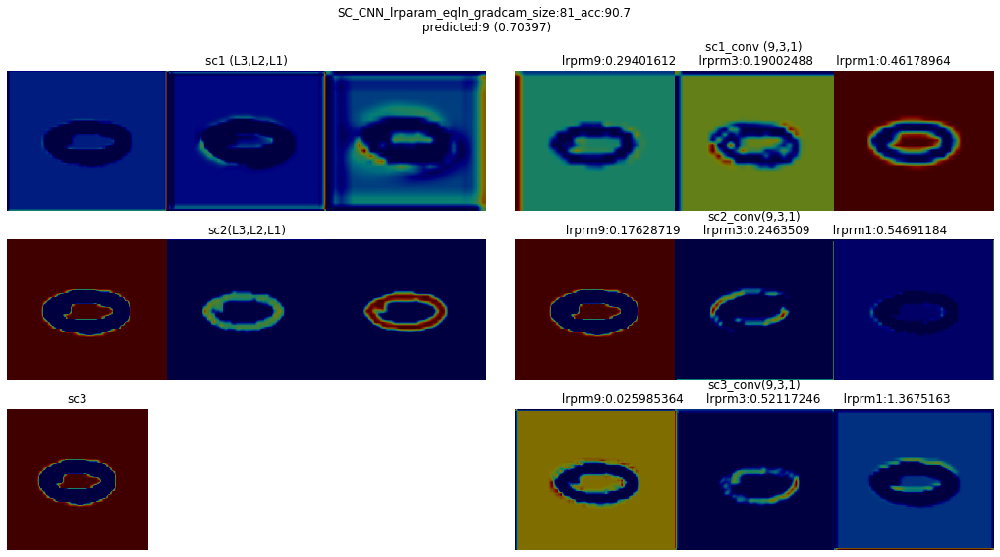


 72%|███████▏  | 81/112 [03:01<01:11,  2.32s/it]

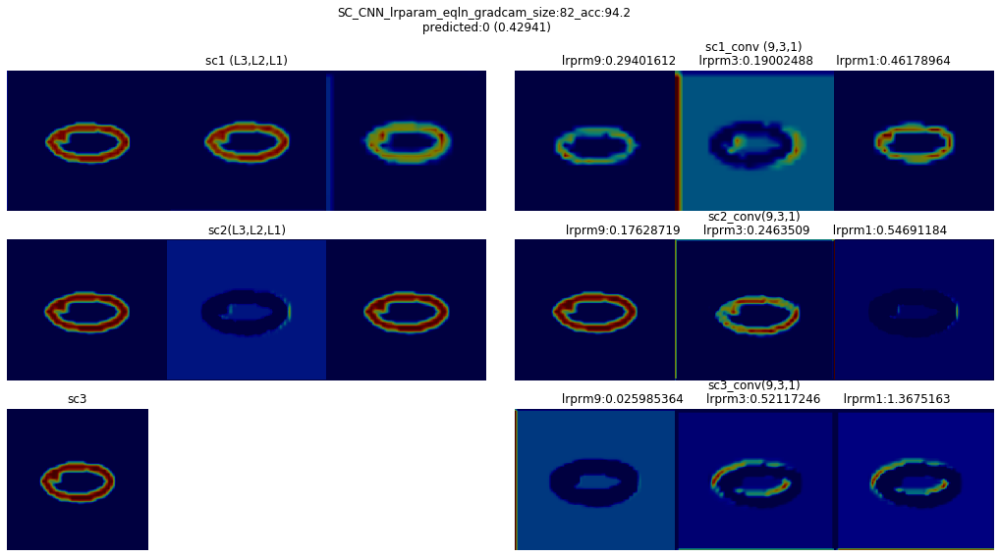


 73%|███████▎  | 82/112 [03:03<01:08,  2.29s/it]

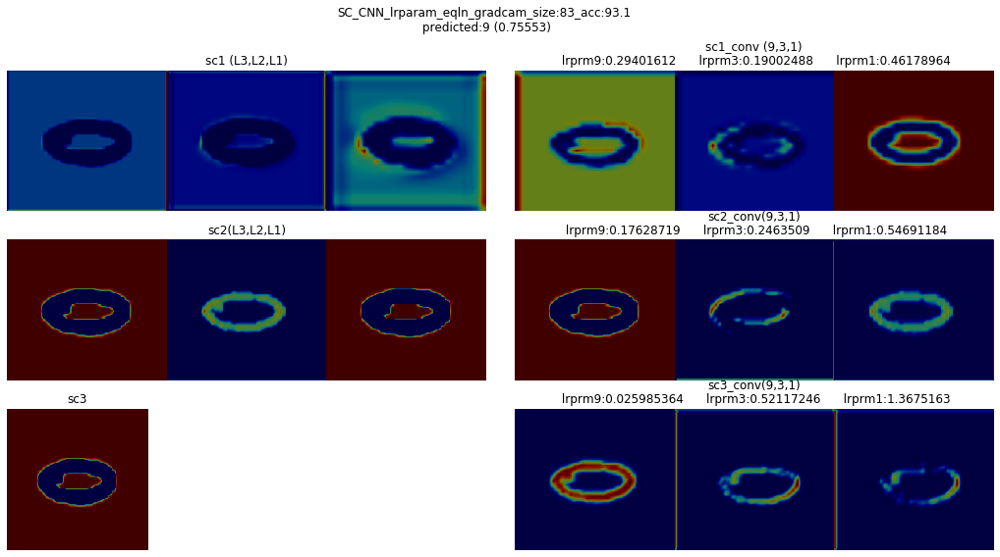


 74%|███████▍  | 83/112 [03:06<01:05,  2.27s/it]

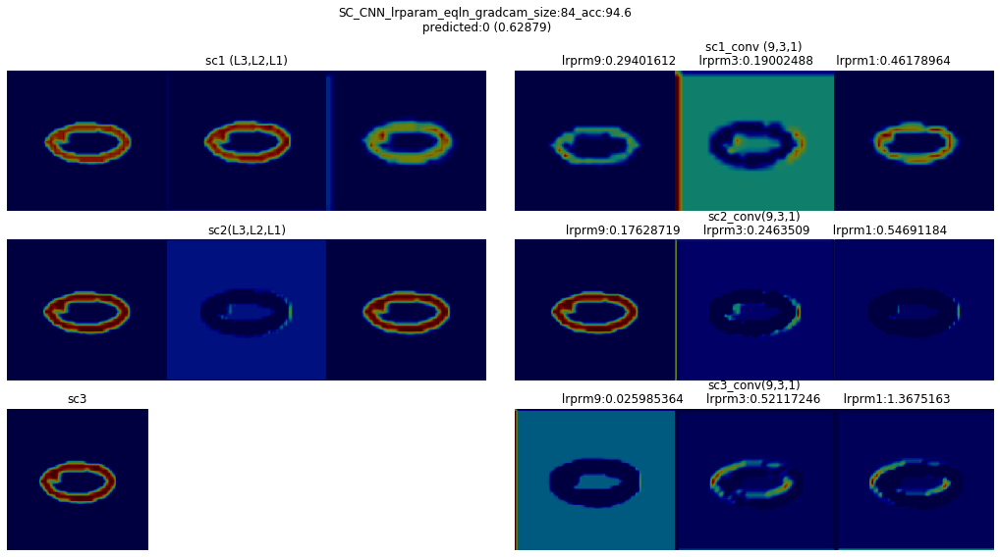


 75%|███████▌  | 84/112 [03:08<01:03,  2.28s/it]

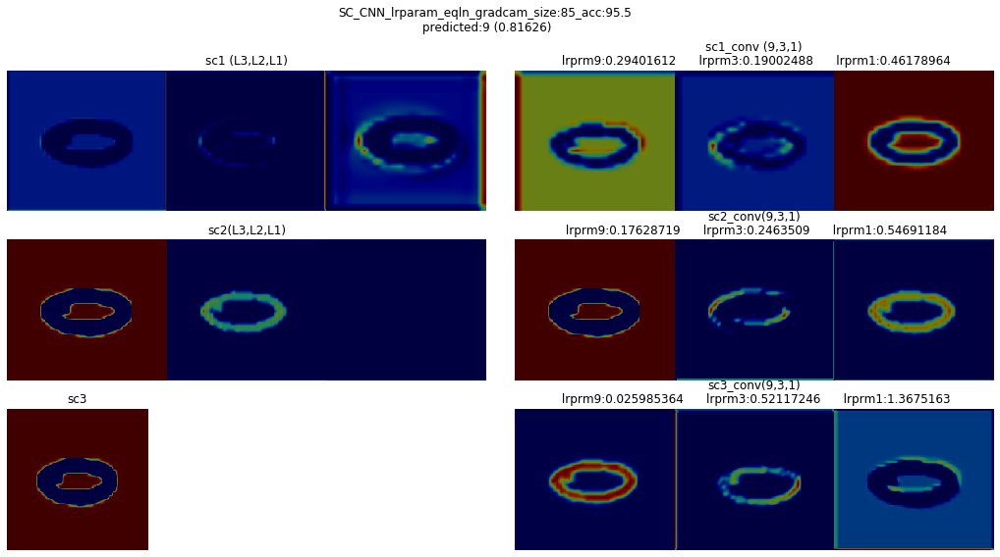


 76%|███████▌  | 85/112 [03:10<01:00,  2.25s/it]

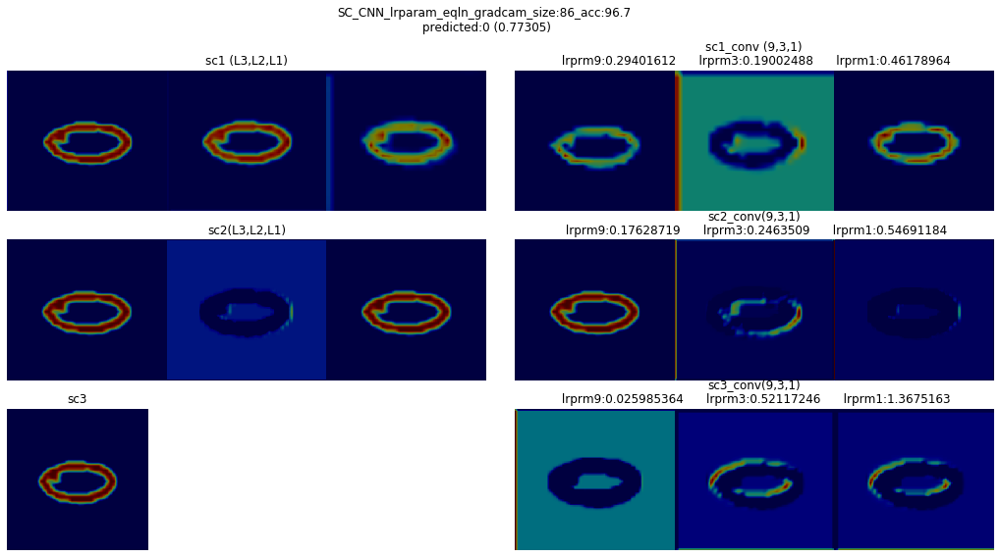


 77%|███████▋  | 86/112 [03:12<00:57,  2.23s/it]

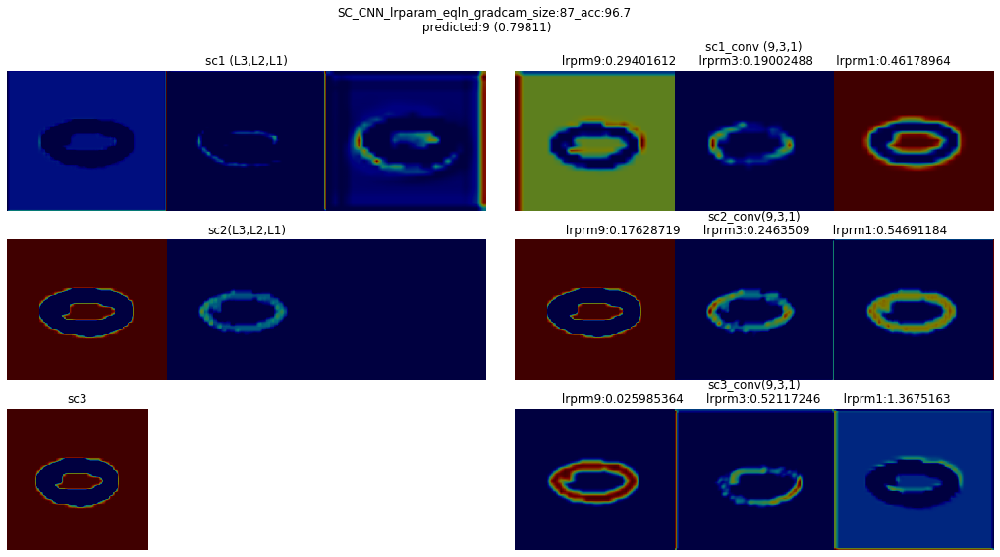


 78%|███████▊  | 87/112 [03:14<00:55,  2.21s/it]

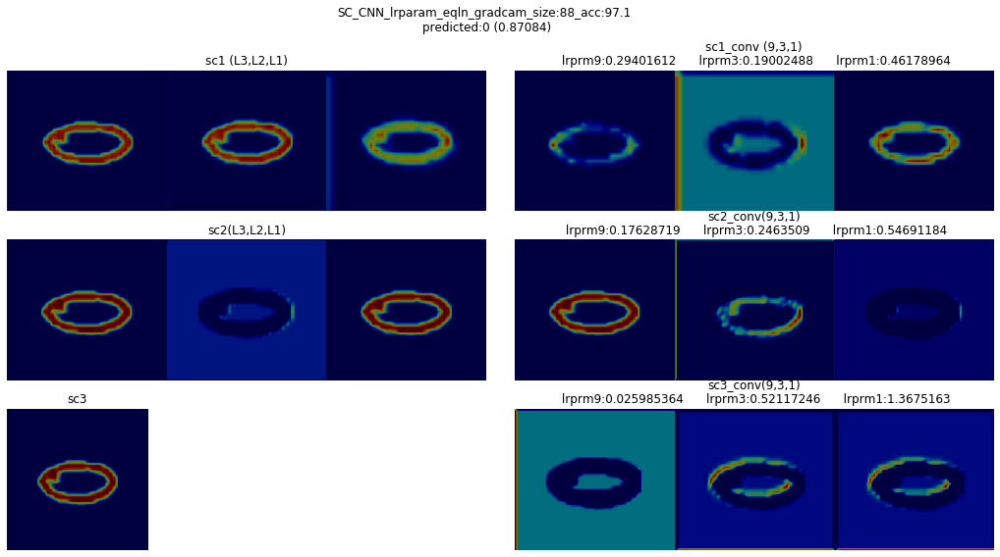


 79%|███████▊  | 88/112 [03:17<00:53,  2.25s/it]

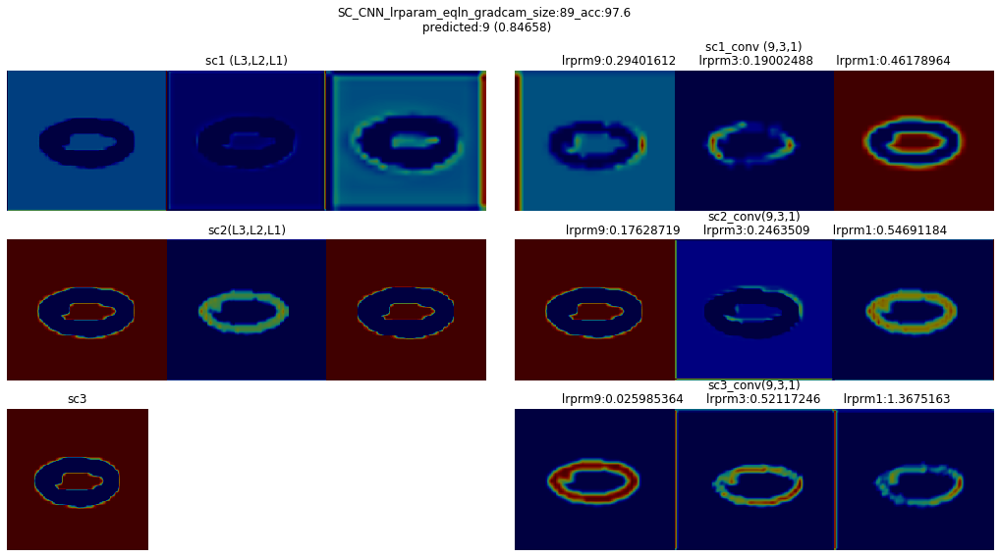


 79%|███████▉  | 89/112 [03:19<00:51,  2.24s/it]

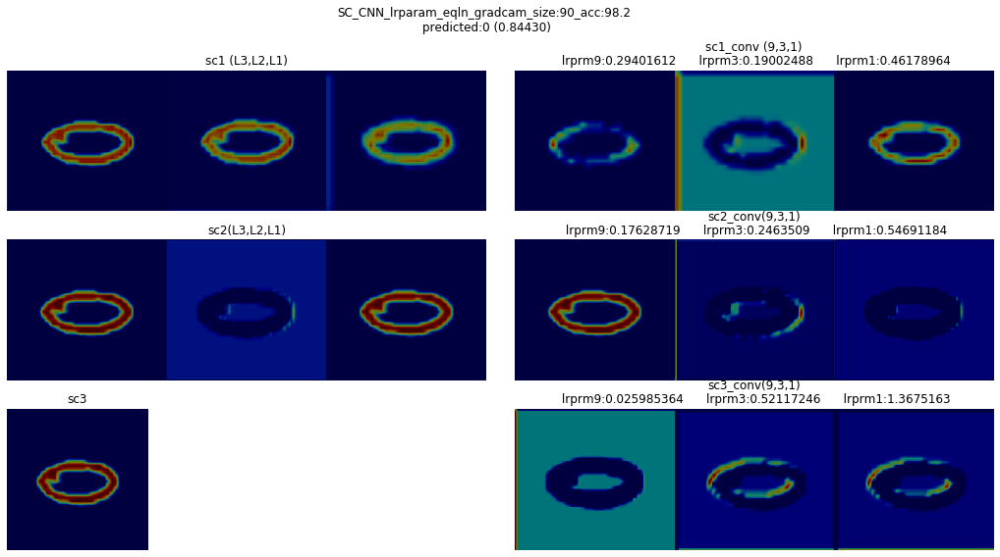


 80%|████████  | 90/112 [03:21<00:49,  2.24s/it]

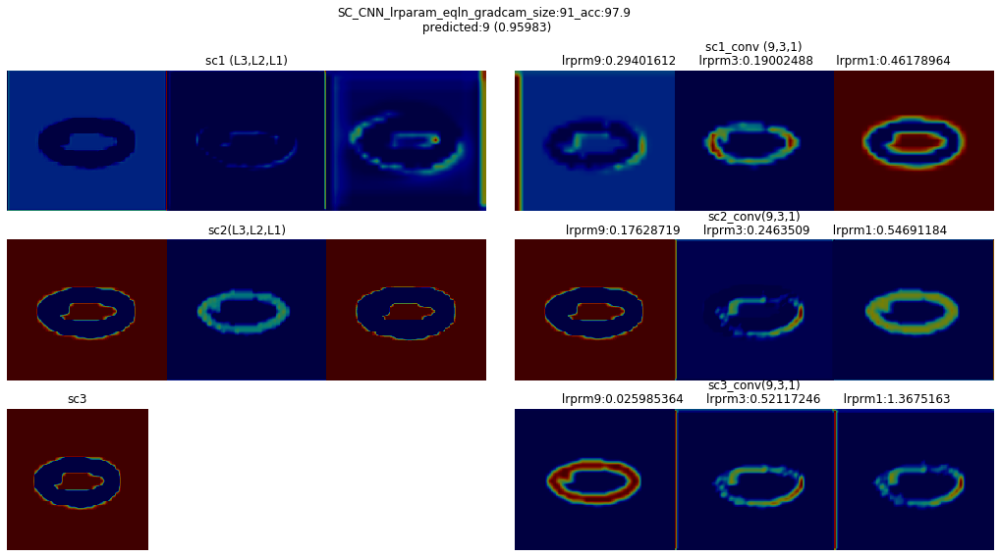


 81%|████████▏ | 91/112 [03:23<00:46,  2.23s/it]

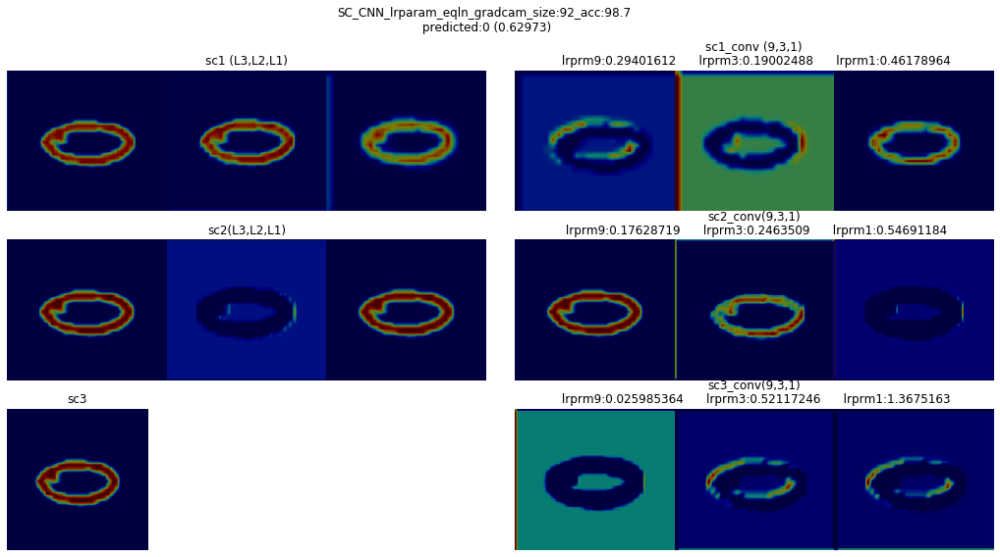


 82%|████████▏ | 92/112 [03:26<00:48,  2.42s/it]

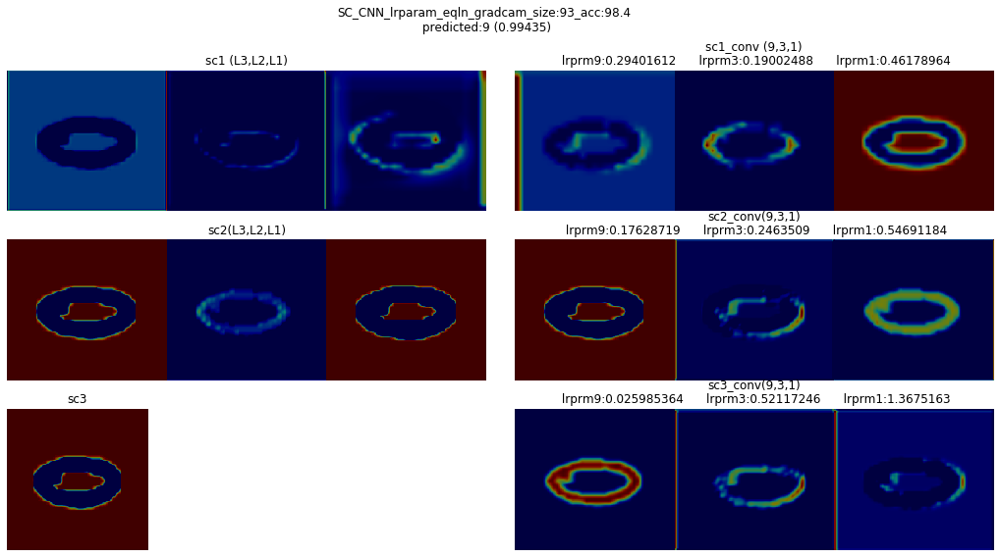


 83%|████████▎ | 93/112 [03:28<00:44,  2.35s/it]

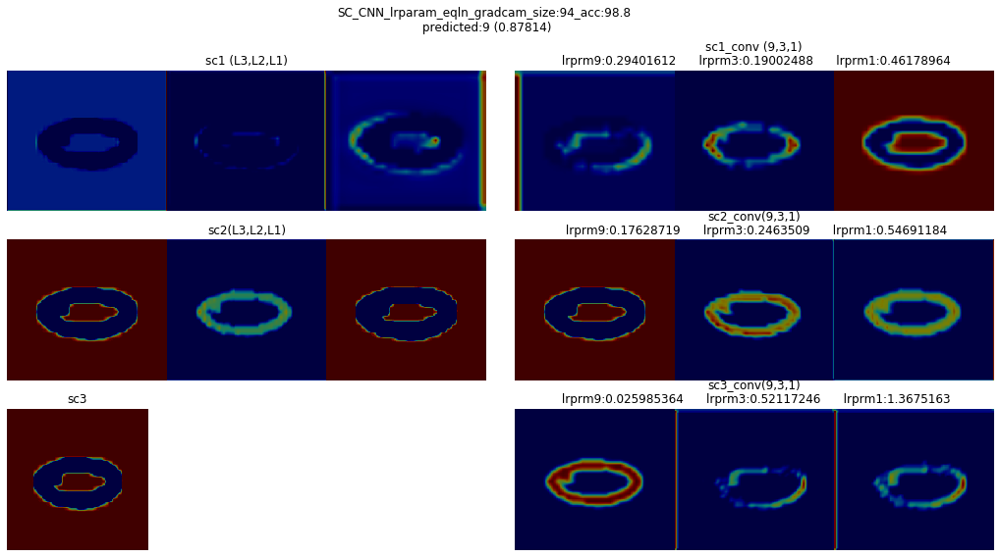


 84%|████████▍ | 94/112 [03:31<00:41,  2.31s/it]

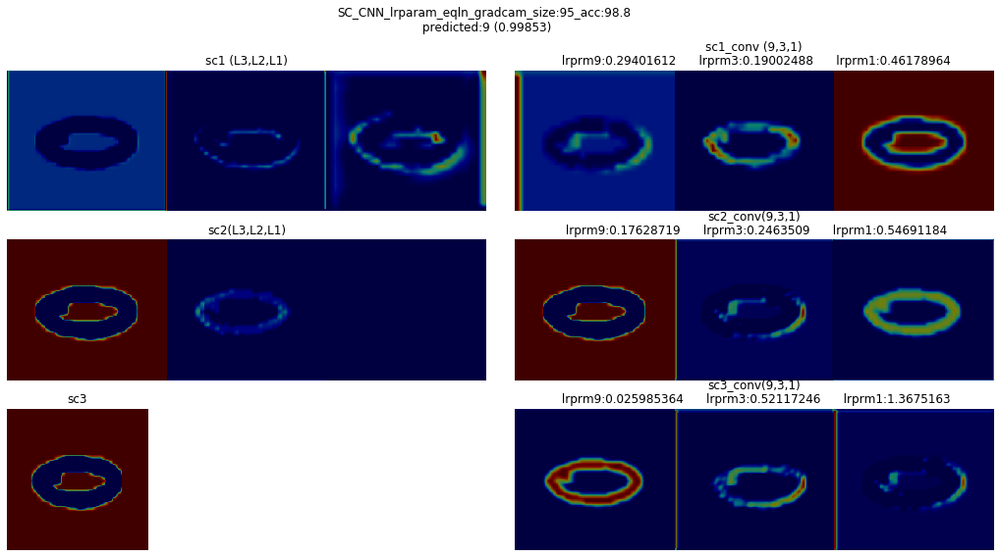


 85%|████████▍ | 95/112 [03:33<00:39,  2.32s/it]

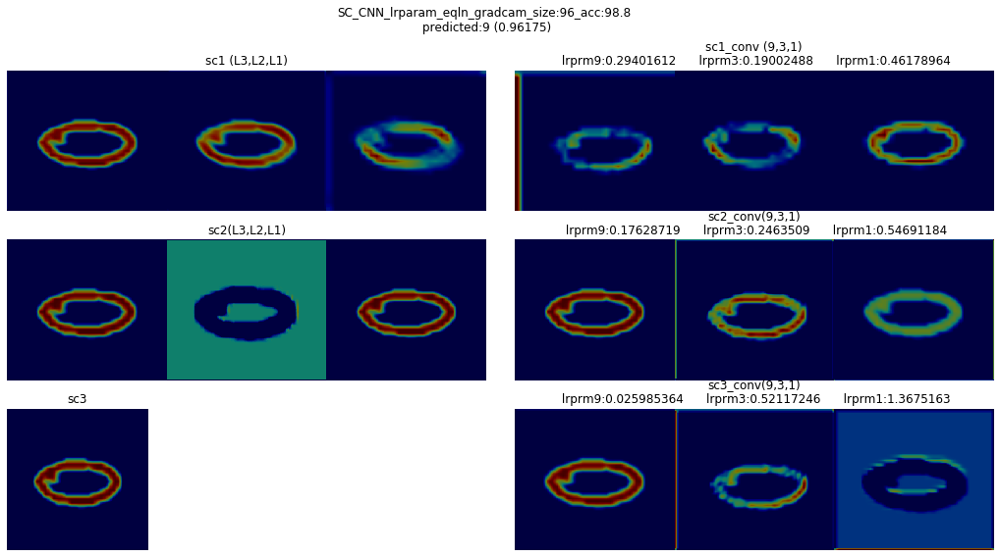


 86%|████████▌ | 96/112 [03:35<00:36,  2.29s/it]

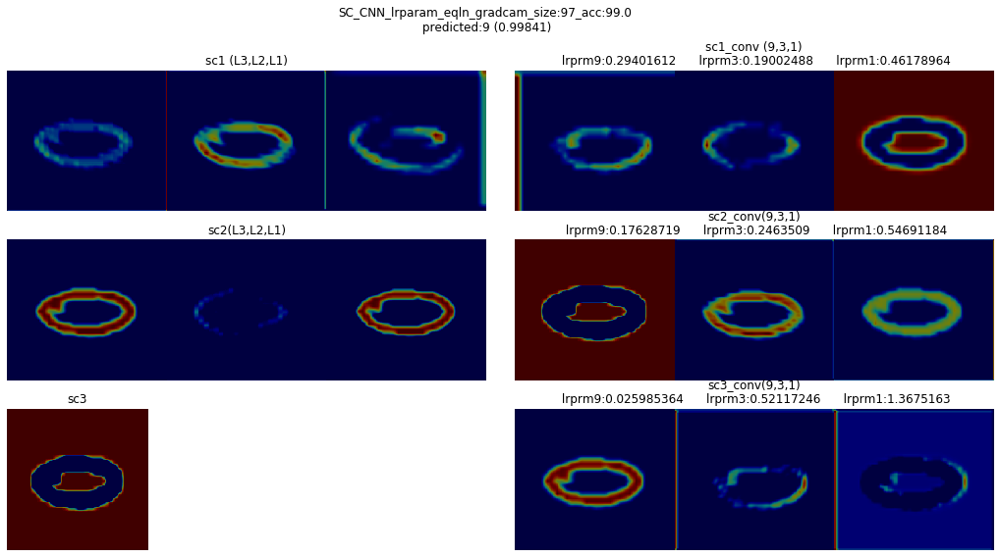


 87%|████████▋ | 97/112 [03:37<00:33,  2.26s/it]

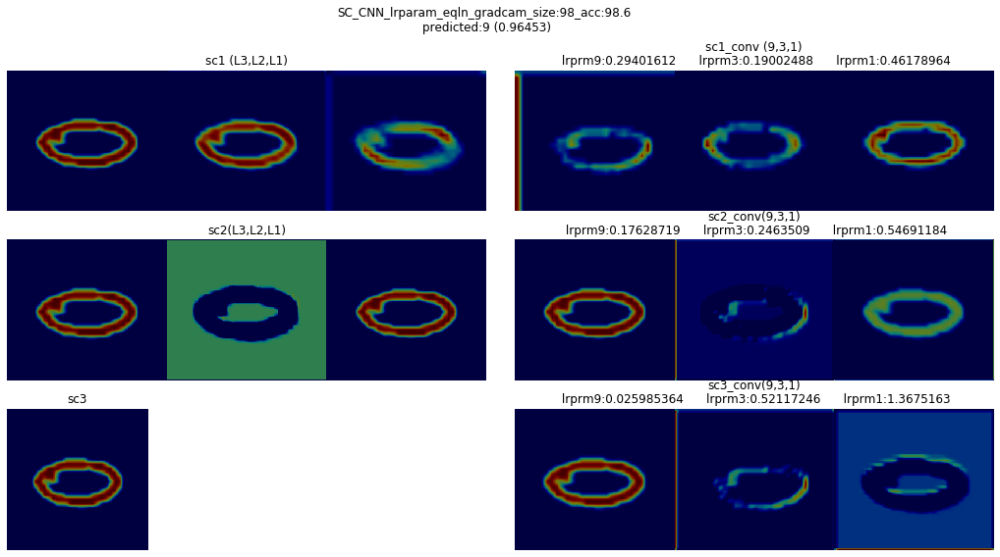


 88%|████████▊ | 98/112 [03:40<00:31,  2.24s/it]

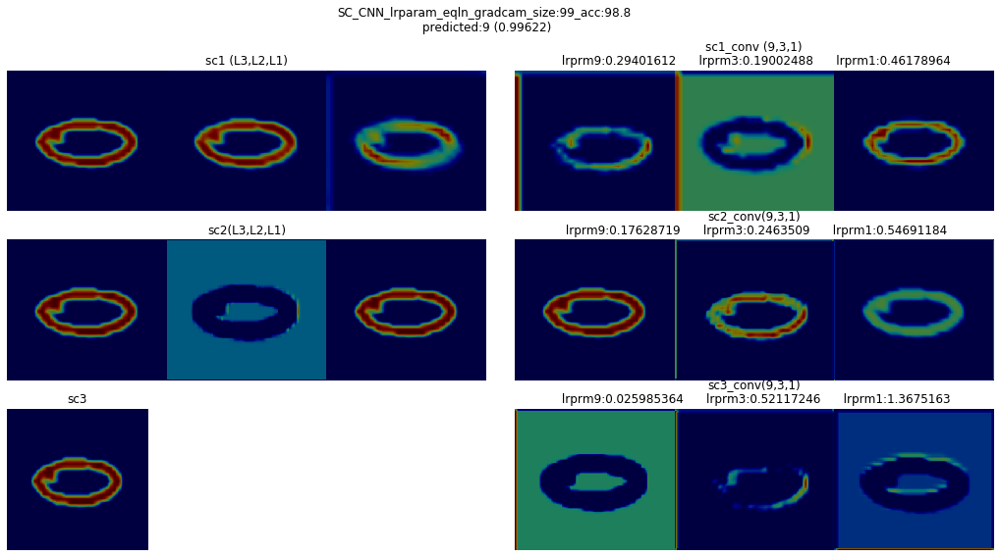


 88%|████████▊ | 99/112 [03:42<00:29,  2.28s/it]

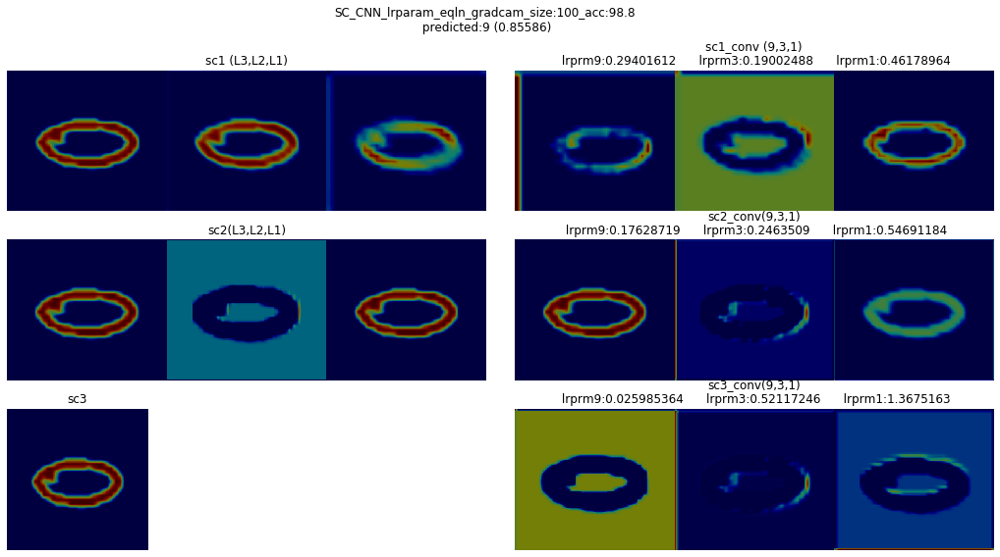


 89%|████████▉ | 100/112 [03:44<00:27,  2.27s/it]

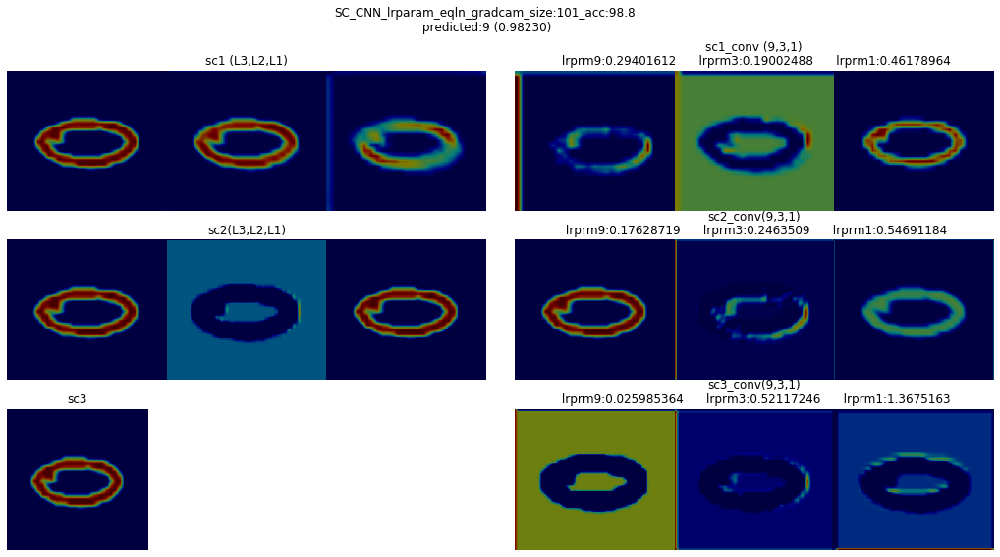


 90%|█████████ | 101/112 [03:47<00:24,  2.27s/it]

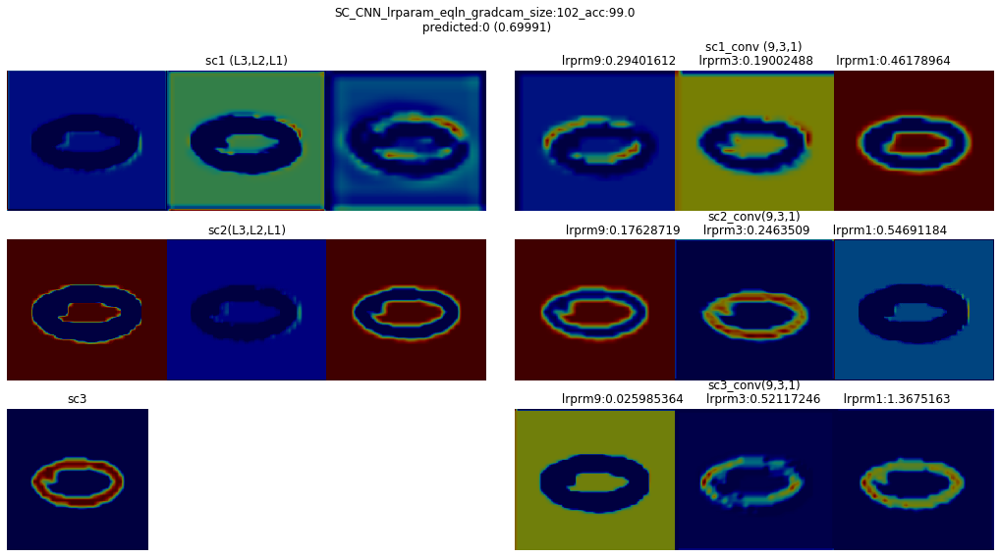


 91%|█████████ | 102/112 [03:49<00:22,  2.25s/it]

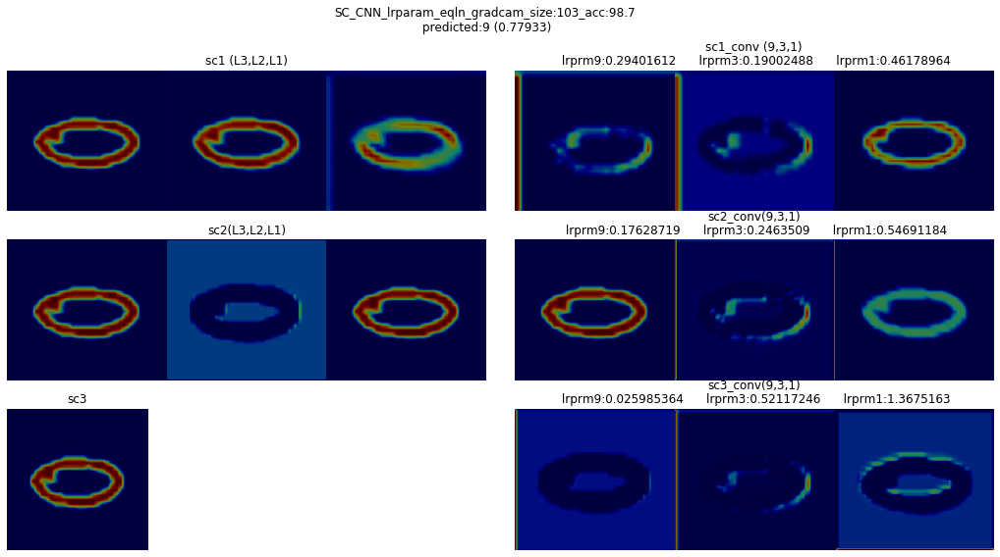


 92%|█████████▏| 103/112 [03:52<00:21,  2.44s/it]

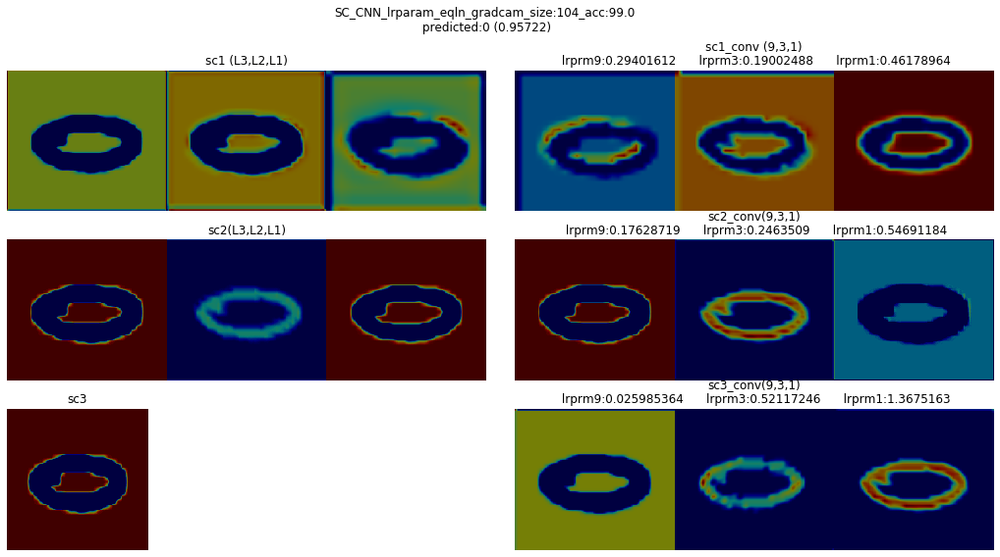


 93%|█████████▎| 104/112 [03:54<00:18,  2.36s/it]

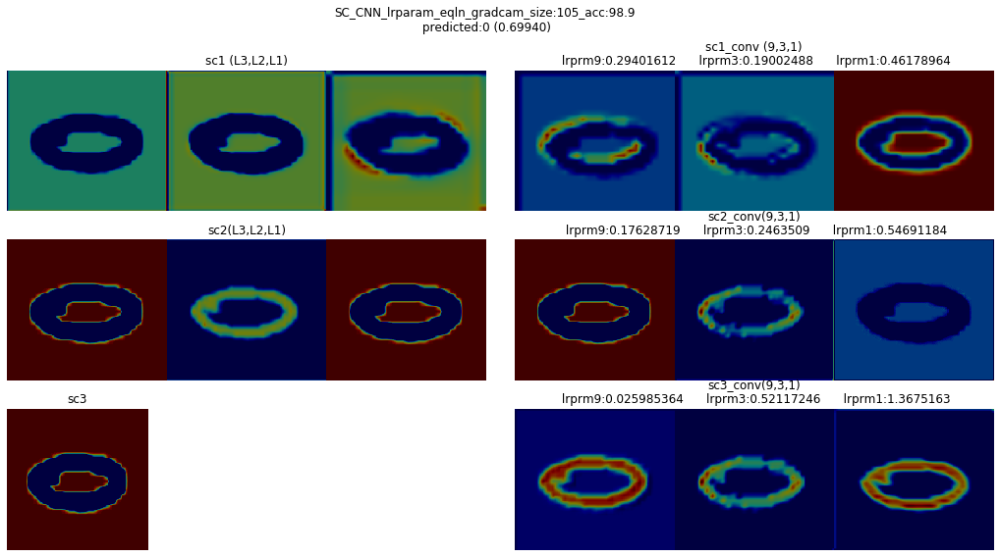


 94%|█████████▍| 105/112 [03:56<00:16,  2.31s/it]

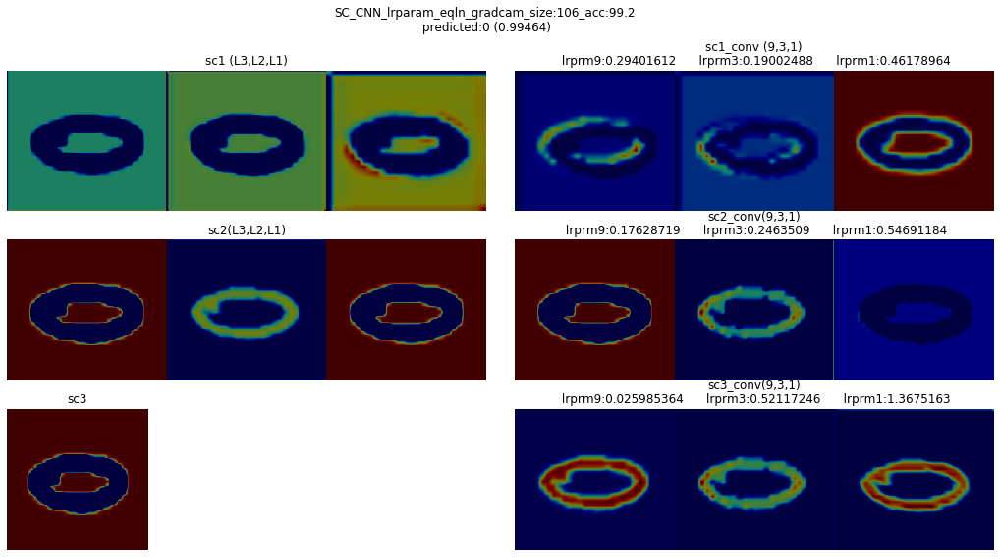


 95%|█████████▍| 106/112 [03:58<00:13,  2.32s/it]

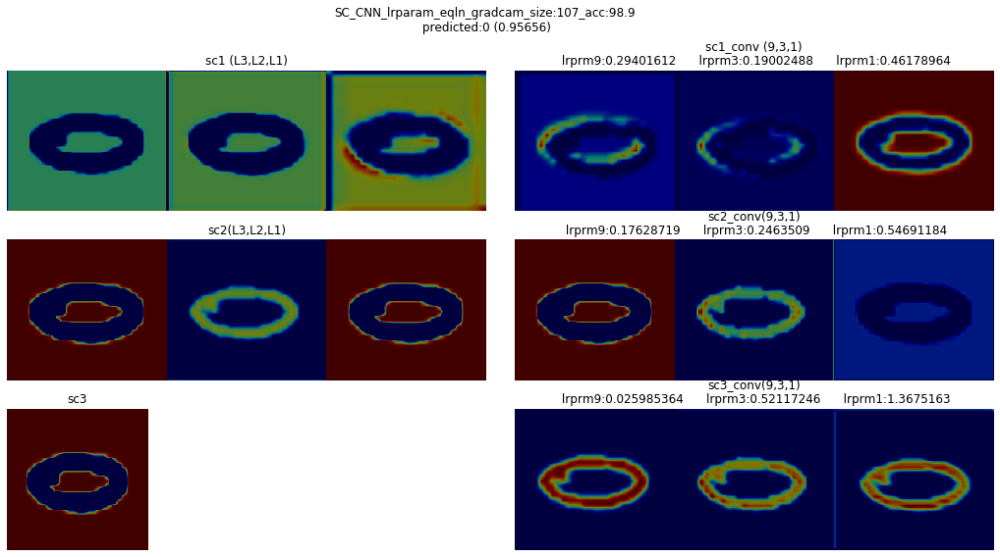


 96%|█████████▌| 107/112 [04:01<00:11,  2.30s/it]

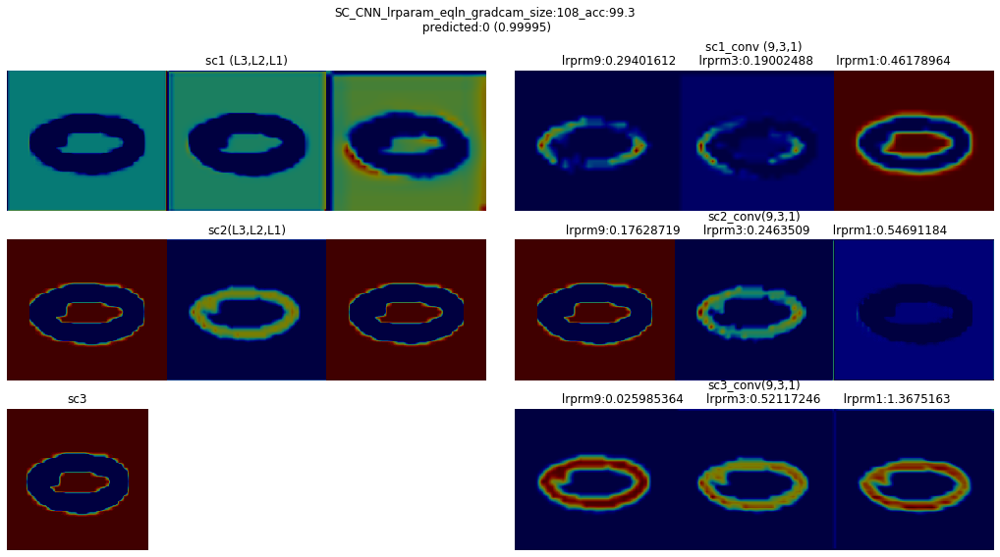


 96%|█████████▋| 108/112 [04:03<00:09,  2.27s/it]

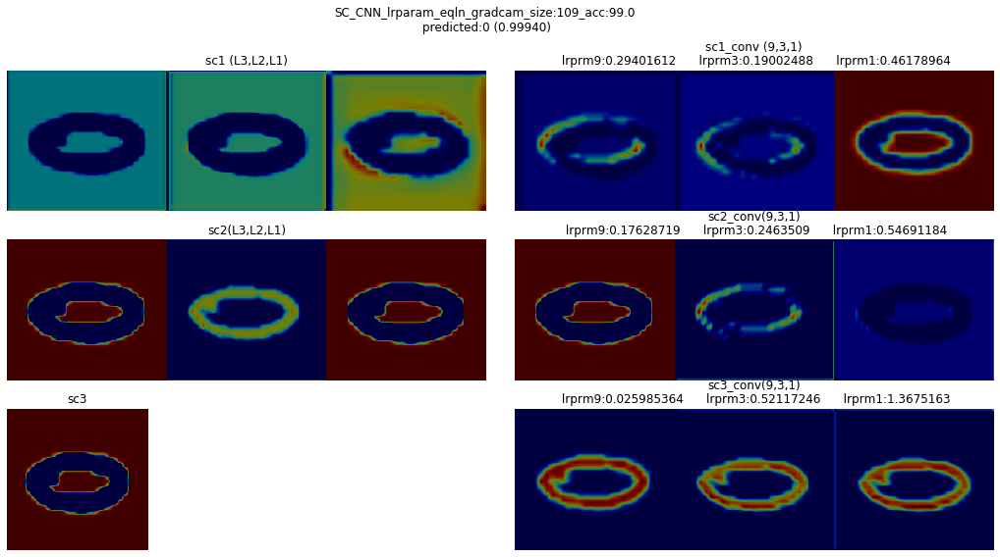


 97%|█████████▋| 109/112 [04:05<00:06,  2.25s/it]

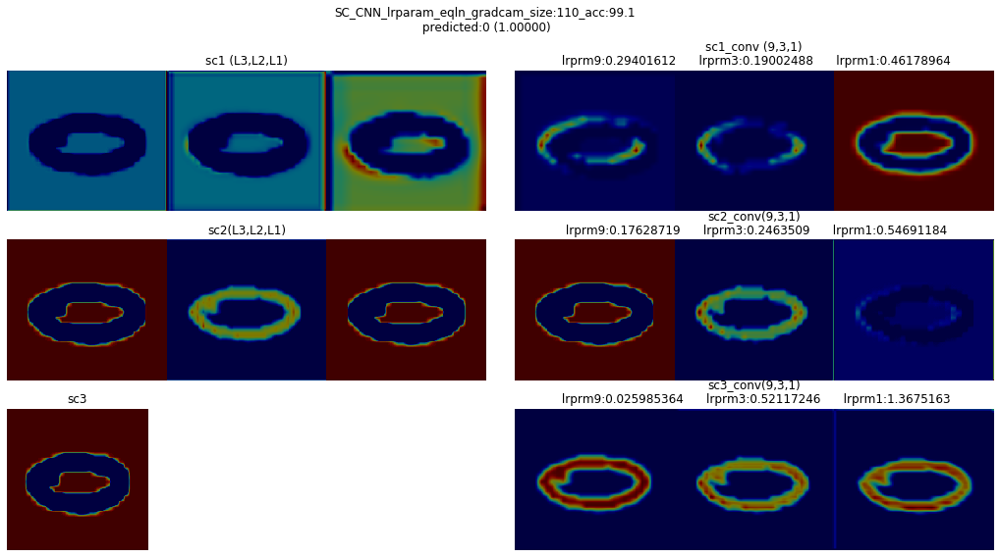


 98%|█████████▊| 110/112 [04:07<00:04,  2.27s/it]

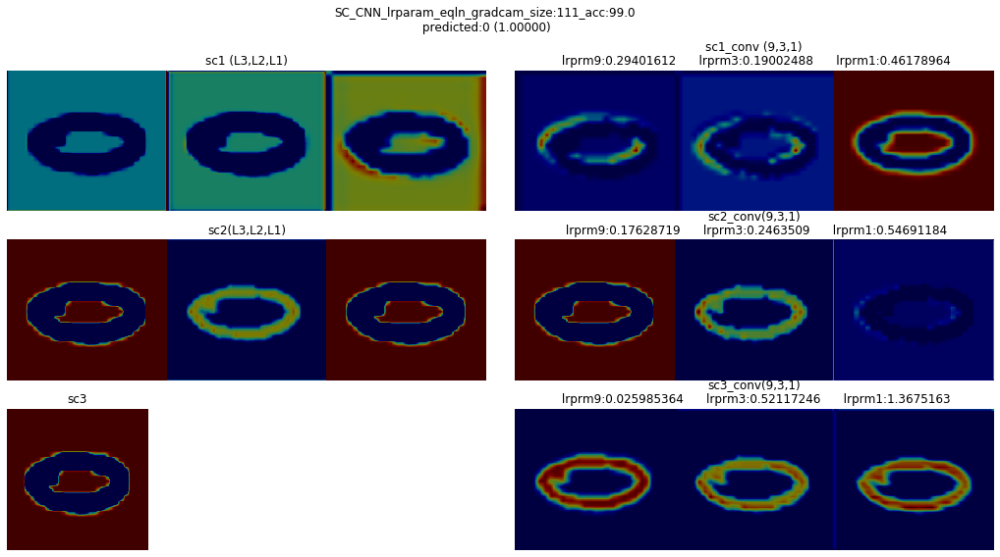


 99%|█████████▉| 111/112 [04:10<00:02,  2.26s/it]

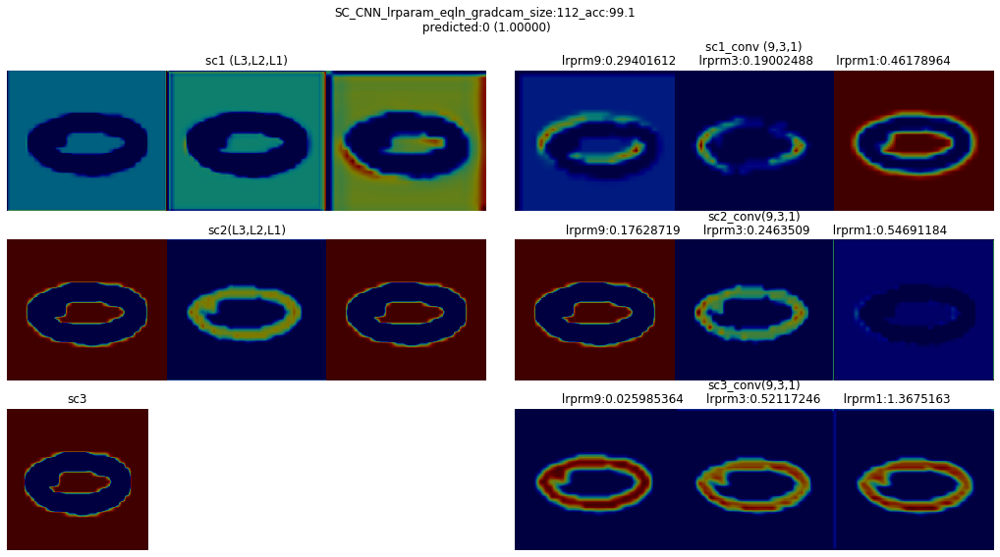


100%|██████████| 112/112 [04:12<00:00,  2.25s/it]


In [61]:
from matplotlib import gridspec

model1.eval()
model2.eval()
gcam = GradCAM(model=model1)
gbp = GuidedBackPropagation(model=model2)

gridspec.GridSpec(3,6)

imsize = 1
for testloader in tqdm(gradcam_gen_arr):
    for images in testloader:
        v1 = images[0][0].to(device)
        val_labels = images[0][1].to(device)
        break

    _ = gcam.forward(v1)
    probs,ids = gbp.forward(v1)

    gcam.backward(ids=ids[:,[0]])
    gbp.backward(ids=ids[:,[0]])

    grad_img = []

    for j in range(len(v1)):
        grad_img.append([])
        for name, module in model1.named_modules():
            #print(name)
            if name == '' or name == 'module' or name == 'module.fc1' or name == 'module.fc2' or name == 'module.fc3' or name == 'module.prepool1' or name == 'module.prepool2':
                continue
            regions = gcam.generate(target_layer=name)
            gradients = gbp.generate()
            #print(regions[j,0])
            if name == 'module.sc1' or name == 'module.sc2':
                grad_img[j].append(show_gradcam(gcam=regions[0][j,0],raw_image=imshow(v1[j].cpu()),show=False))
                grad_img[j].append(show_gradcam(gcam=regions[1][j,0],raw_image=imshow(v1[j].cpu()),show=False))
                grad_img[j].append(show_gradcam(gcam=regions[2][j,0],raw_image=imshow(v1[j].cpu()),show=False))
            else:
                grad_img[j].append(show_gradcam(gcam=regions[j,0],raw_image=imshow(v1[j].cpu()),show=False))

    img_num = [0,1,2,3,4,5,15,16,17,18,19,20,31,32,33,34]
    col_num = [3,3,3,3,1,3]
    title = ['sc1 (L3,L2,L1)','sc1_conv (9,3,1)','sc2(L3,L2,L1)','sc2_conv(9,3,1)','sc3','sc3_conv(9,3,1)']
    size = 243
    
    scale = 3./size
    plt.figure(figsize=(18,9))
    plt.suptitle('SC_CNN_lrparam_eqln_gradcam'+'_size:'+str(imsize)+'_acc:'+str(temp_acc[imsize-1])+'\n predicted:{} ({:.5f})'.format(ids[0, 0], probs[0, 0]))
    num = 0
    for i in range(len(col_num)):
        display_grid = np.zeros((243,243*col_num[i],3)).astype(np.uint8)
        for row in range(col_num[i]):
            display_grid[:size,row*size : (row+1)*size,:3] = grad_img[0][num]
            num = num+1
        if i == 4:
            plt.subplot2grid((3,6), (i//2,(i%2)*3),colspan = 1,rowspan=1)
        else:
            plt.subplot2grid((3,6), (i//2,(i%2)*3),colspan = 3,rowspan=1)
        plt.axis('off')
        if i%2 == 0:
            plt.title(title[i])
        else:
            plt.title(title[i]+'\n lrprm9:'+str(lrparam_value[0+(i//2)*3])+'      lrprm3:'+str(lrparam_value[1+(i//2)*3])+'      lrprm1:'+str(lrparam_value[2+(i//2)*3]))
        plt.grid(False)
        plt.imshow(display_grid,aspect='auto')
    plt.savefig('lrparam_eqln_gradcam_img/pltgrad'+str(imsize)+'.png')
    plt.show()
    imsize = imsize+1

In [40]:
import cv2

frame_array = []
for i in range(1,113):
    filename='lrparam_eqln_gradcam_img/pltgrad' + str(i)+'.png'
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    
    #inserting the frames into an image array
    frame_array.append(img)
    
out = cv2.VideoWriter('lrparam_eqln_gradcam_img/gradcam_shuffled_feb4.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 5, size)
for i in range(len(frame_array)):
    # writing to a image array
    out.write(frame_array[i])
out.release()